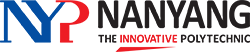

# ITB251 Assignment - Task 2: Topic Modelling

You are required to build a topic model to help understand the text in the review to a particular topic. This analysis aims to be accompaniment to the results of the sentiment classification and helps businesses to identify main topic that customers are concern about.

Complete the following sub-tasks:
1.	**Data Understanding**: Examine the dataset
2.	**Data Preparation**: Prepares the data and all necessary pre-processing tasks
3.	**Modelling**: Identify the suitable topic number for the topic model
4.	**Evaluation**: Evaluates the results and identify the topic

For each sub-task, perform the necessary steps and **explain the rationale taken for each step in the Jupyter notebook**. 

**Done by: Zhang Xiang 210896X**

## Import libraries and download the packages

In [1]:
# !pip install langdetect
# !pip install contractions

import nltk
nltk.download('all')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.stem import PorterStemmer

import re
import string
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import contractions
import seaborn as sns

from langdetect import detect
from spellchecker import SpellChecker
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

from pprint import pprint

import pyLDAvis
import pyLDAvis.gensim_models

import gensim
from gensim import corpora, models
from gensim.models import CoherenceModel, LsiModel, LdaModel, HdpModel

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\Zhang Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\Zhang Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\

[nltk_data]    |   Package mwa_ppdb is already up-to-date!
[nltk_data]    | Downloading package names to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Downloading package nombank.1.0 to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package nombank.1.0 is already up-to-date!
[nltk_data]    | Downloading package nonbreaking_prefixes to
[nltk_data]    |     C:\Users\Zhang Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package nonbreaking_prefixes is already up-to-date!
[nltk_data]    | Downloading package nps_chat to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package nps_chat is already up-to-date!
[nltk_data]    | Downloading package omw to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package omw is already up-to-date!
[nltk_data]    | Downloading pac

[nltk_data]    |   Package udhr2 is already up-to-date!
[nltk_data]    | Downloading package unicode_samples to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package unicode_samples is already up-to-date!
[nltk_data]    | Downloading package universal_tagset to
[nltk_data]    |     C:\Users\Zhang Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package universal_tagset is already up-to-date!
[nltk_data]    | Downloading package universal_treebanks_v20 to
[nltk_data]    |     C:\Users\Zhang Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package universal_treebanks_v20 is already up-to-
[nltk_data]    |       date!
[nltk_data]    | Downloading package vader_lexicon to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    |   Package vader_lexicon is already up-to-date!
[nltk_data]    | Downloading package verbnet to C:\Users\Zhang
[nltk_data]    |     Xiang\AppData\Roaming\nltk_data...
[nltk_data]    

## Read the dataset

In [2]:
df = pd.read_csv('shopping_reviews.csv')

# Show full data view
# pd.set_option('display.max_colwidth', None)

print(df.shape)

# Sample data for testing
# df = df.sample(n=7000, random_state=1)

df.head(2)

(36422, 7)


,Unnamed: 0,review_id,date,name,categories,text,stars
0,15,Af6Jnf8F5xBliuixStWF8g,2019-09-20,"""Soccer Zone""",Shopping;Sporting Goods,I'll admit it. I caught World Cup fever in 20...,4
1,18,j-6-I55-9EiKNGAjoLHx9A,2020-06-30,"""Fye""",Shopping;Books;Mags;Music & Video;Music & DVDs,This store has gone through some management ch...,4


## Data Understanding
Perform the necessary steps and explain the rationale taken here.

### Considerations:

1. Understand the **Data Type & Columns**.
    - Understanding the data types of the columns can assist in identifying any potential errors or issues in the format of the data.
    - Being familiar with the variables and their meanings to help in identifying missing or unnecessary data in the dataset.
    - Identifying and removing irrelevant data. For example, an index column like "Unnamed: 0" that is generated during data export, can help improve the quality of the dataset for analysis.


2. Check for **Missing/Null Values**.
    - It is essential to be aware of the amount of missing data and how to handle it, as it can potentially introduce bias or inaccuracies.


3. Check for **Duplicate Data**
    - Duplicate data is important to identify and remove any wrong information that might skew the results of the analysis. Having duplicate data can cause issues such as:
        - Biased results/Confusion: Frequency of certain values, which can lead to biased results in statistical analysis and machine learning models.
        - Inefficiency: Increase the size of the dataset, which affect the processing time.
        - For example: I will identify duplicate through unique key "review_id" and "text" columns.


4. Check for **Outliers**.        
   - Looking for outliers in the dataset. Outliers can be caused by errors in data collection or measurement, and should be examined and handled appropriately. There are several reasons to check for outliers:
        - Inaccurate predictions: Outliers can cause a negative impact on the accuracy of predictions made by machine learning models.
        - Data Quality: Handling outliers can improve the overall quality of the data and ensure that the analysis is based on valid and accurate observations.        
        - For example: I will be performing check on outlier in the "stars" column. It supposingly should only contain rating between 1-5. If outlier is identified it will be handled through removal of corresponding row.
    

5. **Identify unecessary columns to remove** for NLP sentiment analysis.
    - Topic Modelling only require 1 columns: Text.
    - Efficiency: Reduce code runtime.


6. **Evaluate the balance of the data / Data Distribution**. 
    - Not really necessary for the purpose of Topic Modelling. Unlike sentiment analysis, 

### Overview of Data Type and Columns

1. **Data Type of each Column**
    - ***Unnamed: 0*** : int64 (Integer)
    - ***review_id*** : object (String)
    - ***date*** : object
    - ***name*** : object
    - ***categories*** : object
    - ***text*** : object
    - ***stars*** : int64


2. **Column Information**
    - ***Unnamed: 0** :<br>Notice that this column is index generated during previous data export. Which provide no meaning for modelling, thus I will consider to remove it.
    >   Additional Info: To remove the index during export we can use 
    > ~~~Python
    > df.to_csv(file.csv, index=False)
    > ~~~
    - ***review_id*** : Unique Key <br>
        > Format: frqyMxnhjFV7xYVGZYssjQ <br>
        > This column will be used to search for duplicate.
    - ***date*** : Date that the review is completed. <br>
        >Format: 2020-08-23
    - ***name*** : Product Name
    - ***categories*** : Categories that product belong. <br>
        > Format: Fashion;Watches; => A product can have multiple categories seperated with a ";" delimiter.
    - ***text*** : Review given by customer. (Used)
        > - This column will be used to search for duplicate.
        > - Predictor Column
        
        > Text contain:
        > - "\n" that represent next line.
        > - Numeric number and numeric number with character.
        > - URL (http://...)
        > - Email (info@_.com)
        > - Phone Number (this will be removed at the numeric number removal)
        >> Above uses the library: re
        >> ~~~Python
        >> import re
        >> ## REGEX
        >> pattern = r""
        >> remove_ = re.sub(pattern, ' ', doc)
        >> ~~~
        > - Different cases (Uses build-in .lower() function)
        > - Contractions
        >> Using the library: contractions
        >> ~~~Python
        >> import contractions
        >> contractions.fix(doc)
        >> ~~~
        > - Punctuation
        >> Using the library: string
        >> ~~~Python
        >> import string
        >> string.punctuation
        >> ~~~
        > - Stop Words
        >> Using the library: sklearn
        >> ~~~Python
        >> from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
        >> stopwords = set(ENGLISH_STOP_WORDS)
        >> stopwords.remove('not')
        >> ~~~
        > - Spelling Error
        >> Using the library: spellchecker
        >> ~~~Python
        >> from spellchecker import SpellChecker
        >> spell = SpellChecker()
        >> ## Add word to ignore removal
        >> spell.word_frequency.load_words([])
        >> ## Identify unknown word
        >> misspelled = spell.unknown(cleaned_arr)
        >> ~~~
        > - Short Term \ Simple Term
        > - Multiple Languages
        >> Using the library: langdetect
        >> ~~~Python
        >> from langdetect import detect
        >> df['language'] = df['text'].apply(detect)
        >> ~~~
    - ***stars*** : Rating given by customer.
        > - Should have rating in range of 1-5 only.
        > - 1 (Worst) ---- 5(Best)

In [3]:
# Overview through first 3 rows
df.head(3)

,Unnamed: 0,review_id,date,name,categories,text,stars
0,15,Af6Jnf8F5xBliuixStWF8g,2019-09-20,"""Soccer Zone""",Shopping;Sporting Goods,I'll admit it. I caught World Cup fever in 20...,4
1,18,j-6-I55-9EiKNGAjoLHx9A,2020-06-30,"""Fye""",Shopping;Books;Mags;Music & Video;Music & DVDs,This store has gone through some management ch...,4
2,46,wCwl4NC1CxkRIAg2RcLzig,2020-09-28,"""By Design""",Home & Garden;Furniture Stores;Shopping,By Design sells funky ultra modern furniture. ...,3


In [4]:
# Overview on information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36422 entries, 0 to 36421
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  36422 non-null  int64 
 1   review_id   36422 non-null  object
 2   date        36422 non-null  object
 3   name        36422 non-null  object
 4   categories  36422 non-null  object
 5   text        36422 non-null  object
 6   stars       36422 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 1.9+ MB


In [5]:
df.dtypes

Unnamed: 0     int64
review_id     object
date          object
name          object
categories    object
text          object
stars          int64
dtype: object

#### Detect Non-English Text

In [6]:
# Create a temporary dataframe that contain text only.
# Exploration is done through looking at csv file directly as well.
text_exploration = df[['text']]
text_exploration.head(2)

,text
0,I'll admit it. I caught World Cup fever in 20...
1,This store has gone through some management ch...


In [7]:
## Create a new column that indicates the language
df['language'] = df['text'].apply(detect)

In [8]:
# Filter text that are not written in english.
language_check = df[df['language'] != 'en']

# Show data
language_check.head(2)

,Unnamed: 0,review_id,date,name,categories,text,stars,language
49,550,CCdXhW61_ADjwIDZpA9Oqw,2019-11-16,"""nah und gut Alsadi""",Grocery;Food;Shopping,Wer hätte das Gedacht?\nEin kleiner feiner Ede...,4,de
83,948,K-XqStinTowqKX7XFfqLMw,2020-03-28,"""korbmayer""",Shopping;Fashion,Hier gibt's Tolle Kindermode und viel Auswahl ...,3,de


In [9]:
print(f'No.of row with text not written in english:',len(language_check), 'rows')

No.of row with text not written in english: 1097 rows


#### Find URL

In [10]:
# Find URL in dataset
# pattern = r'(https?\:.+)|(www\..+)'
pattern = r"https?\S+"
compiled = re.compile(pattern)

url_list = []
for idx in df.index:
    urls = compiled.findall(df['text'][idx])
    if urls:
        url_list.extend(urls)
        
print('URL:', len(url_list))
url_list

URL: 364


['http:\\/\\/www.yelp.com\\/biz_photos\\/XPZT3zLrkLkFSkBVxSsM3w?select=n2ILUoe8xdyTbIowPfNP3Q',
 'http:\\/\\/www.saleevent.ca\\/index.php)',
 'http:\\/\\/www.artomat.org\\/home.html',
 'http:\\/\\/www.dovenetq.net.au\\/~mahayes\\/Graphics\\/YesLogoFullCircle1.jpg',
 'http:\\/\\/www.vinylrecords.ch\\/B\\/BO\\/Boston\\/Boston\\/boston-63.jpg',
 'http:\\/\\/henrikfalck.com\\/blog\\/uploaded_images\\/LedZeppelinLedZeppelinalbumcover-716782.jpg',
 'http:\\/\\/www.yelp.ca\\/biz\\/outer-layer-toronto',
 'http:\\/\\/www.2ndsole.com\\/',
 'http:\\/\\/www.qype.com\\/place\\/171849-Las-Vegas-Premium-Outlets-Las-Vegas)',
 'http:\\/\\/www.vegaspersonalshopper.com\\/forever-21-store-review\\/',
 'http:\\/\\/www.yelp.com\\/biz_photos\\/rw8YDgz69vqdeu-oLR4W8Q?select=APVssPpowbz3Lb0ob4SAUA',
 'http:\\/\\/www.yelp.com\\/biz_photos\\/rw8YDgz69vqdeu-oLR4W8Q?select=iwbx1a-HRGvIR4fm8qHJhQ',
 'http:\\/\\/www.yelp.com\\/biz_photos\\/rw8YDgz69vqdeu-oLR4W8Q?select=Img8wGILm74mjpwVK-AeGA',
 'http:\\/\\/wp.me\\/p

#### Find Email

In [11]:
# Find email in dataset
email_pattern = r"\S*@\S*\s?"

# '\S*@\S*\s?'
compiled = re.compile(email_pattern)

email_list = []
for idx in df.index:
    email = compiled.findall(df['text'][idx])
    if email:
        email_list.extend(email)

print('Email:', len(email_list))
email_list

Email: 254


['info@bohofarmandhome.com.',
 '*@&*& ',
 '@ ',
 '@ ',
 '@wal-mart ',
 '@ ',
 '@ ',
 '@ ',
 '(@ ',
 'Red@28th ',
 '@Fashion ',
 '@ ',
 '@ ',
 's&@*we ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 'a@@ ',
 '@2:30pm ',
 '@heatherybean, ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 'alinda1313@yahoo ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '-@snakesandlattes ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '[cricket@service-now.com] ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 'store@pintoranch.com ',
 'lasvegas@pintoranch.com. ',
 '@ ',
 'b*@#h, ',
 '@ ',
 '@ ',
 '@ ',
 'P*@&# ',
 '@ ',
 '@ ',
 '@ ',
 '%#$@&!\n',
 '@ ',
 '@ ',
 'footlongs@ ',
 '@ ',
 '@GameDaze2',
 '@ ',
 'info@santannursery.com ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 'LOL@the ',
 'kick@$$ ',
 '@Fashion ',
 '@MAC ',
 '@ ',
 '#$@#%".\n',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@walmart ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '@ ',
 '$

### Check Missing/Null Value

Missing/Null value is not found in all columns

~~~Python
Unnamed: 0    False
review_id     False
date          False
name          False
categories    False
text          False
stars         False
dtype: bool
~~~

In [12]:
# There are no missing value.
print(df.isna().any())

Unnamed: 0    False
review_id     False
date          False
name          False
categories    False
text          False
stars         False
language      False
dtype: bool


In [13]:
print(df.isna().sum())

Unnamed: 0    0
review_id     0
date          0
name          0
categories    0
text          0
stars         0
language      0
dtype: int64


### Check Duplicate Data

- Exact same row: No Duplicate
- review_id: No Duplicate
- text: 10 duplicate text

From the result below, I would believe that review_id a unique key is generated when customer start a survey, as no duplicate found in review_id it is all unique. 

However, there are multiple duplicate found in text column. This could impact the model as it may introduce bias, and prevent the model from learning effectively.

In [14]:
# It shows that there is no duplicate row. Which mean each row is unique.
print(f"Are there duplicated rows? (Exact Same): {df.duplicated().any()}")

# It shows that there is no duplicate in review_id.
print(f"Are there duplicated review_id?: {df.duplicated(subset = ['review_id']).any()}")

# It shows that there is duplicated text.
print(f"Are there duplicated text?: {df.duplicated(subset = ['text']).any()}")

Are there duplicated rows? (Exact Same): False
Are there duplicated review_id?: False
Are there duplicated text?: True


In [15]:
print(f"Count of duplicated rows (Exact Same): {df.duplicated().sum()}")

print(f"Count of duplicated review_id: {df.duplicated(subset = ['review_id']).sum()}")

print(f"Count of duplicated text: {df.duplicated(subset = ['text']).sum()}")

Count of duplicated rows (Exact Same): 0
Count of duplicated review_id: 0
Count of duplicated text: 10


In [16]:
# List all duplicate
df['text'][df.duplicated(subset = ['text'], keep = False)]

1496     I love Sephora.  The associates are always fri...
4267     Union Hills Ace Hardware is really great.. the...
4415     I have to be honest and say I don't really see...
4454     I have to be honest and say I don't really see...
8622     I needed a new home computer & decided to call...
13449    Top Qualität. Top Beratung. Man weiß woran man...
13450    Man fühlt sich im Laden sofort wohl. Begeister...
16718    Too good to be true...because its not true! I ...
17592    Score! When I went over Christmas they were ha...
20561    Union Hills Ace Hardware is really great.. the...
21345    Score! When I went over Christmas they were ha...
21510    I love Sephora.  The associates are always fri...
23959    Too good to be true...because its not true! I ...
27624    I needed a new home computer & decided to call...
31024    really good prices, but sometimes the fruits &...
33060    really good prices, but sometimes the fruits &...
34564    Too good to be true...because its not true! I .

### Check Outlier

No outlier found in 'stars' column. It range kept within the range of 1-5.

If outlier is found I will consider to remove row that consist of that outlier, as it could be a human error that people manually entering data in to the file.

In [17]:
# The range of rating is kept within 1 to 5 only.
check_stars = sorted(df['stars'].unique())

print(check_stars)

[1, 2, 3, 4, 5]


### Identify unecessary columns for Topic Modelling

- In topic analysis for NLP, it only require "text". 

- Unlike sentiment analysis, it still have to balance the data using "sentiment" to train the model.

- All the other columns will be removed during Data Preparation

In [18]:
df.head(1)

,Unnamed: 0,review_id,date,name,categories,text,stars,language
0,15,Af6Jnf8F5xBliuixStWF8g,2019-09-20,"""Soccer Zone""",Shopping;Sporting Goods,I'll admit it. I caught World Cup fever in 20...,4,en


## Data Preparation
Perform the necessary steps and explain the rationale taken here.

### Steps:

1. **Remove Non-English Text**
    - With the use of new column 'language', I have decide to remove entire row of record if it is not written in english. 
    - Example: 'French' => 'fr, 'English' => 'en'. 
    - Another option to consider is translating the non-English text into English. This would require significant processing time and effort to review the thousands of rows across the 1000+ columns. Also, we would not know if it translate correctly.
    - Additionally, the Non-English data only represents a small percentage (2.7%) of the entire dataset, and removing it likely would not have a significant impact on the final outcome.

2. **Remove Duplicate Text**
    - Keep the last row of duplicate, if duplicate exist in text column and drop the others.


3. **Remove Unwanted Columns**
    - Drop 'Unnamed: 0','review_id','date','name','categories', 'stars', 'language'.
    - Only 'text'  will be used.

    
4. **Text Pre-Processing**
    
    The steps listed must be done in a sequence.
    > 1. **Remove "\n" from text.**
        - From: I'll leave.\nI am here again and spent 20dollar.
        - To: I'll leave. I'm here again and spent 20dollar.
        - Non-Word
        
    > 2. **Lowercase**
        - Converting all text to lowercase can help standardize the data and prevent the model from treating words with different capitalization as separate words.
        - From: I'll leave. I'm here again and spent.
        - To: i'll leave. i'm here again and spent.
        
    > 3. **Remove URLs, Email**
        - From : Visit http:\/\/www.saleevent.ca\/index.php, email:  info@bohofarmandhome.com. and call us with  ph. 480 893 0465.
        - To: Visit, email:. and call us with ph..
        -Non-Word
        
    > 4. **Remove number & number with word.**
        - From: I'll leave. I'm here again and spent 20dollar.
        - To: I'll leave. I'm here again and spent.
        - Non-Word
        
    > 5. **Expand Contraction.**
        - The use of contractions can make the text less clear, as they can have multiple meanings and can cause confusion or misinterpretation in understanding the text.
        - "I'm" = "I am", if without expanding there will be 3 terms "I'm", "I" and "am" but it mean the same. Which will affect the model.
        - From: i'll leave. i'm here again and spent.
        - To: i will leave. i am here again and spent.
        
    > 6. **Remove Punctuation**
        - From: i will leave. i am here again and spent.
        - To: i will leave i am here again and spent
        
    > 7. **Remove Stop Words**
        - From: i will leave i am here again and spent
        - To: [ leave, here, again, spent ]
        - Spelling errors can negatively impact a model's ability to identify sentiment, as they can cause confusion for the model, leading to incorrect predictions. In datasets with many spelling errors, it may be difficult for the model to correctly identify sentiment.
        - Removal of spelling error will be conducted if the spelling error affect much on the performance of the model through testing.
    
    **Not Conducting**
    
    As it result in deprovement in identifying it topic. Coherence Score dropped.
    ___
    
    > 11. **Search for Spelling Error**
        - This function will be looking for english spelling error and update a set with all spelling error for that specific row
        - Example: {dawio}
        
    > 12. **Remove Spelling Error**
        - From: [again, spent, dawio]
        - To: again spent
    ___
    
    **Choose 1 from the 2 methods below, based on testing which perform better**:
    > 10. **Stemming**
        - Reducing a word to its base form by cutting off the suffixes or prefixes
        - From: The runner was running down the street.
        - To: The run was run down the street.
    > 11. **Lemmatize** (Selected)
        - Takes into account the context of the word and reduces it to its base form using a dictionary
        - From: I ate an apple.
        - To: I eat an apple.

### Remove Non-English Text

In [19]:
print(df.shape)
df.head(2)

(36422, 8)


,Unnamed: 0,review_id,date,name,categories,text,stars,language
0,15,Af6Jnf8F5xBliuixStWF8g,2019-09-20,"""Soccer Zone""",Shopping;Sporting Goods,I'll admit it. I caught World Cup fever in 20...,4,en
1,18,j-6-I55-9EiKNGAjoLHx9A,2020-06-30,"""Fye""",Shopping;Books;Mags;Music & Video;Music & DVDs,This store has gone through some management ch...,4,en


In [20]:
df = df[df["language"] == "en"]
df.head(2)

,Unnamed: 0,review_id,date,name,categories,text,stars,language
0,15,Af6Jnf8F5xBliuixStWF8g,2019-09-20,"""Soccer Zone""",Shopping;Sporting Goods,I'll admit it. I caught World Cup fever in 20...,4,en
1,18,j-6-I55-9EiKNGAjoLHx9A,2020-06-30,"""Fye""",Shopping;Books;Mags;Music & Video;Music & DVDs,This store has gone through some management ch...,4,en


In [21]:
df.shape

(35325, 8)

### Remove Duplicate Text

In [22]:
df['text'][df.duplicated(subset = ['text'], keep = False)]

1496     I love Sephora.  The associates are always fri...
4267     Union Hills Ace Hardware is really great.. the...
4415     I have to be honest and say I don't really see...
4454     I have to be honest and say I don't really see...
8622     I needed a new home computer & decided to call...
16718    Too good to be true...because its not true! I ...
17592    Score! When I went over Christmas they were ha...
20561    Union Hills Ace Hardware is really great.. the...
21345    Score! When I went over Christmas they were ha...
21510    I love Sephora.  The associates are always fri...
23959    Too good to be true...because its not true! I ...
27624    I needed a new home computer & decided to call...
31024    really good prices, but sometimes the fruits &...
33060    really good prices, but sometimes the fruits &...
34564    Too good to be true...because its not true! I ...
Name: text, dtype: object

In [23]:
df = df.drop_duplicates(subset = ['text'], keep='last')
df.reset_index(drop=True, inplace=True)
df.head(2)

,Unnamed: 0,review_id,date,name,categories,text,stars,language
0,15,Af6Jnf8F5xBliuixStWF8g,2019-09-20,"""Soccer Zone""",Shopping;Sporting Goods,I'll admit it. I caught World Cup fever in 20...,4,en
1,18,j-6-I55-9EiKNGAjoLHx9A,2020-06-30,"""Fye""",Shopping;Books;Mags;Music & Video;Music & DVDs,This store has gone through some management ch...,4,en


In [24]:
df['text'][df.duplicated(subset = ['text'], keep = False)]

Series([], Name: text, dtype: object)

In [25]:
df.shape

(35317, 8)

In [26]:
print(f"Count of duplicated text: {df.duplicated(subset = ['text']).sum()}")

Count of duplicated text: 0


### Remove Unwanted columns

In [27]:
# Remove unecessary used for analysis
df.drop(columns=['Unnamed: 0','review_id','date','name','categories', "stars", 'language'], axis=1, inplace=True)

### Text Pre-Processing

In [28]:
# Reset index: During testing with smaller sample the index is randomized.
df.reset_index(drop=True, inplace=True)
df.head(2)

,text
0,I'll admit it. I caught World Cup fever in 20...
1,This store has gone through some management ch...


#### Remove "\n"

In [29]:
# Remove "\n" tag
def remove_BSn(doc):
    # REGEX for "\n" tag
    break_line_tk = nltk.RegexpTokenizer('\\n', gaps=True)
    
    return ' '.join([word for word in break_line_tk.tokenize(doc)])

df['remove_backSlashN'] = df['text'].apply(lambda doc:remove_BSn(doc))

#### Lowercase

In [30]:
df['lowercase'] = df['remove_backSlashN'].apply(lambda doc: doc.lower())

#### Remove URL

In [31]:
def remove_url(doc):
    pattern_url = r"https?\S+"
    
    remove_url = re.sub(pattern_url, ' ', doc)
    
    return remove_url.strip()

df['remove_url'] = df['lowercase'].apply(lambda doc: remove_url(doc))

#### Remove Email

In [32]:
def remove_email(doc):
    pattern_email = r"\S*@\S*\s?"
    remove_email = re.sub(pattern_email, ' ', doc)
    
    return remove_email.strip()

df['remove_email'] = df['remove_url'].apply(lambda doc: remove_email(doc))

#### Remove Number / Number + Text

In [33]:
def remove_number_with_word(doc):
    pattern_alphanumic = r"\w*\d\w*"
    
    # Substitude the pattern with a space ' ' 
    # and strip it to prevent word from joining
    remove_alphanumeric = re.sub(pattern_alphanumic, ' ', doc)
    
    return remove_alphanumeric.strip()

df['remove_text_number'] = df['remove_email'].apply(lambda doc: remove_number_with_word(doc))

#### Expand Contraction Word

In [34]:
def expand_contraction(doc):
    
    return contractions.fix(doc)

# Contraction expansion must be conducted before all punctuation is removed.
df['expand_contraction'] = df['remove_text_number'].apply(lambda doc: expand_contraction(doc))

In [35]:
all_words = [word for sent in df.expand_contraction for word in nltk.word_tokenize(sent)]

all_words_frequency = nltk.FreqDist(all_words)
print (all_words_frequency)

# print 20 most frequently occurring words
print (all_words_frequency.most_common(20))

<FreqDist with 67652 samples and 5357721 outcomes>
[('.', 248381), ('the', 204263), (',', 187785), ('i', 160258), ('and', 145532), ('a', 128200), ('to', 126615), ('is', 84576), ('of', 84224), ('it', 66035), ('in', 64394), ('for', 60022), ('not', 57666), ('you', 54795), ('that', 50294), ('was', 48162), ('they', 46986), ('have', 46820), ('!', 44582), ('my', 41730)]


#### Remove Punctuation

In [36]:
def remove_punctuation(doc):
    punctuationfree = "".join([i if i not in string.punctuation else ' ' for i in doc])

    # Return a stripped string without extra empty space
    return punctuationfree.strip()

# Puntuation removal must be conducted after contractions has expanded,
# to avoid making it a spelling error.
df['remove_punctuation'] = df['expand_contraction'].apply(lambda doc:remove_punctuation(doc))

#### Remove Stopword

In [37]:
custom_stopwords = set(['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z', 
                       "0o", "0s", "3a", "3b", "3d", "6b", "6o", "a", "a1", "a2", "a3", "a4", "ab", "able", "about", "above", "abst", "ac", "accordance", "according", "accordingly", "across", "act", "actually", "ad", "added", "adj", "ae", "af", "affected", "affecting", "affects", "after", "afterwards", "ag", "again", "against", "ah", "ain", "ain't", "aj", "al", "all", "allow", "allows", "almost", "alone", "along", "already", "also", "although", "always", "am", "among", "amongst", "amoungst", "amount", "an", "and", "announce", "another", "any", "anybody", "anyhow", "anymore", "anyone", "anything", "anyway", "anyways", "anywhere", "ao", "ap", "apart", "apparently", "appear", "appreciate", "appropriate", "approximately", "ar", "are", "aren", "arent", "aren't", "arise", "around", "as", "a's", "aside", "ask", "asking", "associated", "at", "au", "auth", "av", "available", "aw", "away", "awfully", "ax", "ay", "az", "b", "b1", "b2", "b3", "ba", "back", "bc", "bd", "be", "became", "because", "become", "becomes", "becoming", "been", "before", "beforehand", "begin", "beginning", "beginnings", "begins", "behind", "being", "believe", "below", "beside", "besides", "best", "better", "between", "beyond", "bi", "bill", "biol", "bj", "bk", "bl", "bn", "both", "bottom", "bp", "br", "brief", "briefly", "bs", "bt", "bu", "but", "bx", "by", "c", "c1", "c2", "c3", "ca", "call", "came", "can", "cannot", "cant", "can't", "cause", "causes", "cc", "cd", "ce", "certain", "certainly", "cf", "cg", "ch", "changes", "ci", "cit", "cj", "cl", "clearly", "cm", "c'mon", "cn", "co", "com", "come", "comes", "con", "concerning", "consequently", "consider", "considering", "contain", "containing", "contains", "corresponding", "could", "couldn", "couldnt", "couldn't", "course", "cp", "cq", "cr", "cry", "cs", "c's", "ct", "cu", "currently", "cv", "cx", "cy", "cz", "d", "d2", "da", "date", "dc", "dd", "de", "definitely", "describe", "described", "despite", "detail", "df", "di", "did", "didn", "didn't", "different", "dj", "dk", "dl", "do", "does", "doesn", "doesn't", "doing", "don", "done", "don't", "down", "downwards", "dp", "dr", "ds", "dt", "du", "due", "during", "dx", "dy", "e", "e2", "e3", "ea", "each", "ec", "ed", "edu", "ee", "ef", "effect", "eg", "ei", "eight", "eighty", "either", "ej", "el", "eleven", "else", "elsewhere", "em", "empty", "en", "end", "ending", "enough", "entirely", "eo", "ep", "eq", "er", "es", "especially", "est", "et", "et-al", "etc", "eu", "ev", "even", "ever", "every", "everybody", "everyone", "everything", "everywhere", "ex", "exactly", "example", "except", "ey", "f", "f2", "fa", "far", "fc", "few", "ff", "fi", "fifteen", "fifth", "fify", "fill", "find", "fire", "first", "five", "fix", "fj", "fl", "fn", "fo", "followed", "following", "follows", "for", "former", "formerly", "forth", "forty", "found", "four", "fr", "from", "front", "fs", "ft", "fu", "full", "further", "furthermore", "fy", "g", "ga", "gave", "ge", "get", "gets", "getting", "gi", "give", "given", "gives", "giving", "gj", "gl", "go", "goes", "going", "gone", "got", "gotten", "gr", "greetings", "gs", "gy", "h", "h2", "h3", "had", "hadn", "hadn't", "happens", "hardly", "has", "hasn", "hasnt", "hasn't", "have", "haven", "haven't", "having", "he", "hed", "he'd", "he'll", "hello", "help", "hence", "her", "here", "hereafter", "hereby", "herein", "heres", "here's", "hereupon", "hers", "herself", "hes", "he's", "hh", "hi", "hid", "him", "himself", "his", "hither", "hj", "ho", "home", "hopefully", "how", "howbeit", "however", "how's", "hr", "hs", "http", "hu", "hundred", "hy", "i", "i2", "i3", "i4", "i6", "i7", "i8", "ia", "ib", "ibid", "ic", "id", "i'd", "ie", "if", "ig", "ignored", "ih", "ii", "ij", "il", "i'll", "im", "i'm", "immediate", "immediately", "importance", "important", "in", "inasmuch", "inc", "indeed", "index", "indicate", "indicated", "indicates", "information", "inner", "insofar", "instead", "interest", "into", "invention", "inward", "io", "ip", "iq", "ir", "is", "isn", "isn't", "it", "itd", "it'd", "it'll", "its", "it's", "itself", "iv", "i've", "ix", "iy", "iz", "j", "jj", "jr", "js", "jt", "ju", "just", "k", "ke", "keep", "keeps", "kept", "kg", "kj", "km", "know", "known", "knows", "ko", "l", "l2", "la", "largely", "last", "lately", "later", "latter", "latterly", "lb", "lc", "le", "least", "les", "less", "lest", "let", "lets", "let's", "lf", "like", "liked", "likely", "line", "little", "lj", "ll", "ll", "ln", "lo", "look", "looking", "looks", "los", "lr", "ls", "lt", "ltd", "m", "m2", "ma", "made", "mainly", "make", "makes", "many", "may", "maybe", "me", "mean", "means", "meantime", "meanwhile", "merely", "mg", "might", "mightn", "mightn't", "mill", "million", "mine", "miss", "ml", "mn", "mo", "more", "moreover", "most", "mostly", "move", "mr", "mrs", "ms", "mt", "mu", "much", "mug", "must", "mustn", "mustn't", "my", "myself", "n", "n2", "na", "name", "namely", "nay", "nc", "nd", "ne", "near", "nearly", "necessarily", "necessary", "need", "needn", "needn't", "needs", "neither", "never", "nevertheless", "new", "next", "ng", "ni", "nine", "ninety", "nj", "nl", "nn", "no", "nobody", "non", "none", "nonetheless", "noone", "nor", "normally", "nos", "not", "noted", "nothing", "novel", "now", "nowhere", "nr", "ns", "nt", "ny", "o", "oa", "ob", "obtain", "obtained", "obviously", "oc", "od", "of", "off", "often", "og", "oh", "oi", "oj", "ok", "okay", "ol", "old", "om", "omitted", "on", "once", "one", "ones", "only", "onto", "oo", "op", "oq", "or", "ord", "os", "ot", "other", "others", "otherwise", "ou", "ought", "our", "ours", "ourselves", "out", "outside", "over", "overall", "ow", "owing", "own", "ox", "oz", "p", "p1", "p2", "p3", "page", "pagecount", "pages", "par", "part", "particular", "particularly", "pas", "past", "pc", "pd", "pe", "per", "perhaps", "pf", "ph", "pi", "pj", "pk", "pl", "placed", "please", "plus", "pm", "pn", "po", "poorly", "possible", "possibly", "potentially", "pp", "pq", "pr", "predominantly", "present", "presumably", "previously", "primarily", "probably", "promptly", "proud", "provides", "ps", "pt", "pu", "put", "py", "q", "qj", "qu", "que", "quickly", "quite", "qv", "r", "r2", "ra", "ran", "rather", "rc", "rd", "re", "readily", "really", "reasonably", "recent", "recently", "ref", "refs", "regarding", "regardless", "regards", "related", "relatively", "research", "research-articl", "respectively", "resulted", "resulting", "results", "rf", "rh", "ri", "right", "rj", "rl", "rm", "rn", "ro", "rq", "rr", "rs", "rt", "ru", "run", "rv", "ry", "s", "s2", "sa", "said", "same", "saw", "say", "saying", "says", "sc", "sd", "se", "sec", "second", "secondly", "section", "see", "seeing", "seem", "seemed", "seeming", "seems", "seen", "self", "selves", "sensible", "sent", "serious", "seriously", "seven", "several", "sf", "shall", "shan", "shan't", "she", "shed", "she'd", "she'll", "shes", "she's", "should", "shouldn", "shouldn't", "should've", "show", "showed", "shown", "showns", "shows", "si", "side", "significant", "significantly", "similar", "similarly", "since", "sincere", "six", "sixty", "sj", "sl", "slightly", "sm", "sn", "so", "some", "somebody", "somehow", "someone", "somethan", "something", "sometime", "sometimes", "somewhat", "somewhere", "soon", "sorry", "sp", "specifically", "specified", "specify", "specifying", "sq", "sr", "ss", "st", "still", "stop", "strongly", "sub", "substantially", "successfully", "such", "sufficiently", "suggest", "sup", "sure", "sy", "system", "sz", "t", "t1", "t2", "t3", "take", "taken", "taking", "tb", "tc", "td", "te", "tell", "ten", "tends", "tf", "th", "than", "thank", "thanks", "thanx", "that", "that'll", "thats", "that's", "that've", "the", "their", "theirs", "them", "themselves", "then", "thence", "there", "thereafter", "thereby", "thered", "therefore", "therein", "there'll", "thereof", "therere", "theres", "there's", "thereto", "thereupon", "there've", "these", "they", "theyd", "they'd", "they'll", "theyre", "they're", "they've", "thickv", "thin", "think", "third", "this", "thorough", "thoroughly", "those", "thou", "though", "thoughh", "thousand", "three", "throug", "through", "throughout", "thru", "thus", "ti", "til", "tip", "tj", "tl", "tm", "tn", "to", "together", "too", "took", "top", "toward", "towards", "tp", "tq", "tr", "tried", "tries", "truly", "try", "trying", "ts", "t's", "tt", "tv", "twelve", "twenty", "twice", "two", "tx", "u", "u201d", "ue", "ui", "uj", "uk", "um", "un", "under", "unfortunately", "unless", "unlike", "unlikely", "until", "unto", "uo", "up", "upon", "ups", "ur", "us", "use", "used", "useful", "usefully", "usefulness", "uses", "using", "usually", "ut", "v", "va", "value", "various", "vd", "ve", "ve", "very", "via", "viz", "vj", "vo", "vol", "vols", "volumtype", "vq", "vs", "vt", "vu", "w", "wa", "want", "wants", "was", "wasn", "wasnt", "wasn't", "way", "we", "wed", "we'd", "welcome", "well", "we'll", "well-b", "went", "were", "we're", "weren", "werent", "weren't", "we've", "what", "whatever", "what'll", "whats", "what's", "when", "whence", "whenever", "when's", "where", "whereafter", "whereas", "whereby", "wherein", "wheres", "where's", "whereupon", "wherever", "whether", "which", "while", "whim", "whither", "who", "whod", "whoever", "whole", "who'll", "whom", "whomever", "whos", "who's", "whose", "why", "why's", "wi", "widely", "will", "willing", "wish", "with", "within", "without", "wo", "won", "wonder", "wont", "won't", "words", "world", "would", "wouldn", "wouldnt", "wouldn't", "www", "x", "x1", "x2", "x3", "xf", "xi", "xj", "xk", "xl", "xn", "xo", "xs", "xt", "xv", "xx", "y", "y2", "yes", "yet", "yj", "yl", "you", "youd", "you'd", "you'll", "your", "youre", "you're", "yours", "yourself", "yourselves", "you've", "yr", "ys", "yt", "z", "zero", "zi", "zz"])


In [38]:
# from nltk.corpus import stopwords: Not that complete, too little.
from nltk.tokenize import RegexpTokenizer

def remove_stopwords(doc):
    # Create a set of stopwords to remove from review
    stopwords = set(ENGLISH_STOP_WORDS)
    stopwords.update(custom_stopwords)
    stopwords.remove('not')
  
    # Tokenize it into individual word.
    tokens = nltk.word_tokenize(doc)
    # Perform check for stopwords
    clean_list = [token for token in tokens if not (token in stopwords)]
    
    return clean_list

df['remove_stopwords'] = df['remove_punctuation'].apply(lambda doc:remove_stopwords(doc))

### Note!

#### Justifications:
- From section: **Bag of words for IT**, to section: **Remove Spelling Error** will **not be used for the stemming/lemmatization**. (Only for undertstanding / visualising on what are some error in text.)


- Throughout multiple testing with models, it was found that **without removal of spelling error, the model performance has improved**.


- Word Normalization will only use data after removal of stopwords.
____

#### Search for Spelling Error

In [39]:
# The default is English (language='en')
spell = SpellChecker()

# Add word that do not want to be classified as spelling error.
spell.word_frequency.load_words([])

# Search spelling error by refering to the library dictionary
def spelling_checker(cleaned_arr):
    
    # Find unknown word from a list of words and create a Set()
    misspelled = spell.unknown(cleaned_arr)
    
    return misspelled

# Create a set of wrong spelling word that are not in dictionary of SpellChecker.
df['wrong_spelling'] = df['remove_stopwords'].apply(lambda arr:spelling_checker(arr))

#### Gather all Spelling Error

In [40]:
# Adding all words with spelling error
wrong_spelling = set()
for i in df.index:
    wrong_spelling.update(df['wrong_spelling'][i])
    
print(sorted(wrong_spelling))
print()
print(f'There are {len(wrong_spelling)} unique misspelled words found.')

['aa', 'aaa', 'aaaaaaaaaand', 'aaaaaaah', 'aaaaah', 'aaaaand', 'aaaaandd', 'aaaaanyway', 'aaaahhh', 'aaaahhhhh', 'aaaall', 'aaaalllll', 'aaaalways', 'aaaand', 'aaaarrrrrrrrrggggggggghhh', 'aaah', 'aaahh', 'aaahhhh', 'aaahhhhh', 'aaall', 'aaamazing', 'aaand', 'aaauuuuhhhh', 'aab', 'aabc', 'aafes', 'aah', 'aahed', 'aahhh', 'aahhhs', 'aahhing', 'aahing', 'aahs', 'aak', 'aam', 'aarnio', 'aaron', 'aarp', 'abaility', 'abberation', 'abbeyhill', 'abble', 'abbooouttt', 'abboud', 'abcs', 'abdc', 'abebooks', 'abec', 'abelman', 'abeo', 'aberchrombie', 'abercrombie', 'abercromie', 'aberdonians', 'abeta', 'abex', 'abexp', 'abfab', 'abhorrently', 'abilly', 'abita', 'ables', 'aboce', 'abolutely', 'aboslutely', 'abosolutely', 'abouit', 'abouth', 'abouts', 'aboveground', 'abram', 'abrasively', 'abrecrombie', 'abrubt', 'absimal', 'absoloutely', 'absoloutly', 'absolultey', 'absolut', 'absolutley', 'absolutly', 'absprache', 'abstaract', 'abudance', 'abundence', 'abuot', 'abv', 'abviously', 'acadademic', 'a

#### Remove Spelling Error

In [41]:
df['deep_spelling_cleansing'] = df['remove_stopwords'].apply(lambda x: [word for word in x if word not in wrong_spelling])

___

#### Stemming

In [42]:
def stemming(cleaned_arr):
    
    porter_stemmer = PorterStemmer()
    stem_arr = " ".join([porter_stemmer.stem(word) for word in cleaned_arr])
    
    return stem_arr

df['stemmed'] = df['remove_stopwords'].apply(lambda arr: stemming(arr))

#### Lemmatization with POS Tagging (Choosen)

It perform better and in order to identify topic it have to be a valid word, unlike stemming it chop off part of the word and losing it meaning.

In [43]:
def lemmatizing(cleaned_arr):
    lemmatizer = WordNetLemmatizer()

    def pos_tagger(nltk_tag):
        if nltk_tag.startswith('J'):
            return wordnet.ADJ
        elif nltk_tag.startswith('V'):
            return wordnet.VERB
        elif nltk_tag.startswith('N'):
            return wordnet.NOUN
        elif nltk_tag.startswith('R'):
            return wordnet.ADV
        else:         
            return None
        
    pos_tagged = nltk.pos_tag(cleaned_arr)
    
    # wordnet_tagged return something like [('wanted', 'v'), ('love', 'n'), ('even', 'r')]
    wordnet_tagged = list(map(lambda x: (x[0], pos_tagger(x[1])), pos_tagged))
    
    lemmatized_sentence = []
    for word, tag in wordnet_tagged:
        if tag is None:
            # if there is no available tag, append the token as it is
            lemmatized_sentence.append(word)
        else:       
            # else use the tag to lemmatize the token to lemmatize the matched tagging with the word
            lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
    lemmatized_sentence = " ".join(lemmatized_sentence)

    return lemmatized_sentence

# Some words like "mixed" adjective seems like unable to be lemmatized with nltk.
df['lemmatized'] = df['remove_stopwords'].apply(lambda arr: lemmatizing(arr))

#### Compare Length of words Before / After

In [44]:
df['len_before_cleaning'] = df['text'].apply(lambda doc: len(nltk.word_tokenize(doc)))

df['len_after_cleaning'] = df['lemmatized'].apply(lambda doc: len(nltk.word_tokenize(doc)))

In [45]:
print("Total Length Before Cleaning: ", df['len_before_cleaning'].sum())
print("Total length After Cleaning ", df['len_after_cleaning'].sum())

Total Length Before Cleaning:  5389522
Total length After Cleaning  1714085


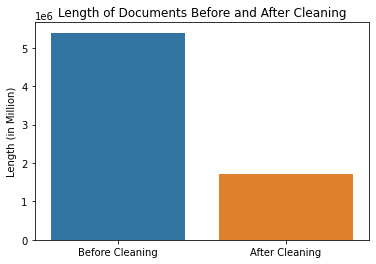

In [46]:
sns.barplot(x=['Before Cleaning','After Cleaning'], y=[df['len_before_cleaning'].sum(), df['len_after_cleaning'].sum()])
plt.ylabel('Length (in Million)')
plt.title('Length of Documents Before and After Cleaning')
plt.show()

In [47]:
df.head(2)

,text,remove_backSlashN,lowercase,remove_url,remove_email,remove_text_number,expand_contraction,remove_punctuation,remove_stopwords,wrong_spelling,deep_spelling_cleansing,stemmed,lemmatized,len_before_cleaning,len_after_cleaning
0,I'll admit it. I caught World Cup fever in 20...,I'll admit it. I caught World Cup fever in 20...,i'll admit it. i caught world cup fever in 20...,i'll admit it. i caught world cup fever in 20...,i'll admit it. i caught world cup fever in 20...,i'll admit it. i caught world cup fever in ...,i will admit it. i caught world cup fever in ...,i will admit it i caught world cup fever in ...,"[admit, caught, cup, fever, decided, field, ye...",{},"[admit, caught, cup, fever, decided, field, ye...",admit caught cup fever decid field year not pl...,admit catch cup fever decide field year not pl...,134,51
1,This store has gone through some management ch...,This store has gone through some management ch...,this store has gone through some management ch...,this store has gone through some management ch...,this store has gone through some management ch...,this store has gone through some management ch...,this store has gone through some management ch...,this store has gone through some management ch...,"[store, management, suffered, longer, store, p...",{},"[store, management, suffered, longer, store, p...",store manag suffer longer store pack music mov...,store management suffer long store pack music ...,78,24


### Word Cloud + Line Graph

Visualise word frequency and common word.

[('not', 57770), ('store', 29240), ('place', 18201), ('shop', 15100), ('time', 14814), ('great', 14554), ('good', 12750), ('price', 12716), ('buy', 10291), ('love', 9726)]


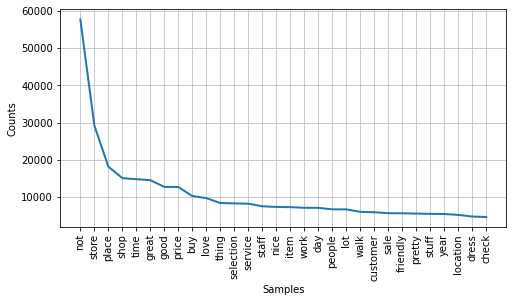

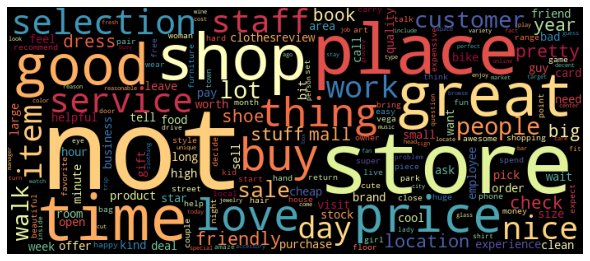

In [48]:
from wordcloud import WordCloud

all_clean_words = [word for sent in df.lemmatized for word in nltk.word_tokenize(sent)]

all_words_frequency = nltk.FreqDist(all_clean_words)

# print 10 most frequently occurring words
print(all_words_frequency.most_common(10))

plt.figure(figsize = (8, 4), facecolor = None) 

all_words_frequency.plot(30, cumulative=False)


plt.figure(figsize = (8, 8), facecolor = None) 
wcloud = WordCloud(width=700, height=300, colormap='Spectral').generate_from_frequencies(all_words_frequency)

# plot the wordcloud
plt.imshow(wcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

## Modelling
Perform the necessary steps and explain the rationale taken here.

### Considerations:

1. **Transform Document: Split/Tokenize**
    - Done to get the corpus of words that make up the document, so that they can be processed by the LDA/LSI/HDP models.


2. **LDA Topic Optimization Function**
    - To create multiple LDA Models for testing.
    - It generate LDA Model, Perplexity Score & Coherence Score.
    - I would try keep the topics to not go over 20.
        > - Avoid the chance of overfitting
        > - Easier to identifying the most relevant topics


3. **Why Looking at Perplexity / Coherence?**
    - These are two metrics used to evaluate the quality of a topic model.
    - **Perplexity**: Measure how well it can predict the words in the test set. With lower perplexity score, it indicates that the model is better at predicting the test set, therefore it can be considered as a better model.
    - **Coherence**: Measure semantic similarity between the words with the topic, how related are the word to the topic itself. A higher coherence score indicates that the words in a topic are more related to each other, therefore it can be used to consider if model perform well or not.

___
### !Note that the optimal cohereance is not the only criteria for selecting the best topics. I will also test it out with visuals created in LDA and test it with other topics count.
___


4. **Create BOW/TFIDF Corpus**


5. **Topic Modelling Models:**
    - LDA BOW
    - LDA TFIDF
    - LSI BOW
    - LSI TFIDF
    - HDP BOW



4. **Bag of Word (BOW)**
    - Latent Dirichlet Allocation (LDA)
        - ***Basic Model *(Quick Overview)****
                1. Create Basic BOW LDA Model
                2. Print topics
                3. Find Perplexity & Coherence Scores
                4. Retrieving Topic Details
        - ***Run Optimization***
                1. Test Run Multiple BOW LDA Model
                2. Line Graph: Perplexity & Coherence Score over Number of Topic
        - ***Best Coherance Search***
                1. Identify best model (Coherence)
                2. Create Best BOW LDA Model
                3. Print topics
                4. Retrieving Topic Details
                5. Visualize Topics and Keywords
             
    > **Visualize Topics and Keywords**    
    > - The visualization shows the topics learned by the LDA model and the distribution of words within each topic. 
    > - The size of each circle representing the generality of the topic in the corpus.
    > - The distance between circles indicating the similarity between topics.
    > - With that said, when model is more widely spread accross the plot, it means that there are lesser similarity between topics. Which can help in better clustering topic into the correct group.
5. **TF-IDF**
    
    - Latent Dirichlet Allocation (LDA)
        - ***Basic Model *(Quick Overview)****
                1. Create Basic TFIDF LDA Model
                2. Print topics
                3. Find Perplexity & Coherence Scores
                4. Retrieving Topic Details
        - ***Run Optimization***
                1. Test Run Multiple TFIDF LDA Model
                2. Line Graph: Perplexity & Coherence Score over Number of Topic
        - ***Best Coherance Search***
                1. Identify best model (Coherence)
                2. Create Best TFIDF LDA Model
                3. Print topics
                4. Retrieving Topic Details
                5. Visualize Topics and Keywords


7. **Latent Semantic Indexing (LSI)**
    - LSI Topic Optimization Function
    - Perform BOW
            1. Create Basic BOW LSI Model
            2. Print topics
            3. Find Coherence Scores
    - Perform TFIDF
            1. Create TFIDF LSI Model
            2. Print topics
            3. Find Coherence Scores
    
        
8. **Hierarchical Dirichlet Process (HDP)**
    - Perform BOW
            1. Create BOW HDP Model
            2. Print topics
            3. Find Coherence Scores
    - Perform TFIDF
            1. Create TFIDF HDP Model
            2. Print topics
            3. Find Coherence Scores

### Transform Document: Split/Tokenize

In [113]:
# Lemmatized perform better than stemming
doc_clean = df['lemmatized'].apply(lambda doc: doc.split())
doc_clean

0        [admit, catch, cup, fever, decide, field, year...
1        [store, management, suffer, long, store, pack,...
2        [design, sell, funky, ultra, modern, furniture...
3        [not, greenthumb, thankfully, husband, awesome...
4        [sport, authority, awful, experience, indian, ...
                               ...                        
35312    [place, slow, scanner, standard, shopper, drug...
35313    [judge, book, cover, admit, reader, leave, boo...
35314    [barnes, noble, big, usual, selection, book, h...
35315    [teacher, educator, discount, program, good, e...
35316    [true, love, true, love, form, nonhuman, angry...
Name: lemmatized, Length: 35317, dtype: object

### LDA Topic Optimization Function

Used to find a perplexity and coherence values in a given range.

In [114]:
def evaluate_perplex_cohe_value(corpus, dictionary, texts, min_topic, max_topic, step):
    perplexity_values = []
    coherence_values = []
    lda_list = []
    
    for num_topic in range(min_topic, max_topic, step):
        lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topic, id2word=dictionary, passes=20, random_state=42)
        lda_list.append(lda_model)
        
        perplexity_values.append(lda_model.log_perplexity(corpus))
        
        coherencemodel = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
        
    return lda_list, perplexity_values, coherence_values

## Bag of Word

In [199]:
dictionary = corpora.Dictionary(doc_clean)
# Filter out extreme words based on their document frequency
# This removes all tokens in the dictionary that are: More frequent than no_above documents
dictionary.filter_extremes(no_above=0.3,keep_n=100000)
print(len(dictionary))
bow_corpus = [dictionary.doc2bow(doc) for doc in doc_clean]
bow_corpus

13491


[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 2),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 2),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 2),
  (26, 1),
  (27, 3),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1)],
 [(10, 1),
  (15, 1),
  (23, 1),
  (28, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 2),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1)],
 [(42, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 5),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 2)],
 [(19, 1),
  (28, 1),
  (53, 1),
  (72,

### Basic LdaModel - Bag Of Word

In [204]:
topic_num = 10
word_num = 5

# Build LDA model
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(corpus = bow_corpus, num_topics = topic_num, id2word = dictionary, passes=2, random_state=42)

#### Print Topics

In [205]:
topics = ldamodel.print_topics(num_topics=topic_num, num_words=word_num)
for topic in topics:
    print(topic)

(0, '0.020*"great" + 0.013*"love" + 0.011*"shop" + 0.010*"art" + 0.010*"staff"')
(1, '0.024*"service" + 0.019*"customer" + 0.015*"time" + 0.012*"buy" + 0.012*"bike"')
(2, '0.016*"time" + 0.011*"people" + 0.010*"walk" + 0.009*"open" + 0.008*"day"')
(3, '0.019*"price" + 0.019*"shop" + 0.015*"clothes" + 0.014*"good" + 0.012*"selection"')
(4, '0.028*"shoe" + 0.026*"dress" + 0.016*"pair" + 0.012*"time" + 0.011*"sale"')
(5, '0.029*"shop" + 0.026*"book" + 0.026*"mall" + 0.012*"good" + 0.011*"lot"')
(6, '0.024*"product" + 0.018*"card" + 0.017*"love" + 0.011*"coupon" + 0.010*"great"')
(7, '0.029*"price" + 0.024*"stuff" + 0.018*"item" + 0.017*"buy" + 0.017*"thing"')
(8, '0.017*"hair" + 0.016*"music" + 0.013*"time" + 0.011*"cut" + 0.008*"record"')
(9, '0.022*"food" + 0.017*"good" + 0.015*"great" + 0.013*"selection" + 0.012*"wine"')


In [206]:
# Document 1
print("Document 1 Topic: ", ldamodel.get_document_topics(bow_corpus[0]))

Document 1 Topic:  [(1, 0.31626716), (2, 0.11864407), (3, 0.17823756), (4, 0.09702542), (8, 0.0510152), (9, 0.23028558)]


#### Find Perplexity & Coherence Score

In [207]:
print('Perplexity: ', ldamodel.log_perplexity(bow_corpus))

coherence_model_lda = CoherenceModel(model = ldamodel, 
                                     texts = doc_clean,
                                     dictionary = dictionary,
                                     coherence="c_v"
                                    )
print()
print('Coherence: ', coherence_model_lda.get_coherence())

Perplexity:  -7.966571568001064

Coherence:  0.4063796751316996


####  Retrieving Topic Details

In [208]:
dic_topic_doc = {}

for index, doc in enumerate(doc_clean[0:10]):
    #for doc in doc_clean:
    bow = dictionary.doc2bow(doc)
    
    #get topic distribution of the ldamodel
    t = ldamodel.get_document_topics(bow)
    
    #sort the probability value in descending order to extract the top contributing topic id
    sorted_t = sorted(t, key=lambda x: x[1], reverse=True)
    
    #print only the filename 
    print(f"Document {index} Topic: {sorted_t}",)
    
    #get the top scoring item
    top_item = sorted_t.pop(0)
    
    #create dictionary and keep key as topic id and filename and probability in tuple as value
    dic_topic_doc.setdefault(top_item[0],[]).append((index, top_item[1]))

Document 0 Topic: [(1, 0.31613925), (9, 0.23049039), (3, 0.17817095), (2, 0.118792295), (4, 0.09705187), (8, 0.050830245)]
Document 1 Topic: [(8, 0.6776298), (9, 0.21667098), (1, 0.07235202)]
Document 2 Topic: [(7, 0.42427194), (4, 0.18731412), (0, 0.1865471), (5, 0.18420514)]
Document 3 Topic: [(0, 0.5777039), (7, 0.2883706), (4, 0.11546541)]
Document 4 Topic: [(1, 0.41437945), (4, 0.35364497), (3, 0.099676564), (0, 0.06312134), (8, 0.06222114)]
Document 5 Topic: [(2, 0.52916306), (7, 0.19907458), (4, 0.13850546), (9, 0.11786071)]
Document 6 Topic: [(3, 0.7064462), (6, 0.24638504)]
Document 7 Topic: [(1, 0.26174232), (3, 0.23126996), (2, 0.1905462), (7, 0.17368756), (5, 0.12759311)]
Document 8 Topic: [(0, 0.34177607), (1, 0.31806132), (4, 0.23060733), (3, 0.072032824), (7, 0.03269933)]
Document 9 Topic: [(9, 0.77009577), (1, 0.17273377)]


In [209]:
dic_topic_doc

{1: [(0, 0.31613925), (4, 0.41437945), (7, 0.26174232)],
 8: [(1, 0.6776298)],
 7: [(2, 0.42427194)],
 0: [(3, 0.5777039), (8, 0.34177607)],
 2: [(5, 0.52916306)],
 3: [(6, 0.7064462)],
 9: [(9, 0.77009577)]}

In [210]:
for key,value in dic_topic_doc.items():
    sorted_value = sorted(value, key=lambda x: x[1], reverse=True)
    print(f"\nTopic {key}, has {len(value)} documents:\n{sorted_value}")
    
    #print the topic word and most represented doc
    print(ldamodel.print_topic(key,word_num))


Topic 1, has 3 documents:
[(4, 0.41437945), (0, 0.31613925), (7, 0.26174232)]
0.024*"service" + 0.019*"customer" + 0.015*"time" + 0.012*"buy" + 0.012*"bike"

Topic 8, has 1 documents:
[(1, 0.6776298)]
0.017*"hair" + 0.016*"music" + 0.013*"time" + 0.011*"cut" + 0.008*"record"

Topic 7, has 1 documents:
[(2, 0.42427194)]
0.029*"price" + 0.024*"stuff" + 0.018*"item" + 0.017*"buy" + 0.017*"thing"

Topic 0, has 2 documents:
[(3, 0.5777039), (8, 0.34177607)]
0.020*"great" + 0.013*"love" + 0.011*"shop" + 0.010*"art" + 0.010*"staff"

Topic 2, has 1 documents:
[(5, 0.52916306)]
0.016*"time" + 0.011*"people" + 0.010*"walk" + 0.009*"open" + 0.008*"day"

Topic 3, has 1 documents:
[(6, 0.7064462)]
0.019*"price" + 0.019*"shop" + 0.015*"clothes" + 0.014*"good" + 0.012*"selection"

Topic 9, has 1 documents:
[(9, 0.77009577)]
0.022*"food" + 0.017*"good" + 0.015*"great" + 0.013*"selection" + 0.012*"wine"


###  Run Optimization

#### Test Run Multiple BOW LDA Model

- This step will decide on amount of models creating. (|5(min) - 11(max)| = 5 topics)
- Set the min & max topics to iterate through for testing

In [211]:
min_topic = 5
max_topic = 18 # +1 to view the max topic.
step = 2

lda_list, perplexity_values, coherence_values = evaluate_perplex_cohe_value(corpus=bow_corpus, 
                                                                            dictionary=dictionary, 
                                                                            texts=doc_clean, 
                                                                            min_topic=min_topic, 
                                                                            max_topic=max_topic, 
                                                                            step=step)

In [212]:
topic_range = range(min_topic, max_topic, step)

In [213]:
for topic_count, perplexity_value, coherence_value in zip(topic_range, perplexity_values, coherence_values):
    print(f"Topic Count: {topic_count}, Perplexity: {round(perplexity_value, 4)}, Coherence: {round(coherence_value, 4)}")

Topic Count: 5, Perplexity: -7.6756, Coherence: 0.4316
Topic Count: 7, Perplexity: -7.6982, Coherence: 0.4315
Topic Count: 9, Perplexity: -7.7693, Coherence: 0.4625
Topic Count: 11, Perplexity: -8.0547, Coherence: 0.4478
Topic Count: 13, Perplexity: -8.3187, Coherence: 0.4543
Topic Count: 15, Perplexity: -8.4351, Coherence: 0.4353
Topic Count: 17, Perplexity: -8.5361, Coherence: 0.4416


#### Line Graph: Perplexity & Coherence Score over Number of Topic

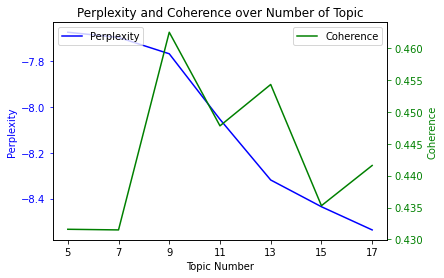

In [214]:
fig, ax1 = plt.subplots()

ax1.plot(perplexity_values, 'b', label='Perplexity')
ax1.set_xlabel('Topic Number')
ax1.set_ylabel('Perplexity', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()
ax2.plot(coherence_values, 'g', label='Coherence')
ax2.set_ylabel('Coherence', color='g')
ax2.tick_params('y', colors='g')

plt.title('Perplexity and Coherence over Number of Topic')

ax1.legend(loc=2)
ax2.legend(loc=1)

plt.xticks(range(len(topic_range)), topic_range)
plt.show()

### Best BOW LdaModel

#### Best Coherance Search

- The best result is not just identified by coherence_values.
- After visuals is generated, I will analyse the 

In [215]:
max_coherence = max(coherence_values)
print("Highest", max_coherence)
max_coherence_index = coherence_values.index(max_coherence)
print(f"Best: {topic_range[max_coherence_index]} Topics")

best_bow_ldamodel = lda_list[max_coherence_index]

Highest 0.4624525634812417
Best: 9 Topics


#### Print Topics

In [216]:
topics = best_bow_ldamodel.print_topics(num_topics=topic_num, num_words=word_num)
for topic in topics:
    print(topic)

(0, '0.016*"shop" + 0.012*"great" + 0.011*"art" + 0.010*"love" + 0.008*"book"')
(1, '0.031*"staff" + 0.027*"great" + 0.023*"price" + 0.022*"friendly" + 0.018*"good"')
(2, '0.023*"mall" + 0.016*"shop" + 0.013*"park" + 0.010*"area" + 0.010*"nice"')
(3, '0.024*"shoe" + 0.022*"dress" + 0.015*"clothes" + 0.015*"shop" + 0.014*"price"')
(4, '0.023*"service" + 0.018*"customer" + 0.014*"day" + 0.014*"time" + 0.013*"tell"')
(5, '0.022*"food" + 0.020*"book" + 0.016*"good" + 0.015*"love" + 0.013*"wine"')
(6, '0.029*"hair" + 0.022*"product" + 0.018*"love" + 0.016*"cut" + 0.013*"great"')
(7, '0.026*"price" + 0.025*"item" + 0.023*"stuff" + 0.022*"buy" + 0.019*"thing"')
(8, '0.021*"time" + 0.013*"people" + 0.013*"walk" + 0.009*"work" + 0.008*"wait"')


####  Retrieving Topic Details

In [217]:
dic_topic_doc = {}

for index, doc in enumerate(doc_clean):
    #for doc in doc_clean:
    bow = dictionary.doc2bow(doc)
    
    #get topic distribution of the ldamodel
    t = best_bow_ldamodel.get_document_topics(bow)
    
    #sort the probability value in descending order to extract the top contributing topic id
    sorted_t = sorted(t, key=lambda x: x[1], reverse=True)
    
    #print only the filename 
    print(f"Document {index} Topic: {sorted_t}",)
    
    #get the top scoring item
    top_item = sorted_t.pop(0)
    
    #create dictionary and keep key as topic id and filename and probability in tuple as value
    dic_topic_doc.setdefault(top_item[0],[]).append((index, top_item[1]))

Document 0 Topic: [(1, 0.6468454), (8, 0.3100226), (5, 0.02893173)]
Document 1 Topic: [(1, 0.54764855), (8, 0.35990614), (0, 0.060677838)]
Document 2 Topic: [(7, 0.45837617), (0, 0.28794292), (4, 0.13077742), (2, 0.106533386)]
Document 3 Topic: [(7, 0.40318313), (0, 0.3153573), (4, 0.21200338), (1, 0.054793812)]
Document 4 Topic: [(4, 0.38786897), (1, 0.215506), (3, 0.15472749), (8, 0.14959355), (7, 0.05178942), (0, 0.035872184)]
Document 5 Topic: [(2, 0.44823068), (1, 0.30162066), (7, 0.23303433)]
Document 6 Topic: [(2, 0.643014), (3, 0.2078632), (7, 0.11201777)]
Document 7 Topic: [(1, 0.3977186), (7, 0.26379088), (3, 0.17430212), (2, 0.14733581)]
Document 8 Topic: [(4, 0.4448974), (3, 0.20405765), (0, 0.13298917), (7, 0.08493796), (1, 0.06687205), (8, 0.04614125), (6, 0.017958596)]
Document 9 Topic: [(1, 0.48343158), (5, 0.25106034), (3, 0.21784042)]
Document 10 Topic: [(3, 0.35269818), (8, 0.22501853), (1, 0.15651216), (4, 0.15595575), (5, 0.099698834)]
Document 11 Topic: [(3, 0.346

Document 210 Topic: [(2, 0.475613), (3, 0.27972123), (7, 0.1156773), (5, 0.115066774)]
Document 211 Topic: [(7, 0.44708833), (5, 0.23710911), (1, 0.22005056), (2, 0.0758383)]
Document 212 Topic: [(2, 0.47102368), (8, 0.27382776), (0, 0.23428465)]
Document 213 Topic: [(0, 0.597796), (2, 0.17111777), (7, 0.10341774), (8, 0.049940728), (3, 0.03829658), (6, 0.034852784)]
Document 214 Topic: [(0, 0.41448608), (8, 0.2885296), (7, 0.28701976)]
Document 215 Topic: [(1, 0.92588943)]
Document 216 Topic: [(1, 0.7075757), (8, 0.12956452), (2, 0.087317035), (4, 0.06524052)]
Document 217 Topic: [(6, 0.5625806), (1, 0.1649328), (4, 0.12470449), (7, 0.121698774), (2, 0.020223806)]
Document 218 Topic: [(6, 0.49066105), (8, 0.22783811), (4, 0.15865995), (0, 0.104306996)]
Document 219 Topic: [(3, 0.5883907), (1, 0.33374012), (4, 0.011131818), (8, 0.011127983), (7, 0.011127085), (2, 0.011125692), (5, 0.011120869), (6, 0.011118215), (0, 0.011117499)]
Document 220 Topic: [(7, 0.6494916), (5, 0.2699083), (1,

Document 491 Topic: [(5, 0.4447917), (1, 0.23502898), (8, 0.18805347), (7, 0.12315422)]
Document 492 Topic: [(5, 0.2706806), (7, 0.25407866), (0, 0.23808849), (1, 0.15224515), (8, 0.078545906)]
Document 493 Topic: [(5, 0.39991975), (0, 0.33643377), (8, 0.24457566)]
Document 494 Topic: [(5, 0.32464585), (1, 0.29149416), (6, 0.19294709), (7, 0.1513595), (8, 0.030460998)]
Document 495 Topic: [(5, 0.35958567), (7, 0.34931326), (3, 0.12865336), (0, 0.09451695), (6, 0.054022864)]
Document 496 Topic: [(7, 0.50670964), (5, 0.36362275), (1, 0.018526945), (3, 0.018526744), (8, 0.018524574), (2, 0.018524297), (0, 0.0185219), (6, 0.018521672), (4, 0.018521544)]
Document 497 Topic: [(7, 0.27306196), (5, 0.24088584), (1, 0.23838082), (4, 0.099180214), (6, 0.059578154), (8, 0.04853911), (0, 0.037191864)]
Document 498 Topic: [(7, 0.6081111), (2, 0.34320506)]
Document 499 Topic: [(4, 0.44980955), (1, 0.23939681), (5, 0.15531094), (7, 0.101692796), (2, 0.045065213)]
Document 500 Topic: [(5, 0.31937572),

Document 795 Topic: [(3, 0.6036793), (4, 0.209099), (2, 0.15689905)]
Document 796 Topic: [(3, 0.42682213), (1, 0.2944315), (8, 0.23950137)]
Document 797 Topic: [(3, 0.42162597), (2, 0.36611074), (8, 0.15602946), (6, 0.048048794)]
Document 798 Topic: [(2, 0.35883358), (4, 0.24611008), (8, 0.21054448), (7, 0.10692451), (3, 0.04769379), (1, 0.026453061)]
Document 799 Topic: [(3, 0.77510625), (8, 0.118960775), (0, 0.06843204), (6, 0.027001502)]
Document 800 Topic: [(3, 0.5857874), (2, 0.16308776), (0, 0.11319603), (6, 0.06454164), (7, 0.06166001)]
Document 801 Topic: [(1, 0.60326815), (7, 0.12721743), (2, 0.10993373), (3, 0.095372684), (0, 0.050667297)]
Document 802 Topic: [(7, 0.49642944), (1, 0.2952607), (4, 0.11078478), (3, 0.07897856)]
Document 803 Topic: [(8, 0.5202972), (2, 0.42409813)]
Document 804 Topic: [(4, 0.4701125), (7, 0.47001183)]
Document 805 Topic: [(2, 0.4112727), (0, 0.23832257), (8, 0.19018339), (5, 0.13374533)]
Document 806 Topic: [(2, 0.71665287), (7, 0.2234183)]
Docu

Document 1103 Topic: [(2, 0.39085618), (8, 0.3771856), (7, 0.16522688), (4, 0.011133246), (1, 0.011123498), (5, 0.01111974), (6, 0.01111934), (0, 0.011117877), (3, 0.011117649)]
Document 1104 Topic: [(1, 0.32672063), (8, 0.25757873), (2, 0.25009805), (0, 0.093975574), (3, 0.06688787)]
Document 1105 Topic: [(8, 0.6714715), (1, 0.23011439), (0, 0.079333216)]
Document 1106 Topic: [(2, 0.6318063), (5, 0.1576588), (1, 0.14984079), (8, 0.010121865), (4, 0.010118049), (0, 0.010114882), (3, 0.010113628), (7, 0.010113349), (6, 0.010112293)]
Document 1107 Topic: [(7, 0.28568608), (5, 0.1950093), (8, 0.17846115), (0, 0.13614663), (2, 0.124985896), (1, 0.074939445)]
Document 1108 Topic: [(8, 0.3016537), (7, 0.22377136), (1, 0.21860152), (5, 0.14448634), (4, 0.08267848), (2, 0.024827085)]
Document 1109 Topic: [(1, 0.4352936), (7, 0.1855859), (3, 0.1846572), (5, 0.18434452)]
Document 1110 Topic: [(3, 0.6149872), (8, 0.14236103), (6, 0.13255243), (0, 0.049832594), (5, 0.046350185)]
Document 1111 Topi

Document 1186 Topic: [(3, 0.4479262), (7, 0.34454545), (8, 0.09727544), (4, 0.06657326), (6, 0.03356571)]
Document 1187 Topic: [(2, 0.6950296), (7, 0.21108688), (1, 0.074811935)]
Document 1188 Topic: [(2, 0.49544826), (8, 0.47459853)]
Document 1189 Topic: [(7, 0.6065284), (3, 0.20171256), (2, 0.0900649), (5, 0.07378708)]
Document 1190 Topic: [(7, 0.47982448), (4, 0.3241683), (3, 0.12892719), (8, 0.011183968), (1, 0.011182633), (2, 0.011180331), (5, 0.01117812), (6, 0.011178084), (0, 0.011176889)]
Document 1191 Topic: [(2, 0.4707714), (7, 0.26669735), (1, 0.21487221)]
Document 1192 Topic: [(1, 0.76518965), (2, 0.16406962), (7, 0.010110131), (3, 0.010108433), (5, 0.010107181), (0, 0.0101050595), (8, 0.010103742), (4, 0.010103255), (6, 0.0101029)]
Document 1193 Topic: [(2, 0.5183141), (0, 0.42765343), (3, 0.038824372)]
Document 1194 Topic: [(2, 0.5905074), (0, 0.23740028), (3, 0.15758602)]
Document 1195 Topic: [(2, 0.5276879), (0, 0.23944472), (3, 0.09950057), (4, 0.06101684), (5, 0.03804

Document 1449 Topic: [(0, 0.57376915), (8, 0.26215628), (1, 0.14322568)]
Document 1450 Topic: [(8, 0.8729556), (2, 0.015889095), (4, 0.01588404), (3, 0.015879614), (5, 0.015879543), (1, 0.015879137), (7, 0.015878066), (0, 0.015877677), (6, 0.01587723)]
Document 1451 Topic: [(4, 0.5112144), (8, 0.18007293), (0, 0.14957066), (3, 0.14273934)]
Document 1452 Topic: [(4, 0.51067144), (8, 0.1943722), (0, 0.15141504), (1, 0.07412235), (7, 0.060511995)]
Document 1453 Topic: [(4, 0.35181636), (6, 0.33031514), (0, 0.16522668), (1, 0.11559002)]
Document 1454 Topic: [(1, 0.29891425), (6, 0.2672223), (8, 0.1896061), (2, 0.11935375), (4, 0.10199541), (5, 0.016095124)]
Document 1455 Topic: [(7, 0.50420004), (3, 0.33543348), (1, 0.13136744)]
Document 1456 Topic: [(2, 0.6291101), (0, 0.2735847), (8, 0.013909065), (7, 0.013903918), (1, 0.01390286), (4, 0.013899936), (5, 0.013897216), (3, 0.013896793), (6, 0.0138954045)]
Document 1457 Topic: [(3, 0.23292945), (6, 0.22805545), (8, 0.18560937), (1, 0.178081

Document 1535 Topic: [(3, 0.39376384), (4, 0.35037532), (2, 0.1557032), (5, 0.078763075)]
Document 1536 Topic: [(3, 0.2597526), (1, 0.25679183), (7, 0.15670937), (8, 0.12258814), (4, 0.07541932), (0, 0.06852263), (6, 0.055752527)]
Document 1537 Topic: [(3, 0.83715653), (6, 0.057545044), (1, 0.048673656), (8, 0.038087964)]
Document 1538 Topic: [(6, 0.43007725), (0, 0.27884686), (8, 0.2303639), (3, 0.010123614), (1, 0.010119023), (2, 0.010118981), (7, 0.010118047), (5, 0.010116326), (4, 0.010115963)]
Document 1539 Topic: [(8, 0.3843697), (3, 0.2736733), (4, 0.27025214), (5, 0.05315097)]
Document 1540 Topic: [(3, 0.37353685), (0, 0.30494693), (6, 0.30188814)]
Document 1541 Topic: [(4, 0.65194875), (6, 0.18822643), (2, 0.06538913), (7, 0.043690197), (0, 0.043672953)]
Document 1542 Topic: [(1, 0.379731), (4, 0.34837437), (3, 0.17861977), (5, 0.043206558), (2, 0.035661176)]
Document 1543 Topic: [(3, 0.44722763), (6, 0.32590038), (0, 0.12135496), (4, 0.0856493)]
Document 1544 Topic: [(3, 0.44

Document 1793 Topic: [(3, 0.54869914), (8, 0.1546764), (0, 0.1256148), (1, 0.123537205), (6, 0.019647276)]
Document 1794 Topic: [(0, 0.40933537), (2, 0.31167907), (7, 0.22817406), (6, 0.035346273)]
Document 1795 Topic: [(0, 0.28199273), (8, 0.21204205), (7, 0.18747143), (6, 0.1755079), (1, 0.13238499)]
Document 1796 Topic: [(7, 0.42550504), (0, 0.22309865), (1, 0.17996494), (5, 0.111676976), (4, 0.05119889)]
Document 1797 Topic: [(3, 0.4550616), (7, 0.16593912), (8, 0.1415745), (4, 0.13731787), (6, 0.08868444)]
Document 1798 Topic: [(4, 0.6085245), (3, 0.35617167), (6, 0.03128053)]
Document 1799 Topic: [(3, 0.2991763), (1, 0.2809432), (4, 0.23344824), (0, 0.09815787), (7, 0.08015854)]
Document 1800 Topic: [(1, 0.53214073), (8, 0.29598492), (3, 0.15102078)]
Document 1801 Topic: [(3, 0.67701274), (4, 0.15408896), (2, 0.08385649), (0, 0.07621014)]
Document 1802 Topic: [(3, 0.5594093), (0, 0.27037054), (1, 0.060278695), (6, 0.043517157), (7, 0.024079133), (2, 0.021178192), (4, 0.017827762)

Document 2146 Topic: [(0, 0.32234102), (1, 0.2672723), (7, 0.2236102), (5, 0.16692129)]
Document 2147 Topic: [(7, 0.43587735), (8, 0.19676784), (5, 0.16098669), (0, 0.089401916), (2, 0.050497793), (3, 0.044309486), (1, 0.018775357)]
Document 2148 Topic: [(7, 0.43830487), (8, 0.33187813), (1, 0.10171804), (0, 0.04999249), (3, 0.038690332), (2, 0.03273292)]
Document 2149 Topic: [(0, 0.42400584), (8, 0.23328234), (5, 0.18191752), (7, 0.10212018), (3, 0.03174361), (6, 0.021714112)]
Document 2150 Topic: [(5, 0.4230988), (1, 0.327002), (0, 0.18312046), (3, 0.0111339), (6, 0.011132372), (8, 0.011131178), (7, 0.0111275865), (2, 0.011126949), (4, 0.011126776)]
Document 2151 Topic: [(7, 0.45941582), (0, 0.27806124), (1, 0.23471677)]
Document 2152 Topic: [(0, 0.60795593), (7, 0.18331751), (4, 0.13303411), (1, 0.056519136)]
Document 2153 Topic: [(6, 0.6402169), (2, 0.28195405), (8, 0.011121814), (1, 0.011120718), (0, 0.011120046), (3, 0.011117775), (4, 0.011117441), (5, 0.01111602), (7, 0.01111524

Document 2236 Topic: [(2, 0.47000217), (0, 0.41594827), (7, 0.08932033)]
Document 2237 Topic: [(2, 0.39070138), (0, 0.29685766), (3, 0.11622772), (8, 0.10086065), (7, 0.03686826), (5, 0.028421227), (6, 0.025519982)]
Document 2238 Topic: [(2, 0.632243), (8, 0.23797417), (0, 0.018541832), (7, 0.018540882), (3, 0.018540632), (1, 0.018540375), (6, 0.01853983), (4, 0.01853979), (5, 0.018539468)]
Document 2239 Topic: [(0, 0.4117052), (8, 0.338048), (3, 0.22457264)]
Document 2240 Topic: [(0, 0.47383958), (2, 0.24138038), (8, 0.14566311), (6, 0.09552965), (7, 0.03485465)]
Document 2241 Topic: [(2, 0.5024248), (0, 0.21640402), (8, 0.20930293), (7, 0.052002914)]
Document 2242 Topic: [(2, 0.46595988), (0, 0.31179515), (8, 0.13419527), (1, 0.07339491)]
Document 2243 Topic: [(0, 0.37129372), (2, 0.34457818), (7, 0.15337753), (8, 0.12244524)]
Document 2244 Topic: [(2, 0.5155163), (0, 0.25445297), (8, 0.13573255), (1, 0.054516897), (5, 0.02987252)]
Document 2245 Topic: [(2, 0.3047843), (0, 0.25830165

Document 2451 Topic: [(7, 0.43590063), (8, 0.3064308), (1, 0.21132487), (2, 0.033092573)]
Document 2452 Topic: [(2, 0.4973071), (8, 0.26163918), (7, 0.10451689), (5, 0.052437637), (6, 0.040284287), (1, 0.03883172)]
Document 2453 Topic: [(2, 0.76360804), (1, 0.20756343)]
Document 2454 Topic: [(7, 0.5981485), (2, 0.36295533)]
Document 2455 Topic: [(2, 0.33388442), (0, 0.2008923), (8, 0.18454354), (5, 0.10589259), (7, 0.10501376), (1, 0.03545985), (6, 0.032213222)]
Document 2456 Topic: [(2, 0.6122655), (5, 0.15694176), (1, 0.12519674), (0, 0.037195347), (8, 0.035756476), (7, 0.030076817)]
Document 2457 Topic: [(2, 0.90112776), (7, 0.012363417), (8, 0.012361939), (4, 0.0123593835), (1, 0.012358801), (5, 0.012358621), (3, 0.0123581635), (0, 0.012356451), (6, 0.0123554)]
Document 2458 Topic: [(3, 0.57422537), (6, 0.14634556), (2, 0.08240388), (0, 0.07557919), (8, 0.058823757), (5, 0.056309137)]
Document 2459 Topic: [(0, 0.25806117), (3, 0.2511696), (8, 0.17038646), (1, 0.11228056), (2, 0.081

Document 2764 Topic: [(3, 0.5626839), (7, 0.22924493), (4, 0.13636748), (6, 0.05253116)]
Document 2765 Topic: [(1, 0.77046293), (4, 0.1941436)]
Document 2766 Topic: [(1, 0.85879284), (4, 0.11895385)]
Document 2767 Topic: [(1, 0.5070784), (8, 0.17768659), (5, 0.15386349), (3, 0.13820317)]
Document 2768 Topic: [(0, 0.6918457), (8, 0.23030415), (5, 0.011128204), (1, 0.011126482), (4, 0.011120634), (3, 0.011120373), (2, 0.011120029), (7, 0.011117844), (6, 0.011116518)]
Document 2769 Topic: [(8, 0.42438635), (0, 0.23331276), (4, 0.086952485), (6, 0.08315752), (3, 0.06423467), (7, 0.05394298), (1, 0.03889229), (2, 0.013627401)]
Document 2770 Topic: [(8, 0.49220517), (0, 0.40148678), (2, 0.089188345)]
Document 2771 Topic: [(0, 0.52908003), (1, 0.20674744), (8, 0.16104431), (6, 0.08172617)]
Document 2772 Topic: [(4, 0.5166115), (8, 0.35670042), (1, 0.087446466)]
Document 2773 Topic: [(6, 0.44948694), (8, 0.12034873), (7, 0.10702192), (3, 0.0889033), (0, 0.076134875), (1, 0.06499632), (5, 0.048

Document 2846 Topic: [(2, 0.40856305), (8, 0.2446635), (0, 0.12477172), (5, 0.06654276), (1, 0.046473343), (4, 0.035392504), (6, 0.0313411), (7, 0.025759673), (3, 0.016492385)]
Document 2847 Topic: [(3, 0.6194342), (2, 0.19665805), (8, 0.09602411), (6, 0.06581366), (5, 0.016365308)]
Document 2848 Topic: [(4, 0.31686482), (3, 0.31657594), (1, 0.24349669), (6, 0.115226574)]
Document 2849 Topic: [(1, 0.374855), (4, 0.25796816), (3, 0.17184813), (2, 0.10778273), (5, 0.07583343)]
Document 2850 Topic: [(8, 0.28615853), (3, 0.27506128), (7, 0.22595401), (1, 0.1301718), (2, 0.070927754)]
Document 2851 Topic: [(3, 0.63653135), (4, 0.21919012), (2, 0.13445126)]
Document 2852 Topic: [(3, 0.66457254), (0, 0.1420702), (7, 0.13270105), (2, 0.010110939), (4, 0.010110801), (6, 0.010110184), (1, 0.010109387), (8, 0.010107799), (5, 0.010107094)]
Document 2853 Topic: [(1, 0.44993132), (3, 0.1774075), (8, 0.16253775), (6, 0.1064246), (2, 0.080230944)]
Document 2854 Topic: [(4, 0.5064509), (3, 0.26677606),

Document 3104 Topic: [(4, 0.6675447), (0, 0.16557635), (2, 0.14602484)]
Document 3105 Topic: [(2, 0.30092993), (7, 0.2882667), (4, 0.18844506), (8, 0.13995187), (3, 0.07069371)]
Document 3106 Topic: [(4, 0.2735003), (2, 0.20194905), (8, 0.18957582), (1, 0.17493784), (7, 0.12040801), (3, 0.032197587)]
Document 3107 Topic: [(8, 0.2724099), (5, 0.23024893), (4, 0.18986286), (7, 0.18225521), (6, 0.1074221)]
Document 3108 Topic: [(6, 0.64274865), (4, 0.17796001), (5, 0.085065424), (3, 0.07568696)]
Document 3109 Topic: [(3, 0.3645697), (7, 0.17582065), (1, 0.1492216), (8, 0.13512793), (4, 0.075441785), (0, 0.04644336), (6, 0.026995394), (5, 0.024789238)]
Document 3110 Topic: [(3, 0.46307814), (8, 0.19166337), (1, 0.14339244), (2, 0.0954516), (6, 0.054560497), (0, 0.046378657)]
Document 3111 Topic: [(6, 0.309141), (7, 0.2825435), (8, 0.13603154), (4, 0.063091986), (0, 0.05905779), (2, 0.056498237), (3, 0.053161), (5, 0.03900243)]
Document 3112 Topic: [(1, 0.26924685), (3, 0.20027265), (2, 0.1

Document 3187 Topic: [(2, 0.33974716), (3, 0.33921418), (8, 0.15693654), (0, 0.14746796), (4, 0.01100017)]
Document 3188 Topic: [(3, 0.9191379), (2, 0.010112968), (1, 0.010110149), (8, 0.010108306), (0, 0.010107505), (7, 0.010107367), (5, 0.010107143), (4, 0.010104384), (6, 0.010104273)]
Document 3189 Topic: [(1, 0.58944064), (7, 0.3836946)]
Document 3190 Topic: [(2, 0.31858355), (4, 0.31335908), (7, 0.17478043), (1, 0.10481146), (0, 0.042621568), (3, 0.037874438)]
Document 3191 Topic: [(2, 0.5376559), (5, 0.40304855), (4, 0.043395706)]
Document 3192 Topic: [(5, 0.33946213), (1, 0.30698937), (2, 0.2868398), (0, 0.011122499), (7, 0.011120425), (6, 0.011118786), (3, 0.011117699), (4, 0.011116069), (8, 0.011113213)]
Document 3193 Topic: [(2, 0.29768112), (5, 0.23714702), (8, 0.13059133), (7, 0.119478464), (6, 0.117757864), (3, 0.0805992)]
Document 3194 Topic: [(2, 0.5258633), (0, 0.21247816), (5, 0.17722684), (8, 0.06737978), (3, 0.012847535)]
Document 3195 Topic: [(2, 0.5317388), (0, 0.2

Document 3459 Topic: [(0, 0.3623487), (8, 0.21177603), (5, 0.13262966), (2, 0.106301695), (3, 0.066117175), (1, 0.062317282), (4, 0.03613758), (6, 0.021987587)]
Document 3460 Topic: [(0, 0.5133222), (7, 0.13812304), (6, 0.118543394), (3, 0.098878354), (8, 0.0872927), (4, 0.03966276)]
Document 3461 Topic: [(1, 0.6818696), (4, 0.2403123), (8, 0.011119462), (3, 0.011118217), (2, 0.011117138), (7, 0.01111712), (0, 0.011115822), (6, 0.011115417), (5, 0.011114912)]
Document 3462 Topic: [(4, 0.586535), (5, 0.14762296), (7, 0.13194872), (8, 0.06538121), (1, 0.06264701)]
Document 3463 Topic: [(7, 0.48281103), (8, 0.22269867), (2, 0.18062845), (5, 0.08458669)]
Document 3464 Topic: [(0, 0.6326734), (3, 0.25136176), (7, 0.0788536)]
Document 3465 Topic: [(5, 0.40236712), (1, 0.32433304), (8, 0.17863823), (7, 0.07780835)]
Document 3466 Topic: [(8, 0.4760986), (5, 0.31201836), (1, 0.14517751), (2, 0.011121235), (4, 0.011119044), (3, 0.011117965), (0, 0.011115826), (6, 0.011115745), (7, 0.011115745)]


Document 3769 Topic: [(7, 0.37070298), (8, 0.26029277), (3, 0.24883716), (4, 0.068586856), (1, 0.040721245)]
Document 3770 Topic: [(3, 0.77403486), (2, 0.15626544), (0, 0.04743044)]
Document 3771 Topic: [(8, 0.3290697), (3, 0.3050127), (0, 0.17951046), (5, 0.11961675), (2, 0.055908605)]
Document 3772 Topic: [(3, 0.5701957), (7, 0.20805317), (8, 0.1071918), (0, 0.09819325)]
Document 3773 Topic: [(7, 0.57360184), (1, 0.25931677), (3, 0.122605234)]
Document 3774 Topic: [(3, 0.33642796), (7, 0.22809915), (2, 0.20400453), (4, 0.14084129), (5, 0.057443228), (6, 0.027427163)]
Document 3775 Topic: [(3, 0.5293388), (4, 0.30338633), (8, 0.12801461)]
Document 3776 Topic: [(3, 0.458982), (8, 0.16350503), (7, 0.12297072), (5, 0.118015304), (1, 0.07366614), (4, 0.05559632)]
Document 3777 Topic: [(3, 0.34778824), (4, 0.21433127), (8, 0.16315594), (2, 0.08995563), (0, 0.08841634), (7, 0.0377867), (5, 0.03410057), (1, 0.01833007)]
Document 3778 Topic: [(7, 0.8729254), (2, 0.01589367), (8, 0.015889281),

Document 3984 Topic: [(7, 0.6290903), (8, 0.1640881), (1, 0.14021385), (5, 0.052704465)]
Document 3985 Topic: [(7, 0.48089767), (5, 0.30553472), (1, 0.0964119), (0, 0.05931779), (3, 0.046126403)]
Document 3986 Topic: [(7, 0.56439173), (1, 0.19958006), (0, 0.12959091), (2, 0.0639697), (6, 0.030109378)]
Document 3987 Topic: [(1, 0.5390844), (7, 0.41994202)]
Document 3988 Topic: [(1, 0.50228643), (2, 0.41987678), (7, 0.011124895), (3, 0.011121331), (0, 0.011120737), (5, 0.011120464), (6, 0.011119677), (8, 0.011115444), (4, 0.011114245)]
Document 3989 Topic: [(7, 0.678769), (3, 0.2725749)]
Document 3990 Topic: [(1, 0.3041839), (4, 0.2870151), (7, 0.27972522), (0, 0.0739981), (5, 0.041591667)]
Document 3991 Topic: [(1, 0.45134112), (0, 0.18025686), (7, 0.16143918), (3, 0.1530168), (2, 0.04358161)]
Document 3992 Topic: [(7, 0.33604962), (2, 0.33166453), (1, 0.28096277)]
Document 3993 Topic: [(4, 0.37334147), (7, 0.21331939), (3, 0.16821864), (0, 0.117106885), (1, 0.06711661), (8, 0.05551279)

Document 4190 Topic: [(7, 0.28081796), (1, 0.24376318), (5, 0.14374912), (8, 0.12432871), (2, 0.053011052), (3, 0.05223989), (0, 0.050486863), (4, 0.050320063)]
Document 4191 Topic: [(7, 0.48608544), (0, 0.28225297), (5, 0.20132703)]
Document 4192 Topic: [(5, 0.44437528), (8, 0.23196402), (3, 0.13685478), (0, 0.11139582), (2, 0.061047927)]
Document 4193 Topic: [(4, 0.39957452), (7, 0.29197705), (8, 0.24776703), (1, 0.010116867), (0, 0.010116073), (5, 0.010114508), (2, 0.010113995), (3, 0.010111179), (6, 0.010108778)]
Document 4194 Topic: [(5, 0.5491052), (0, 0.2958128), (1, 0.12332769)]
Document 4195 Topic: [(7, 0.32322246), (8, 0.23866822), (1, 0.22752553), (5, 0.11332809), (0, 0.06763795), (3, 0.024701132)]
Document 4196 Topic: [(7, 0.4064044), (5, 0.31054354), (4, 0.21163487), (2, 0.048157126), (0, 0.01776733)]
Document 4197 Topic: [(5, 0.2889697), (7, 0.2561342), (1, 0.16023354), (8, 0.13685304), (0, 0.11637803), (6, 0.03365477)]
Document 4198 Topic: [(8, 0.37073502), (7, 0.1975462

Document 4350 Topic: [(4, 0.6592496), (1, 0.18790247), (8, 0.14153299)]
Document 4351 Topic: [(4, 0.54449475), (2, 0.11771685), (8, 0.111571826), (1, 0.09547209), (6, 0.05173337), (5, 0.03804614), (0, 0.034767926)]
Document 4352 Topic: [(1, 0.70352393), (8, 0.12567006), (6, 0.08896335), (3, 0.06264167)]
Document 4353 Topic: [(1, 0.39489844), (7, 0.38956824), (6, 0.101723075), (8, 0.08961553)]
Document 4354 Topic: [(0, 0.51034904), (1, 0.46860546)]
Document 4355 Topic: [(1, 0.33673313), (2, 0.27813867), (7, 0.17890756), (0, 0.17693831)]
Document 4356 Topic: [(8, 0.3688955), (4, 0.34430748), (3, 0.16298273), (0, 0.08669525)]
Document 4357 Topic: [(3, 0.44911206), (1, 0.21559887), (8, 0.15969703), (2, 0.12534219), (6, 0.03713403)]
Document 4358 Topic: [(2, 0.94071215)]
Document 4359 Topic: [(3, 0.44494617), (8, 0.3075169), (0, 0.14836921), (2, 0.036208156), (6, 0.029421272), (5, 0.02671615)]
Document 4360 Topic: [(3, 0.311042), (7, 0.2750223), (0, 0.15323637), (8, 0.09448663), (1, 0.07952

Document 4595 Topic: [(3, 0.6033214), (0, 0.13572648), (8, 0.08580288), (4, 0.07194788), (2, 0.059320252), (6, 0.034850053)]
Document 4596 Topic: [(3, 0.50307566), (6, 0.29394504), (0, 0.13615797), (7, 0.0111401295), (1, 0.011139773), (8, 0.011137768), (5, 0.011136552), (2, 0.011133568), (4, 0.011133535)]
Document 4597 Topic: [(4, 0.7764293), (1, 0.19362341)]
Document 4598 Topic: [(7, 0.29876634), (4, 0.26576224), (6, 0.1734323), (5, 0.15476798), (0, 0.09523774)]
Document 4599 Topic: [(5, 0.4244946), (7, 0.34378725), (4, 0.12772615), (8, 0.04180954), (2, 0.04092025), (0, 0.017185947)]
Document 4600 Topic: [(8, 0.21718414), (2, 0.20522788), (5, 0.19969381), (4, 0.13412057), (7, 0.12147103), (3, 0.11216735)]
Document 4601 Topic: [(1, 0.70408577), (5, 0.16528584), (7, 0.107588194)]
Document 4602 Topic: [(8, 0.53372085), (2, 0.4230193)]
Document 4603 Topic: [(7, 0.3543737), (4, 0.30470118), (8, 0.23036297), (2, 0.061447214), (6, 0.03638814)]
Document 4604 Topic: [(4, 0.5534918), (0, 0.2376

Document 4675 Topic: [(2, 0.555298), (7, 0.18563065), (5, 0.14562234), (8, 0.056181848), (0, 0.043362103)]
Document 4676 Topic: [(2, 0.3922689), (5, 0.27359298), (8, 0.16373649), (7, 0.15970623)]
Document 4677 Topic: [(2, 0.55951595), (5, 0.16451447), (7, 0.09539472), (3, 0.08457018), (6, 0.08251094)]
Document 4678 Topic: [(5, 0.40966588), (2, 0.35613567), (6, 0.20082644)]
Document 4679 Topic: [(4, 0.45956248), (8, 0.17997377), (2, 0.16416681), (1, 0.09648854), (7, 0.049027365), (5, 0.047030177)]
Document 4680 Topic: [(1, 0.40967748), (8, 0.39532778), (5, 0.163191)]
Document 4681 Topic: [(1, 0.8517825), (7, 0.018544456), (3, 0.018533792), (4, 0.018529706), (5, 0.018523391), (8, 0.018523205), (2, 0.018522657), (0, 0.018520422), (6, 0.018519843)]
Document 4682 Topic: [(3, 0.35320228), (4, 0.21336001), (8, 0.10602969), (7, 0.0997467), (2, 0.09247782), (1, 0.08252582), (0, 0.050649337)]
Document 4683 Topic: [(1, 0.660801), (3, 0.27436325)]
Document 4684 Topic: [(3, 0.42406043), (2, 0.38034

Document 4908 Topic: [(1, 0.5272505), (4, 0.3094657), (3, 0.12811261)]
Document 4909 Topic: [(0, 0.49031818), (3, 0.3373223), (4, 0.15011293)]
Document 4910 Topic: [(4, 0.6670501), (8, 0.31028718), (0, 0.0151518835)]
Document 4911 Topic: [(1, 0.4057985), (8, 0.21942462), (7, 0.14893718), (2, 0.06932013), (6, 0.06464263), (4, 0.05773858), (0, 0.029932933)]
Document 4912 Topic: [(1, 0.47950557), (7, 0.17492367), (0, 0.13722998), (3, 0.11567018), (8, 0.05944774), (6, 0.026667304)]
Document 4913 Topic: [(1, 0.60067964), (7, 0.15727814), (3, 0.13849673), (0, 0.093432955)]
Document 4914 Topic: [(1, 0.48462346), (0, 0.25404704), (7, 0.16528209), (3, 0.08421092)]
Document 4915 Topic: [(1, 0.22942896), (8, 0.20720887), (0, 0.17059937), (2, 0.17058812), (3, 0.15515774), (5, 0.032770835), (6, 0.03046908)]
Document 4916 Topic: [(4, 0.6963276), (2, 0.13747919), (0, 0.12172024)]
Document 4917 Topic: [(4, 0.47940698), (7, 0.28654808), (0, 0.2110316)]
Document 4918 Topic: [(4, 0.56904715), (8, 0.39852

Document 5174 Topic: [(8, 0.2503299), (0, 0.24253044), (2, 0.23815994), (7, 0.20716563), (6, 0.012377244), (3, 0.012361365), (4, 0.012359289), (5, 0.012358335), (1, 0.012357894)]
Document 5175 Topic: [(7, 0.3895336), (0, 0.2928937), (8, 0.17450875), (1, 0.08717505), (2, 0.030388221), (3, 0.021425828)]
Document 5176 Topic: [(7, 0.40486383), (0, 0.34092277), (8, 0.14465109), (1, 0.08428082)]
Document 5177 Topic: [(7, 0.35417724), (8, 0.25421685), (0, 0.16833788), (2, 0.13474432), (3, 0.04233872), (5, 0.039884884)]
Document 5178 Topic: [(7, 0.50967896), (8, 0.2967238), (4, 0.12005366), (2, 0.060887404)]
Document 5179 Topic: [(7, 0.5729288), (5, 0.21556962), (8, 0.09538229), (0, 0.09080641)]
Document 5180 Topic: [(7, 0.45623267), (8, 0.21384703), (2, 0.16349132), (0, 0.12796727), (3, 0.029172225)]
Document 5181 Topic: [(7, 0.608682), (0, 0.18403481), (1, 0.12433212), (6, 0.06071009)]
Document 5182 Topic: [(7, 0.45477742), (1, 0.44646597), (3, 0.04232723), (0, 0.04134599)]
Document 5183 Top

Document 5496 Topic: [(2, 0.7686772), (3, 0.11541235), (8, 0.045527022), (5, 0.036740396), (6, 0.02524427)]
Document 5497 Topic: [(2, 0.9110735), (5, 0.011117536), (6, 0.011117127), (1, 0.011116201), (7, 0.011115674), (0, 0.01111554), (3, 0.011115212), (8, 0.011115155), (4, 0.011114041)]
Document 5498 Topic: [(2, 0.4273509), (3, 0.3366653), (0, 0.12411564), (8, 0.041942205), (1, 0.04032865), (6, 0.024602035)]
Document 5499 Topic: [(6, 0.35901862), (8, 0.33439785), (2, 0.2836871), (1, 0.016972428)]
Document 5500 Topic: [(2, 0.86702424), (8, 0.106133685)]
Document 5501 Topic: [(2, 0.71552944), (8, 0.20760764), (0, 0.05461899)]
Document 5502 Topic: [(2, 0.8729464), (0, 0.015887907), (3, 0.015886797), (1, 0.015885267), (5, 0.015882313), (7, 0.015880482), (6, 0.01588023), (4, 0.015876304), (8, 0.015874328)]
Document 5503 Topic: [(2, 0.5214219), (3, 0.30011928), (5, 0.09512269), (8, 0.04817079), (6, 0.027208567)]
Document 5504 Topic: [(3, 0.35483944), (2, 0.28643218), (8, 0.2496442), (4, 0.0

Document 5585 Topic: [(7, 0.7053137), (5, 0.16975486), (4, 0.062173743), (6, 0.05432337)]
Document 5586 Topic: [(0, 0.32013425), (1, 0.1622067), (2, 0.14090836), (8, 0.1373774), (7, 0.13383548), (3, 0.08184779), (5, 0.0214605)]
Document 5587 Topic: [(0, 0.46861127), (3, 0.24136752), (7, 0.12057679), (8, 0.08781635), (2, 0.06853406)]
Document 5588 Topic: [(7, 0.62024796), (0, 0.19145492), (3, 0.08718224), (4, 0.07969415)]
Document 5589 Topic: [(7, 0.62564117), (4, 0.26315755), (8, 0.015888974), (3, 0.015887149), (5, 0.015886463), (2, 0.015885644), (6, 0.015884956), (1, 0.015884716), (0, 0.015883379)]
Document 5590 Topic: [(3, 0.6243112), (8, 0.3054768), (2, 0.046337467)]
Document 5591 Topic: [(3, 0.66604555), (1, 0.1611732), (0, 0.13352026)]
Document 5592 Topic: [(3, 0.68015575), (7, 0.108417846), (1, 0.08909594), (6, 0.08518741)]
Document 5593 Topic: [(4, 0.4664987), (6, 0.3792586), (5, 0.11717989)]
Document 5594 Topic: [(2, 0.54220533), (4, 0.2738289), (7, 0.16308913)]
Document 5595 T

Document 5857 Topic: [(1, 0.7347343), (3, 0.16771695), (7, 0.0139436275), (4, 0.013939427), (0, 0.013936946), (2, 0.013936672), (5, 0.013931471), (6, 0.013930318), (8, 0.013930272)]
Document 5858 Topic: [(4, 0.34055197), (0, 0.24687311), (7, 0.2243426), (1, 0.17397158)]
Document 5859 Topic: [(4, 0.31836456), (1, 0.30915335), (5, 0.25755313), (2, 0.099029705)]
Document 5860 Topic: [(3, 0.4454284), (1, 0.27700618), (0, 0.17664053), (4, 0.07666543)]
Document 5861 Topic: [(3, 0.66833436), (0, 0.25379968), (4, 0.011136062), (5, 0.011124469), (8, 0.01112441), (1, 0.011123234), (7, 0.011120772), (6, 0.0111201415), (2, 0.011116871)]
Document 5862 Topic: [(3, 0.35065874), (1, 0.20891175), (4, 0.15048431), (2, 0.14287665), (0, 0.13562809)]
Document 5863 Topic: [(3, 0.3964795), (4, 0.36628196), (2, 0.1235104), (6, 0.057990115), (8, 0.04878982)]
Document 5864 Topic: [(4, 0.34834057), (3, 0.28186166), (2, 0.11186799), (1, 0.07076218), (7, 0.057472125), (5, 0.04958892), (6, 0.043410435), (8, 0.03628

Document 6168 Topic: [(4, 0.61033934), (3, 0.25012884), (8, 0.09940649), (0, 0.024572145), (2, 0.0117757395)]
Document 6169 Topic: [(3, 0.4029417), (4, 0.24855323), (8, 0.20097798), (0, 0.13395919)]
Document 6170 Topic: [(5, 0.36047134), (8, 0.20455684), (1, 0.15918247), (0, 0.12842925), (2, 0.069234155), (3, 0.06525801)]
Document 6171 Topic: [(2, 0.5074105), (5, 0.27852198), (8, 0.12767579), (0, 0.05557666), (3, 0.023743274)]
Document 6172 Topic: [(2, 0.44505137), (5, 0.2772872), (1, 0.15362991), (8, 0.10939898)]
Document 6173 Topic: [(0, 0.4411593), (8, 0.19796577), (2, 0.13199307), (6, 0.12838963), (7, 0.0833794)]
Document 6174 Topic: [(0, 0.69542366), (7, 0.2526843)]
Document 6175 Topic: [(1, 0.861539), (2, 0.09954812)]
Document 6176 Topic: [(1, 0.5528547), (8, 0.15409616), (3, 0.13646315), (7, 0.089701355), (5, 0.051536724)]
Document 6177 Topic: [(7, 0.45375386), (0, 0.23888043), (5, 0.07795113), (1, 0.07688346), (6, 0.05522693), (2, 0.05128637), (4, 0.04362192)]
Document 6178 Top

Document 6422 Topic: [(1, 0.41663754), (3, 0.35484692), (7, 0.21659939)]
Document 6423 Topic: [(0, 0.3429625), (8, 0.2077235), (7, 0.12053891), (4, 0.118641235), (3, 0.07059576), (1, 0.061867904), (6, 0.040720932), (2, 0.025794903), (5, 0.011154359)]
Document 6424 Topic: [(0, 0.42060244), (7, 0.1790253), (3, 0.1394222), (4, 0.113578536), (1, 0.09482803), (8, 0.0475603)]
Document 6425 Topic: [(3, 0.36171648), (7, 0.29408365), (1, 0.24660832), (2, 0.08021855)]
Document 6426 Topic: [(1, 0.53878945), (4, 0.26417276), (7, 0.15256192)]
Document 6427 Topic: [(8, 0.5338802), (1, 0.40623593)]
Document 6428 Topic: [(3, 0.6519572), (1, 0.13680845), (2, 0.05738591), (8, 0.045341052), (0, 0.043585908), (4, 0.035369124), (5, 0.026328044)]
Document 6429 Topic: [(4, 0.44026905), (0, 0.27508238), (1, 0.26162076)]
Document 6430 Topic: [(4, 0.38258344), (1, 0.2437337), (8, 0.22526371), (3, 0.1415528)]
Document 6431 Topic: [(4, 0.45702943), (8, 0.29724932), (7, 0.10481985), (0, 0.07146571), (6, 0.05353726

Document 6639 Topic: [(3, 0.7635528), (8, 0.16864035), (2, 0.06085488)]
Document 6640 Topic: [(0, 0.45084915), (3, 0.4034203), (8, 0.09432947)]
Document 6641 Topic: [(0, 0.4143774), (3, 0.37651923), (8, 0.088278614), (2, 0.06327295), (4, 0.04318767)]
Document 6642 Topic: [(3, 0.488941), (1, 0.21654876), (0, 0.1747356), (8, 0.112642154)]
Document 6643 Topic: [(3, 0.58052254), (7, 0.13534717), (8, 0.13214713), (1, 0.09012321), (2, 0.043182533), (6, 0.015336645)]
Document 6644 Topic: [(2, 0.4685651), (3, 0.21941797), (1, 0.1699186), (8, 0.0939394), (6, 0.03612354)]
Document 6645 Topic: [(3, 0.5432018), (0, 0.14938384), (1, 0.09596258), (2, 0.08453677), (7, 0.07071197), (8, 0.02717978), (5, 0.026239721)]
Document 6646 Topic: [(3, 0.5318472), (8, 0.2117922), (0, 0.094271496), (2, 0.08351381), (5, 0.07230595)]
Document 6647 Topic: [(3, 0.94951063), (6, 0.035517372)]
Document 6648 Topic: [(3, 0.45699605), (8, 0.34396297), (7, 0.108827464), (1, 0.08108785)]
Document 6649 Topic: [(3, 0.35700864

Document 6892 Topic: [(8, 0.62474746), (1, 0.19071254), (4, 0.09764691), (5, 0.06836159)]
Document 6893 Topic: [(4, 0.42788598), (0, 0.25753564), (3, 0.14762494), (7, 0.103777386), (6, 0.052580178)]
Document 6894 Topic: [(3, 0.5908744), (2, 0.22554795), (7, 0.13228728), (8, 0.024993291), (1, 0.021511426)]
Document 6895 Topic: [(4, 0.49857646), (7, 0.19433495), (0, 0.13407724), (8, 0.109183095), (2, 0.052405495)]
Document 6896 Topic: [(4, 0.42763782), (7, 0.3353173), (5, 0.1394959), (0, 0.07227492)]
Document 6897 Topic: [(5, 0.5562988), (8, 0.15910582), (1, 0.15882456), (2, 0.103503734)]
Document 6898 Topic: [(4, 0.5144915), (8, 0.283892), (2, 0.13117965), (3, 0.060328335)]
Document 6899 Topic: [(4, 0.61016786), (7, 0.23932122), (8, 0.117147766)]
Document 6900 Topic: [(4, 0.6737088), (8, 0.26912603), (3, 0.04480398)]
Document 6901 Topic: [(0, 0.4280616), (8, 0.3875208), (6, 0.14270437)]
Document 6902 Topic: [(0, 0.6250343), (1, 0.14472252), (7, 0.12148935), (4, 0.097168386)]
Document 69

Document 7198 Topic: [(3, 0.47103965), (8, 0.30983177), (1, 0.13814403), (0, 0.06594829)]
Document 7199 Topic: [(4, 0.49272093), (3, 0.34076574), (8, 0.13212177), (0, 0.025834253)]
Document 7200 Topic: [(8, 0.45377347), (3, 0.2852885), (4, 0.1432076), (2, 0.0997877)]
Document 7201 Topic: [(4, 0.60607404), (3, 0.38477075)]
Document 7202 Topic: [(1, 0.4848952), (8, 0.3779229), (3, 0.09272499)]
Document 7203 Topic: [(3, 0.5938066), (4, 0.29134429), (6, 0.07974047)]
Document 7204 Topic: [(3, 0.4452432), (4, 0.34404096), (0, 0.19109982)]
Document 7205 Topic: [(1, 0.4016797), (8, 0.28026938), (3, 0.2787935)]
Document 7206 Topic: [(3, 0.46680623), (4, 0.36250407), (8, 0.1107909), (2, 0.0469723)]
Document 7207 Topic: [(4, 0.47973496), (3, 0.28662106), (1, 0.1919514)]
Document 7208 Topic: [(1, 0.6662163), (3, 0.2879931)]
Document 7209 Topic: [(1, 0.47012576), (6, 0.3741946), (0, 0.022242686), (8, 0.022240892), (4, 0.022239894), (3, 0.022239795), (2, 0.022239715), (7, 0.022238556), (5, 0.0222380

Document 7505 Topic: [(4, 0.36471012), (1, 0.21490084), (0, 0.20709428), (3, 0.09716656), (7, 0.076301314), (2, 0.031662643)]
Document 7506 Topic: [(4, 0.3676622), (3, 0.32396328), (0, 0.09775233), (8, 0.07907126), (1, 0.04395396), (5, 0.043644305), (2, 0.022831922), (6, 0.02001682)]
Document 7507 Topic: [(3, 0.3670628), (2, 0.23204824), (8, 0.16169955), (1, 0.13265918), (0, 0.08713004)]
Document 7508 Topic: [(1, 0.5151215), (8, 0.2612409), (2, 0.20210934)]
Document 7509 Topic: [(3, 0.53844136), (4, 0.37879497), (0, 0.05708911)]
Document 7510 Topic: [(1, 0.64487106), (8, 0.28438124), (7, 0.010114867), (3, 0.010108431), (5, 0.010107482), (2, 0.010107115), (0, 0.010104203), (4, 0.010102861), (6, 0.01010271)]
Document 7511 Topic: [(1, 0.5665856), (5, 0.25544438), (7, 0.121652946), (8, 0.042024713)]
Document 7512 Topic: [(5, 0.47644004), (2, 0.1968143), (6, 0.1762763), (0, 0.13360597)]
Document 7513 Topic: [(6, 0.512712), (1, 0.1799479), (5, 0.14758147), (8, 0.14617977)]
Document 7514 Topi

Document 7805 Topic: [(7, 0.37108493), (4, 0.21871075), (2, 0.16733637), (8, 0.12277402), (0, 0.07172015), (6, 0.042410854)]
Document 7806 Topic: [(7, 0.5139173), (5, 0.25795722), (3, 0.14472261), (1, 0.013914225), (8, 0.013901987), (2, 0.013901392), (4, 0.013899538), (6, 0.013893474), (0, 0.0138922455)]
Document 7807 Topic: [(8, 0.38615862), (1, 0.23605445), (2, 0.14610347), (7, 0.12907924), (4, 0.08824397)]
Document 7808 Topic: [(1, 0.48538417), (7, 0.2742337), (3, 0.20861222)]
Document 7809 Topic: [(7, 0.36671236), (2, 0.14813915), (5, 0.14418052), (0, 0.09125217), (1, 0.08933721), (3, 0.060998455), (8, 0.05008957), (4, 0.04722943)]
Document 7810 Topic: [(8, 0.27763045), (7, 0.24851812), (2, 0.24646808), (3, 0.17078915), (0, 0.044556953)]
Document 7811 Topic: [(8, 0.51818514), (4, 0.11705556), (3, 0.108599626), (0, 0.09607838), (2, 0.09589229), (1, 0.05750825)]
Document 7812 Topic: [(2, 0.7427382), (1, 0.19241604)]
Document 7813 Topic: [(5, 0.4937596), (8, 0.26177076), (3, 0.0851091

Document 7882 Topic: [(3, 0.83109415), (2, 0.12794307)]
Document 7883 Topic: [(1, 0.43692794), (5, 0.41341186), (3, 0.10200382)]
Document 7884 Topic: [(0, 0.40983707), (3, 0.20472078), (5, 0.15517165), (4, 0.13155796), (8, 0.086996794)]
Document 7885 Topic: [(2, 0.36116025), (5, 0.3322215), (0, 0.24094173), (1, 0.05022342)]
Document 7886 Topic: [(0, 0.3852903), (5, 0.3399947), (2, 0.25843942)]
Document 7887 Topic: [(0, 0.4108921), (5, 0.25267735), (7, 0.15148817), (1, 0.09960298), (4, 0.074214935)]
Document 7888 Topic: [(0, 0.39488244), (2, 0.27341628), (8, 0.08036776), (1, 0.07237103), (5, 0.06945493), (7, 0.058843125), (4, 0.026838953), (3, 0.023005955)]
Document 7889 Topic: [(5, 0.43909708), (2, 0.19969265), (3, 0.1908089), (8, 0.14259829)]
Document 7890 Topic: [(0, 0.31740806), (2, 0.19742893), (1, 0.16149737), (8, 0.15390195), (5, 0.123190925), (4, 0.041184243)]
Document 7891 Topic: [(0, 0.47520855), (8, 0.21125992), (5, 0.11322373), (2, 0.112282485), (6, 0.05785356), (3, 0.023202

Document 8134 Topic: [(8, 0.3137573), (7, 0.22759986), (0, 0.21084052), (1, 0.10238235), (2, 0.058449566), (4, 0.05384557), (6, 0.029367467)]
Document 8135 Topic: [(2, 0.56226104), (8, 0.3512488), (1, 0.012359741), (4, 0.012359044), (0, 0.012355969), (3, 0.012355303), (7, 0.012354308), (5, 0.012353727), (6, 0.012352046)]
Document 8136 Topic: [(8, 0.29938424), (2, 0.23400082), (4, 0.23213929), (7, 0.17353903), (1, 0.046589877)]
Document 8137 Topic: [(2, 0.579618), (7, 0.13646369), (0, 0.125759), (1, 0.118382774)]
Document 8138 Topic: [(7, 0.5999153), (8, 0.17465536), (1, 0.09240081), (0, 0.0663215), (4, 0.034174304), (3, 0.02701482)]
Document 8139 Topic: [(2, 0.30064836), (8, 0.26793548), (7, 0.17539304), (3, 0.09567624), (4, 0.08664506), (0, 0.04908805), (5, 0.021611452)]
Document 8140 Topic: [(4, 0.87299216), (8, 0.01588151), (2, 0.015879113), (7, 0.015875982), (0, 0.015874587), (3, 0.015874399), (1, 0.015874246), (5, 0.015874045), (6, 0.01587393)]
Document 8141 Topic: [(8, 0.34623995

Document 8209 Topic: [(7, 0.3785566), (8, 0.3441088), (2, 0.11695071), (3, 0.09994969), (4, 0.031862978), (5, 0.024395697)]
Document 8210 Topic: [(2, 0.5494188), (7, 0.25724283), (3, 0.15406796)]
Document 8211 Topic: [(7, 0.70090866), (0, 0.27720806)]
Document 8212 Topic: [(2, 0.78816605), (7, 0.09843479), (1, 0.09194832)]
Document 8213 Topic: [(7, 0.47009304), (2, 0.23666461), (1, 0.22652027), (3, 0.011126235), (0, 0.011122168), (8, 0.011119617), (5, 0.011118831), (6, 0.011118004), (4, 0.01111726)]
Document 8214 Topic: [(2, 0.4202546), (7, 0.25859913), (4, 0.14290105), (8, 0.12385547), (6, 0.042680297)]
Document 8215 Topic: [(7, 0.41333383), (8, 0.22693397), (2, 0.17058402), (0, 0.10079826), (6, 0.070552945)]
Document 8216 Topic: [(7, 0.53307354), (2, 0.19724806), (8, 0.15322988), (0, 0.10574736)]
Document 8217 Topic: [(7, 0.5392658), (8, 0.38299307), (3, 0.011117287), (1, 0.011105189), (6, 0.011104808), (5, 0.0111036515), (4, 0.01110356), (0, 0.011103518), (2, 0.011103135)]
Document 

Document 8458 Topic: [(5, 0.60921943), (8, 0.121317156), (0, 0.07971057), (2, 0.07572218), (6, 0.07299594), (4, 0.03669641)]
Document 8459 Topic: [(5, 0.78244376), (7, 0.088176966), (1, 0.05174387), (0, 0.04370256), (6, 0.029196953)]
Document 8460 Topic: [(5, 0.43555832), (2, 0.25946623), (7, 0.11517267), (4, 0.100440376), (0, 0.06635334), (6, 0.018008316)]
Document 8461 Topic: [(5, 0.6183937), (7, 0.33836675)]
Document 8462 Topic: [(2, 0.69771713), (4, 0.23740955)]
Document 8463 Topic: [(8, 0.37822032), (2, 0.31019574), (1, 0.14990132), (7, 0.08564042), (5, 0.069584355)]
Document 8464 Topic: [(2, 0.5677594), (8, 0.25146776), (4, 0.09367267), (7, 0.07446346)]
Document 8465 Topic: [(8, 0.4232936), (7, 0.31264588), (2, 0.23372567)]
Document 8466 Topic: [(4, 0.38474712), (2, 0.2288774), (5, 0.17126583), (8, 0.1532237), (7, 0.03036816), (6, 0.02613204)]
Document 8467 Topic: [(5, 0.38339263), (8, 0.2744016), (2, 0.2114501), (1, 0.11281689)]
Document 8468 Topic: [(2, 0.5697333), (1, 0.224240

Document 8718 Topic: [(5, 0.6766669), (2, 0.12521051), (7, 0.113275334), (8, 0.07220099)]
Document 8719 Topic: [(8, 0.36517084), (5, 0.28130972), (7, 0.1364996), (0, 0.10921615), (1, 0.051120102), (3, 0.04853224)]
Document 8720 Topic: [(5, 0.34249753), (2, 0.14139251), (8, 0.13705869), (0, 0.12647541), (7, 0.084680766), (6, 0.08427273), (3, 0.045473758), (4, 0.03706725)]
Document 8721 Topic: [(5, 0.61717504), (0, 0.14397007), (8, 0.13732739), (6, 0.093465045)]
Document 8722 Topic: [(5, 0.64713484), (2, 0.29725096)]
Document 8723 Topic: [(2, 0.48139668), (8, 0.3299255), (5, 0.174168)]
Document 8724 Topic: [(2, 0.5090608), (8, 0.211118), (7, 0.13167831), (5, 0.12033482)]
Document 8725 Topic: [(5, 0.3942464), (8, 0.27207407), (0, 0.14291325), (2, 0.100876994), (7, 0.059418954), (4, 0.027288217)]
Document 8726 Topic: [(5, 0.46502253), (0, 0.15830497), (2, 0.104242094), (8, 0.096105084), (7, 0.083193295), (6, 0.055126283), (3, 0.036211126)]
Document 8727 Topic: [(5, 0.547991), (6, 0.1196921

Document 8892 Topic: [(4, 0.31326735), (6, 0.26517957), (3, 0.22285494), (2, 0.15590115), (0, 0.038857304)]
Document 8893 Topic: [(8, 0.48197225), (4, 0.17733686), (6, 0.14078543), (2, 0.13004193), (7, 0.035794698), (5, 0.027995298)]
Document 8894 Topic: [(6, 0.25053722), (7, 0.16840097), (3, 0.14849365), (2, 0.12748729), (4, 0.11225993), (1, 0.09149423), (8, 0.072928764), (0, 0.027201083)]
Document 8895 Topic: [(1, 0.47855332), (0, 0.26225758), (2, 0.13995545), (8, 0.10234718)]
Document 8896 Topic: [(2, 0.35489058), (0, 0.34041741), (1, 0.14040518), (7, 0.1214851)]
Document 8897 Topic: [(4, 0.50926906), (3, 0.30266967), (0, 0.14880697)]
Document 8898 Topic: [(3, 0.41205674), (2, 0.31037405), (1, 0.26001242)]
Document 8899 Topic: [(4, 0.5647701), (3, 0.36776224), (0, 0.032397218), (6, 0.024567854)]
Document 8900 Topic: [(3, 0.73665035), (2, 0.111364394), (4, 0.110695906), (5, 0.02835237)]
Document 8901 Topic: [(4, 0.42629704), (3, 0.27457473), (8, 0.24113315), (0, 0.03141209), (2, 0.02

Document 9073 Topic: [(7, 0.38061252), (1, 0.37049437), (4, 0.15695119), (3, 0.07958546)]
Document 9074 Topic: [(5, 0.8391449), (2, 0.14139877)]
Document 9075 Topic: [(5, 0.34598458), (4, 0.2413639), (1, 0.20937334), (7, 0.107944414), (8, 0.088380046)]
Document 9076 Topic: [(5, 0.74602765), (2, 0.13168807), (3, 0.09447559)]
Document 9077 Topic: [(0, 0.31940305), (5, 0.20973262), (6, 0.1925733), (8, 0.13813986), (7, 0.05286697), (3, 0.04596386), (4, 0.039384197)]
Document 9078 Topic: [(7, 0.44639614), (5, 0.35271975), (1, 0.11983265), (6, 0.06251138)]
Document 9079 Topic: [(1, 0.46727172), (5, 0.26646903), (2, 0.16516757), (7, 0.07690789)]
Document 9080 Topic: [(2, 0.5154138), (5, 0.37343392), (1, 0.01589053), (3, 0.015881183), (6, 0.015877659), (0, 0.015877206), (7, 0.015876867), (4, 0.015874408), (8, 0.015874406)]
Document 9081 Topic: [(5, 0.59331125), (0, 0.15696298), (6, 0.091015436), (7, 0.08738414), (8, 0.06009031)]
Document 9082 Topic: [(1, 0.51653266), (5, 0.38455355), (7, 0.072

Document 9323 Topic: [(7, 0.35781592), (1, 0.26958203), (4, 0.18512776), (0, 0.16687323)]
Document 9324 Topic: [(1, 0.38804588), (0, 0.20254874), (8, 0.15833634), (4, 0.13145718), (7, 0.07301042), (2, 0.041127287)]
Document 9325 Topic: [(8, 0.54154587), (1, 0.3506478), (6, 0.076027505)]
Document 9326 Topic: [(0, 0.39288032), (7, 0.24454647), (8, 0.19566053), (3, 0.10583648), (2, 0.05216885)]
Document 9327 Topic: [(0, 0.36521357), (3, 0.2476143), (7, 0.18811467), (8, 0.10470225), (4, 0.07496566)]
Document 9328 Topic: [(7, 0.87368363), (3, 0.092459425)]
Document 9329 Topic: [(4, 0.33952907), (7, 0.33703625), (0, 0.15885063), (8, 0.11820468)]
Document 9330 Topic: [(2, 0.6097891), (1, 0.1961599), (8, 0.14954706)]
Document 9331 Topic: [(8, 0.54668117), (4, 0.16749875), (2, 0.10484077), (1, 0.09578293), (6, 0.056130845), (0, 0.024061263)]
Document 9332 Topic: [(0, 0.43502957), (1, 0.1624555), (4, 0.09728992), (8, 0.09669565), (5, 0.090925395), (2, 0.07709977), (6, 0.03604927)]
Document 9333 

Document 9631 Topic: [(4, 0.31492266), (3, 0.2209989), (1, 0.15305944), (8, 0.124241576), (7, 0.10602226), (6, 0.033902436), (2, 0.031493627), (0, 0.01444558)]
Document 9632 Topic: [(0, 0.35923326), (1, 0.31819504), (4, 0.15583472), (6, 0.14256425)]
Document 9633 Topic: [(1, 0.305718), (4, 0.24768634), (8, 0.16117236), (7, 0.1313677), (6, 0.0964752), (2, 0.05252255)]
Document 9634 Topic: [(1, 0.6495953), (7, 0.22014129), (0, 0.093192495)]
Document 9635 Topic: [(4, 0.75442505), (1, 0.22046892)]
Document 9636 Topic: [(3, 0.38258305), (7, 0.29403245), (0, 0.17796879), (8, 0.13217008)]
Document 9637 Topic: [(3, 0.38088557), (0, 0.22084895), (8, 0.12639658), (4, 0.09996896), (5, 0.09250693), (1, 0.031123707), (7, 0.024997875), (6, 0.022267548)]
Document 9638 Topic: [(3, 0.5436835), (7, 0.17202097), (1, 0.15382893), (4, 0.12146098)]
Document 9639 Topic: [(3, 0.42474332), (1, 0.24429649), (8, 0.19484957), (4, 0.11740313)]
Document 9640 Topic: [(3, 0.567287), (1, 0.2112741), (0, 0.10347891), (

Document 9713 Topic: [(1, 0.41564256), (4, 0.2676377), (0, 0.16469802), (8, 0.090800904), (2, 0.027312785), (7, 0.02456406)]
Document 9714 Topic: [(0, 0.32161307), (2, 0.29976022), (1, 0.21446992), (5, 0.14354819)]
Document 9715 Topic: [(1, 0.6651753), (0, 0.17750749), (8, 0.07315976), (2, 0.05962887), (5, 0.018333375)]
Document 9716 Topic: [(3, 0.34300816), (7, 0.29160386), (5, 0.19276749), (8, 0.12660536), (6, 0.034891736)]
Document 9717 Topic: [(4, 0.5732699), (8, 0.14132404), (6, 0.12860882), (1, 0.056975506), (2, 0.054604445), (3, 0.039535165)]
Document 9718 Topic: [(1, 0.27721366), (2, 0.21323988), (7, 0.17541404), (3, 0.16012272), (8, 0.093436606), (5, 0.046180654), (0, 0.030344663)]
Document 9719 Topic: [(1, 0.54268885), (2, 0.34086356), (6, 0.07472748)]
Document 9720 Topic: [(1, 0.8729173), (4, 0.015897557), (8, 0.015897365), (7, 0.015894437), (3, 0.015881846), (2, 0.01587937), (5, 0.01587809), (6, 0.015877958), (0, 0.015876066)]
Document 9721 Topic: [(1, 0.5409791), (2, 0.189

Document 9990 Topic: [(1, 0.4933527), (5, 0.30637434), (2, 0.15263337)]
Document 9991 Topic: [(7, 0.6218978), (5, 0.18425643), (2, 0.14619416)]
Document 9992 Topic: [(6, 0.44800594), (7, 0.33671212), (1, 0.090900585), (0, 0.05934939), (4, 0.051109068)]
Document 9993 Topic: [(1, 0.503196), (4, 0.23642635), (0, 0.12678307), (7, 0.10941747)]
Document 9994 Topic: [(1, 0.39270687), (8, 0.2954573), (0, 0.23722364), (6, 0.04367937)]
Document 9995 Topic: [(0, 0.57370335), (6, 0.40583488)]
Document 9996 Topic: [(4, 0.5618316), (0, 0.39240202)]
Document 9997 Topic: [(1, 0.7432027), (6, 0.19693263)]
Document 9998 Topic: [(1, 0.4847853), (4, 0.2852518), (7, 0.110017575), (6, 0.089019254)]
Document 9999 Topic: [(6, 0.39785698), (7, 0.24097557), (4, 0.22468655), (8, 0.12535048)]
Document 10000 Topic: [(7, 0.31460464), (8, 0.23827255), (2, 0.23560901), (3, 0.16870509)]
Document 10001 Topic: [(7, 0.7644673), (5, 0.15641378), (8, 0.052431367)]
Document 10002 Topic: [(8, 0.38203657), (0, 0.30589396), (2

Document 10081 Topic: [(1, 0.87296945), (5, 0.015888602), (4, 0.015880818), (6, 0.015879584), (0, 0.015877517), (8, 0.015876574), (2, 0.015876308), (3, 0.015875954), (7, 0.01587518)]
Document 10082 Topic: [(4, 0.4660717), (5, 0.33594468), (0, 0.12063868), (7, 0.06409379)]
Document 10083 Topic: [(2, 0.38295153), (5, 0.3488895), (1, 0.13031398), (8, 0.052840635), (7, 0.044677515), (0, 0.034761127)]
Document 10084 Topic: [(2, 0.3577905), (5, 0.32571697), (1, 0.11417873), (8, 0.083078034), (7, 0.07462694), (4, 0.039905265)]
Document 10085 Topic: [(1, 0.42096293), (0, 0.31501988), (2, 0.19351922), (4, 0.060739413)]
Document 10086 Topic: [(2, 0.3405994), (1, 0.18521972), (7, 0.18326007), (8, 0.16028033), (4, 0.117927335)]
Document 10087 Topic: [(2, 0.30913386), (8, 0.20114607), (7, 0.13053922), (1, 0.1298669), (5, 0.07794463), (6, 0.073402174), (4, 0.05169991), (0, 0.025141016)]
Document 10088 Topic: [(3, 0.3554343), (2, 0.3004199), (7, 0.14105201), (4, 0.08847554), (0, 0.04086565), (5, 0.03

Document 10382 Topic: [(1, 0.36581323), (4, 0.31038415), (8, 0.21221867), (2, 0.08487476), (3, 0.018878056)]
Document 10383 Topic: [(4, 0.581912), (2, 0.30692357), (1, 0.015889918), (6, 0.01588074), (8, 0.01588065), (0, 0.015879963), (3, 0.015878491), (5, 0.015878014), (7, 0.015876707)]
Document 10384 Topic: [(4, 0.60505116), (0, 0.20260851), (1, 0.13655938), (2, 0.041869845)]
Document 10385 Topic: [(5, 0.35231695), (7, 0.31393662), (6, 0.18081823), (1, 0.13306999)]
Document 10386 Topic: [(5, 0.67676693), (3, 0.14634223), (1, 0.14176239)]
Document 10387 Topic: [(1, 0.5627869), (4, 0.20651579), (8, 0.13444692), (7, 0.037494667), (3, 0.030526485), (6, 0.023780387)]
Document 10388 Topic: [(8, 0.41852018), (1, 0.3903492), (4, 0.15405573)]
Document 10389 Topic: [(1, 0.38853577), (8, 0.14718504), (0, 0.12545808), (4, 0.11695726), (3, 0.11385854), (2, 0.042788014), (7, 0.032126848), (5, 0.032028493)]
Document 10390 Topic: [(1, 0.5316499), (3, 0.44054738)]
Document 10391 Topic: [(1, 0.50902665

Document 10458 Topic: [(5, 0.46199834), (0, 0.23018718), (8, 0.22288287), (4, 0.063544676)]
Document 10459 Topic: [(5, 0.8218175), (1, 0.085267834), (2, 0.06412685), (6, 0.02230205)]
Document 10460 Topic: [(5, 0.34958142), (4, 0.27581173), (6, 0.18701845), (1, 0.13180596), (2, 0.01116747), (0, 0.011158113), (8, 0.011156944), (7, 0.011150417), (3, 0.011149508)]
Document 10461 Topic: [(5, 0.64063126), (0, 0.147034), (4, 0.10104425), (7, 0.05690088), (2, 0.046967927)]
Document 10462 Topic: [(0, 0.31249878), (7, 0.26407045), (3, 0.23201421), (2, 0.16383938), (5, 0.02102873)]
Document 10463 Topic: [(0, 0.38976598), (7, 0.17719145), (2, 0.1475703), (3, 0.1263685), (8, 0.10322575), (4, 0.036917146), (5, 0.016589079)]
Document 10464 Topic: [(7, 0.4029172), (0, 0.34302086), (2, 0.11330134), (3, 0.07240524), (5, 0.050525744)]
Document 10465 Topic: [(0, 0.5143082), (7, 0.34278947), (4, 0.08653041), (2, 0.048746005)]
Document 10466 Topic: [(7, 0.46529144), (2, 0.30104756), (4, 0.1780587)]
Document

Document 10701 Topic: [(5, 0.52628565), (7, 0.22822663), (8, 0.1311063), (2, 0.04094859), (6, 0.036808286), (0, 0.028646918)]
Document 10702 Topic: [(7, 0.2892004), (6, 0.23739615), (8, 0.21139763), (2, 0.15030989), (3, 0.05416101), (4, 0.05156504)]
Document 10703 Topic: [(1, 0.36589354), (2, 0.31660885), (8, 0.19488929), (3, 0.06755497), (6, 0.044703346)]
Document 10704 Topic: [(0, 0.3401302), (1, 0.24327508), (3, 0.20099285), (8, 0.12025973), (5, 0.07410328)]
Document 10705 Topic: [(1, 0.45236555), (8, 0.2931283), (4, 0.20682485)]
Document 10706 Topic: [(8, 0.4535857), (1, 0.22666802), (2, 0.16743019), (4, 0.09398231), (3, 0.045613423)]
Document 10707 Topic: [(8, 0.4219761), (3, 0.26059023), (5, 0.11234036), (6, 0.090672836), (2, 0.07025554), (7, 0.03748279)]
Document 10708 Topic: [(8, 0.44996065), (1, 0.2902614), (3, 0.15190814), (2, 0.092730746), (6, 0.011263121)]
Document 10709 Topic: [(1, 0.44674513), (8, 0.26636222), (2, 0.25353658)]
Document 10710 Topic: [(8, 0.39130872), (7, 0

Document 10775 Topic: [(1, 0.47037718), (4, 0.3602646), (0, 0.10870688), (8, 0.010111211), (6, 0.010109058), (3, 0.010108574), (2, 0.010107881), (7, 0.01010752), (5, 0.010107117)]
Document 10776 Topic: [(3, 0.88878095), (2, 0.013905407), (7, 0.013904751), (5, 0.013902565), (6, 0.013901965), (1, 0.013901499), (8, 0.013901243), (4, 0.01390102), (0, 0.013900616)]
Document 10777 Topic: [(3, 0.53290534), (4, 0.15933847), (2, 0.09158554), (0, 0.08900515), (6, 0.06258676), (8, 0.05918766)]
Document 10778 Topic: [(1, 0.43306738), (7, 0.24367493), (3, 0.17468743), (4, 0.13116783)]
Document 10779 Topic: [(3, 0.60083514), (1, 0.2531262), (0, 0.060449347), (2, 0.040849842), (8, 0.03483349)]
Document 10780 Topic: [(3, 0.44223392), (1, 0.28198445), (5, 0.14149557), (7, 0.11791054)]
Document 10781 Topic: [(3, 0.4860362), (4, 0.13548957), (6, 0.112559676), (7, 0.1071985), (2, 0.101695724), (0, 0.03229368), (8, 0.017723275)]
Document 10782 Topic: [(3, 0.57420206), (6, 0.13032761), (2, 0.11967021), (1, 

Document 11030 Topic: [(4, 0.5888513), (1, 0.13607271), (0, 0.135757), (8, 0.12862684)]
Document 11031 Topic: [(0, 0.6941647), (7, 0.22381431), (2, 0.05530252)]
Document 11032 Topic: [(7, 0.57603705), (8, 0.17224407), (5, 0.079926096), (1, 0.07845161), (2, 0.06816003), (4, 0.019104468)]
Document 11033 Topic: [(7, 0.54803365), (2, 0.18620047), (0, 0.12625478), (6, 0.06965543), (1, 0.059236087)]
Document 11034 Topic: [(7, 0.6128786), (0, 0.1620829), (3, 0.07187636), (5, 0.05395598), (8, 0.049724616), (6, 0.0455498)]
Document 11035 Topic: [(4, 0.26348424), (7, 0.2617078), (8, 0.21567221), (1, 0.19830765), (5, 0.045978196)]
Document 11036 Topic: [(8, 0.44254398), (4, 0.38369632), (7, 0.09316442), (0, 0.040974848), (2, 0.028489044)]
Document 11037 Topic: [(7, 0.37910667), (4, 0.21262571), (6, 0.19709136), (1, 0.19056238)]
Document 11038 Topic: [(8, 0.3011498), (1, 0.1486531), (0, 0.09908193), (6, 0.08956399), (3, 0.085041), (2, 0.08366305), (4, 0.07454387), (5, 0.07025934), (7, 0.048043974)

Document 11106 Topic: [(0, 0.63438076), (8, 0.11270981), (2, 0.10904776), (7, 0.09243955), (4, 0.04496435)]
Document 11107 Topic: [(1, 0.3672963), (8, 0.31079757), (0, 0.26621848)]
Document 11108 Topic: [(0, 0.6934893), (7, 0.21866563), (1, 0.064829476)]
Document 11109 Topic: [(0, 0.41514403), (1, 0.20756665), (2, 0.15434825), (5, 0.10666138), (3, 0.057881344), (7, 0.030334888), (6, 0.024402333)]
Document 11110 Topic: [(0, 0.32770142), (4, 0.23048902), (3, 0.12270774), (5, 0.106796935), (8, 0.0960102), (1, 0.077486806), (6, 0.03406733)]
Document 11111 Topic: [(0, 0.55709976), (2, 0.3244969), (8, 0.09612658)]
Document 11112 Topic: [(0, 0.5918148), (7, 0.16079016), (8, 0.12495529), (2, 0.06527027), (1, 0.04844167)]
Document 11113 Topic: [(0, 0.50933844), (7, 0.42580584)]
Document 11114 Topic: [(0, 0.70343786), (1, 0.21871544), (2, 0.0111281965), (3, 0.011121502), (6, 0.011120504), (5, 0.011120158), (4, 0.011119329), (7, 0.011119029), (8, 0.011118026)]
Document 11115 Topic: [(0, 0.3167112

Document 11373 Topic: [(5, 0.47513804), (8, 0.2704486), (7, 0.1937573), (4, 0.010115574), (1, 0.010111121), (3, 0.010110235), (0, 0.010107382), (6, 0.01010657), (2, 0.0101052)]
Document 11374 Topic: [(5, 0.28166783), (1, 0.25772452), (7, 0.25465515), (0, 0.12710807), (8, 0.03811504), (3, 0.035329703)]
Document 11375 Topic: [(0, 0.35369653), (5, 0.22409087), (8, 0.1243352), (1, 0.11193674), (2, 0.10116883), (7, 0.060342032), (4, 0.017313719)]
Document 11376 Topic: [(1, 0.78761786), (5, 0.14163513), (2, 0.010110358), (4, 0.010108397), (8, 0.01010828), (0, 0.010106878), (7, 0.010105776), (3, 0.010104221), (6, 0.010103132)]
Document 11377 Topic: [(1, 0.47074655), (5, 0.36317196), (7, 0.107594885), (3, 0.046125278)]
Document 11378 Topic: [(1, 0.4406703), (5, 0.30292723), (3, 0.21189724)]
Document 11379 Topic: [(1, 0.45111173), (7, 0.29615012), (8, 0.1755028), (5, 0.054048955)]
Document 11380 Topic: [(5, 0.38189292), (7, 0.20928426), (1, 0.17564797), (0, 0.14881907), (8, 0.03349015), (2, 0.0

Document 11466 Topic: [(1, 0.50417584), (5, 0.19540505), (0, 0.15023702), (2, 0.09274492), (4, 0.04934503)]
Document 11467 Topic: [(8, 0.35061008), (7, 0.32373908), (5, 0.16325925), (2, 0.0635143), (0, 0.042425588), (1, 0.042074546), (6, 0.012234077)]
Document 11468 Topic: [(2, 0.39732057), (1, 0.19896717), (5, 0.16853242), (8, 0.16792461), (0, 0.058694344)]
Document 11469 Topic: [(5, 0.47087938), (1, 0.32195118), (0, 0.14667763), (3, 0.048657976)]
Document 11470 Topic: [(0, 0.38744637), (7, 0.17647263), (5, 0.14808057), (2, 0.1006849), (8, 0.081303895), (6, 0.0802786), (3, 0.02301533)]
Document 11471 Topic: [(5, 0.60845894), (2, 0.18187775), (1, 0.1239238), (7, 0.071473554)]
Document 11472 Topic: [(0, 0.5154041), (1, 0.19849515), (3, 0.1484074), (8, 0.094487295), (2, 0.03919269)]
Document 11473 Topic: [(1, 0.3551005), (2, 0.22485453), (4, 0.14466612), (7, 0.13860326), (0, 0.09551629), (6, 0.035391405)]
Document 11474 Topic: [(0, 0.323658), (3, 0.31952685), (7, 0.18922044), (1, 0.14842

Document 11761 Topic: [(2, 0.34176028), (7, 0.18483016), (5, 0.16793232), (8, 0.15058826), (6, 0.06627143), (4, 0.04702321), (3, 0.025588665), (1, 0.014764851)]
Document 11762 Topic: [(7, 0.5896953), (5, 0.17018759), (2, 0.13818274), (4, 0.08837254)]
Document 11763 Topic: [(2, 0.6531505), (6, 0.1654082), (7, 0.14807287)]
Document 11764 Topic: [(2, 0.45827264), (7, 0.14196353), (8, 0.13003571), (6, 0.12489911), (5, 0.092177324), (3, 0.04780955)]
Document 11765 Topic: [(2, 0.3235638), (7, 0.21229565), (3, 0.15365414), (6, 0.15048635), (5, 0.14216937)]
Document 11766 Topic: [(8, 0.28773713), (2, 0.21879172), (4, 0.19727325), (5, 0.18617113), (7, 0.09862226)]
Document 11767 Topic: [(7, 0.3403732), (6, 0.2279608), (2, 0.2245208), (8, 0.17238823)]
Document 11768 Topic: [(2, 0.6118101), (5, 0.32330275)]
Document 11769 Topic: [(2, 0.44919044), (7, 0.23507953), (8, 0.15524752), (6, 0.1192905), (0, 0.030589532)]
Document 11770 Topic: [(8, 0.49085924), (2, 0.30631334), (1, 0.1063352), (3, 0.08536

Document 11852 Topic: [(6, 0.6699409), (8, 0.22835937), (3, 0.046136446), (1, 0.04198391)]
Document 11853 Topic: [(6, 0.45425615), (8, 0.2501551), (2, 0.117784716), (4, 0.10173046), (5, 0.059586257)]
Document 11854 Topic: [(8, 0.39454848), (6, 0.26564062), (2, 0.21199283), (0, 0.102523565)]
Document 11855 Topic: [(6, 0.5681318), (8, 0.19432093), (7, 0.08072342), (4, 0.049682453), (3, 0.043620534), (5, 0.03978292), (0, 0.021485785)]
Document 11856 Topic: [(6, 0.5938276), (3, 0.15962029), (8, 0.13213894), (5, 0.063962534), (2, 0.040094864)]
Document 11857 Topic: [(0, 0.36794132), (6, 0.3163837), (8, 0.29481104)]
Document 11858 Topic: [(8, 0.33479023), (6, 0.310697), (0, 0.25143898), (5, 0.05063302), (3, 0.026652472), (2, 0.022972608)]
Document 11859 Topic: [(6, 0.38461074), (4, 0.21008433), (8, 0.20543769), (1, 0.09960273), (5, 0.065925986), (0, 0.028868068)]
Document 11860 Topic: [(6, 0.4601322), (8, 0.33607247), (1, 0.08602145), (2, 0.06567017), (4, 0.048731253)]
Document 11861 Topic: 

Document 12162 Topic: [(7, 0.64647216), (1, 0.16111341), (6, 0.08364922), (4, 0.07948415)]
Document 12163 Topic: [(7, 0.51411706), (8, 0.17309484), (3, 0.15634583), (2, 0.079564095), (6, 0.06892741)]
Document 12164 Topic: [(1, 0.4031234), (0, 0.19884287), (7, 0.15705337), (3, 0.11675945), (4, 0.09464936), (2, 0.025288474)]
Document 12165 Topic: [(1, 0.4861817), (3, 0.48267728)]
Document 12166 Topic: [(4, 0.33915952), (3, 0.3032206), (7, 0.13515507), (0, 0.1025441), (2, 0.09235611), (6, 0.02473211)]
Document 12167 Topic: [(3, 0.3757021), (0, 0.19024119), (2, 0.14094219), (8, 0.13614294), (4, 0.104750894), (7, 0.049704988)]
Document 12168 Topic: [(3, 0.3716457), (0, 0.23919195), (2, 0.16102526), (6, 0.10992998), (4, 0.10472172)]
Document 12169 Topic: [(4, 0.47426382), (3, 0.31168437), (0, 0.10677096), (2, 0.096575946)]
Document 12170 Topic: [(4, 0.59382296), (0, 0.14691477), (2, 0.13456146), (3, 0.07184989), (8, 0.04706657)]
Document 12171 Topic: [(1, 0.3984904), (8, 0.2944962), (0, 0.16

Document 12255 Topic: [(3, 0.2593345), (6, 0.22763185), (2, 0.19537042), (0, 0.14224009), (8, 0.13484801), (1, 0.010144621), (7, 0.010143596), (4, 0.010143567), (5, 0.010143337)]
Document 12256 Topic: [(5, 0.81980544), (6, 0.109429754), (2, 0.0101158945), (3, 0.010110921), (0, 0.010109456), (1, 0.010108743), (8, 0.010108404), (7, 0.010105755), (4, 0.010105661)]
Document 12257 Topic: [(0, 0.45163667), (5, 0.3421944), (1, 0.10011083), (8, 0.08811929)]
Document 12258 Topic: [(0, 0.34394225), (5, 0.19627248), (3, 0.1787713), (8, 0.16254193), (7, 0.059266653), (2, 0.05421971)]
Document 12259 Topic: [(5, 0.42841354), (1, 0.30264866), (0, 0.23382789)]
Document 12260 Topic: [(8, 0.40393844), (7, 0.17523225), (2, 0.16869125), (5, 0.16826317), (1, 0.07302181)]
Document 12261 Topic: [(5, 0.39835984), (0, 0.24981403), (4, 0.13333844), (6, 0.09659821), (2, 0.063221574), (7, 0.048544444)]
Document 12262 Topic: [(5, 0.46755922), (0, 0.25473544), (2, 0.22662337), (6, 0.038138375)]
Document 12263 Topic

Document 12585 Topic: [(1, 0.3875653), (2, 0.38373134), (8, 0.14592974), (6, 0.07283621)]
Document 12586 Topic: [(3, 0.571896), (2, 0.22577363), (6, 0.17846052)]
Document 12587 Topic: [(3, 0.41214308), (8, 0.21890792), (0, 0.12408131), (5, 0.09475082), (2, 0.08686341), (6, 0.053713087)]
Document 12588 Topic: [(3, 0.4672928), (0, 0.341269), (2, 0.13963316), (5, 0.040455163)]
Document 12589 Topic: [(4, 0.30755574), (3, 0.26589045), (0, 0.21203144), (8, 0.08150803), (7, 0.07033645), (2, 0.059527956)]
Document 12590 Topic: [(4, 0.6112481), (0, 0.2522116), (7, 0.07129061), (6, 0.052309886)]
Document 12591 Topic: [(1, 0.5687715), (0, 0.149646), (5, 0.122966416), (7, 0.11224376)]
Document 12592 Topic: [(4, 0.41347763), (8, 0.2578556), (0, 0.15766387), (1, 0.14390835), (3, 0.021527449)]
Document 12593 Topic: [(2, 0.37490165), (0, 0.3073053), (5, 0.17682882), (1, 0.12670803)]
Document 12594 Topic: [(5, 0.3649964), (4, 0.2567893), (8, 0.20422564), (7, 0.13061666), (2, 0.034282602)]
Document 1259

Document 12681 Topic: [(4, 0.2782497), (8, 0.27239382), (3, 0.22538653), (0, 0.105599016), (7, 0.08805318), (6, 0.024661101)]
Document 12682 Topic: [(8, 0.33373466), (6, 0.31983116), (3, 0.23285206), (2, 0.09812752)]
Document 12683 Topic: [(4, 0.42915267), (3, 0.36958754), (0, 0.16787623)]
Document 12684 Topic: [(3, 0.55228335), (1, 0.3138607), (2, 0.058304507), (7, 0.054944597)]
Document 12685 Topic: [(3, 0.56386304), (8, 0.21570894), (4, 0.079638444), (0, 0.06513206), (5, 0.03977114), (2, 0.031240154)]
Document 12686 Topic: [(8, 0.4086632), (3, 0.3541689), (0, 0.17222586), (1, 0.052574836)]
Document 12687 Topic: [(3, 0.6017511), (4, 0.22795504), (1, 0.13323751)]
Document 12688 Topic: [(3, 0.75041157), (1, 0.18329598), (6, 0.04722984)]
Document 12689 Topic: [(3, 0.36454627), (8, 0.3328056), (1, 0.17952247), (4, 0.10575466)]
Document 12690 Topic: [(1, 0.41182858), (3, 0.4009199), (4, 0.15214701)]
Document 12691 Topic: [(3, 0.32437217), (2, 0.2643617), (1, 0.23871592), (7, 0.11530127), 

Document 12968 Topic: [(1, 0.4422925), (4, 0.14735284), (0, 0.11762226), (7, 0.10305096), (3, 0.09312388), (6, 0.081367284)]
Document 12969 Topic: [(7, 0.42044756), (0, 0.22509947), (1, 0.15575212), (8, 0.074468724), (6, 0.06372819), (5, 0.055804323)]
Document 12970 Topic: [(7, 0.48560327), (5, 0.27385387), (1, 0.1738068), (8, 0.0111278435), (0, 0.011127347), (6, 0.011122342), (2, 0.011121623), (3, 0.011118644), (4, 0.01111826)]
Document 12971 Topic: [(1, 0.50856197), (4, 0.4395264)]
Document 12972 Topic: [(4, 0.73590654), (1, 0.23413263)]
Document 12973 Topic: [(3, 0.23135595), (1, 0.22446577), (0, 0.14828986), (4, 0.12880255), (6, 0.112073615), (2, 0.06394425), (7, 0.05411576), (8, 0.035577014)]
Document 12974 Topic: [(3, 0.46564558), (7, 0.23011045), (0, 0.15189013), (4, 0.14204964)]
Document 12975 Topic: [(0, 0.30064675), (4, 0.18184732), (7, 0.16133533), (3, 0.14356421), (8, 0.12925892), (6, 0.04942209), (2, 0.031935673)]
Document 12976 Topic: [(0, 0.4471781), (7, 0.3083907), (3, 

Document 13053 Topic: [(0, 0.6603808), (6, 0.17406939), (4, 0.104875825), (1, 0.010119771), (3, 0.01011443), (5, 0.010113812), (7, 0.010110809), (2, 0.010110456), (8, 0.010104782)]
Document 13054 Topic: [(0, 0.5574184), (8, 0.27357), (2, 0.06085826), (4, 0.05899991), (5, 0.043047857)]
Document 13055 Topic: [(8, 0.6875004), (0, 0.16103473), (4, 0.058386214), (5, 0.041900344), (2, 0.03843211)]
Document 13056 Topic: [(0, 0.34395117), (8, 0.2919296), (7, 0.21619068), (2, 0.12875769)]
Document 13057 Topic: [(8, 0.32876766), (0, 0.25592113), (3, 0.18193458), (1, 0.106110126), (5, 0.06498461), (6, 0.050346266)]
Document 13058 Topic: [(0, 0.35069874), (8, 0.3297438), (1, 0.08342073), (2, 0.07767948), (3, 0.06779969), (6, 0.05136296), (7, 0.034655266)]
Document 13059 Topic: [(1, 0.58928573), (8, 0.23906457), (5, 0.12711956)]
Document 13060 Topic: [(7, 0.27934352), (0, 0.19324964), (8, 0.19005004), (3, 0.16616547), (2, 0.09066481), (6, 0.07096843)]
Document 13061 Topic: [(7, 0.34229323), (0, 0.2

Document 13329 Topic: [(4, 0.7879197), (6, 0.11824534), (3, 0.07831393)]
Document 13330 Topic: [(6, 0.35403097), (8, 0.20761123), (1, 0.16751009), (5, 0.11916967), (7, 0.062078718), (2, 0.046319447), (0, 0.040309556)]
Document 13331 Topic: [(3, 0.4630702), (6, 0.36959684), (1, 0.12538376), (2, 0.034000255)]
Document 13332 Topic: [(6, 0.577612), (0, 0.21767168), (7, 0.12904389), (5, 0.0516432), (4, 0.018604184)]
Document 13333 Topic: [(0, 0.32488993), (6, 0.279897), (7, 0.24665284), (8, 0.13061972)]
Document 13334 Topic: [(1, 0.58875924), (2, 0.27017263), (0, 0.10592938)]
Document 13335 Topic: [(4, 0.46017203), (1, 0.32708624), (2, 0.18605462)]
Document 13336 Topic: [(3, 0.36508366), (2, 0.2787088), (8, 0.22557852), (6, 0.122063115)]
Document 13337 Topic: [(8, 0.5704813), (7, 0.24105452), (1, 0.13700488)]
Document 13338 Topic: [(8, 0.483913), (5, 0.2968698), (2, 0.09536758), (4, 0.0720301), (1, 0.040656406)]
Document 13339 Topic: [(8, 0.6039436), (1, 0.24040811), (2, 0.02223927), (0, 0.

Document 13420 Topic: [(1, 0.46863222), (8, 0.1562711), (3, 0.1200055), (6, 0.09543336), (4, 0.0793851), (2, 0.03847205), (5, 0.03662226)]
Document 13421 Topic: [(1, 0.4878362), (7, 0.16538455), (8, 0.15186998), (0, 0.14445774), (3, 0.045144655)]
Document 13422 Topic: [(1, 0.7354991), (7, 0.21259274)]
Document 13423 Topic: [(1, 0.68020004), (8, 0.16784152), (5, 0.1281152)]
Document 13424 Topic: [(1, 0.47464052), (4, 0.18216723), (2, 0.15126258), (8, 0.11397196), (0, 0.036981072), (7, 0.03583319)]
Document 13425 Topic: [(1, 0.58240634), (0, 0.17697465), (4, 0.07971881), (7, 0.07960091), (5, 0.07304758)]
Document 13426 Topic: [(1, 0.44949713), (8, 0.26420292), (4, 0.11765049), (6, 0.1063884), (3, 0.036139783), (2, 0.021727875)]
Document 13427 Topic: [(1, 0.49094644), (4, 0.15027939), (0, 0.11514801), (6, 0.07604072), (2, 0.05741468), (8, 0.05605881), (7, 0.052554924)]
Document 13428 Topic: [(4, 0.491535), (6, 0.17728312), (5, 0.15274923), (0, 0.09771699), (7, 0.07597807)]
Document 13429 

Document 13729 Topic: [(7, 0.32508808), (8, 0.29662862), (5, 0.21910696), (2, 0.060496636), (6, 0.057283554), (3, 0.03717007)]
Document 13730 Topic: [(1, 0.4681515), (2, 0.22019172), (0, 0.19273996), (4, 0.09831622)]
Document 13731 Topic: [(8, 0.90121156), (2, 0.012352964), (4, 0.012349987), (7, 0.012348272), (0, 0.012347972), (5, 0.012347952), (1, 0.012347746), (3, 0.012346931), (6, 0.012346638)]
Document 13732 Topic: [(8, 0.4345159), (4, 0.27274653), (2, 0.23713486)]
Document 13733 Topic: [(8, 0.43415236), (3, 0.15950544), (2, 0.14282095), (1, 0.078759864), (0, 0.06475943), (7, 0.061382353), (6, 0.05355187)]
Document 13734 Topic: [(8, 0.53394055), (3, 0.36884406), (4, 0.013902225), (1, 0.01389397), (7, 0.013888847), (6, 0.013884308), (5, 0.013884209), (2, 0.013882233), (0, 0.013879669)]
Document 13735 Topic: [(4, 0.6769), (2, 0.13649116), (3, 0.09421183), (7, 0.075023696)]
Document 13736 Topic: [(3, 0.4698929), (0, 0.39155027), (4, 0.11949295)]
Document 13737 Topic: [(3, 0.9657832)]


Document 13824 Topic: [(4, 0.36665088), (1, 0.23050249), (8, 0.19402066), (7, 0.17611615)]
Document 13825 Topic: [(8, 0.6453925), (4, 0.28383708), (1, 0.010113374), (7, 0.010111145), (2, 0.010110805), (0, 0.010108889), (5, 0.010108809), (3, 0.010108802), (6, 0.010108647)]
Document 13826 Topic: [(8, 0.4514078), (1, 0.4492862), (5, 0.084479734)]
Document 13827 Topic: [(3, 0.6240448), (7, 0.3002699), (1, 0.06541831)]
Document 13828 Topic: [(3, 0.8201613), (5, 0.10888409), (8, 0.010148271), (7, 0.010139416), (2, 0.010139014), (0, 0.0101355165), (1, 0.010131207), (6, 0.010130699), (4, 0.010130486)]
Document 13829 Topic: [(3, 0.4768011), (2, 0.30502722), (8, 0.12373073), (0, 0.08331423)]
Document 13830 Topic: [(8, 0.33903307), (4, 0.22780825), (6, 0.17751288), (2, 0.12718533), (3, 0.09988866), (1, 0.023799436)]
Document 13831 Topic: [(3, 0.6091578), (8, 0.2571801), (1, 0.12081889)]
Document 13832 Topic: [(3, 0.382645), (2, 0.34398586), (0, 0.26325935)]
Document 13833 Topic: [(3, 0.4911482), 

Document 14136 Topic: [(8, 0.29939398), (5, 0.20669444), (2, 0.20443821), (4, 0.14203504), (3, 0.13539396)]
Document 14137 Topic: [(1, 0.4614285), (4, 0.2572503), (8, 0.21266441), (5, 0.048041575)]
Document 14138 Topic: [(1, 0.44236696), (8, 0.24660864), (4, 0.17427234), (7, 0.069174945), (5, 0.051060893)]
Document 14139 Topic: [(1, 0.91914886), (7, 0.010109259), (8, 0.01010761), (0, 0.010107541), (6, 0.010106743), (5, 0.010105638), (3, 0.010105595), (2, 0.01010516), (4, 0.010103598)]
Document 14140 Topic: [(4, 0.5388576), (3, 0.19851148), (0, 0.13262625), (1, 0.11314454)]
Document 14141 Topic: [(3, 0.4091732), (2, 0.11778641), (4, 0.11432163), (6, 0.08988393), (1, 0.07245246), (7, 0.06586715), (5, 0.056429498), (8, 0.043731082), (0, 0.03035459)]
Document 14142 Topic: [(3, 0.4705081), (1, 0.18149202), (4, 0.16899233), (8, 0.13243733), (2, 0.039613705)]
Document 14143 Topic: [(4, 0.47556806), (3, 0.20836595), (8, 0.18297347), (1, 0.08813053), (0, 0.034844745)]
Document 14144 Topic: [(4,

Document 14237 Topic: [(6, 0.49242038), (3, 0.2057692), (8, 0.17388463), (0, 0.1128749)]
Document 14238 Topic: [(8, 0.60517925), (6, 0.23176876), (3, 0.09870421), (4, 0.051090896)]
Document 14239 Topic: [(6, 0.66003656), (8, 0.29899153)]
Document 14240 Topic: [(6, 0.378671), (8, 0.3016282), (4, 0.24844718), (7, 0.0405047), (2, 0.026013644)]
Document 14241 Topic: [(6, 0.8329928), (4, 0.10215289)]
Document 14242 Topic: [(8, 0.3774823), (6, 0.3262667), (3, 0.13515666), (0, 0.063199356), (5, 0.043668024), (2, 0.04307549)]
Document 14243 Topic: [(6, 0.83064485), (1, 0.14155209)]
Document 14244 Topic: [(8, 0.3835539), (6, 0.31195801), (1, 0.11437115), (4, 0.06464316), (7, 0.061126065), (2, 0.033112753), (5, 0.027522556)]
Document 14245 Topic: [(3, 0.28746304), (0, 0.28194115), (8, 0.16837767), (1, 0.14408791), (6, 0.09026237)]
Document 14246 Topic: [(2, 0.52015376), (6, 0.3024702), (8, 0.1217327)]
Document 14247 Topic: [(1, 0.49538612), (2, 0.2970019), (5, 0.09073275), (8, 0.08408931)]
Docum

Document 14563 Topic: [(1, 0.255148), (4, 0.23527224), (8, 0.14222261), (0, 0.10586762), (5, 0.09985714), (7, 0.08790872), (3, 0.065475725)]
Document 14564 Topic: [(4, 0.6312929), (7, 0.28225386), (8, 0.01235413), (1, 0.012353279), (3, 0.012352697), (5, 0.012349295), (2, 0.012348826), (0, 0.012347618), (6, 0.012347463)]
Document 14565 Topic: [(4, 0.46596774), (3, 0.28180087), (8, 0.110654466), (6, 0.08173195), (5, 0.053395525)]
Document 14566 Topic: [(2, 0.6913307), (5, 0.22296514), (4, 0.056681518)]
Document 14567 Topic: [(3, 0.44667307), (4, 0.18514846), (0, 0.15957245), (8, 0.15343742), (5, 0.043394025)]
Document 14568 Topic: [(3, 0.48069665), (6, 0.21027628), (8, 0.13855381), (7, 0.108046964), (2, 0.056153353)]
Document 14569 Topic: [(3, 0.39059973), (4, 0.26383695), (7, 0.14389457), (6, 0.09612566), (2, 0.055944826), (5, 0.04393832)]
Document 14570 Topic: [(3, 0.36066982), (4, 0.2474158), (1, 0.14241952), (0, 0.11267086), (7, 0.073086664), (2, 0.05985635)]
Document 14571 Topic: [(

Document 14658 Topic: [(8, 0.4077002), (0, 0.38480616), (1, 0.17846654)]
Document 14659 Topic: [(7, 0.39500725), (8, 0.31208342), (0, 0.22181262), (3, 0.034834597), (5, 0.027698334)]
Document 14660 Topic: [(1, 0.5569955), (2, 0.38313797)]
Document 14661 Topic: [(4, 0.8150278), (7, 0.08883436), (6, 0.04093803), (2, 0.039309923)]
Document 14662 Topic: [(0, 0.36936307), (1, 0.21227096), (2, 0.18570442), (8, 0.13703835), (4, 0.07625814)]
Document 14663 Topic: [(0, 0.45266414), (8, 0.22891314), (2, 0.13247578), (7, 0.12738544), (4, 0.032370627), (5, 0.020195836)]
Document 14664 Topic: [(6, 0.44096977), (0, 0.320863), (2, 0.18248005)]
Document 14665 Topic: [(0, 0.54150087), (2, 0.24531192), (4, 0.07500811), (6, 0.07488753), (3, 0.053600945)]
Document 14666 Topic: [(0, 0.5234222), (8, 0.18303296), (2, 0.09137152), (7, 0.08898431), (1, 0.046930276), (5, 0.0362473), (6, 0.028228238)]
Document 14667 Topic: [(0, 0.42870837), (2, 0.29098257), (4, 0.23793772), (5, 0.030250821)]
Document 14668 Topic

Document 14945 Topic: [(5, 0.843576), (1, 0.12862055)]
Document 14946 Topic: [(5, 0.6030916), (2, 0.23399395), (7, 0.11843481), (0, 0.032639362)]
Document 14947 Topic: [(5, 0.65060955), (0, 0.10705515), (6, 0.0814716), (1, 0.08034162), (7, 0.03725501), (8, 0.036842458)]
Document 14948 Topic: [(5, 0.81362736), (7, 0.15951307)]
Document 14949 Topic: [(5, 0.55354804), (8, 0.17598847), (0, 0.098857336), (1, 0.08867118), (2, 0.036126766), (7, 0.027801257), (6, 0.016505232)]
Document 14950 Topic: [(2, 0.3246689), (5, 0.32055515), (6, 0.13526914), (0, 0.09971548), (1, 0.065375), (8, 0.030168105), (7, 0.021231983)]
Document 14951 Topic: [(5, 0.679528), (2, 0.13377264), (8, 0.12466353), (6, 0.042160977)]
Document 14952 Topic: [(2, 0.44069433), (5, 0.3796458), (6, 0.113090694), (7, 0.053634204)]
Document 14953 Topic: [(5, 0.45860204), (8, 0.25047597), (2, 0.12979318), (7, 0.099548034), (0, 0.048082594)]
Document 14954 Topic: [(7, 0.81355846), (5, 0.13455155)]
Document 14955 Topic: [(2, 0.4545663

Document 15033 Topic: [(3, 0.36916125), (2, 0.15429318), (4, 0.1365475), (8, 0.13245276), (1, 0.10846968), (0, 0.056182228), (5, 0.021529429), (6, 0.019949866)]
Document 15034 Topic: [(4, 0.45563683), (6, 0.26875612), (1, 0.2438407)]
Document 15035 Topic: [(0, 0.5920403), (1, 0.10713245), (3, 0.10080775), (8, 0.08441032), (2, 0.0657966), (5, 0.02519884), (6, 0.021431956)]
Document 15036 Topic: [(7, 0.34421754), (0, 0.28143212), (8, 0.24546865), (3, 0.111503035)]
Document 15037 Topic: [(0, 0.525443), (1, 0.27934375), (7, 0.18038009)]
Document 15038 Topic: [(0, 0.5538797), (8, 0.17497976), (7, 0.11816731), (4, 0.08384532), (5, 0.057099637)]
Document 15039 Topic: [(7, 0.32634088), (1, 0.19126818), (0, 0.18997043), (2, 0.18550418), (4, 0.08572131)]
Document 15040 Topic: [(4, 0.5230651), (7, 0.20882544), (3, 0.10418763), (2, 0.08426873), (6, 0.0637558)]
Document 15041 Topic: [(3, 0.46178213), (8, 0.126773), (4, 0.112745345), (6, 0.10135783), (7, 0.06576363), (5, 0.05522629), (2, 0.05209496)

Document 15312 Topic: [(2, 0.5660334), (7, 0.25691557), (3, 0.07523282), (0, 0.05057132), (6, 0.03852345)]
Document 15313 Topic: [(4, 0.34589234), (7, 0.2624315), (0, 0.2059793), (2, 0.15298937)]
Document 15314 Topic: [(2, 0.60915416), (3, 0.31021154), (6, 0.06395264)]
Document 15315 Topic: [(2, 0.61334205), (3, 0.32707992), (7, 0.048806667)]
Document 15316 Topic: [(3, 0.62164026), (2, 0.28108588), (1, 0.013898216), (5, 0.013898201), (6, 0.013897708), (0, 0.013897619), (7, 0.013896714), (8, 0.013892704), (4, 0.013892689)]
Document 15317 Topic: [(2, 0.7629256), (5, 0.20881236)]
Document 15318 Topic: [(2, 0.64243734), (3, 0.1420058), (7, 0.12412974), (4, 0.057989165), (6, 0.025346419)]
Document 15319 Topic: [(2, 0.8678034), (3, 0.075772785), (1, 0.036799997)]
Document 15320 Topic: [(2, 0.69956964), (7, 0.2572002)]
Document 15321 Topic: [(2, 0.46251887), (7, 0.19754736), (5, 0.16248462), (3, 0.15889661)]
Document 15322 Topic: [(3, 0.7630633), (2, 0.13132265), (0, 0.07044968)]
Document 153

Document 15414 Topic: [(3, 0.43039402), (4, 0.346462), (2, 0.15242659), (1, 0.06432267)]
Document 15415 Topic: [(7, 0.4984006), (2, 0.37189168), (8, 0.018540185), (1, 0.018531738), (3, 0.018530777), (4, 0.018529687), (5, 0.018526321), (0, 0.018524615), (6, 0.018524433)]
Document 15416 Topic: [(0, 0.41813034), (5, 0.23453227), (4, 0.20413995), (1, 0.113907345), (8, 0.022928508)]
Document 15417 Topic: [(7, 0.36754593), (0, 0.31105083), (3, 0.12515208), (4, 0.106608436), (6, 0.07928936)]
Document 15418 Topic: [(0, 0.3594119), (3, 0.23980886), (7, 0.15598443), (5, 0.13450566), (4, 0.10189273)]
Document 15419 Topic: [(1, 0.24127764), (5, 0.21066347), (7, 0.15284654), (8, 0.123754375), (3, 0.10580804), (4, 0.09884297), (2, 0.046758886), (6, 0.018518936)]
Document 15420 Topic: [(0, 0.38978532), (7, 0.3020006), (8, 0.099837594), (5, 0.07976521), (4, 0.067691624), (6, 0.05484955)]
Document 15421 Topic: [(0, 0.5459317), (3, 0.15061669), (7, 0.11246611), (2, 0.10035143), (5, 0.08309137)]
Document

Document 15721 Topic: [(0, 0.22190613), (4, 0.20390038), (8, 0.201229), (3, 0.19863094), (6, 0.11056605), (2, 0.05810647)]
Document 15722 Topic: [(3, 0.39058438), (2, 0.38143024), (0, 0.1493634), (6, 0.056371126)]
Document 15723 Topic: [(3, 0.51912326), (0, 0.298314), (5, 0.121515766), (6, 0.041194998)]
Document 15724 Topic: [(3, 0.54547423), (7, 0.40263364)]
Document 15725 Topic: [(4, 0.4501839), (7, 0.31417862), (2, 0.18427058)]
Document 15726 Topic: [(0, 0.4671462), (3, 0.20659724), (2, 0.15478343), (7, 0.11805506), (4, 0.04756305)]
Document 15727 Topic: [(0, 0.45021015), (1, 0.33950925), (2, 0.10041792), (7, 0.09068331)]
Document 15728 Topic: [(1, 0.6737736), (2, 0.22897376), (4, 0.013899041), (8, 0.013895419), (7, 0.013892926), (3, 0.013892169), (5, 0.013892159), (0, 0.013891049), (6, 0.01388989)]
Document 15729 Topic: [(4, 0.30142793), (2, 0.19218424), (8, 0.12542872), (6, 0.1229534), (0, 0.10165726), (1, 0.0629263), (7, 0.053956646), (5, 0.03739776)]
Document 15730 Topic: [(4, 0

Document 15815 Topic: [(4, 0.67803377), (6, 0.28489238)]
Document 15816 Topic: [(4, 0.7028193), (7, 0.10130976), (8, 0.08011031), (2, 0.051943254), (6, 0.030712133), (3, 0.025332287)]
Document 15817 Topic: [(0, 0.4537294), (2, 0.16566375), (4, 0.16328387), (7, 0.10859137), (8, 0.09091427)]
Document 15818 Topic: [(3, 0.613568), (0, 0.28592703), (6, 0.09022614)]
Document 15819 Topic: [(3, 0.93647116)]
Document 15820 Topic: [(3, 0.4476891), (0, 0.24146204), (7, 0.10808971), (6, 0.10415902), (8, 0.091951355)]
Document 15821 Topic: [(3, 0.59154576), (1, 0.23008698), (4, 0.06306298), (2, 0.04455258), (7, 0.028128799), (5, 0.021001577), (6, 0.018689469)]
Document 15822 Topic: [(6, 0.5214627), (4, 0.11350659), (8, 0.11019679), (7, 0.08696985), (1, 0.07898974), (5, 0.045648433), (0, 0.029871996), (2, 0.012661795)]
Document 15823 Topic: [(3, 0.79253775), (1, 0.15797818), (0, 0.021835158), (6, 0.019463794)]
Document 15824 Topic: [(3, 0.32114604), (0, 0.26903096), (1, 0.26109192), (8, 0.13134693)]

Document 16094 Topic: [(8, 0.436002), (4, 0.3106102), (7, 0.20206788)]
Document 16095 Topic: [(1, 0.5111737), (0, 0.18639886), (8, 0.18367009), (3, 0.057699263), (7, 0.04992674)]
Document 16096 Topic: [(1, 0.22127844), (7, 0.21397397), (0, 0.18060714), (8, 0.1778336), (3, 0.14028293), (4, 0.046591897), (6, 0.016742053)]
Document 16097 Topic: [(8, 0.37084568), (1, 0.2752524), (0, 0.18818614), (3, 0.10997881), (2, 0.02628013), (5, 0.024155062)]
Document 16098 Topic: [(1, 0.47673684), (7, 0.37369484), (3, 0.114431344)]
Document 16099 Topic: [(1, 0.7530362), (2, 0.09091223), (0, 0.074367136), (6, 0.043799397), (4, 0.028605098)]
Document 16100 Topic: [(7, 0.368732), (1, 0.30354), (5, 0.23102096), (3, 0.07813879)]
Document 16101 Topic: [(2, 0.4131918), (5, 0.25677794), (8, 0.24672517), (7, 0.013889147), (3, 0.013885892), (1, 0.01388575), (4, 0.013882913), (0, 0.013881049), (6, 0.013880315)]
Document 16102 Topic: [(3, 0.4309018), (4, 0.3049774), (0, 0.23743525)]
Document 16103 Topic: [(3, 0.6

Document 16178 Topic: [(1, 0.19621833), (8, 0.17335364), (6, 0.15480806), (0, 0.15106967), (7, 0.13523206), (4, 0.08484575), (5, 0.054689106), (2, 0.04746034)]
Document 16179 Topic: [(0, 0.64461833), (7, 0.231206), (8, 0.07103171), (4, 0.036764387)]
Document 16180 Topic: [(4, 0.6058962), (3, 0.17619707), (8, 0.10395736), (2, 0.08159174), (5, 0.023794988)]
Document 16181 Topic: [(8, 0.36922616), (3, 0.33229935), (6, 0.21202192), (5, 0.044418525), (4, 0.029676173)]
Document 16182 Topic: [(8, 0.43156922), (4, 0.20569232), (6, 0.12101511), (1, 0.11218545), (7, 0.0687516), (0, 0.05736798)]
Document 16183 Topic: [(1, 0.71180737), (3, 0.0863686), (5, 0.065057874), (6, 0.06438376), (8, 0.06201373)]
Document 16184 Topic: [(0, 0.3215234), (1, 0.22852486), (4, 0.18123831), (6, 0.122117124), (8, 0.06784816), (2, 0.055733453), (5, 0.020564584)]
Document 16185 Topic: [(3, 0.5619906), (0, 0.23816103), (2, 0.15853752), (8, 0.029721176)]
Document 16186 Topic: [(3, 0.6050334), (0, 0.13845003), (4, 0.092

Document 16441 Topic: [(3, 0.37293237), (4, 0.20775458), (7, 0.19019854), (8, 0.10609413), (5, 0.06499471), (6, 0.05008047)]
Document 16442 Topic: [(1, 0.384644), (7, 0.17667304), (4, 0.1351761), (8, 0.12149698), (3, 0.06265774), (2, 0.06205052), (5, 0.05186684)]
Document 16443 Topic: [(1, 0.536096), (0, 0.22444382), (3, 0.21272355)]
Document 16444 Topic: [(7, 0.34274754), (1, 0.2880546), (3, 0.15004115), (6, 0.10206407), (0, 0.0968616)]
Document 16445 Topic: [(3, 0.32787102), (1, 0.28622484), (7, 0.23654805), (8, 0.13885751)]
Document 16446 Topic: [(3, 0.53163916), (2, 0.20261271), (0, 0.08807716), (5, 0.062191594), (8, 0.057051666), (7, 0.03397114), (1, 0.021598503)]
Document 16447 Topic: [(4, 0.28106228), (3, 0.20297939), (8, 0.18110923), (1, 0.15455343), (0, 0.09210047), (2, 0.041970577), (6, 0.03903503)]
Document 16448 Topic: [(5, 0.5242102), (7, 0.17206833), (8, 0.15611605), (2, 0.1366877)]
Document 16449 Topic: [(7, 0.2876623), (1, 0.24811834), (0, 0.1812698), (6, 0.15881142), (

Document 16531 Topic: [(7, 0.497664), (4, 0.16239989), (3, 0.12640058), (2, 0.10282353), (1, 0.06625995), (8, 0.0384797)]
Document 16532 Topic: [(7, 0.33418432), (3, 0.31286967), (8, 0.15723516), (0, 0.10923823), (4, 0.079404876)]
Document 16533 Topic: [(7, 0.4891759), (1, 0.45893985)]
Document 16534 Topic: [(1, 0.2493375), (7, 0.23405933), (4, 0.2236559), (3, 0.1518629), (8, 0.07106561), (6, 0.0646372)]
Document 16535 Topic: [(3, 0.4539122), (4, 0.27188858), (0, 0.1422272), (8, 0.0981599), (2, 0.028575508)]
Document 16536 Topic: [(1, 0.43449256), (8, 0.36763135), (0, 0.15618189)]
Document 16537 Topic: [(5, 0.41429177), (8, 0.37295026), (6, 0.109673925), (1, 0.085686915)]
Document 16538 Topic: [(7, 0.655927), (1, 0.20755737), (3, 0.10470841)]
Document 16539 Topic: [(8, 0.37978774), (6, 0.24905631), (1, 0.17167166), (4, 0.13761915), (0, 0.012386444), (3, 0.012373301), (5, 0.012370617), (7, 0.012368592), (2, 0.012366168)]
Document 16540 Topic: [(7, 0.27375552), (3, 0.23661424), (2, 0.229

Document 16817 Topic: [(4, 0.3337518), (6, 0.20082243), (8, 0.14349982), (2, 0.13763131), (7, 0.113576934), (1, 0.066013806)]
Document 16818 Topic: [(8, 0.4959391), (1, 0.26725355), (0, 0.09389013), (6, 0.07732328), (5, 0.050764058)]
Document 16819 Topic: [(8, 0.30492353), (6, 0.24999253), (4, 0.24605608), (1, 0.118304744), (3, 0.047671232), (0, 0.024873514)]
Document 16820 Topic: [(1, 0.3888271), (4, 0.32147732), (6, 0.26402012)]
Document 16821 Topic: [(4, 0.85176307), (8, 0.018548494), (7, 0.018536821), (2, 0.018530957), (3, 0.018529499), (1, 0.018526562), (5, 0.01852287), (6, 0.018520933), (0, 0.018520737)]
Document 16822 Topic: [(4, 0.34561577), (1, 0.2636876), (8, 0.21476725), (6, 0.08768259), (5, 0.079522975)]
Document 16823 Topic: [(4, 0.38859153), (1, 0.29609102), (2, 0.10361397), (6, 0.10113511), (8, 0.072672896), (0, 0.032326337)]
Document 16824 Topic: [(1, 0.69858956), (4, 0.27708495)]
Document 16825 Topic: [(4, 0.38504243), (6, 0.21479978), (8, 0.20086147), (1, 0.17869726)]

Document 16901 Topic: [(1, 0.59450114), (8, 0.2141302), (0, 0.09944394), (5, 0.044462495), (6, 0.034715768)]
Document 16902 Topic: [(1, 0.7840465), (3, 0.1701678)]
Document 16903 Topic: [(1, 0.5508013), (4, 0.39584434), (3, 0.037457515)]
Document 16904 Topic: [(1, 0.6116023), (8, 0.14494999), (4, 0.13551094), (3, 0.07644733), (0, 0.024051206)]
Document 16905 Topic: [(1, 0.5622409), (3, 0.39884257)]
Document 16906 Topic: [(3, 0.95765346)]
Document 16907 Topic: [(3, 0.9407173)]
Document 16908 Topic: [(3, 0.36872104), (7, 0.31726953), (2, 0.15446414), (0, 0.058202792), (1, 0.033422194), (8, 0.027066795), (5, 0.019856438), (6, 0.0193343)]
Document 16909 Topic: [(3, 0.51475877), (2, 0.15638316), (7, 0.13722098), (5, 0.09413822), (4, 0.046833128), (8, 0.045442555)]
Document 16910 Topic: [(3, 0.41786924), (0, 0.26955003), (2, 0.1445115), (7, 0.105663024), (5, 0.055845264)]
Document 16911 Topic: [(3, 0.51589537), (8, 0.19401212), (0, 0.17184891), (7, 0.08222166), (1, 0.026733454)]
Document 169

Document 17160 Topic: [(3, 0.3887222), (0, 0.22495028), (8, 0.1410687), (7, 0.12942655), (5, 0.053788416), (6, 0.053010747)]
Document 17161 Topic: [(3, 0.43365806), (8, 0.28845513), (4, 0.13618281), (7, 0.06408592), (6, 0.03801697), (0, 0.033408977)]
Document 17162 Topic: [(3, 0.50318617), (1, 0.33432108), (4, 0.13217118)]
Document 17163 Topic: [(3, 0.8978128), (7, 0.07858947)]
Document 17164 Topic: [(3, 0.7942752), (8, 0.09510433), (2, 0.08837393)]
Document 17165 Topic: [(3, 0.3726102), (7, 0.26947725), (4, 0.09992722), (8, 0.09318756), (6, 0.08152716), (0, 0.0760129)]
Document 17166 Topic: [(3, 0.8729803), (7, 0.0158838), (1, 0.01587896), (8, 0.015877705), (5, 0.01587762), (2, 0.015876895), (6, 0.015875308), (0, 0.015874894), (4, 0.01587452)]
Document 17167 Topic: [(3, 0.45994562), (7, 0.32509863), (8, 0.11315454), (4, 0.075280786)]
Document 17168 Topic: [(3, 0.7173535), (4, 0.18684001), (2, 0.086782366)]
Document 17169 Topic: [(3, 0.8486285), (6, 0.102725945)]
Document 17170 Topic: 

Document 17242 Topic: [(3, 0.5976597), (2, 0.26176548), (5, 0.1183258)]
Document 17243 Topic: [(3, 0.40152994), (2, 0.34054676), (4, 0.2393873)]
Document 17244 Topic: [(4, 0.45869917), (8, 0.2831406), (6, 0.12400897), (3, 0.098334245), (1, 0.030813584)]
Document 17245 Topic: [(1, 0.24707143), (6, 0.23945126), (4, 0.20801324), (2, 0.17842029), (5, 0.11714515)]
Document 17246 Topic: [(1, 0.91915876), (7, 0.010108036), (4, 0.01010661), (3, 0.01010515), (5, 0.010104756), (8, 0.010104322), (6, 0.010104277), (2, 0.010104191), (0, 0.010103886)]
Document 17247 Topic: [(4, 0.4004098), (1, 0.29038307), (8, 0.17863718), (0, 0.1125865)]
Document 17248 Topic: [(4, 0.46183747), (0, 0.2891947), (1, 0.2096927)]
Document 17249 Topic: [(1, 0.5936219), (4, 0.37754363)]
Document 17250 Topic: [(0, 0.34139696), (8, 0.18389858), (3, 0.15562367), (1, 0.14019825), (6, 0.11192174), (4, 0.06273193)]
Document 17251 Topic: [(0, 0.59777874), (1, 0.35639736)]
Document 17252 Topic: [(3, 0.45095903), (1, 0.28019726), 

Document 17518 Topic: [(7, 0.3468704), (8, 0.22871244), (0, 0.16774574), (2, 0.16584179), (1, 0.05658526), (5, 0.03069293)]
Document 17519 Topic: [(0, 0.5117512), (8, 0.22331512), (7, 0.090965524), (1, 0.081769206), (5, 0.04429213), (3, 0.040938858)]
Document 17520 Topic: [(7, 0.47641197), (1, 0.23909974), (0, 0.1426085), (8, 0.12948407)]
Document 17521 Topic: [(3, 0.40306258), (2, 0.24020244), (1, 0.1805472), (0, 0.15089251)]
Document 17522 Topic: [(3, 0.5917597), (1, 0.1548074), (2, 0.13555434), (5, 0.058985367), (8, 0.046508376)]
Document 17523 Topic: [(4, 0.35827363), (8, 0.26769495), (1, 0.12719676), (7, 0.0806277), (0, 0.05842865), (2, 0.05833563), (5, 0.047096778)]
Document 17524 Topic: [(4, 0.62710994), (8, 0.12965493), (1, 0.09802758), (2, 0.06321616), (6, 0.042679135), (5, 0.033007834)]
Document 17525 Topic: [(4, 0.45982304), (8, 0.28330702), (1, 0.24203779)]
Document 17526 Topic: [(4, 0.3576271), (5, 0.32874244), (8, 0.27655944)]
Document 17527 Topic: [(8, 0.62690896), (7, 0

Document 17605 Topic: [(8, 0.31382373), (7, 0.27339575), (2, 0.26579696), (5, 0.059838835), (6, 0.047588386), (0, 0.019032622), (3, 0.018651992)]
Document 17606 Topic: [(2, 0.55214334), (7, 0.2159167), (3, 0.10767927), (5, 0.06346217), (6, 0.04489211)]
Document 17607 Topic: [(7, 0.703629), (8, 0.037060123), (3, 0.037057716), (2, 0.03704656), (0, 0.037041314), (1, 0.037041314), (4, 0.037041314), (5, 0.037041314), (6, 0.037041314)]
Document 17608 Topic: [(7, 0.822138), (8, 0.022249669), (3, 0.022232668), (5, 0.02223256), (1, 0.022231666), (0, 0.022230929), (2, 0.022230636), (6, 0.022227196), (4, 0.022226673)]
Document 17609 Topic: [(3, 0.27705893), (7, 0.24760334), (8, 0.12630464), (0, 0.117585205), (2, 0.08687913), (5, 0.0864888), (6, 0.05323692)]
Document 17610 Topic: [(7, 0.4715728), (8, 0.24323593), (0, 0.2091696), (5, 0.05374028)]
Document 17611 Topic: [(1, 0.29102388), (7, 0.25938892), (0, 0.20293336), (8, 0.114829995), (5, 0.07238506), (4, 0.028382739), (6, 0.027275532)]
Document 

Document 17900 Topic: [(7, 0.45938203), (5, 0.23935308), (3, 0.15166272), (2, 0.07282743), (1, 0.065066256)]
Document 17901 Topic: [(5, 0.4683649), (7, 0.27502394), (4, 0.14513715), (6, 0.10291746)]
Document 17902 Topic: [(4, 0.9595714)]
Document 17903 Topic: [(4, 0.68660414), (0, 0.18138336), (7, 0.1148955)]
Document 17904 Topic: [(2, 0.61774755), (1, 0.12652242), (0, 0.111050926), (8, 0.07796568), (5, 0.05846546)]
Document 17905 Topic: [(8, 0.34024525), (4, 0.31257415), (6, 0.26763836), (2, 0.037598055), (1, 0.03427268)]
Document 17906 Topic: [(1, 0.38409406), (7, 0.22967784), (0, 0.19875017), (3, 0.1089816), (2, 0.07507266)]
Document 17907 Topic: [(8, 0.4206953), (5, 0.22394806), (1, 0.2218045), (2, 0.022270322), (0, 0.022260323), (3, 0.02225915), (7, 0.022254568), (6, 0.02225427), (4, 0.022253532)]
Document 17908 Topic: [(1, 0.6025523), (4, 0.201657), (2, 0.14878896), (3, 0.03741823)]
Document 17909 Topic: [(1, 0.46049827), (4, 0.30749303), (0, 0.184327)]
Document 17910 Topic: [(2,

Document 17992 Topic: [(2, 0.44076207), (3, 0.36470312), (1, 0.027806025), (5, 0.027801856), (0, 0.027791988), (6, 0.027788164), (4, 0.027784921), (7, 0.027780904), (8, 0.027780904)]
Document 17993 Topic: [(4, 0.51206666), (1, 0.14637908), (8, 0.08629408), (5, 0.067592196), (0, 0.066949375), (6, 0.06421179), (2, 0.053413857)]
Document 17994 Topic: [(0, 0.38017753), (7, 0.34895843), (2, 0.101074986), (3, 0.062006462), (5, 0.052375108), (8, 0.051010344)]
Document 17995 Topic: [(0, 0.43424857), (7, 0.33275744), (1, 0.083415486), (5, 0.06893142), (2, 0.042445377), (8, 0.03023751)]
Document 17996 Topic: [(7, 0.2750633), (0, 0.25704843), (8, 0.18724318), (2, 0.1600968), (3, 0.03935914), (5, 0.03614045), (6, 0.029947443), (4, 0.0141397985)]
Document 17997 Topic: [(7, 0.42684668), (0, 0.35787827), (8, 0.12316795), (5, 0.057181843), (6, 0.02601692)]
Document 17998 Topic: [(7, 0.52093965), (0, 0.3365202), (5, 0.06722904), (3, 0.040326353), (2, 0.02730356)]
Document 17999 Topic: [(7, 0.40314946),

Document 18285 Topic: [(0, 0.35343707), (8, 0.22958134), (7, 0.200059), (3, 0.17230165), (5, 0.0334854)]
Document 18286 Topic: [(8, 0.2778975), (7, 0.2766039), (0, 0.14552453), (3, 0.11517934), (4, 0.08221876), (1, 0.05624769), (2, 0.043879658)]
Document 18287 Topic: [(3, 0.41173992), (4, 0.17911747), (2, 0.16705792), (6, 0.08980725), (7, 0.05623169), (1, 0.0539606), (8, 0.039735053)]
Document 18288 Topic: [(2, 0.25660995), (6, 0.17891483), (3, 0.15917602), (7, 0.13072851), (0, 0.12616146), (5, 0.115453094), (8, 0.03044944)]
Document 18289 Topic: [(3, 0.6551981), (8, 0.16717224), (2, 0.12553348), (6, 0.037783727)]
Document 18290 Topic: [(2, 0.5127287), (8, 0.30546296), (0, 0.12108992), (7, 0.010122198), (3, 0.0101211695), (5, 0.010120772), (1, 0.010120269), (4, 0.010117297), (6, 0.010116716)]
Document 18291 Topic: [(8, 0.60392404), (4, 0.32485577), (6, 0.059508275)]
Document 18292 Topic: [(3, 0.36953703), (7, 0.31685176), (0, 0.2659481)]
Document 18293 Topic: [(1, 0.31526914), (8, 0.30

Document 18367 Topic: [(3, 0.353054), (2, 0.22800036), (6, 0.20640351), (7, 0.19459833)]
Document 18368 Topic: [(7, 0.3143215), (2, 0.19828945), (3, 0.16756475), (8, 0.15055552), (1, 0.12942144), (6, 0.03660366)]
Document 18369 Topic: [(2, 0.8514087), (7, 0.09661864)]
Document 18370 Topic: [(3, 0.59814316), (1, 0.35320887)]
Document 18371 Topic: [(4, 0.50370324), (1, 0.1488976), (5, 0.117316455), (8, 0.11048438), (2, 0.06001482), (6, 0.05199281)]
Document 18372 Topic: [(4, 0.6998778), (1, 0.12776254), (8, 0.09073596), (6, 0.052323945)]
Document 18373 Topic: [(5, 0.5012765), (1, 0.27538604), (6, 0.13987094), (4, 0.0139216315), (2, 0.0139146065), (8, 0.013910724), (7, 0.013908961), (0, 0.013905322), (3, 0.013905272)]
Document 18374 Topic: [(1, 0.3238467), (8, 0.19732656), (0, 0.18588196), (4, 0.1397646), (7, 0.05119547), (6, 0.050192628), (5, 0.04826066)]
Document 18375 Topic: [(1, 0.512306), (8, 0.16044879), (4, 0.12954257), (2, 0.094803326), (0, 0.05433185), (5, 0.040219497)]
Document 

Document 18626 Topic: [(7, 0.32209066), (1, 0.2977817), (5, 0.15675527), (4, 0.11734589), (3, 0.09807238)]
Document 18627 Topic: [(4, 0.416343), (1, 0.37786916), (6, 0.16256954), (2, 0.032290485)]
Document 18628 Topic: [(1, 0.37080574), (7, 0.17197666), (3, 0.17149203), (5, 0.11294595), (0, 0.06839859), (8, 0.06645297), (4, 0.03536765)]
Document 18629 Topic: [(1, 0.37734053), (7, 0.32040578), (3, 0.17253748), (8, 0.0812377), (0, 0.038361773)]
Document 18630 Topic: [(1, 0.9215406), (2, 0.048333988)]
Document 18631 Topic: [(8, 0.29643854), (7, 0.2230864), (1, 0.20623116), (3, 0.10505075), (4, 0.063909166), (0, 0.06359646), (2, 0.039125323)]
Document 18632 Topic: [(1, 0.6942529), (7, 0.21924075), (4, 0.012374905), (8, 0.012362995), (3, 0.012358628), (5, 0.01235365), (2, 0.012353242), (0, 0.012352725), (6, 0.012350166)]
Document 18633 Topic: [(4, 0.91106486), (7, 0.011125847), (2, 0.011117188), (5, 0.011116766), (1, 0.011116202), (0, 0.011115732), (3, 0.011115505), (8, 0.01111479), (6, 0.0

Document 18704 Topic: [(2, 0.512787), (3, 0.2762401), (4, 0.1717036)]
Document 18705 Topic: [(2, 0.7143686), (0, 0.25319389)]
Document 18706 Topic: [(3, 0.4320386), (2, 0.19461212), (7, 0.12302083), (6, 0.117676534), (4, 0.080028914), (5, 0.043599002)]
Document 18707 Topic: [(3, 0.45714006), (2, 0.33733597), (1, 0.14989258), (8, 0.045327038)]
Document 18708 Topic: [(7, 0.82215565), (3, 0.022237657), (2, 0.022236908), (1, 0.022235628), (6, 0.022228967), (5, 0.022228679), (0, 0.022227), (8, 0.02222499), (4, 0.022224521)]
Document 18709 Topic: [(2, 0.5735729), (4, 0.25969738), (1, 0.13890967)]
Document 18710 Topic: [(3, 0.39344978), (4, 0.346041), (2, 0.23018196)]
Document 18711 Topic: [(3, 0.42554533), (8, 0.24900766), (4, 0.236023), (0, 0.07397544)]
Document 18712 Topic: [(3, 0.73045367), (0, 0.13785262), (6, 0.08402512)]
Document 18713 Topic: [(2, 0.38024178), (4, 0.29843938), (6, 0.20952272), (3, 0.09542843)]
Document 18714 Topic: [(8, 0.22838837), (3, 0.18363449), (0, 0.18209812), (2

Document 18988 Topic: [(7, 0.3748348), (8, 0.18407944), (0, 0.16571566), (5, 0.15127358), (3, 0.1087431)]
Document 18989 Topic: [(0, 0.58687884), (7, 0.19546618), (8, 0.1419185), (6, 0.06069982)]
Document 18990 Topic: [(7, 0.46846512), (2, 0.26158223), (0, 0.24426508)]
Document 18991 Topic: [(7, 0.4888359), (0, 0.42471093), (3, 0.012352047), (8, 0.012351572), (1, 0.012351304), (2, 0.012350358), (4, 0.012350158), (5, 0.012349734), (6, 0.01234799)]
Document 18992 Topic: [(0, 0.63291675), (8, 0.3261103)]
Document 18993 Topic: [(4, 0.5980225), (0, 0.20748705), (6, 0.027788708), (2, 0.027788058), (3, 0.027787672), (5, 0.027782787), (8, 0.027782468), (7, 0.027780497), (1, 0.027780281)]
Document 18994 Topic: [(7, 0.4992846), (5, 0.18033461), (1, 0.10685779), (2, 0.09304018), (8, 0.08463759), (3, 0.02044305), (6, 0.013256658)]
Document 18995 Topic: [(7, 0.78429776), (2, 0.17247277)]
Document 18996 Topic: [(7, 0.3863439), (2, 0.17940986), (1, 0.15720597), (8, 0.15123646), (5, 0.08763128), (6, 0

Document 19074 Topic: [(3, 0.70317775), (7, 0.2708753)]
Document 19075 Topic: [(3, 0.65134037), (5, 0.20753552), (4, 0.09338369)]
Document 19076 Topic: [(0, 0.90111834), (4, 0.012389563), (1, 0.012365814), (7, 0.012362385), (3, 0.012360543), (6, 0.012352953), (5, 0.012351734), (2, 0.012350969), (8, 0.012347751)]
Document 19077 Topic: [(1, 0.52940595), (0, 0.2682853), (4, 0.14163399), (2, 0.010113172), (7, 0.010112711), (8, 0.010112638), (3, 0.010112554), (5, 0.01011235), (6, 0.010111318)]
Document 19078 Topic: [(4, 0.4341403), (0, 0.3679998), (7, 0.12591588), (1, 0.055593826)]
Document 19079 Topic: [(0, 0.3265322), (3, 0.28418428), (1, 0.25119057), (8, 0.09137513), (6, 0.036607426)]
Document 19080 Topic: [(4, 0.48284465), (3, 0.18103057), (7, 0.16256501), (6, 0.09351549), (5, 0.068633854)]
Document 19081 Topic: [(1, 0.65636784), (0, 0.17566541), (8, 0.11235999)]
Document 19082 Topic: [(5, 0.48514915), (2, 0.40366107), (7, 0.015890429), (1, 0.015888877), (3, 0.01588872), (8, 0.01588212)

Document 19362 Topic: [(2, 0.50782114), (8, 0.20181948), (7, 0.17773373), (1, 0.06807536), (6, 0.03546727)]
Document 19363 Topic: [(8, 0.39294407), (1, 0.2292967), (6, 0.15015715), (2, 0.13873321), (3, 0.07996741)]
Document 19364 Topic: [(2, 0.6428497), (8, 0.119812846), (6, 0.058855332), (7, 0.058540765), (3, 0.057480667), (0, 0.029671034), (1, 0.029133484)]
Document 19365 Topic: [(2, 0.48610362), (6, 0.21290474), (4, 0.090180114), (5, 0.082071394), (7, 0.06837304), (3, 0.033178337), (0, 0.024657553)]
Document 19366 Topic: [(2, 0.46820077), (6, 0.45398438), (1, 0.011120859), (0, 0.011118527), (5, 0.011117584), (3, 0.011116441), (4, 0.011115667), (7, 0.011113297), (8, 0.0111124795)]
Document 19367 Topic: [(2, 0.6712175), (3, 0.13644937), (6, 0.11972366), (4, 0.060772233)]
Document 19368 Topic: [(2, 0.43583977), (4, 0.22720191), (8, 0.15150855), (6, 0.13064481), (5, 0.0472644)]
Document 19369 Topic: [(2, 0.5306992), (6, 0.14503622), (8, 0.1318085), (0, 0.09967211), (7, 0.045327768), (5,

Document 19440 Topic: [(2, 0.6649246), (6, 0.134055), (5, 0.082045935), (8, 0.051779125), (0, 0.033699397), (1, 0.028786689)]
Document 19441 Topic: [(2, 0.6833048), (6, 0.22863752), (0, 0.053986516), (3, 0.025234677)]
Document 19442 Topic: [(2, 0.42052332), (0, 0.2722924), (6, 0.2595345)]
Document 19443 Topic: [(2, 0.6362634), (6, 0.17698795), (4, 0.098324165), (3, 0.07707715)]
Document 19444 Topic: [(2, 0.58277386), (1, 0.22125632), (6, 0.16419509)]
Document 19445 Topic: [(2, 0.47649896), (4, 0.104678534), (8, 0.10286701), (6, 0.090855874), (3, 0.075634725), (0, 0.054359768), (7, 0.037510015), (1, 0.033991378), (5, 0.023603747)]
Document 19446 Topic: [(2, 0.5033962), (6, 0.2836521), (4, 0.0986918), (1, 0.053097825), (3, 0.052231744)]
Document 19447 Topic: [(2, 0.60211307), (6, 0.24743758), (4, 0.13828853)]
Document 19448 Topic: [(2, 0.38588592), (4, 0.21675578), (8, 0.15877712), (6, 0.087378144), (1, 0.06841802), (5, 0.04963861), (7, 0.018863015), (3, 0.013612327)]
Document 19449 Topi

Document 19712 Topic: [(0, 0.5885067), (1, 0.33365923), (3, 0.011121643), (8, 0.011121387), (7, 0.011121047), (4, 0.011118717), (5, 0.011118019), (2, 0.011117147), (6, 0.011116167)]
Document 19713 Topic: [(0, 0.29530767), (1, 0.27952284), (4, 0.23506331), (2, 0.17584378)]
Document 19714 Topic: [(7, 0.5051076), (3, 0.22541963), (4, 0.1392547), (0, 0.09930746)]
Document 19715 Topic: [(4, 0.4324207), (8, 0.23782557), (7, 0.2096506), (2, 0.06412988), (6, 0.044241723)]
Document 19716 Topic: [(2, 0.61590236), (4, 0.16293791), (6, 0.13759802), (3, 0.039104946), (0, 0.034077678)]
Document 19717 Topic: [(2, 0.6201459), (0, 0.21568911), (8, 0.14996152)]
Document 19718 Topic: [(2, 0.94069976)]
Document 19719 Topic: [(2, 0.576378), (8, 0.110563196), (3, 0.105546325), (5, 0.10326802), (0, 0.091144755)]
Document 19720 Topic: [(2, 0.8131937), (6, 0.11603307), (1, 0.010118136), (5, 0.010113998), (3, 0.010112412), (7, 0.01010985), (0, 0.010107055), (4, 0.010106788), (8, 0.010105026)]
Document 19721 Top

Document 19798 Topic: [(0, 0.548749), (2, 0.25356615), (6, 0.12572531), (8, 0.06036171)]
Document 19799 Topic: [(8, 0.38700616), (0, 0.29303208), (7, 0.22714555), (4, 0.03149438), (1, 0.029268425), (5, 0.025734952)]
Document 19800 Topic: [(8, 0.4023705), (0, 0.31603754), (2, 0.15858313), (3, 0.111653976)]
Document 19801 Topic: [(2, 0.36770448), (8, 0.3539468), (0, 0.20225899), (4, 0.023861198), (3, 0.023278063), (6, 0.023183124)]
Document 19802 Topic: [(0, 0.67483306), (8, 0.24723175), (2, 0.011134909), (1, 0.011134428), (7, 0.011133476), (5, 0.011133203), (4, 0.011133179), (6, 0.011133164), (3, 0.011132795)]
Document 19803 Topic: [(7, 0.35591862), (0, 0.28344604), (5, 0.2509346), (1, 0.09785939)]
Document 19804 Topic: [(0, 0.4029887), (5, 0.26293832), (7, 0.16490395), (1, 0.11485898), (8, 0.049367175)]
Document 19805 Topic: [(0, 0.32831392), (1, 0.30779168), (5, 0.12991779), (7, 0.12183078), (8, 0.10518699)]
Document 19806 Topic: [(0, 0.4599751), (5, 0.3281942), (1, 0.18513733)]
Docum

Document 20093 Topic: [(0, 0.36573094), (8, 0.30649006), (2, 0.23954868), (5, 0.06764074)]
Document 20094 Topic: [(0, 0.5017278), (2, 0.26452327), (7, 0.17282796), (5, 0.044056755)]
Document 20095 Topic: [(0, 0.43255565), (1, 0.26565647), (2, 0.101159014), (5, 0.086647995), (8, 0.08073586), (6, 0.021035936), (4, 0.010671531)]
Document 20096 Topic: [(0, 0.55360746), (1, 0.25052384), (6, 0.12910089), (7, 0.01113662), (2, 0.011127612), (8, 0.011127552), (3, 0.01112573), (5, 0.011125322), (4, 0.011124941)]
Document 20097 Topic: [(1, 0.37761566), (0, 0.1771988), (2, 0.15103318), (8, 0.12279704), (5, 0.07513064), (7, 0.046962705), (4, 0.042493556)]
Document 20098 Topic: [(2, 0.714573), (0, 0.14804946), (3, 0.058353443), (8, 0.05585049)]
Document 20099 Topic: [(3, 0.7041613), (0, 0.18387668), (5, 0.043041516), (8, 0.04153664), (6, 0.022840904)]
Document 20100 Topic: [(3, 0.6149684), (0, 0.27427638), (2, 0.09524248)]
Document 20101 Topic: [(3, 0.4420614), (0, 0.40189713), (4, 0.054017402), (8,

Document 20189 Topic: [(0, 0.40306166), (2, 0.29310048), (5, 0.27603254)]
Document 20190 Topic: [(5, 0.45060554), (2, 0.18739899), (4, 0.14278235), (0, 0.10666465), (8, 0.10381511)]
Document 20191 Topic: [(0, 0.3939446), (3, 0.2752575), (5, 0.27015), (1, 0.010109747), (2, 0.01010962), (7, 0.010109209), (6, 0.010108551), (4, 0.010105518), (8, 0.010105264)]
Document 20192 Topic: [(5, 0.55984396), (7, 0.24548626), (3, 0.15015227)]
Document 20193 Topic: [(3, 0.29451016), (5, 0.29027817), (0, 0.26070046), (2, 0.13657774)]
Document 20194 Topic: [(2, 0.4944533), (0, 0.33896488), (4, 0.1273388)]
Document 20195 Topic: [(5, 0.6743726), (0, 0.2144878), (6, 0.015880842), (2, 0.015877772), (3, 0.015876899), (1, 0.01587667), (8, 0.015876316), (7, 0.015876), (4, 0.015875088)]
Document 20196 Topic: [(0, 0.51314116), (5, 0.22765368), (1, 0.19248195), (2, 0.0111295795), (4, 0.011120816), (7, 0.011120123), (6, 0.011118327), (3, 0.01111718), (8, 0.011117175)]
Document 20197 Topic: [(5, 0.5710667), (2, 0.1

Document 20468 Topic: [(7, 0.31894866), (3, 0.31795174), (4, 0.18149301), (2, 0.17149505)]
Document 20469 Topic: [(1, 0.5109806), (2, 0.39174113), (3, 0.01390461), (7, 0.013901861), (4, 0.01389798), (8, 0.013896014), (5, 0.013893945), (0, 0.01389192), (6, 0.013891904)]
Document 20470 Topic: [(8, 0.41948634), (2, 0.2523604), (3, 0.20866904), (6, 0.07669743), (1, 0.034972385)]
Document 20471 Topic: [(2, 0.7293681), (6, 0.21503039)]
Document 20472 Topic: [(6, 0.40373227), (8, 0.3485777), (3, 0.13123181), (2, 0.07839514), (5, 0.028789956)]
Document 20473 Topic: [(8, 0.25030893), (3, 0.19652636), (4, 0.18119784), (2, 0.18004145), (6, 0.13048345), (0, 0.057214417)]
Document 20474 Topic: [(3, 0.31114754), (0, 0.24641691), (6, 0.22160366), (2, 0.19765635)]
Document 20475 Topic: [(3, 0.32655597), (8, 0.27309465), (1, 0.13377158), (7, 0.10112996), (6, 0.07532386), (0, 0.07150608)]
Document 20476 Topic: [(2, 0.62715644), (6, 0.20582274), (3, 0.14476934)]
Document 20477 Topic: [(4, 0.40089145), (3

Document 20549 Topic: [(0, 0.36018527), (8, 0.31861734), (4, 0.17203547), (7, 0.13825403)]
Document 20550 Topic: [(0, 0.52491826), (2, 0.18950772), (8, 0.18089375), (1, 0.08729645)]
Document 20551 Topic: [(0, 0.5675403), (8, 0.20103133), (1, 0.113274425), (2, 0.10839571)]
Document 20552 Topic: [(0, 0.4379751), (8, 0.2338185), (2, 0.14367272), (4, 0.11726554), (5, 0.04947184)]
Document 20553 Topic: [(0, 0.49613622), (2, 0.25427118), (8, 0.18785901), (7, 0.044875365)]
Document 20554 Topic: [(3, 0.2974983), (8, 0.2522315), (2, 0.21839371), (0, 0.21642435)]
Document 20555 Topic: [(0, 0.5203769), (1, 0.16974229), (8, 0.15482828), (2, 0.13868979)]
Document 20556 Topic: [(0, 0.5340799), (8, 0.2449004), (5, 0.13044144), (3, 0.068314135)]
Document 20557 Topic: [(0, 0.6240605), (4, 0.30517253), (1, 0.0101131415), (8, 0.010110203), (3, 0.010110144), (2, 0.010109302), (5, 0.010108751), (7, 0.010108115), (6, 0.010107251)]
Document 20558 Topic: [(0, 0.6125146), (8, 0.25668573), (6, 0.09022052), (3, 

Document 20808 Topic: [(2, 0.5761305), (1, 0.3484963), (3, 0.055156764)]
Document 20809 Topic: [(2, 0.3423184), (8, 0.33048686), (3, 0.29679862)]
Document 20810 Topic: [(4, 0.37404618), (6, 0.27875066), (8, 0.18930429), (7, 0.12266472), (0, 0.031931475)]
Document 20811 Topic: [(6, 0.4970222), (7, 0.17689936), (5, 0.1362776), (4, 0.11054022), (2, 0.06616303)]
Document 20812 Topic: [(8, 0.36242118), (7, 0.25491396), (2, 0.18427524), (5, 0.16749899)]
Document 20813 Topic: [(8, 0.49009618), (1, 0.47099438)]
Document 20814 Topic: [(8, 0.5408802), (2, 0.20117797), (1, 0.07407358), (3, 0.060513727), (4, 0.04246882), (7, 0.039056364), (5, 0.03580114)]
Document 20815 Topic: [(8, 0.4465716), (4, 0.30819166), (2, 0.10407602), (1, 0.09709174), (0, 0.032023035)]
Document 20816 Topic: [(7, 0.5098575), (2, 0.15346359), (4, 0.13675763), (0, 0.11979975), (3, 0.06474435)]
Document 20817 Topic: [(8, 0.41033286), (7, 0.38674825), (4, 0.07196861), (0, 0.056675203), (3, 0.036481384), (6, 0.03019862)]
Docume

Document 21151 Topic: [(3, 0.77228737), (1, 0.11995011), (4, 0.07741752)]
Document 21152 Topic: [(3, 0.6156759), (4, 0.15675837), (6, 0.11223276), (5, 0.08813051), (8, 0.02148912)]
Document 21153 Topic: [(3, 0.5807026), (1, 0.2936169), (8, 0.10414502)]
Document 21154 Topic: [(3, 0.5022138), (4, 0.1599037), (8, 0.084176786), (0, 0.079273164), (1, 0.06166874), (6, 0.045183007), (2, 0.03612549), (7, 0.03032936)]
Document 21155 Topic: [(5, 0.28107855), (7, 0.23941772), (1, 0.2224636), (8, 0.15442255), (2, 0.08990927)]
Document 21156 Topic: [(2, 0.365527), (8, 0.3596073), (5, 0.18674044), (7, 0.074223675)]
Document 21157 Topic: [(1, 0.409869), (4, 0.34024823), (6, 0.23399332)]
Document 21158 Topic: [(6, 0.29970664), (8, 0.27457276), (2, 0.20722204), (7, 0.19790435)]
Document 21159 Topic: [(7, 0.51532406), (1, 0.35277677), (3, 0.07498416), (6, 0.047791526)]
Document 21160 Topic: [(3, 0.53258485), (4, 0.2770307), (1, 0.17926124)]
Document 21161 Topic: [(0, 0.43432438), (7, 0.39568597), (4, 0.

Document 21237 Topic: [(3, 0.34205943), (2, 0.3411676), (6, 0.11087403), (1, 0.10036044), (0, 0.093817644)]
Document 21238 Topic: [(1, 0.38289267), (8, 0.29188535), (4, 0.12155979), (6, 0.07558023), (3, 0.06295893), (5, 0.053200573)]
Document 21239 Topic: [(0, 0.6107936), (1, 0.27154675), (6, 0.07840122)]
Document 21240 Topic: [(0, 0.43012473), (1, 0.405011), (3, 0.13706079)]
Document 21241 Topic: [(0, 0.58455366), (8, 0.26939344), (1, 0.09471489)]
Document 21242 Topic: [(0, 0.57453984), (3, 0.20123824), (1, 0.11981451), (7, 0.055488087), (8, 0.041494947)]
Document 21243 Topic: [(8, 0.58688056), (4, 0.292469), (0, 0.09839153)]
Document 21244 Topic: [(1, 0.42088318), (2, 0.22861539), (8, 0.21417683), (4, 0.11777962)]
Document 21245 Topic: [(0, 0.47908324), (7, 0.23928793), (8, 0.06774778), (2, 0.06694599), (6, 0.057171926), (5, 0.035859462), (3, 0.029970884), (4, 0.021552399)]
Document 21246 Topic: [(4, 0.30502957), (7, 0.23710665), (1, 0.11197104), (0, 0.10978623), (2, 0.095210135), (3

Document 21534 Topic: [(1, 0.30601892), (0, 0.30163842), (7, 0.20261963), (8, 0.109599024), (4, 0.06231754)]
Document 21535 Topic: [(1, 0.36425823), (4, 0.24276373), (2, 0.22456035), (7, 0.14924167)]
Document 21536 Topic: [(4, 0.5340203), (8, 0.33360317), (1, 0.10707307), (7, 0.018350372)]
Document 21537 Topic: [(3, 0.6092147), (1, 0.33092156)]
Document 21538 Topic: [(3, 0.40605462), (8, 0.36275384), (1, 0.20646794)]
Document 21539 Topic: [(8, 0.29322544), (1, 0.28386772), (7, 0.18071885), (3, 0.1186268), (2, 0.07347699), (4, 0.0410442)]
Document 21540 Topic: [(8, 0.6272505), (7, 0.19093189), (0, 0.15004365)]
Document 21541 Topic: [(1, 0.8221745), (7, 0.02223413), (5, 0.02223132), (3, 0.02223085), (4, 0.022229671), (8, 0.02222597), (2, 0.0222253), (0, 0.0222246), (6, 0.02222367)]
Document 21542 Topic: [(3, 0.48169968), (0, 0.40711725), (1, 0.015890833), (7, 0.015885815), (2, 0.015884172), (5, 0.015882403), (6, 0.015882164), (8, 0.015879039), (4, 0.015878653)]
Document 21543 Topic: [(1,

Document 21624 Topic: [(8, 0.40855277), (4, 0.40389988), (1, 0.14364061), (6, 0.030954447)]
Document 21625 Topic: [(1, 0.4355256), (3, 0.42424965), (5, 0.09851054)]
Document 21626 Topic: [(3, 0.62350637), (0, 0.14490227), (6, 0.13006707), (8, 0.068782695)]
Document 21627 Topic: [(6, 0.7205285), (8, 0.21461374)]
Document 21628 Topic: [(1, 0.4737334), (3, 0.17809506), (4, 0.1457249), (8, 0.14178146), (6, 0.043546196)]
Document 21629 Topic: [(1, 0.506367), (4, 0.3967732), (8, 0.04466758), (0, 0.018194059), (7, 0.013093928), (3, 0.010866232)]
Document 21630 Topic: [(1, 0.47408298), (8, 0.13379744), (2, 0.12819648), (7, 0.07804015), (3, 0.070226125), (4, 0.05867167), (0, 0.053969905)]
Document 21631 Topic: [(5, 0.779709), (4, 0.09556665), (6, 0.060686503), (2, 0.046652824)]
Document 21632 Topic: [(3, 0.611318), (4, 0.1946122), (5, 0.15895137)]
Document 21633 Topic: [(4, 0.38935292), (8, 0.34316516), (1, 0.1320717), (7, 0.12547925)]
Document 21634 Topic: [(1, 0.29125074), (6, 0.23458098), (7

Document 21896 Topic: [(2, 0.5824481), (0, 0.1872372), (5, 0.10720912), (1, 0.05058619), (8, 0.029028824), (3, 0.02755749), (6, 0.014386217)]
Document 21897 Topic: [(2, 0.8629438), (0, 0.09609272)]
Document 21898 Topic: [(2, 0.8919146), (1, 0.07565799)]
Document 21899 Topic: [(2, 0.65637887), (5, 0.20873696), (8, 0.07784237), (3, 0.018827), (1, 0.01879974), (6, 0.015431781)]
Document 21900 Topic: [(2, 0.6727674), (5, 0.119292445), (6, 0.096710786), (1, 0.07333119), (0, 0.027751883)]
Document 21901 Topic: [(2, 0.67238945), (0, 0.15037423), (3, 0.14943299)]
Document 21902 Topic: [(2, 0.7988152), (0, 0.13415514), (1, 0.049463626)]
Document 21903 Topic: [(2, 0.46679777), (5, 0.27392656), (0, 0.21160644)]
Document 21904 Topic: [(2, 0.81254303), (7, 0.06673626), (3, 0.0659939), (5, 0.04081484)]
Document 21905 Topic: [(2, 0.55645037), (5, 0.3030444), (0, 0.08898274), (7, 0.025354456), (6, 0.020152783)]
Document 21906 Topic: [(2, 0.52392066), (0, 0.26563415), (5, 0.07966054), (1, 0.07939755), 

Document 22249 Topic: [(4, 0.6063011), (1, 0.1510614), (2, 0.14920473), (7, 0.05486206), (8, 0.032470785)]
Document 22250 Topic: [(3, 0.2729401), (1, 0.19057067), (8, 0.13896166), (0, 0.13410857), (7, 0.1287569), (2, 0.10810652), (6, 0.02271333)]
Document 22251 Topic: [(3, 0.43178067), (6, 0.21755707), (2, 0.15970813), (8, 0.06734418), (7, 0.06374916), (1, 0.029782858), (5, 0.02622968)]
Document 22252 Topic: [(8, 0.30803522), (3, 0.27451357), (2, 0.22073038), (6, 0.17252645)]
Document 22253 Topic: [(3, 0.31311342), (2, 0.29053578), (0, 0.16368516), (8, 0.08904545), (5, 0.07922823), (6, 0.052875184)]
Document 22254 Topic: [(1, 0.3341331), (2, 0.24526943), (8, 0.19747737), (3, 0.11910168), (0, 0.09011396)]
Document 22255 Topic: [(0, 0.45927268), (1, 0.17485666), (7, 0.17047195), (8, 0.14906558)]
Document 22256 Topic: [(7, 0.54130673), (1, 0.4197826)]
Document 22257 Topic: [(4, 0.62717307), (7, 0.23275235), (2, 0.09806654), (6, 0.0289525)]
Document 22258 Topic: [(7, 0.39061648), (4, 0.292

Document 22336 Topic: [(6, 0.370725), (4, 0.17993785), (1, 0.14182666), (8, 0.09997518), (7, 0.06830814), (2, 0.061975), (0, 0.039983734), (3, 0.027716726)]
Document 22337 Topic: [(8, 0.2743601), (7, 0.2429866), (2, 0.21879289), (3, 0.13460173), (5, 0.11784096)]
Document 22338 Topic: [(7, 0.33999234), (5, 0.33239913), (2, 0.0924142), (8, 0.08371384), (0, 0.06001324), (3, 0.03569357), (1, 0.035289537), (4, 0.018821951)]
Document 22339 Topic: [(4, 0.36172393), (0, 0.24437031), (3, 0.16163194), (8, 0.07995044), (1, 0.044342905), (2, 0.039882716), (7, 0.03755466), (5, 0.028168105)]
Document 22340 Topic: [(4, 0.40781766), (3, 0.30938017), (8, 0.16918482), (0, 0.09555286), (6, 0.013738927)]
Document 22341 Topic: [(4, 0.34938923), (1, 0.25739118), (3, 0.10860397), (8, 0.107959464), (0, 0.096298814), (5, 0.07544717)]
Document 22342 Topic: [(2, 0.48632687), (5, 0.17558995), (7, 0.15076588), (8, 0.118770115), (3, 0.03663014), (1, 0.026144972)]
Document 22343 Topic: [(2, 0.8221453), (7, 0.0222383

Document 22592 Topic: [(4, 0.39871055), (2, 0.18175575), (8, 0.13018776), (6, 0.10042673), (5, 0.092349574), (7, 0.052162282), (0, 0.042221323)]
Document 22593 Topic: [(1, 0.44732088), (8, 0.28194135), (0, 0.1354624), (3, 0.117327355)]
Document 22594 Topic: [(0, 0.63584054), (1, 0.24275039), (5, 0.10116927)]
Document 22595 Topic: [(8, 0.31035316), (1, 0.2512063), (7, 0.2151578), (0, 0.13300501), (3, 0.077188425)]
Document 22596 Topic: [(8, 0.4381423), (0, 0.23251882), (7, 0.21094622), (5, 0.08054771), (3, 0.034008387)]
Document 22597 Topic: [(0, 0.43297794), (2, 0.33538187), (5, 0.1802956)]
Document 22598 Topic: [(0, 0.46895468), (7, 0.22214337), (8, 0.17424977), (1, 0.12582444)]
Document 22599 Topic: [(8, 0.43285304), (7, 0.1757993), (5, 0.16393833), (0, 0.15879178), (4, 0.05550875)]
Document 22600 Topic: [(3, 0.41907105), (1, 0.2524447), (4, 0.18315588), (0, 0.10014844), (6, 0.0350465)]
Document 22601 Topic: [(1, 0.61482334), (3, 0.36005196)]
Document 22602 Topic: [(3, 0.37829152), (

Document 22674 Topic: [(3, 0.37219417), (2, 0.24404004), (7, 0.20714024), (8, 0.16237035)]
Document 22675 Topic: [(3, 0.5049511), (4, 0.2202055), (8, 0.1347933), (7, 0.07867415), (2, 0.036868908), (5, 0.020798374)]
Document 22676 Topic: [(3, 0.4367681), (8, 0.20259023), (2, 0.17811577), (0, 0.10435772), (4, 0.0713243)]
Document 22677 Topic: [(3, 0.5629037), (7, 0.15732238), (2, 0.14179932), (8, 0.13186216)]
Document 22678 Topic: [(2, 0.45973903), (5, 0.26274186), (1, 0.14456488), (4, 0.09001945)]
Document 22679 Topic: [(3, 0.87944967), (2, 0.060502093), (7, 0.046146486)]
Document 22680 Topic: [(3, 0.7561561), (0, 0.14138581), (2, 0.08533623)]
Document 22681 Topic: [(3, 0.6141392), (2, 0.13366145), (4, 0.12754266), (8, 0.06590636), (7, 0.05345341)]
Document 22682 Topic: [(3, 0.8455625), (2, 0.07554042), (4, 0.0694981)]
Document 22683 Topic: [(3, 0.7591649), (4, 0.14350025), (7, 0.013910081), (1, 0.01390603), (5, 0.013905366), (2, 0.013905354), (6, 0.013904064), (0, 0.0139020905), (8, 0.

Document 22929 Topic: [(5, 0.26015964), (8, 0.25730047), (4, 0.22035663), (2, 0.21792303), (6, 0.040176805)]
Document 22930 Topic: [(2, 0.3615935), (8, 0.19675612), (4, 0.11757062), (7, 0.102748506), (5, 0.100252524), (1, 0.05094077), (6, 0.036586497), (0, 0.032673433)]
Document 22931 Topic: [(1, 0.6952758), (4, 0.2560834)]
Document 22932 Topic: [(4, 0.3131206), (2, 0.30341133), (8, 0.14764977), (7, 0.103173494), (5, 0.08386304), (6, 0.044608224)]
Document 22933 Topic: [(4, 0.35074586), (5, 0.21795377), (2, 0.1862787), (8, 0.17557085), (0, 0.03883053), (3, 0.024539338)]
Document 22934 Topic: [(6, 0.5502695), (4, 0.23760606), (7, 0.11892442), (8, 0.062232472)]
Document 22935 Topic: [(8, 0.6265387), (4, 0.13524711), (3, 0.11165489), (6, 0.093614005), (7, 0.02640328)]
Document 22936 Topic: [(4, 0.31025857), (8, 0.30965912), (6, 0.18596503), (2, 0.10708438), (3, 0.08085094)]
Document 22937 Topic: [(0, 0.3424731), (4, 0.3056158), (1, 0.2997853), (7, 0.035269137)]
Document 22938 Topic: [(0, 

Document 23013 Topic: [(4, 0.37366125), (7, 0.3533661), (1, 0.1563731), (3, 0.103666864)]
Document 23014 Topic: [(7, 0.5602784), (4, 0.18900402), (0, 0.161377), (1, 0.059660405), (2, 0.024732906)]
Document 23015 Topic: [(7, 0.5782345), (4, 0.22192061), (0, 0.087556414), (2, 0.06385808), (1, 0.04286377)]
Document 23016 Topic: [(4, 0.6779117), (2, 0.16212863), (1, 0.11228294)]
Document 23017 Topic: [(4, 0.5135337), (1, 0.24637927), (7, 0.11953422), (6, 0.03884007), (2, 0.038148712), (5, 0.034278516)]
Document 23018 Topic: [(1, 0.76900184), (3, 0.171096)]
Document 23019 Topic: [(1, 0.53874886), (2, 0.34162247), (0, 0.100561254)]
Document 23020 Topic: [(1, 0.5758411), (2, 0.19345133), (7, 0.11349454), (5, 0.09734891)]
Document 23021 Topic: [(1, 0.32596815), (0, 0.30436254), (4, 0.13789822), (2, 0.10896461), (7, 0.10889546)]
Document 23022 Topic: [(1, 0.5785242), (8, 0.1831311), (4, 0.12608285), (2, 0.10442459)]
Document 23023 Topic: [(1, 0.6078449), (4, 0.20554383), (7, 0.09120443), (0, 0.

Document 23307 Topic: [(1, 0.2779175), (0, 0.22568995), (8, 0.1819079), (6, 0.15087594), (3, 0.08324651), (7, 0.05948077)]
Document 23308 Topic: [(0, 0.40194875), (7, 0.22392121), (6, 0.19365148), (8, 0.08648224), (5, 0.06909155)]
Document 23309 Topic: [(8, 0.49332497), (1, 0.2424013), (2, 0.10591739), (7, 0.08098638), (4, 0.06701787)]
Document 23310 Topic: [(1, 0.28943652), (0, 0.23416963), (3, 0.20093411), (4, 0.07891461), (2, 0.07711986), (7, 0.054979604), (8, 0.035801526), (6, 0.02650045)]
Document 23311 Topic: [(1, 0.60016495), (0, 0.2687641), (2, 0.08935382)]
Document 23312 Topic: [(5, 0.32155785), (8, 0.3122289), (2, 0.1623461), (0, 0.14882223), (1, 0.048300102)]
Document 23313 Topic: [(0, 0.32668066), (5, 0.30191422), (2, 0.17200834), (1, 0.14377034), (4, 0.011130372), (8, 0.011129083), (6, 0.011128792), (3, 0.011120029), (7, 0.011118204)]
Document 23314 Topic: [(3, 0.2238541), (4, 0.20020291), (5, 0.1563275), (1, 0.1374167), (2, 0.10362207), (8, 0.09423419), (6, 0.08226178)]
D

Document 23394 Topic: [(8, 0.41087562), (4, 0.18176897), (2, 0.17412232), (1, 0.095290184), (7, 0.08282469), (6, 0.051322415)]
Document 23395 Topic: [(1, 0.35184628), (7, 0.31597716), (3, 0.23738462), (6, 0.06551494)]
Document 23396 Topic: [(8, 0.41095915), (1, 0.29813293), (2, 0.25853404), (5, 0.02293539)]
Document 23397 Topic: [(8, 0.4063387), (2, 0.3725255), (7, 0.15486604), (4, 0.02954442), (5, 0.02929613)]
Document 23398 Topic: [(7, 0.24239817), (0, 0.23977554), (3, 0.19592254), (2, 0.077147804), (8, 0.07668496), (6, 0.06573891), (5, 0.053231724), (4, 0.029723916), (1, 0.01937647)]
Document 23399 Topic: [(0, 0.40601492), (2, 0.3939049), (3, 0.17985329)]
Document 23400 Topic: [(2, 0.42659912), (8, 0.31473616), (6, 0.1357582), (7, 0.085821934)]
Document 23401 Topic: [(4, 0.4516259), (7, 0.25894022), (6, 0.15579395), (0, 0.09887823)]
Document 23402 Topic: [(1, 0.5310085), (7, 0.36451086), (6, 0.06522115)]
Document 23403 Topic: [(7, 0.6145979), (0, 0.34832647)]
Document 23404 Topic: [

Document 23688 Topic: [(6, 0.37069297), (7, 0.33609802), (8, 0.2741414)]
Document 23689 Topic: [(5, 0.46402803), (7, 0.35417238), (2, 0.16468097)]
Document 23690 Topic: [(7, 0.4354541), (5, 0.19416024), (3, 0.078058004), (6, 0.07472372), (4, 0.06947094), (8, 0.058645457), (1, 0.057460546), (0, 0.029842654)]
Document 23691 Topic: [(4, 0.5959964), (0, 0.3728499)]
Document 23692 Topic: [(1, 0.39614388), (7, 0.20318268), (3, 0.19936535), (4, 0.15693612), (5, 0.019884454), (6, 0.019505782)]
Document 23693 Topic: [(6, 0.446214), (1, 0.29012507), (2, 0.18021218), (0, 0.013916622), (3, 0.013910713), (4, 0.013906741), (8, 0.013906217), (5, 0.013904771), (7, 0.013903699)]
Document 23694 Topic: [(4, 0.3410721), (1, 0.24616675), (8, 0.17703974), (0, 0.10073981), (5, 0.06292167), (2, 0.04022707), (6, 0.029119289)]
Document 23695 Topic: [(1, 0.37802592), (0, 0.31450135), (5, 0.27411282)]
Document 23696 Topic: [(1, 0.4632244), (0, 0.34161532), (4, 0.1534703)]
Document 23697 Topic: [(7, 0.3230261), (0

Document 23771 Topic: [(5, 0.41841516), (7, 0.20906861), (0, 0.14416651), (8, 0.101853654), (4, 0.09593841), (1, 0.025498165)]
Document 23772 Topic: [(5, 0.52237195), (2, 0.21479681), (4, 0.12751292), (0, 0.11845072)]
Document 23773 Topic: [(5, 0.6383298), (2, 0.34170902)]
Document 23774 Topic: [(5, 0.32715958), (2, 0.2980745), (8, 0.23308285), (0, 0.112838335), (6, 0.02209375)]
Document 23775 Topic: [(1, 0.33939263), (5, 0.31268242), (0, 0.1756331), (3, 0.108794875), (2, 0.052374583)]
Document 23776 Topic: [(0, 0.32027316), (7, 0.22562139), (8, 0.20451528), (2, 0.20189753), (3, 0.03929317)]
Document 23777 Topic: [(4, 0.48937967), (1, 0.19979125), (8, 0.13891692), (2, 0.08390188), (6, 0.080332115)]
Document 23778 Topic: [(1, 0.59406793), (0, 0.20169236), (4, 0.18040393)]
Document 23779 Topic: [(1, 0.37052193), (4, 0.19975024), (0, 0.16673078), (8, 0.14605014), (3, 0.08175911), (5, 0.03020376)]
Document 23780 Topic: [(4, 0.7809391), (3, 0.13693587), (2, 0.054322444)]
Document 23781 Topi

Document 24061 Topic: [(8, 0.4727106), (4, 0.39213386), (6, 0.06674823), (7, 0.042918902), (1, 0.020312745)]
Document 24062 Topic: [(7, 0.57285506), (0, 0.20668338), (3, 0.19139707)]
Document 24063 Topic: [(2, 0.4175529), (1, 0.32319555), (4, 0.14871977), (6, 0.05326832), (0, 0.039458737)]
Document 24064 Topic: [(7, 0.5102054), (1, 0.29126063), (4, 0.102787405), (5, 0.07348804)]
Document 24065 Topic: [(4, 0.569), (7, 0.28216764), (8, 0.09397746), (2, 0.03172776), (3, 0.017879443)]
Document 24066 Topic: [(7, 0.47795787), (1, 0.30642602), (8, 0.08268274), (0, 0.058281347), (2, 0.056091134)]
Document 24067 Topic: [(7, 0.3051729), (8, 0.19795279), (2, 0.115872435), (1, 0.08553184), (0, 0.08357966), (3, 0.07932655), (5, 0.06669143), (6, 0.060934965)]
Document 24068 Topic: [(7, 0.383259), (4, 0.28344694), (1, 0.19224873), (3, 0.09350141), (2, 0.039597716)]
Document 24069 Topic: [(7, 0.33768308), (0, 0.23343286), (6, 0.21308391), (8, 0.17603253)]
Document 24070 Topic: [(7, 0.64738494), (5, 0.

Document 24148 Topic: [(8, 0.21815701), (7, 0.19314106), (1, 0.15080625), (3, 0.14876644), (4, 0.09919805), (2, 0.07491995), (0, 0.057102457), (5, 0.056772433)]
Document 24149 Topic: [(3, 0.2548376), (7, 0.2250874), (2, 0.19553284), (5, 0.15716971), (0, 0.1147162), (4, 0.044300195)]
Document 24150 Topic: [(3, 0.43416655), (7, 0.17162402), (8, 0.14683488), (2, 0.13082011), (0, 0.09458093), (4, 0.018417211)]
Document 24151 Topic: [(0, 0.3490451), (1, 0.19203342), (5, 0.14003238), (3, 0.115443885), (4, 0.105422586), (2, 0.08899427)]
Document 24152 Topic: [(0, 0.53744644), (5, 0.2865323), (3, 0.0566888), (2, 0.04754806), (7, 0.038619496), (1, 0.027500732)]
Document 24153 Topic: [(0, 0.30911008), (5, 0.28383228), (1, 0.20830877), (7, 0.14830698), (6, 0.038722847)]
Document 24154 Topic: [(0, 0.4656367), (5, 0.16720271), (8, 0.12833971), (7, 0.1046486), (2, 0.052126173), (1, 0.051413268), (3, 0.028728208)]
Document 24155 Topic: [(5, 0.27855077), (0, 0.27781603), (8, 0.19551128), (7, 0.1642078

Document 24383 Topic: [(1, 0.6150897), (4, 0.29696047), (8, 0.05799851), (3, 0.022325423)]
Document 24384 Topic: [(1, 0.4821396), (4, 0.42350048), (8, 0.066547036)]
Document 24385 Topic: [(4, 0.41059113), (1, 0.38988033), (8, 0.15244535), (0, 0.042899325)]
Document 24386 Topic: [(1, 0.9011952), (7, 0.012357399), (4, 0.012353986), (3, 0.012350991), (5, 0.0123499185), (6, 0.01234854), (8, 0.012348494), (2, 0.01234846), (0, 0.012346985)]
Document 24387 Topic: [(1, 0.7337651), (8, 0.19483161), (7, 0.062004928)]
Document 24388 Topic: [(4, 0.52341515), (1, 0.3457904), (8, 0.11226091)]
Document 24389 Topic: [(1, 0.6018389), (2, 0.2178), (4, 0.16325124)]
Document 24390 Topic: [(1, 0.5549648), (0, 0.17574523), (8, 0.07947514), (7, 0.07496685), (3, 0.042853277), (4, 0.039358996), (5, 0.028083341)]
Document 24391 Topic: [(2, 0.36676136), (8, 0.3057771), (4, 0.12963577), (7, 0.1254524), (0, 0.029213052), (3, 0.022219868), (6, 0.018152129)]
Document 24392 Topic: [(7, 0.6283142), (2, 0.18187633), (6

Document 24662 Topic: [(2, 0.5129304), (0, 0.17586105), (5, 0.14399931), (6, 0.11495529), (8, 0.041648053)]
Document 24663 Topic: [(3, 0.73659956), (0, 0.13790159), (8, 0.05675166), (1, 0.033488017), (4, 0.027581954)]
Document 24664 Topic: [(3, 0.88049686), (8, 0.097242124)]
Document 24665 Topic: [(3, 0.5279362), (4, 0.2604518), (7, 0.102760755), (1, 0.08897148)]
Document 24666 Topic: [(7, 0.4428894), (4, 0.3237034), (2, 0.086267725), (0, 0.0831207), (3, 0.057746287)]
Document 24667 Topic: [(1, 0.34313363), (7, 0.30140114), (2, 0.1693611), (4, 0.08763531), (3, 0.078186475)]
Document 24668 Topic: [(8, 0.335956), (2, 0.22915435), (1, 0.19041657), (7, 0.13831224), (4, 0.050858095), (3, 0.048754632)]
Document 24669 Topic: [(1, 0.6402853), (7, 0.22227721), (2, 0.10408067)]
Document 24670 Topic: [(2, 0.3371732), (1, 0.2840573), (3, 0.12989616), (7, 0.10114161), (8, 0.097786285), (6, 0.040920362)]
Document 24671 Topic: [(1, 0.3549042), (7, 0.30507043), (3, 0.17493576), (5, 0.115936495), (6, 0

Document 24747 Topic: [(7, 0.35745248), (0, 0.31026843), (4, 0.16177103), (2, 0.08106006), (6, 0.07006936)]
Document 24748 Topic: [(0, 0.45309687), (1, 0.24235035), (3, 0.23031883), (5, 0.032730572), (6, 0.031824984)]
Document 24749 Topic: [(0, 0.45314825), (7, 0.31963912), (4, 0.20813435)]
Document 24750 Topic: [(3, 0.5559065), (0, 0.31438726), (6, 0.018546646), (8, 0.018531168), (4, 0.018528115), (7, 0.018525781), (1, 0.018525627), (5, 0.018525444), (2, 0.018523468)]
Document 24751 Topic: [(1, 0.403424), (0, 0.3460908), (2, 0.15543671), (3, 0.08434483)]
Document 24752 Topic: [(8, 0.36178198), (4, 0.30200335), (1, 0.15642117), (6, 0.093076475), (7, 0.044611312), (5, 0.036804955)]
Document 24753 Topic: [(0, 0.37829727), (7, 0.28040797), (1, 0.19246028), (3, 0.06963199), (4, 0.06529847)]
Document 24754 Topic: [(3, 0.49701747), (8, 0.24163537), (1, 0.21964115)]
Document 24755 Topic: [(7, 0.27479848), (0, 0.20948271), (8, 0.19311655), (4, 0.1635308), (3, 0.11038557), (2, 0.025459994), (6,

Document 25018 Topic: [(1, 0.39273503), (7, 0.22583729), (5, 0.18796593), (0, 0.17121638)]
Document 25019 Topic: [(2, 0.598653), (7, 0.15720993), (4, 0.13644055), (6, 0.052595157), (0, 0.042721048)]
Document 25020 Topic: [(8, 0.4853887), (4, 0.20406565), (1, 0.13313103), (2, 0.09252668), (5, 0.0803474)]
Document 25021 Topic: [(1, 0.60386395), (5, 0.35290673)]
Document 25022 Topic: [(8, 0.55281585), (4, 0.38986358), (6, 0.038162977), (0, 0.013354912)]
Document 25023 Topic: [(0, 0.46637455), (1, 0.2029338), (8, 0.13979816), (7, 0.13064142), (3, 0.028138852), (2, 0.015220371), (5, 0.014569944)]
Document 25024 Topic: [(0, 0.5424251), (1, 0.3191796), (3, 0.06146893), (7, 0.061462775)]
Document 25025 Topic: [(8, 0.37521243), (0, 0.28200278), (1, 0.16149396), (7, 0.14537393), (6, 0.02736096)]
Document 25026 Topic: [(8, 0.42439145), (0, 0.36988065), (1, 0.099810675), (7, 0.08601873)]
Document 25027 Topic: [(5, 0.37217045), (2, 0.33342406), (1, 0.11738398), (3, 0.0885625), (4, 0.050926715), (7,

Document 25099 Topic: [(1, 0.4336164), (4, 0.28452355), (8, 0.27793366)]
Document 25100 Topic: [(1, 0.7963422), (6, 0.109592), (4, 0.06735494)]
Document 25101 Topic: [(7, 0.4196031), (1, 0.30317914), (5, 0.20845602), (0, 0.04956543)]
Document 25102 Topic: [(8, 0.42460576), (4, 0.22403511), (1, 0.1718724), (2, 0.14557739), (5, 0.025961835)]
Document 25103 Topic: [(5, 0.4773479), (2, 0.17515004), (7, 0.14391337), (0, 0.12143338), (8, 0.07838363)]
Document 25104 Topic: [(5, 0.49009758), (8, 0.1459373), (6, 0.12825742), (1, 0.08977578), (2, 0.08510209), (7, 0.053060908)]
Document 25105 Topic: [(2, 0.37155256), (8, 0.35068914), (7, 0.18784355), (5, 0.0756556)]
Document 25106 Topic: [(7, 0.679933), (0, 0.2644467)]
Document 25107 Topic: [(0, 0.44122598), (3, 0.34090647), (1, 0.16226457)]
Document 25108 Topic: [(0, 0.45903817), (1, 0.30143985), (7, 0.21930844)]
Document 25109 Topic: [(0, 0.49694443), (7, 0.35125095), (3, 0.09406044), (4, 0.040362947)]
Document 25110 Topic: [(0, 0.59421796), (7

Document 25366 Topic: [(1, 0.27495444), (2, 0.27309868), (8, 0.22542459), (5, 0.21226639)]
Document 25367 Topic: [(1, 0.54167444), (5, 0.3934822)]
Document 25368 Topic: [(1, 0.56149155), (5, 0.35892802), (8, 0.053919982)]
Document 25369 Topic: [(4, 0.652679), (3, 0.15580875), (0, 0.07768397), (8, 0.06319863), (7, 0.035787042)]
Document 25370 Topic: [(4, 0.64712733), (0, 0.17791586), (8, 0.0636217), (7, 0.06286291), (5, 0.03498325)]
Document 25371 Topic: [(1, 0.6543338), (4, 0.29379386)]
Document 25372 Topic: [(8, 0.3254843), (4, 0.31625938), (1, 0.20187269), (0, 0.13106935)]
Document 25373 Topic: [(5, 0.60786486), (0, 0.20680243), (6, 0.098327234), (7, 0.07436221)]
Document 25374 Topic: [(0, 0.336518), (5, 0.32372513), (7, 0.15252842), (4, 0.1507518), (2, 0.028231602)]
Document 25375 Topic: [(5, 0.4539034), (8, 0.19468717), (6, 0.1581897), (0, 0.13464122), (2, 0.049111947)]
Document 25376 Topic: [(5, 0.7273116), (6, 0.14327322), (2, 0.117711164)]
Document 25377 Topic: [(5, 0.49374112),

Document 25451 Topic: [(1, 0.39897126), (0, 0.24822569), (4, 0.22922744), (2, 0.11326733)]
Document 25452 Topic: [(1, 0.70998234), (6, 0.1003185), (8, 0.08977287), (4, 0.08254755)]
Document 25453 Topic: [(1, 0.7257151), (4, 0.1891732), (7, 0.06799979)]
Document 25454 Topic: [(1, 0.7922304), (4, 0.093999766), (8, 0.06704229), (6, 0.034614347)]
Document 25455 Topic: [(3, 0.53097993), (4, 0.13281594), (1, 0.13002124), (6, 0.09112152), (7, 0.057818003), (2, 0.053221248)]
Document 25456 Topic: [(3, 0.3301176), (4, 0.3161641), (8, 0.16192067), (2, 0.084312096), (1, 0.05513866), (6, 0.04052937), (0, 0.010323499)]
Document 25457 Topic: [(1, 0.6300313), (2, 0.13561113), (8, 0.102679506), (4, 0.07593565), (0, 0.046261694)]
Document 25458 Topic: [(7, 0.5480304), (1, 0.37229288), (8, 0.06378435)]
Document 25459 Topic: [(4, 0.5551457), (8, 0.2639719), (1, 0.15418525)]
Document 25460 Topic: [(5, 0.5477621), (7, 0.27790785), (2, 0.1464747)]
Document 25461 Topic: [(5, 0.33769754), (0, 0.27186832), (1,

Document 25709 Topic: [(4, 0.39485732), (0, 0.26308), (8, 0.20688593), (2, 0.11378199)]
Document 25710 Topic: [(8, 0.31052226), (0, 0.26001272), (5, 0.14680775), (3, 0.11751065), (7, 0.10084722), (1, 0.05573651)]
Document 25711 Topic: [(7, 0.36311832), (0, 0.3393975), (2, 0.18551233), (5, 0.09137466)]
Document 25712 Topic: [(2, 0.3317434), (8, 0.26502603), (4, 0.26226997), (0, 0.092571266), (5, 0.04295912)]
Document 25713 Topic: [(4, 0.5356088), (8, 0.21504648), (2, 0.11768684), (7, 0.08356556), (5, 0.03638513)]
Document 25714 Topic: [(8, 0.52118784), (5, 0.39231852), (4, 0.012363555), (7, 0.012361095), (1, 0.01235862), (3, 0.0123559255), (2, 0.012353478), (6, 0.012351471), (0, 0.012349491)]
Document 25715 Topic: [(1, 0.87916523), (0, 0.08699973)]
Document 25716 Topic: [(8, 0.30234075), (0, 0.2845134), (4, 0.20120588), (1, 0.12019848), (2, 0.07590231), (7, 0.011607779)]
Document 25717 Topic: [(4, 0.43252906), (7, 0.30432284), (8, 0.1923776), (0, 0.052826986)]
Document 25718 Topic: [(1,

Document 25792 Topic: [(1, 0.47615188), (2, 0.34984344), (7, 0.07988127), (5, 0.07188557)]
Document 25793 Topic: [(5, 0.4671731), (1, 0.24745429), (0, 0.20676844), (3, 0.058737163)]
Document 25794 Topic: [(4, 0.3432427), (5, 0.27368975), (7, 0.122753195), (8, 0.10012841), (1, 0.082303785), (6, 0.05279167), (3, 0.022697326)]
Document 25795 Topic: [(5, 0.5356465), (1, 0.22040033), (0, 0.20224762)]
Document 25796 Topic: [(5, 0.888805), (2, 0.013908563), (1, 0.013903324), (7, 0.013902628), (3, 0.013899527), (0, 0.013898873), (6, 0.013894649), (4, 0.013893869), (8, 0.013893605)]
Document 25797 Topic: [(3, 0.6106147), (7, 0.32200387), (6, 0.04513437)]
Document 25798 Topic: [(4, 0.55263263), (1, 0.3109559), (8, 0.112566724)]
Document 25799 Topic: [(7, 0.65208983), (4, 0.13493721), (5, 0.10888181), (2, 0.07625114)]
Document 25800 Topic: [(3, 0.8570819), (8, 0.06639431), (2, 0.0508274)]
Document 25801 Topic: [(3, 0.570242), (8, 0.21757872), (0, 0.096893534), (4, 0.07382973), (6, 0.03364478)]
Do

Document 26040 Topic: [(2, 0.7619848), (7, 0.12569304), (3, 0.091471754)]
Document 26041 Topic: [(3, 0.4536573), (2, 0.33039448), (1, 0.13186961), (0, 0.069032535)]
Document 26042 Topic: [(2, 0.28205818), (3, 0.22273482), (7, 0.15575929), (1, 0.14754348), (8, 0.13501494), (6, 0.052252274)]
Document 26043 Topic: [(2, 0.44581655), (3, 0.20779721), (5, 0.19542031), (6, 0.12446505)]
Document 26044 Topic: [(2, 0.42346248), (5, 0.31620735), (1, 0.23253155)]
Document 26045 Topic: [(2, 0.5858876), (6, 0.31684032), (3, 0.013909934), (5, 0.013895577), (0, 0.013894482), (7, 0.013893864), (1, 0.013893557), (8, 0.013892588), (4, 0.013892077)]
Document 26046 Topic: [(2, 0.6445158), (8, 0.15363234), (6, 0.10665518), (3, 0.0686129)]
Document 26047 Topic: [(2, 0.55375487), (0, 0.38138095)]
Document 26048 Topic: [(2, 0.60052896), (5, 0.20625563), (4, 0.13251646), (6, 0.010117606), (1, 0.010117006), (8, 0.01011662), (3, 0.010116464), (7, 0.010115778), (0, 0.010115514)]
Document 26049 Topic: [(2, 0.817401

Document 26136 Topic: [(2, 0.43349323), (3, 0.26613492), (7, 0.18577482), (6, 0.09871003)]
Document 26137 Topic: [(2, 0.6865219), (5, 0.20822193), (6, 0.0660093)]
Document 26138 Topic: [(2, 0.72890747), (1, 0.12632415), (8, 0.12455041)]
Document 26139 Topic: [(2, 0.83989334), (4, 0.08925402), (0, 0.052799776)]
Document 26140 Topic: [(2, 0.7174305), (3, 0.19734545), (5, 0.072628155)]
Document 26141 Topic: [(2, 0.34078953), (8, 0.22152409), (3, 0.21093774), (5, 0.09456395), (7, 0.079220444), (6, 0.046667833)]
Document 26142 Topic: [(2, 0.5938949), (7, 0.3690392)]
Document 26143 Topic: [(2, 0.5356763), (3, 0.225937), (4, 0.18707778)]
Document 26144 Topic: [(2, 0.43293703), (5, 0.2725863), (3, 0.23884499)]
Document 26145 Topic: [(2, 0.54265535), (8, 0.23430583), (7, 0.14941685), (5, 0.05508663)]
Document 26146 Topic: [(2, 0.5108801), (3, 0.23348424), (0, 0.086874865), (5, 0.059839595), (1, 0.03742664), (4, 0.030718148), (8, 0.02047327), (6, 0.019374443)]
Document 26147 Topic: [(2, 0.421380

Document 26394 Topic: [(4, 0.5928138), (7, 0.2769523), (1, 0.10906801), (6, 0.015966177)]
Document 26395 Topic: [(0, 0.2981228), (2, 0.22618979), (8, 0.19458051), (5, 0.115317844), (7, 0.100671), (3, 0.03245463), (1, 0.028604437)]
Document 26396 Topic: [(7, 0.45467883), (2, 0.30479053), (5, 0.15713239), (8, 0.0139118275), (4, 0.013899389), (0, 0.013898963), (1, 0.013896355), (6, 0.013896303), (3, 0.013895396)]
Document 26397 Topic: [(1, 0.6383779), (4, 0.31583217)]
Document 26398 Topic: [(4, 0.6738669), (1, 0.22343798), (2, 0.05256), (6, 0.035866443)]
Document 26399 Topic: [(1, 0.3297767), (2, 0.204174), (3, 0.17809384), (8, 0.13231795), (7, 0.09710102), (0, 0.053768083)]
Document 26400 Topic: [(4, 0.54355234), (3, 0.26139897), (1, 0.10429463), (2, 0.066553704)]
Document 26401 Topic: [(3, 0.52588606), (2, 0.22290316), (7, 0.21008964), (6, 0.02787514)]
Document 26402 Topic: [(3, 0.3996834), (0, 0.22367153), (1, 0.13216619), (2, 0.120209925), (8, 0.10490244)]
Document 26403 Topic: [(4, 0

Document 26727 Topic: [(4, 0.4270531), (3, 0.36699104), (1, 0.14723349), (0, 0.041853584)]
Document 26728 Topic: [(4, 0.4087651), (3, 0.28121868), (1, 0.20261046), (2, 0.06419155), (8, 0.031508744)]
Document 26729 Topic: [(3, 0.70806086), (0, 0.22706442)]
Document 26730 Topic: [(3, 0.4349905), (4, 0.38620046), (8, 0.09201795), (0, 0.064522125)]
Document 26731 Topic: [(4, 0.5386005), (8, 0.29472348), (6, 0.08059888), (1, 0.07989432)]
Document 26732 Topic: [(4, 0.4514581), (8, 0.42888552), (7, 0.050491046), (6, 0.048548043)]
Document 26733 Topic: [(4, 0.5066814), (0, 0.22179636), (8, 0.1843352), (6, 0.025968408), (1, 0.02165889), (3, 0.02011664), (7, 0.016583903)]
Document 26734 Topic: [(4, 0.84560543), (5, 0.081091546), (7, 0.048541263)]
Document 26735 Topic: [(4, 0.3826109), (6, 0.26880577), (8, 0.25650376), (3, 0.05851637), (2, 0.031291697)]
Document 26736 Topic: [(4, 0.66046566), (6, 0.12022215), (1, 0.09788783), (0, 0.05944811), (8, 0.053881414)]
Document 26737 Topic: [(4, 0.6560933

Document 26811 Topic: [(0, 0.49452662), (1, 0.28347334), (3, 0.14788747), (7, 0.012357446), (4, 0.012353089), (8, 0.012352979), (6, 0.012352609), (5, 0.0123489015), (2, 0.012347559)]
Document 26812 Topic: [(3, 0.5800337), (1, 0.36010963)]
Document 26813 Topic: [(4, 0.35331264), (1, 0.3247063), (8, 0.22225374), (6, 0.07553745)]
Document 26814 Topic: [(8, 0.7568429), (1, 0.17239444), (4, 0.010117609), (2, 0.01011123), (0, 0.0101072425), (6, 0.010106918), (5, 0.010106902), (7, 0.010106363), (3, 0.010106347)]
Document 26815 Topic: [(1, 0.5056284), (8, 0.24951394), (0, 0.11732453), (7, 0.045119077), (5, 0.04359383), (2, 0.014258201), (6, 0.012968857), (3, 0.011173042)]
Document 26816 Topic: [(4, 0.370007), (8, 0.29858473), (1, 0.26459205), (0, 0.05977551)]
Document 26817 Topic: [(1, 0.7367071), (8, 0.18367516), (6, 0.06867803)]
Document 26818 Topic: [(1, 0.43449667), (4, 0.22739545), (8, 0.14236906), (2, 0.11150436), (0, 0.032994825), (7, 0.02169297), (6, 0.019419624)]
Document 26819 Topic:

Document 27072 Topic: [(5, 0.45486963), (2, 0.18465692), (7, 0.17151812), (6, 0.12214436), (4, 0.057137653)]
Document 27073 Topic: [(5, 0.44345018), (2, 0.23919332), (7, 0.19756389), (8, 0.08000928)]
Document 27074 Topic: [(5, 0.44472548), (0, 0.1699691), (8, 0.14779997), (2, 0.10701957), (4, 0.08890475), (1, 0.035713203)]
Document 27075 Topic: [(5, 0.71608883), (7, 0.10267476), (8, 0.078092955), (2, 0.053468727), (3, 0.039297923)]
Document 27076 Topic: [(5, 0.5875191), (2, 0.15411149), (1, 0.14566064), (6, 0.06375419), (0, 0.040216185)]
Document 27077 Topic: [(0, 0.88884205), (3, 0.013899464), (6, 0.013896824), (5, 0.01389602), (7, 0.01389599), (2, 0.013895112), (1, 0.01389392), (8, 0.013890332), (4, 0.013890319)]
Document 27078 Topic: [(5, 0.31544387), (0, 0.2808211), (2, 0.16797918), (8, 0.1385981), (3, 0.0344329), (7, 0.034132835), (1, 0.025405789)]
Document 27079 Topic: [(5, 0.47092474), (0, 0.30695152), (8, 0.1243304), (3, 0.08353292)]
Document 27080 Topic: [(5, 0.36756998), (0, 

Document 27162 Topic: [(7, 0.3878914), (1, 0.3261645), (3, 0.17925833), (0, 0.05716419), (8, 0.040619224)]
Document 27163 Topic: [(7, 0.5144214), (1, 0.20434861), (0, 0.123151176), (8, 0.07947128), (2, 0.064687684)]
Document 27164 Topic: [(7, 0.5886247), (8, 0.14926474), (2, 0.13775519), (3, 0.07271774), (5, 0.039917782)]
Document 27165 Topic: [(7, 0.40757033), (0, 0.31393698), (3, 0.16042915), (6, 0.098197624)]
Document 27166 Topic: [(2, 0.8675409), (1, 0.05659389), (7, 0.055006713)]
Document 27167 Topic: [(2, 0.50097656), (8, 0.28365937), (1, 0.10128584), (0, 0.09346967)]
Document 27168 Topic: [(2, 0.5423347), (3, 0.24592438), (5, 0.11480198), (1, 0.050558228), (8, 0.03551947)]
Document 27169 Topic: [(2, 0.71539783), (7, 0.18804538), (0, 0.07633424)]
Document 27170 Topic: [(2, 0.5985437), (3, 0.17196612), (0, 0.101230934), (5, 0.10045815)]
Document 27171 Topic: [(2, 0.5383302), (1, 0.23918875), (5, 0.19865009)]
Document 27172 Topic: [(2, 0.6805444), (3, 0.105163924), (5, 0.10504208),

Document 27461 Topic: [(4, 0.9110323), (7, 0.011147973), (3, 0.0111208595), (1, 0.011119529), (8, 0.011118725), (5, 0.011118101), (6, 0.0111147575), (2, 0.011114535), (0, 0.0111132655)]
Document 27462 Topic: [(8, 0.46539938), (2, 0.2071318), (4, 0.18967843), (1, 0.08191211), (3, 0.04620347)]
Document 27463 Topic: [(4, 0.6804223), (8, 0.20009708), (5, 0.052847553), (6, 0.05027397)]
Document 27464 Topic: [(4, 0.64019686), (1, 0.29992852)]
Document 27465 Topic: [(4, 0.4485492), (2, 0.23629917), (1, 0.15228081), (5, 0.13969436)]
Document 27466 Topic: [(2, 0.53272223), (1, 0.3075107), (5, 0.13823715)]
Document 27467 Topic: [(4, 0.734421), (8, 0.2500163)]
Document 27468 Topic: [(1, 0.7502142), (4, 0.13706002), (0, 0.08238327)]
Document 27469 Topic: [(8, 0.27210084), (2, 0.21783389), (6, 0.15304682), (1, 0.13038076), (4, 0.06806397), (3, 0.061403748), (7, 0.047784943), (5, 0.04752946)]
Document 27470 Topic: [(1, 0.88879496), (4, 0.013922556), (2, 0.013905389), (5, 0.013905172), (7, 0.01389703

Document 27552 Topic: [(4, 0.42000556), (8, 0.18930298), (2, 0.16013367), (1, 0.09547575), (0, 0.082055524), (6, 0.030019062), (7, 0.020688636)]
Document 27553 Topic: [(4, 0.39255753), (3, 0.32924473), (8, 0.14121602), (2, 0.12373187)]
Document 27554 Topic: [(4, 0.2940583), (1, 0.23905133), (2, 0.220736), (0, 0.1364759), (8, 0.07581124), (6, 0.03151474)]
Document 27555 Topic: [(4, 0.37984207), (1, 0.30189118), (2, 0.14693989), (0, 0.1315752)]
Document 27556 Topic: [(4, 0.49535012), (0, 0.14841889), (2, 0.13770731), (8, 0.06957942), (5, 0.063447505), (1, 0.055002965), (7, 0.025855163)]
Document 27557 Topic: [(2, 0.34214467), (0, 0.23808308), (8, 0.19815333), (4, 0.19633743)]
Document 27558 Topic: [(4, 0.25007686), (0, 0.21053855), (7, 0.20533253), (5, 0.10029675), (1, 0.094063066), (3, 0.07425315), (6, 0.056876007)]
Document 27559 Topic: [(1, 0.33672073), (8, 0.27977714), (0, 0.15155518), (4, 0.10136349), (7, 0.0960811), (3, 0.030326959)]
Document 27560 Topic: [(1, 0.32502156), (8, 0.19

Document 27865 Topic: [(2, 0.7871771), (7, 0.07592298), (5, 0.06159551), (0, 0.02987817), (8, 0.020258794), (6, 0.019587444)]
Document 27866 Topic: [(5, 0.5061036), (2, 0.26195848), (3, 0.19482227)]
Document 27867 Topic: [(2, 0.44534436), (8, 0.38215387), (0, 0.10410736), (6, 0.05100496)]
Document 27868 Topic: [(2, 0.9110572), (7, 0.011125238), (3, 0.011119104), (1, 0.011118478), (0, 0.011117986), (5, 0.011117655), (8, 0.011117453), (4, 0.011113461), (6, 0.01111346)]
Document 27869 Topic: [(2, 0.69138414), (0, 0.20504007), (1, 0.048872843), (8, 0.039238308)]
Document 27870 Topic: [(2, 0.72470266), (5, 0.1170364), (3, 0.08066302), (6, 0.052313775)]
Document 27871 Topic: [(0, 0.30445978), (3, 0.28409448), (1, 0.23819554), (7, 0.05765084), (8, 0.055319175), (4, 0.018517008), (2, 0.015489812), (6, 0.013949779), (5, 0.012323554)]
Document 27872 Topic: [(4, 0.7684039), (0, 0.18142381), (7, 0.036818575)]
Document 27873 Topic: [(0, 0.34490752), (3, 0.31919643), (4, 0.31364214)]
Document 27874 

Document 27965 Topic: [(5, 0.3010984), (2, 0.16759297), (1, 0.15803535), (0, 0.12671077), (4, 0.107896574), (7, 0.064550504), (8, 0.040321674), (3, 0.032620706)]
Document 27966 Topic: [(5, 0.40920228), (7, 0.29834023), (4, 0.16795549), (2, 0.08021844), (3, 0.03647541)]
Document 27967 Topic: [(5, 0.38410187), (4, 0.22777358), (0, 0.21165197), (1, 0.10555143), (2, 0.05655231)]
Document 27968 Topic: [(5, 0.4952093), (1, 0.32240283), (7, 0.09074105), (2, 0.075745456)]
Document 27969 Topic: [(5, 0.6341846), (0, 0.13662583), (8, 0.122108705), (4, 0.080567986)]
Document 27970 Topic: [(2, 0.4885428), (0, 0.29100436), (4, 0.09040163), (8, 0.07694962), (6, 0.046459123)]
Document 27971 Topic: [(0, 0.33365405), (2, 0.25562528), (7, 0.15387562), (6, 0.12144724), (5, 0.101180844)]
Document 27972 Topic: [(2, 0.51599896), (4, 0.19619182), (0, 0.09103296), (6, 0.08919333), (7, 0.081401415)]
Document 27973 Topic: [(3, 0.47831088), (8, 0.22780105), (6, 0.12651885), (5, 0.12455448), (7, 0.035375018)]
Docu

Document 28261 Topic: [(1, 0.48218665), (4, 0.4578938)]
Document 28262 Topic: [(1, 0.33812815), (7, 0.20133056), (8, 0.14544012), (4, 0.1296345), (0, 0.1163965), (3, 0.059786938)]
Document 28263 Topic: [(1, 0.45316473), (3, 0.29016474), (7, 0.09823536), (2, 0.082470916), (4, 0.068663694)]
Document 28264 Topic: [(5, 0.2843755), (2, 0.24583392), (8, 0.18236004), (1, 0.13409723), (6, 0.12861791)]
Document 28265 Topic: [(4, 0.32855666), (8, 0.22038746), (1, 0.18382464), (0, 0.12439603), (7, 0.10340747), (2, 0.034285344)]
Document 28266 Topic: [(2, 0.3563689), (8, 0.352496), (5, 0.17465279), (6, 0.091197714)]
Document 28267 Topic: [(4, 0.4686035), (8, 0.28214985), (1, 0.19368298), (0, 0.041302722)]
Document 28268 Topic: [(4, 0.5124094), (3, 0.17976625), (0, 0.12529548), (6, 0.10222618), (8, 0.07062915)]
Document 28269 Topic: [(1, 0.43577796), (4, 0.30024943), (0, 0.13582036), (8, 0.103977285)]
Document 28270 Topic: [(4, 0.45093533), (8, 0.3421594), (1, 0.11814006), (7, 0.07741296)]
Document

Document 28349 Topic: [(5, 0.43524262), (4, 0.37449583), (6, 0.12959355), (3, 0.010116717), (2, 0.010114267), (7, 0.010112555), (8, 0.010111133), (1, 0.010108417), (0, 0.010104912)]
Document 28350 Topic: [(0, 0.54604596), (1, 0.30960643), (7, 0.08877868), (5, 0.025373407), (8, 0.023924634)]
Document 28351 Topic: [(1, 0.6053981), (8, 0.334728)]
Document 28352 Topic: [(8, 0.29100114), (0, 0.28204495), (7, 0.19731706), (4, 0.1289281), (1, 0.08835346)]
Document 28353 Topic: [(0, 0.5012851), (8, 0.23145124), (1, 0.16723418), (2, 0.083663486)]
Document 28354 Topic: [(0, 0.45476267), (1, 0.29568487), (8, 0.2265323)]
Document 28355 Topic: [(7, 0.4968834), (1, 0.4432145)]
Document 28356 Topic: [(4, 0.571579), (1, 0.3231464), (5, 0.06389481), (0, 0.029533103)]
Document 28357 Topic: [(1, 0.6653437), (0, 0.29572406)]
Document 28358 Topic: [(7, 0.6485831), (1, 0.29154587)]
Document 28359 Topic: [(1, 0.7746134), (8, 0.1389251), (4, 0.012355655), (7, 0.012352733), (3, 0.012352619), (5, 0.012351642), 

Document 28612 Topic: [(8, 0.3255881), (5, 0.2255893), (2, 0.21207114), (1, 0.15454787), (0, 0.04421387), (6, 0.029839624)]
Document 28613 Topic: [(8, 0.5700005), (5, 0.21586668), (0, 0.103113845), (1, 0.06796276)]
Document 28614 Topic: [(5, 0.5530139), (2, 0.35100922), (1, 0.075101055)]
Document 28615 Topic: [(5, 0.34872535), (1, 0.32918814), (2, 0.18995298), (8, 0.10685279)]
Document 28616 Topic: [(4, 0.41628176), (8, 0.23432711), (5, 0.19333827), (7, 0.10039411), (2, 0.04741268)]
Document 28617 Topic: [(8, 0.53580076), (5, 0.22952026), (2, 0.12272897), (1, 0.10283198)]
Document 28618 Topic: [(8, 0.40978402), (4, 0.271642), (1, 0.16371989), (5, 0.09992287), (2, 0.028745858), (0, 0.020795532)]
Document 28619 Topic: [(5, 0.31407693), (7, 0.2711633), (8, 0.24452549), (1, 0.14495784)]
Document 28620 Topic: [(8, 0.57860255), (1, 0.20268333), (5, 0.17944336)]
Document 28621 Topic: [(8, 0.38615844), (2, 0.19793472), (1, 0.17043489), (4, 0.09703694), (5, 0.07491573), (0, 0.055459913), (6, 0.

Document 28697 Topic: [(3, 0.43848535), (8, 0.34950072), (1, 0.14054608), (0, 0.034119263), (5, 0.028616076)]
Document 28698 Topic: [(3, 0.44322163), (1, 0.24071391), (4, 0.13895108), (0, 0.13737842)]
Document 28699 Topic: [(2, 0.35171086), (5, 0.29649812), (8, 0.18424174), (1, 0.14530787)]
Document 28700 Topic: [(8, 0.40830246), (5, 0.22739892), (1, 0.18986969), (2, 0.108609416), (7, 0.057255123)]
Document 28701 Topic: [(8, 0.42071122), (1, 0.2928586), (7, 0.17504461), (4, 0.060984366), (3, 0.040726855)]
Document 28702 Topic: [(3, 0.27804828), (7, 0.23793341), (8, 0.19906457), (1, 0.09335628), (2, 0.0916823), (6, 0.058055494), (0, 0.03731456)]
Document 28703 Topic: [(3, 0.39146155), (8, 0.29699016), (1, 0.1590217), (0, 0.1361579)]
Document 28704 Topic: [(3, 0.25897866), (8, 0.21390052), (4, 0.17547113), (7, 0.15821414), (1, 0.1446331), (6, 0.041991793)]
Document 28705 Topic: [(2, 0.55581075), (4, 0.35770205), (8, 0.012359687), (0, 0.012356553), (7, 0.012355924), (6, 0.012355034), (1, 

Document 29000 Topic: [(2, 0.3896476), (7, 0.38539702), (4, 0.21419422)]
Document 29001 Topic: [(4, 0.86783475), (0, 0.109247185)]
Document 29002 Topic: [(4, 0.5568762), (8, 0.19340596), (2, 0.105712995), (1, 0.08896311), (3, 0.047088224)]
Document 29003 Topic: [(4, 0.48538527), (7, 0.26077518), (8, 0.16072968), (0, 0.07625511)]
Document 29004 Topic: [(3, 0.71856654), (1, 0.12392704), (2, 0.115297854), (4, 0.031509347)]
Document 29005 Topic: [(4, 0.53993386), (3, 0.33916813), (7, 0.10330827)]
Document 29006 Topic: [(1, 0.4970442), (7, 0.44736898)]
Document 29007 Topic: [(1, 0.4550775), (3, 0.25930935), (8, 0.20327862), (0, 0.064388506)]
Document 29008 Topic: [(3, 0.6728049), (2, 0.18012702), (7, 0.1262102)]
Document 29009 Topic: [(3, 0.47919142), (7, 0.43434462), (2, 0.012357692), (1, 0.012357423), (5, 0.012351927), (0, 0.012350098), (4, 0.012349554), (6, 0.012348617), (8, 0.0123486165)]
Document 29010 Topic: [(4, 0.41153336), (7, 0.17448641), (1, 0.14962424), (3, 0.13171946), (8, 0.10

Document 29089 Topic: [(4, 0.50242263), (2, 0.27776566), (7, 0.15273373), (0, 0.05161981)]
Document 29090 Topic: [(2, 0.37985715), (7, 0.3319243), (4, 0.107697904), (6, 0.10377064), (1, 0.0670764)]
Document 29091 Topic: [(7, 0.4921898), (2, 0.24606137), (0, 0.15055388), (3, 0.06383937), (1, 0.036750432)]
Document 29092 Topic: [(0, 0.37679073), (1, 0.16753048), (4, 0.16276807), (3, 0.11015365), (2, 0.06563662), (6, 0.058152247), (7, 0.054519415)]
Document 29093 Topic: [(5, 0.65429556), (3, 0.20388286), (2, 0.09360927), (4, 0.03556404)]
Document 29094 Topic: [(1, 0.36665618), (4, 0.25545564), (2, 0.13621765), (0, 0.11758237), (7, 0.06462003), (6, 0.05417168)]
Document 29095 Topic: [(5, 0.31820366), (1, 0.31168064), (7, 0.27229974), (0, 0.083903186)]
Document 29096 Topic: [(7, 0.4934123), (4, 0.23985937), (0, 0.20607638), (1, 0.010111733), (3, 0.010110573), (5, 0.010109487), (6, 0.01010899), (2, 0.010106305), (8, 0.010104891)]
Document 29097 Topic: [(7, 0.43795902), (5, 0.4212632), (0, 0.

Document 29377 Topic: [(1, 0.5890884), (4, 0.33146104), (8, 0.051653456)]
Document 29378 Topic: [(8, 0.2941532), (4, 0.2393508), (7, 0.20177093), (2, 0.19718789), (3, 0.03735202), (6, 0.025200829)]
Document 29379 Topic: [(7, 0.48103058), (8, 0.3267844), (1, 0.101938866), (2, 0.07286732)]
Document 29380 Topic: [(2, 0.40852588), (7, 0.23198725), (1, 0.17637657), (4, 0.16847256)]
Document 29381 Topic: [(0, 0.43251428), (8, 0.2587864), (5, 0.12819505), (1, 0.08178137), (7, 0.06832916), (2, 0.024316674)]
Document 29382 Topic: [(1, 0.47826773), (2, 0.4509983), (7, 0.010106697), (0, 0.010106567), (5, 0.010105414), (3, 0.01010498), (4, 0.010104405), (6, 0.010103057), (8, 0.010102886)]
Document 29383 Topic: [(7, 0.3115231), (5, 0.26011828), (8, 0.24161667), (6, 0.16820838)]
Document 29384 Topic: [(1, 0.5003206), (7, 0.4348224)]
Document 29385 Topic: [(7, 0.6189066), (8, 0.3103515), (1, 0.0101085305), (3, 0.010107893), (6, 0.010106254), (2, 0.010106073), (5, 0.010106065), (0, 0.01010443), (4, 0.

Document 29467 Topic: [(4, 0.37762302), (2, 0.33601528), (1, 0.18183868), (3, 0.060742743), (6, 0.035832323)]
Document 29468 Topic: [(4, 0.34188938), (8, 0.31505722), (1, 0.15712214), (6, 0.094971664), (0, 0.08060941)]
Document 29469 Topic: [(5, 0.32007703), (8, 0.28275052), (2, 0.21398878), (4, 0.17024805)]
Document 29470 Topic: [(1, 0.27278012), (5, 0.27033457), (8, 0.2508689), (2, 0.16980013), (0, 0.027128376)]
Document 29471 Topic: [(7, 0.53539956), (5, 0.14573222), (1, 0.14105114), (2, 0.083716966), (6, 0.05573932), (3, 0.03473342)]
Document 29472 Topic: [(7, 0.41491073), (2, 0.3318412), (5, 0.19914758), (6, 0.03724863)]
Document 29473 Topic: [(3, 0.34206176), (6, 0.26525065), (4, 0.1878613), (2, 0.18256992)]
Document 29474 Topic: [(3, 0.8104274), (2, 0.14293101), (4, 0.034047596)]
Document 29475 Topic: [(4, 0.32235625), (2, 0.25274923), (3, 0.15053731), (8, 0.14361177), (1, 0.057492487), (0, 0.044859286), (5, 0.01411698), (6, 0.013347193)]
Document 29476 Topic: [(2, 0.4261936), (

Document 29760 Topic: [(3, 0.53920263), (8, 0.2412119), (2, 0.14282002), (1, 0.06382509)]
Document 29761 Topic: [(3, 0.51243585), (8, 0.24729156), (2, 0.17615296), (1, 0.04671817)]
Document 29762 Topic: [(3, 0.394194), (8, 0.27499774), (6, 0.17576706), (0, 0.07450945), (7, 0.06911635)]
Document 29763 Topic: [(3, 0.6084647), (8, 0.15444152), (4, 0.10401496), (7, 0.097884625), (0, 0.027080864)]
Document 29764 Topic: [(8, 0.29701993), (7, 0.2500418), (0, 0.21519461), (4, 0.091807656), (1, 0.07268406), (3, 0.062123287)]
Document 29765 Topic: [(0, 0.40185332), (8, 0.22178578), (3, 0.1964956), (7, 0.08179375), (4, 0.08096349)]
Document 29766 Topic: [(0, 0.5156953), (7, 0.23673056), (8, 0.21724097)]
Document 29767 Topic: [(0, 0.64580715), (7, 0.13331436), (1, 0.07244149), (6, 0.07095063), (3, 0.040757667), (4, 0.029305713)]
Document 29768 Topic: [(0, 0.32442805), (7, 0.31768095), (1, 0.17698048), (8, 0.17164108)]
Document 29769 Topic: [(4, 0.36833385), (3, 0.27063453), (8, 0.23523167), (0, 0.

Document 29843 Topic: [(1, 0.4539203), (4, 0.21527012), (2, 0.18949108), (3, 0.07747902), (0, 0.04602024)]
Document 29844 Topic: [(4, 0.47842887), (8, 0.2146892), (1, 0.11893138), (2, 0.100223474), (7, 0.06374136), (5, 0.013209361)]
Document 29845 Topic: [(5, 0.2844359), (2, 0.2023851), (7, 0.16241138), (1, 0.13936922), (4, 0.09353662), (0, 0.0793469), (6, 0.0321406)]
Document 29846 Topic: [(1, 0.47821978), (7, 0.44784814), (5, 0.049218323)]
Document 29847 Topic: [(1, 0.30513805), (7, 0.2993707), (8, 0.16584025), (2, 0.11078914), (3, 0.052220207), (6, 0.03522612), (5, 0.028525481)]
Document 29848 Topic: [(1, 0.67918986), (4, 0.17530826), (7, 0.08266402), (8, 0.046423137)]
Document 29849 Topic: [(4, 0.4866077), (1, 0.2719366), (7, 0.10624631), (8, 0.06818354), (5, 0.052180108), (3, 0.012387837)]
Document 29850 Topic: [(4, 0.53884494), (8, 0.19347988), (1, 0.15504104), (0, 0.0686194), (2, 0.03746897)]
Document 29851 Topic: [(1, 0.39590606), (8, 0.17396137), (7, 0.13510227), (0, 0.0954667

Document 30085 Topic: [(4, 0.6768322), (8, 0.16561653), (2, 0.07932885), (1, 0.042977225), (6, 0.016420724)]
Document 30086 Topic: [(1, 0.5106516), (8, 0.23075065), (5, 0.12973347), (7, 0.06231765), (4, 0.05687627)]
Document 30087 Topic: [(8, 0.46898663), (1, 0.25655788), (2, 0.20285967), (5, 0.057341218)]
Document 30088 Topic: [(4, 0.46607363), (5, 0.2565372), (6, 0.21148841), (2, 0.05044936)]
Document 30089 Topic: [(1, 0.59441227), (4, 0.23335512), (6, 0.105528936), (8, 0.011118811), (5, 0.011117949), (3, 0.011117817), (0, 0.011116937), (2, 0.011116351), (7, 0.011115813)]
Document 30090 Topic: [(1, 0.34659365), (4, 0.34194195), (0, 0.23733078), (6, 0.012360266), (5, 0.012356788), (3, 0.012356145), (7, 0.012354059), (2, 0.01235325), (8, 0.012353126)]
Document 30091 Topic: [(1, 0.6985749), (0, 0.23658165)]
Document 30092 Topic: [(1, 0.6216216), (3, 0.28109932), (7, 0.013904211), (6, 0.013898762), (0, 0.0138976555), (2, 0.01389688), (4, 0.013895259), (5, 0.013894913), (8, 0.013891384)]


Document 30429 Topic: [(1, 0.42451146), (7, 0.36045), (0, 0.20083922)]
Document 30430 Topic: [(1, 0.3304433), (3, 0.21907619), (4, 0.20199804), (8, 0.17611568), (0, 0.040990405), (2, 0.026738409)]
Document 30431 Topic: [(4, 0.40838066), (1, 0.2833377), (8, 0.1390787), (6, 0.08505961), (2, 0.07177782)]
Document 30432 Topic: [(7, 0.6942252), (6, 0.25018123)]
Document 30433 Topic: [(6, 0.28049532), (3, 0.26711848), (7, 0.2354898), (8, 0.14426914), (2, 0.059907388)]
Document 30434 Topic: [(1, 0.7169394), (6, 0.26142994)]
Document 30435 Topic: [(1, 0.6708591), (2, 0.103653826), (7, 0.0951616), (3, 0.06011351), (0, 0.05671125)]
Document 30436 Topic: [(1, 0.7776331), (4, 0.027808687), (3, 0.027802944), (5, 0.027795626), (0, 0.027794555), (2, 0.027793504), (7, 0.027792566), (8, 0.027790032), (6, 0.027789026)]
Document 30437 Topic: [(4, 0.2484801), (7, 0.16726874), (2, 0.16030692), (1, 0.1375906), (5, 0.0902071), (0, 0.06897015), (8, 0.06748454), (6, 0.058567192)]
Document 30438 Topic: [(8, 0.3

Document 30514 Topic: [(2, 0.5993841), (0, 0.25990674), (1, 0.13131014)]
Document 30515 Topic: [(0, 0.48898777), (2, 0.21019809), (1, 0.19689073), (7, 0.08333049)]
Document 30516 Topic: [(3, 0.67812026), (4, 0.19915958), (0, 0.102495186)]
Document 30517 Topic: [(1, 0.7080996), (0, 0.19463523), (7, 0.0138978725), (3, 0.013897282), (6, 0.013897012), (5, 0.013896782), (2, 0.013894516), (8, 0.013891062), (4, 0.013890655)]
Document 30518 Topic: [(1, 0.45296776), (7, 0.37142432), (6, 0.11998941)]
Document 30519 Topic: [(2, 0.4351615), (8, 0.23108709), (7, 0.12868485), (0, 0.1097915), (5, 0.08442205)]
Document 30520 Topic: [(0, 0.5784032), (8, 0.22133888), (7, 0.13955644), (1, 0.01012731), (2, 0.010123252), (3, 0.010114182), (5, 0.010112885), (4, 0.01011279), (6, 0.0101110935)]
Document 30521 Topic: [(1, 0.41181448), (8, 0.3991162), (3, 0.13771975)]
Document 30522 Topic: [(1, 0.3447889), (3, 0.3314352), (8, 0.1919149), (0, 0.060789317), (7, 0.05569589)]
Document 30523 Topic: [(7, 0.42129785),

Document 30740 Topic: [(4, 0.56510925), (8, 0.22271936), (1, 0.09851854), (0, 0.093025155)]
Document 30741 Topic: [(4, 0.6229626), (8, 0.19580066), (1, 0.09433189), (2, 0.06777387), (5, 0.014586587)]
Document 30742 Topic: [(3, 0.25246507), (4, 0.21565922), (1, 0.2122623), (2, 0.13175787), (6, 0.10902997), (8, 0.06928934)]
Document 30743 Topic: [(0, 0.50455606), (8, 0.20903563), (4, 0.19676575), (3, 0.077551216)]
Document 30744 Topic: [(1, 0.22909346), (2, 0.21769145), (7, 0.20196871), (0, 0.15724765), (4, 0.11752575), (5, 0.06693887)]
Document 30745 Topic: [(8, 0.3053664), (4, 0.3000072), (1, 0.2684764), (6, 0.0968651)]
Document 30746 Topic: [(1, 0.4649814), (2, 0.25804505), (7, 0.25471908)]
Document 30747 Topic: [(7, 0.36858004), (8, 0.22398892), (5, 0.09310772), (1, 0.08859299), (3, 0.0847069), (2, 0.06922899), (4, 0.02898993), (6, 0.023584029), (0, 0.019220477)]
Document 30748 Topic: [(4, 0.616927), (7, 0.2155061), (8, 0.106531866), (1, 0.03695139), (2, 0.018362314)]
Document 30749 

Document 30821 Topic: [(4, 0.80936944), (3, 0.15817566)]
Document 30822 Topic: [(3, 0.5233288), (0, 0.19307297), (2, 0.14773917), (8, 0.062979266), (6, 0.053517688)]
Document 30823 Topic: [(7, 0.47919628), (2, 0.3911224), (0, 0.018534007), (3, 0.018527355), (5, 0.018525762), (8, 0.01852477), (1, 0.01852371), (4, 0.018522976), (6, 0.018522782)]
Document 30824 Topic: [(5, 0.31785774), (2, 0.2381073), (7, 0.2241762), (8, 0.18009236)]
Document 30825 Topic: [(7, 0.47853205), (2, 0.25416183), (8, 0.20948225), (5, 0.04488872)]
Document 30826 Topic: [(8, 0.43976226), (2, 0.29238045), (5, 0.24005406)]
Document 30827 Topic: [(2, 0.34519532), (8, 0.26924968), (5, 0.23777117), (7, 0.12130454)]
Document 30828 Topic: [(7, 0.34290776), (4, 0.3328325), (8, 0.16628516), (2, 0.077531114), (1, 0.045652356), (6, 0.029032802)]
Document 30829 Topic: [(3, 0.7701466), (8, 0.07690142), (2, 0.050123423), (6, 0.043873593), (1, 0.027780954), (4, 0.027148267)]
Document 30830 Topic: [(3, 0.37755308), (7, 0.2310031)

Document 31098 Topic: [(3, 0.25229773), (2, 0.21105582), (4, 0.16420932), (8, 0.14736994), (7, 0.13894987), (1, 0.046278227), (0, 0.036832675)]
Document 31099 Topic: [(3, 0.3592253), (0, 0.31522945), (4, 0.19992411), (2, 0.03587134), (7, 0.034627765), (5, 0.027130838), (1, 0.026134927)]
Document 31100 Topic: [(3, 0.4865461), (1, 0.19640687), (6, 0.13219906), (4, 0.06509473), (7, 0.06451778), (2, 0.04645209)]
Document 31101 Topic: [(1, 0.3155363), (7, 0.3138406), (5, 0.30994442), (0, 0.010115183), (6, 0.01011444), (4, 0.010112624), (3, 0.010112481), (2, 0.010112069), (8, 0.010111911)]
Document 31102 Topic: [(3, 0.61854744), (0, 0.1993355), (2, 0.15910962)]
Document 31103 Topic: [(4, 0.49942505), (8, 0.17309305), (5, 0.16857012), (2, 0.06997532), (1, 0.054546583), (0, 0.02975004)]
Document 31104 Topic: [(1, 0.27066088), (4, 0.23229082), (8, 0.22958484), (2, 0.14043178), (6, 0.06248281), (3, 0.039665166), (5, 0.021343723)]
Document 31105 Topic: [(8, 0.49057737), (1, 0.4386877), (4, 0.0101

Document 31187 Topic: [(0, 0.55156875), (3, 0.1867331), (4, 0.16885155), (6, 0.059998352), (2, 0.027138958)]
Document 31188 Topic: [(0, 0.3957609), (2, 0.21173322), (1, 0.17881706), (7, 0.13829347), (5, 0.066128194)]
Document 31189 Topic: [(1, 0.39343545), (4, 0.28906387), (7, 0.18275136), (8, 0.11620581)]
Document 31190 Topic: [(4, 0.6264854), (1, 0.2516865), (7, 0.076245874), (8, 0.035992775)]
Document 31191 Topic: [(1, 0.907918), (3, 0.04802878), (2, 0.031204417)]
Document 31192 Topic: [(1, 0.6507896), (2, 0.29731095)]
Document 31193 Topic: [(4, 0.4220673), (1, 0.2904253), (7, 0.21459343), (8, 0.037885804), (2, 0.025934137)]
Document 31194 Topic: [(1, 0.405973), (0, 0.30372995), (2, 0.17524022), (5, 0.063297056), (3, 0.04088023)]
Document 31195 Topic: [(0, 0.43510473), (4, 0.21092853), (8, 0.1955719), (2, 0.07820605), (1, 0.07720139)]
Document 31196 Topic: [(0, 0.2910534), (1, 0.22964217), (4, 0.1935062), (7, 0.12598366), (8, 0.071987934), (2, 0.043316573), (5, 0.042446584)]
Documen

Document 31453 Topic: [(4, 0.75882596), (1, 0.09328182), (8, 0.08785919), (6, 0.0461204)]
Document 31454 Topic: [(3, 0.51007026), (7, 0.37707284), (5, 0.09200401)]
Document 31455 Topic: [(3, 0.4835137), (4, 0.24131265), (2, 0.08490505), (1, 0.08030572), (8, 0.076931305), (5, 0.029880308)]
Document 31456 Topic: [(1, 0.5716251), (7, 0.39722687)]
Document 31457 Topic: [(2, 0.27544102), (1, 0.21203472), (0, 0.2008586), (3, 0.12117538), (8, 0.08085023), (7, 0.07805116), (6, 0.029139781)]
Document 31458 Topic: [(3, 0.5484515), (8, 0.194314), (1, 0.19211079), (0, 0.057701122)]
Document 31459 Topic: [(7, 0.32258725), (3, 0.27649567), (1, 0.21593677), (2, 0.11717778), (5, 0.05190748)]
Document 31460 Topic: [(4, 0.4981602), (8, 0.29651883), (1, 0.095467605), (2, 0.08536998), (0, 0.019798245)]
Document 31461 Topic: [(4, 0.6829904), (1, 0.22646518), (5, 0.06274473)]
Document 31462 Topic: [(4, 0.6092293), (8, 0.31074354), (7, 0.036441233), (2, 0.02007952), (6, 0.013832994)]
Document 31463 Topic: [(

Document 31771 Topic: [(1, 0.45997792), (8, 0.23453811), (0, 0.15330462), (7, 0.11945901)]
Document 31772 Topic: [(4, 0.24849668), (8, 0.18001266), (0, 0.13262266), (5, 0.09357356), (2, 0.084836856), (7, 0.07690102), (3, 0.073342025), (6, 0.059364192), (1, 0.050850373)]
Document 31773 Topic: [(3, 0.8081645), (1, 0.13859996), (0, 0.03932726)]
Document 31774 Topic: [(3, 0.64990366), (2, 0.13311498), (7, 0.07357528), (6, 0.06361986), (4, 0.038731236), (5, 0.037216406)]
Document 31775 Topic: [(4, 0.48693776), (3, 0.4381808), (6, 0.050167512)]
Document 31776 Topic: [(7, 0.32312277), (2, 0.29287744), (8, 0.2550203), (3, 0.111026205)]
Document 31777 Topic: [(4, 0.33944628), (6, 0.24937569), (0, 0.16296619), (3, 0.10144202), (1, 0.090174206), (2, 0.04582078)]
Document 31778 Topic: [(1, 0.36236826), (0, 0.2650971), (4, 0.18283343), (3, 0.12108363), (7, 0.05512528)]
Document 31779 Topic: [(0, 0.51250476), (2, 0.28780797), (8, 0.10008417), (4, 0.08724242)]
Document 31780 Topic: [(2, 0.8246907), (

Document 31860 Topic: [(7, 0.49602297), (8, 0.2602356), (0, 0.21806253)]
Document 31861 Topic: [(7, 0.3163623), (8, 0.2135671), (0, 0.121346235), (4, 0.104582354), (2, 0.08475408), (1, 0.08143076), (3, 0.057695616), (5, 0.018952208)]
Document 31862 Topic: [(2, 0.40305746), (7, 0.29779577), (1, 0.1246251), (3, 0.109940186), (4, 0.05147531)]
Document 31863 Topic: [(7, 0.36100882), (1, 0.2449488), (8, 0.13365975), (5, 0.10826761), (3, 0.06749434), (2, 0.05782173), (0, 0.023791043)]
Document 31864 Topic: [(0, 0.23198494), (7, 0.18037952), (3, 0.14977036), (2, 0.13255587), (5, 0.12613682), (1, 0.089181446), (8, 0.069664545), (6, 0.019102134)]
Document 31865 Topic: [(0, 0.31565747), (7, 0.24301682), (4, 0.13581121), (1, 0.13297822), (3, 0.10043871), (2, 0.06353408)]
Document 31866 Topic: [(1, 0.32696238), (7, 0.20904823), (2, 0.19157824), (5, 0.1630929), (3, 0.09583371)]
Document 31867 Topic: [(7, 0.21961218), (2, 0.19838108), (0, 0.18119955), (8, 0.11930585), (4, 0.0936345), (3, 0.082542926

Document 32144 Topic: [(7, 0.56046534), (0, 0.23958518), (5, 0.09277432), (3, 0.087287635)]
Document 32145 Topic: [(0, 0.41658965), (1, 0.33791715), (5, 0.124592654), (4, 0.101735376)]
Document 32146 Topic: [(0, 0.63326156), (2, 0.21740623), (7, 0.112265415)]
Document 32147 Topic: [(0, 0.61182207), (7, 0.1535698), (3, 0.12098998), (6, 0.09507274)]
Document 32148 Topic: [(1, 0.6660031), (0, 0.14040378), (2, 0.1192451), (5, 0.053729497)]
Document 32149 Topic: [(0, 0.62459993), (7, 0.2672139), (8, 0.08516259)]
Document 32150 Topic: [(7, 0.30448827), (2, 0.23778369), (1, 0.19056371), (5, 0.15577374), (6, 0.04810411), (3, 0.037853196), (0, 0.02145439)]
Document 32151 Topic: [(8, 0.531229), (4, 0.14821915), (1, 0.10057441), (7, 0.089202896), (6, 0.041091967), (3, 0.03549346), (2, 0.02753959), (5, 0.025122715)]
Document 32152 Topic: [(7, 0.5061121), (2, 0.40415424), (5, 0.068208724)]
Document 32153 Topic: [(7, 0.30913463), (1, 0.2918271), (8, 0.21209155), (2, 0.1663461)]
Document 32154 Topic:

Document 32228 Topic: [(3, 0.4123134), (2, 0.15757577), (6, 0.13094509), (0, 0.115024775), (4, 0.09772984), (8, 0.06199415), (1, 0.02199634)]
Document 32229 Topic: [(3, 0.37882966), (8, 0.26803645), (1, 0.17079595), (7, 0.16940716)]
Document 32230 Topic: [(1, 0.6885501), (8, 0.18603514), (3, 0.09640677)]
Document 32231 Topic: [(3, 0.92080307), (0, 0.049261667)]
Document 32232 Topic: [(3, 0.59270704), (2, 0.37782443), (6, 0.019356325)]
Document 32233 Topic: [(3, 0.34288603), (8, 0.26113755), (7, 0.09999232), (4, 0.085115224), (6, 0.06951743), (2, 0.06517063), (5, 0.05001281), (1, 0.024757924)]
Document 32234 Topic: [(3, 0.7373553), (2, 0.1346865), (1, 0.08641035), (7, 0.031959035)]
Document 32235 Topic: [(3, 0.48339173), (8, 0.22960633), (4, 0.1485893), (2, 0.11780347)]
Document 32236 Topic: [(3, 0.7866367), (2, 0.09559613), (8, 0.058789782), (6, 0.045413207)]
Document 32237 Topic: [(3, 0.8887825), (4, 0.013908045), (8, 0.01390734), (6, 0.0139049385), (1, 0.013903292), (7, 0.013902257),

Document 32531 Topic: [(0, 0.32266152), (8, 0.24656393), (7, 0.14948307), (5, 0.075366884), (3, 0.07515573), (2, 0.058522232), (1, 0.04421628), (6, 0.015462908), (4, 0.012567426)]
Document 32532 Topic: [(1, 0.4034526), (7, 0.35414585), (8, 0.1683001), (5, 0.01235222), (3, 0.0123519935), (2, 0.012350568), (6, 0.012349648), (4, 0.012348507), (0, 0.012348491)]
Document 32533 Topic: [(7, 0.4165072), (1, 0.24081197), (8, 0.17903967), (0, 0.0744863), (2, 0.044935524), (6, 0.038458537)]
Document 32534 Topic: [(7, 0.35145912), (4, 0.20316425), (2, 0.18777633), (5, 0.13013346), (6, 0.11097777)]
Document 32535 Topic: [(8, 0.40750733), (2, 0.34887907), (1, 0.20653488)]
Document 32536 Topic: [(8, 0.4275166), (2, 0.3263537), (1, 0.11547336), (7, 0.04745267), (5, 0.044034448), (6, 0.031579185)]
Document 32537 Topic: [(5, 0.538091), (2, 0.2324233), (4, 0.19764608)]
Document 32538 Topic: [(1, 0.5377896), (5, 0.2963593), (2, 0.097319014), (4, 0.05783546)]
Document 32539 Topic: [(8, 0.43637013), (1, 0.3

Document 32611 Topic: [(8, 0.39297083), (1, 0.30082935), (4, 0.24047366), (2, 0.048348818)]
Document 32612 Topic: [(3, 0.467184), (1, 0.23013899), (4, 0.17736885), (6, 0.05814573), (8, 0.053681772)]
Document 32613 Topic: [(1, 0.65162385), (8, 0.23966186), (6, 0.07164729)]
Document 32614 Topic: [(7, 0.5920431), (6, 0.1358843), (5, 0.11138136), (0, 0.08047388), (3, 0.07010539)]
Document 32615 Topic: [(7, 0.45180106), (1, 0.26043436), (5, 0.110176675), (8, 0.104839586), (3, 0.039345767), (6, 0.026588172)]
Document 32616 Topic: [(1, 0.23393121), (2, 0.21590927), (0, 0.17740515), (7, 0.14653444), (5, 0.13257326), (3, 0.078458086)]
Document 32617 Topic: [(4, 0.5755215), (0, 0.3009562), (5, 0.09786391)]
Document 32618 Topic: [(0, 0.74052656), (8, 0.11266062), (1, 0.0876674), (6, 0.027804608), (4, 0.022931097)]
Document 32619 Topic: [(0, 0.5816914), (1, 0.14285171), (7, 0.12935264), (3, 0.0986031), (6, 0.039831765)]
Document 32620 Topic: [(0, 0.5159593), (1, 0.3508735), (4, 0.06284187), (5, 0.

Document 32842 Topic: [(3, 0.34248832), (0, 0.31601483), (6, 0.22661665), (4, 0.09500711)]
Document 32843 Topic: [(3, 0.80691594), (8, 0.09946672), (1, 0.067914374)]
Document 32844 Topic: [(0, 0.5236449), (3, 0.41894245), (6, 0.04745021)]
Document 32845 Topic: [(0, 0.4787127), (3, 0.4069818), (6, 0.08447952), (5, 0.02219999)]
Document 32846 Topic: [(0, 0.40022528), (3, 0.30796674), (8, 0.1893316), (5, 0.08818894)]
Document 32847 Topic: [(3, 0.4493657), (8, 0.13929248), (0, 0.13465801), (7, 0.10096666), (1, 0.076124474), (6, 0.06975024), (2, 0.027124751)]
Document 32848 Topic: [(1, 0.39310843), (0, 0.27806476), (2, 0.10989036), (7, 0.10369131), (8, 0.09166601), (5, 0.019647978)]
Document 32849 Topic: [(1, 0.6117708), (7, 0.19525291), (8, 0.14850004)]
Document 32850 Topic: [(1, 0.4055975), (0, 0.17459233), (8, 0.15743604), (7, 0.13468875), (2, 0.08499289), (6, 0.03492674)]
Document 32851 Topic: [(1, 0.7181261), (8, 0.17497979), (0, 0.097228386)]
Document 32852 Topic: [(3, 0.37679628), (2

Document 33132 Topic: [(0, 0.5936125), (7, 0.1986397), (5, 0.056817155), (6, 0.049078647), (3, 0.048613496), (2, 0.0471694)]
Document 33133 Topic: [(0, 0.6102773), (7, 0.15130922), (8, 0.097747035), (2, 0.07578399), (6, 0.041767176), (4, 0.017717779)]
Document 33134 Topic: [(0, 0.6548301), (7, 0.13387719), (8, 0.10353269), (2, 0.06321214), (6, 0.037484962)]
Document 33135 Topic: [(7, 0.45535776), (8, 0.36594993), (0, 0.14835152)]
Document 33136 Topic: [(2, 0.3626868), (1, 0.23105142), (4, 0.16196369), (8, 0.10085894), (7, 0.09084989), (6, 0.048139647)]
Document 33137 Topic: [(1, 0.5174793), (2, 0.36046496), (7, 0.10401746)]
Document 33138 Topic: [(2, 0.47895113), (0, 0.3094754), (1, 0.13745558), (6, 0.0123602925), (3, 0.012352463), (5, 0.01235217), (7, 0.012351019), (8, 0.012350983), (4, 0.012350948)]
Document 33139 Topic: [(1, 0.5707879), (3, 0.17269222), (8, 0.10399185), (7, 0.07587859), (4, 0.043709833), (0, 0.028814975)]
Document 33140 Topic: [(4, 0.8085603), (1, 0.07929091), (0, 0

Document 33454 Topic: [(3, 0.68619806), (7, 0.11907984), (6, 0.11121973), (2, 0.06553232)]
Document 33455 Topic: [(3, 0.66468114), (4, 0.16053267), (6, 0.09935136), (0, 0.063081436)]
Document 33456 Topic: [(1, 0.41479927), (3, 0.38546947), (4, 0.18553868)]
Document 33457 Topic: [(4, 0.49136597), (1, 0.2626304), (8, 0.12420032), (7, 0.10677423)]
Document 33458 Topic: [(1, 0.7345556), (4, 0.19331194), (7, 0.05502945)]
Document 33459 Topic: [(1, 0.5611191), (7, 0.1738837), (2, 0.12737845), (4, 0.114450835)]
Document 33460 Topic: [(1, 0.7042504), (4, 0.24010493)]
Document 33461 Topic: [(1, 0.6885079), (8, 0.14397147), (6, 0.13235794)]
Document 33462 Topic: [(1, 0.76796615), (4, 0.14556852), (8, 0.012355832), (3, 0.0123551935), (7, 0.012353058), (5, 0.012352587), (6, 0.01234974), (2, 0.012349597), (0, 0.012349309)]
Document 33463 Topic: [(1, 0.3146841), (8, 0.27226663), (7, 0.27123633), (4, 0.13112007)]
Document 33464 Topic: [(8, 0.3206722), (4, 0.26730895), (1, 0.19518267), (3, 0.08344735)

Document 33546 Topic: [(1, 0.9316005)]
Document 33547 Topic: [(4, 0.5766842), (3, 0.39218456)]
Document 33548 Topic: [(3, 0.4533079), (1, 0.25227758), (0, 0.10508849), (4, 0.08799874), (2, 0.05779287), (6, 0.037464555)]
Document 33549 Topic: [(7, 0.38719508), (8, 0.17821907), (5, 0.16241914), (0, 0.14992069), (4, 0.04051398), (3, 0.030722415), (2, 0.025510369), (6, 0.024172569)]
Document 33550 Topic: [(4, 0.7176403), (8, 0.18276078), (2, 0.045790378), (1, 0.03221123), (6, 0.016035939)]
Document 33551 Topic: [(6, 0.70099616), (7, 0.14654642), (8, 0.12343193)]
Document 33552 Topic: [(7, 0.39872518), (6, 0.2057754), (0, 0.12895955), (1, 0.1271393), (2, 0.12159519)]
Document 33553 Topic: [(6, 0.29453912), (4, 0.2888546), (3, 0.2469228), (8, 0.1564308)]
Document 33554 Topic: [(4, 0.81395584), (5, 0.10592565), (7, 0.06676721)]
Document 33555 Topic: [(4, 0.6609863), (7, 0.27908623)]
Document 33556 Topic: [(1, 0.40640992), (7, 0.38123307), (0, 0.17898412)]
Document 33557 Topic: [(1, 0.46065006

Document 33810 Topic: [(4, 0.25198266), (5, 0.19037329), (2, 0.16835295), (7, 0.12635443), (1, 0.12425246), (8, 0.0939512), (3, 0.025211819), (6, 0.018284215)]
Document 33811 Topic: [(5, 0.567985), (7, 0.40517402)]
Document 33812 Topic: [(7, 0.49990708), (5, 0.45144695)]
Document 33813 Topic: [(7, 0.34133264), (8, 0.3386023), (0, 0.13660565), (4, 0.07365832), (3, 0.06190649), (6, 0.04047557)]
Document 33814 Topic: [(3, 0.87294424), (1, 0.015891591), (6, 0.015889686), (5, 0.015885128), (0, 0.015884329), (7, 0.015878817), (2, 0.015877413), (8, 0.015874386), (4, 0.015874377)]
Document 33815 Topic: [(2, 0.50667775), (8, 0.26212397), (5, 0.19942038)]
Document 33816 Topic: [(8, 0.5255979), (7, 0.1681208), (3, 0.15088242), (4, 0.07204125), (2, 0.043456748), (5, 0.03035482)]
Document 33817 Topic: [(7, 0.37160796), (8, 0.2940847), (1, 0.24364422), (3, 0.07381618)]
Document 33818 Topic: [(8, 0.49155205), (1, 0.3892365), (0, 0.07749056)]
Document 33819 Topic: [(7, 0.3729953), (8, 0.28844246), (4,

Document 34123 Topic: [(1, 0.7157895), (8, 0.19775656), (4, 0.0123550305), (6, 0.012352757), (0, 0.012350255), (5, 0.012349696), (3, 0.012349552), (7, 0.012349216), (2, 0.012347411)]
Document 34124 Topic: [(1, 0.40578657), (6, 0.32282683), (8, 0.1768953), (0, 0.07764567)]
Document 34125 Topic: [(6, 0.44420487), (1, 0.337196), (8, 0.18160024)]
Document 34126 Topic: [(6, 0.5195379), (8, 0.2690338), (0, 0.13706101), (1, 0.012396425), (4, 0.012395859), (5, 0.012394328), (7, 0.012393787), (2, 0.012393646), (3, 0.0123932455)]
Document 34127 Topic: [(4, 0.34264356), (6, 0.23303115), (8, 0.23180115), (1, 0.08276117), (7, 0.060152728), (2, 0.04554223)]
Document 34128 Topic: [(6, 0.4480178), (7, 0.32191902), (1, 0.16336703), (4, 0.011120997), (5, 0.011117232), (3, 0.0111154495), (8, 0.011115302), (2, 0.011113943), (0, 0.011113265)]
Document 34129 Topic: [(7, 0.3233009), (2, 0.31788173), (0, 0.31710342)]
Document 34130 Topic: [(1, 0.40718538), (7, 0.31507286), (6, 0.11279536), (0, 0.080415614), (

Document 34213 Topic: [(8, 0.41442123), (1, 0.2772237), (7, 0.11239824), (2, 0.101476885), (5, 0.07733796)]
Document 34214 Topic: [(7, 0.90118194), (2, 0.012358364), (1, 0.012354754), (5, 0.0123534445), (3, 0.012353409), (8, 0.012351151), (6, 0.012349794), (0, 0.012349216), (4, 0.012347941)]
Document 34215 Topic: [(1, 0.8888609), (7, 0.013896378), (3, 0.013894343), (2, 0.013893456), (5, 0.0138931135), (0, 0.01389124), (4, 0.013890524), (8, 0.013890032), (6, 0.013890008)]
Document 34216 Topic: [(0, 0.57645947), (4, 0.12781633), (2, 0.11915533), (1, 0.06976664), (6, 0.05033005), (7, 0.050165806)]
Document 34217 Topic: [(0, 0.29834548), (5, 0.2050152), (8, 0.15122299), (2, 0.14426914), (7, 0.14057235), (4, 0.056293864)]
Document 34218 Topic: [(0, 0.55208796), (4, 0.14466208), (2, 0.13494985), (7, 0.08245802), (1, 0.04413636), (5, 0.0337515)]
Document 34219 Topic: [(0, 0.45063555), (7, 0.2622746), (2, 0.19264959), (8, 0.063537784)]
Document 34220 Topic: [(0, 0.45765978), (1, 0.33983895), (

Document 34467 Topic: [(1, 0.6173808), (8, 0.34877574)]
Document 34468 Topic: [(7, 0.61661005), (8, 0.18615124), (3, 0.16943449)]
Document 34469 Topic: [(1, 0.5186605), (2, 0.20708391), (8, 0.1908465), (5, 0.013906159), (3, 0.013904126), (7, 0.01390085), (4, 0.013900609), (6, 0.013899183), (0, 0.0138981445)]
Document 34470 Topic: [(8, 0.55362827), (1, 0.38146812)]
Document 34471 Topic: [(6, 0.8226219), (1, 0.14199549)]
Document 34472 Topic: [(4, 0.5267453), (8, 0.25207928), (1, 0.18192661)]
Document 34473 Topic: [(1, 0.3889105), (0, 0.25356153), (8, 0.23588838), (5, 0.09940102)]
Document 34474 Topic: [(4, 0.5074725), (1, 0.27640685), (8, 0.09911351), (0, 0.077372156), (3, 0.0155139305), (5, 0.0122340275), (7, 0.010261284)]
Document 34475 Topic: [(1, 0.387423), (4, 0.2831582), (8, 0.18430512), (0, 0.07526432), (2, 0.022048784), (3, 0.017664524), (6, 0.015171899), (5, 0.01398626)]
Document 34476 Topic: [(1, 0.4821448), (8, 0.29725122), (5, 0.08323868), (6, 0.06274213), (3, 0.05682559)]
D

Document 34791 Topic: [(8, 0.22714859), (0, 0.18839376), (4, 0.18015891), (5, 0.14020191), (2, 0.12290245), (1, 0.0861503), (3, 0.05156331)]
Document 34792 Topic: [(0, 0.6981569), (7, 0.15531212), (8, 0.11474049)]
Document 34793 Topic: [(0, 0.48675114), (7, 0.31014097), (8, 0.077310614), (6, 0.052723084), (1, 0.035408508), (3, 0.03343738)]
Document 34794 Topic: [(0, 0.7461409), (3, 0.1492961), (8, 0.0767279)]
Document 34795 Topic: [(0, 0.6142963), (7, 0.3486388)]
Document 34796 Topic: [(2, 0.44892934), (1, 0.35291982), (3, 0.15889879)]
Document 34797 Topic: [(1, 0.412778), (8, 0.3989508), (2, 0.04626995), (3, 0.0322613), (4, 0.03129663), (7, 0.029765233), (6, 0.027462874), (0, 0.019728065)]
Document 34798 Topic: [(8, 0.437877), (0, 0.23989828), (7, 0.14402069), (3, 0.07470806), (1, 0.071704395), (6, 0.028314605)]
Document 34799 Topic: [(4, 0.56341136), (8, 0.2753627), (1, 0.10991213)]
Document 34800 Topic: [(1, 0.61042774), (8, 0.27839506), (3, 0.015886262), (7, 0.015886245), (2, 0.015

Document 34885 Topic: [(3, 0.3290312), (2, 0.26045945), (7, 0.14476754), (0, 0.12251392), (4, 0.105349444), (6, 0.03380755)]
Document 34886 Topic: [(3, 0.4432253), (2, 0.18132003), (4, 0.16094573), (0, 0.116942026), (5, 0.08222437)]
Document 34887 Topic: [(8, 0.7033337), (3, 0.19811171), (1, 0.06516063)]
Document 34888 Topic: [(3, 0.6209536), (0, 0.34661242)]
Document 34889 Topic: [(3, 0.3778638), (2, 0.1742307), (0, 0.16602959), (1, 0.13328789), (4, 0.11616558), (6, 0.028348904)]
Document 34890 Topic: [(5, 0.373601), (2, 0.1731153), (8, 0.14454965), (3, 0.103136405), (7, 0.091311656), (4, 0.056490928), (6, 0.054743294)]
Document 34891 Topic: [(5, 0.48434716), (8, 0.28855994), (2, 0.1355863), (4, 0.08480729)]
Document 34892 Topic: [(5, 0.27811098), (2, 0.2706994), (8, 0.22475596), (1, 0.14647633), (3, 0.053773083), (6, 0.021790415)]
Document 34893 Topic: [(5, 0.3729282), (8, 0.35304546), (1, 0.18034998), (2, 0.0762894)]
Document 34894 Topic: [(4, 0.36034364), (8, 0.20185627), (7, 0.172

Document 35176 Topic: [(5, 0.36918193), (2, 0.21350566), (0, 0.20672432), (6, 0.18640636)]
Document 35177 Topic: [(2, 0.45268092), (8, 0.21252765), (4, 0.16451776), (0, 0.10044125), (5, 0.060151502)]
Document 35178 Topic: [(2, 0.6912573), (3, 0.27761257)]
Document 35179 Topic: [(2, 0.8607803), (0, 0.059353948), (5, 0.05419354)]
Document 35180 Topic: [(2, 0.4883165), (5, 0.16408469), (4, 0.15089807), (8, 0.13900201), (3, 0.04136609), (1, 0.013525192)]
Document 35181 Topic: [(2, 0.80744946), (4, 0.09148183), (7, 0.085894935)]
Document 35182 Topic: [(2, 0.51490086), (5, 0.21849692), (0, 0.14026792), (1, 0.06733391), (3, 0.03278348), (7, 0.022191176)]
Document 35183 Topic: [(2, 0.45714393), (5, 0.32047236), (8, 0.18533222)]
Document 35184 Topic: [(2, 0.54692584), (5, 0.28346184), (7, 0.12513238)]
Document 35185 Topic: [(2, 0.6476946), (4, 0.2744737), (1, 0.0111263), (7, 0.011121816), (0, 0.0111186085), (8, 0.011118577), (5, 0.011117286), (3, 0.011115638), (6, 0.011113493)]
Document 35186 T

Document 35266 Topic: [(4, 0.57815504), (3, 0.29441357), (5, 0.08573924)]
Document 35267 Topic: [(1, 0.35643244), (3, 0.2944449), (4, 0.19341666), (5, 0.10066409), (0, 0.045576956)]
Document 35268 Topic: [(3, 0.4613187), (4, 0.3210126), (5, 0.10538305), (0, 0.099642664)]
Document 35269 Topic: [(3, 0.29957208), (4, 0.2752194), (0, 0.2061172), (5, 0.123719476), (6, 0.057300925), (1, 0.032767955)]
Document 35270 Topic: [(4, 0.29652542), (1, 0.29519737), (0, 0.25747216), (5, 0.12551786)]
Document 35271 Topic: [(4, 0.46947494), (3, 0.24640611), (5, 0.13774069), (6, 0.10110614), (8, 0.036703814)]
Document 35272 Topic: [(4, 0.5118645), (8, 0.22259529), (1, 0.19446027), (7, 0.05813911)]
Document 35273 Topic: [(4, 0.5806197), (1, 0.2771118), (3, 0.11926322)]
Document 35274 Topic: [(0, 0.4920644), (1, 0.36182275), (6, 0.1222826)]
Document 35275 Topic: [(4, 0.7318351), (1, 0.20830072)]
Document 35276 Topic: [(4, 0.89633596), (0, 0.06828484)]
Document 35277 Topic: [(4, 0.6220235), (1, 0.13733259),

In [219]:
for key,value in dic_topic_doc.items():
    sorted_value = sorted(value, key=lambda x: x[1], reverse=True)
    print(f"\nTopic {key}, has {len(value)} documents")
    
    #print the topic word and most represented doc
    print(best_bow_ldamodel.print_topic(key,word_num))


Topic 1, has 5341 documents
0.031*"staff" + 0.027*"great" + 0.023*"price" + 0.022*"friendly" + 0.018*"good"

Topic 7, has 3854 documents
0.026*"price" + 0.025*"item" + 0.023*"stuff" + 0.022*"buy" + 0.019*"thing"

Topic 4, has 4471 documents
0.023*"service" + 0.018*"customer" + 0.014*"day" + 0.014*"time" + 0.013*"tell"

Topic 2, has 4599 documents
0.023*"mall" + 0.016*"shop" + 0.013*"park" + 0.010*"area" + 0.010*"nice"

Topic 3, has 5499 documents
0.024*"shoe" + 0.022*"dress" + 0.015*"clothes" + 0.015*"shop" + 0.014*"price"

Topic 8, has 3240 documents
0.021*"time" + 0.013*"people" + 0.013*"walk" + 0.009*"work" + 0.008*"wait"

Topic 5, has 3146 documents
0.022*"food" + 0.020*"book" + 0.016*"good" + 0.015*"love" + 0.013*"wine"

Topic 0, has 4108 documents
0.016*"shop" + 0.012*"great" + 0.011*"art" + 0.010*"love" + 0.008*"book"

Topic 6, has 1059 documents
0.029*"hair" + 0.022*"product" + 0.018*"love" + 0.016*"cut" + 0.013*"great"


#### Visualize Topics and Keywords

From the visual below, It was observed that topic 1-2 are closer to each other topic gathered on the left side as their topic are more similar. On the right side there are another 6 clusters from topic 3-8, and found topic 9 having a more distinct result which is on the right bottom furthest away from the others.

In [218]:
%matplotlib inline

# visualize the topics and keywords
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(best_bow_ldamodel, bow_corpus, dictionary)
vis

C:\Users\Zhang Xiang\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.269991 -0.020272       1        1  13.687252
8     -0.221003  0.043492       2        1  12.910188
3      0.106661  0.036379       3        1  12.796788
2      0.047114  0.098316       4        1  12.691393
1     -0.006152  0.058493       5        1  12.083297
0      0.072937 -0.026724       6        1  11.950502
7      0.062909  0.141337       7        1  10.987499
5      0.165497  0.023946       8        1   8.161737
6      0.042029 -0.354969       9        1   4.731344, topic_info=        Term          Freq         Total Category  logprob  loglift
251  service   8130.000000   8130.000000  Default  30.0000  30.0000
72     price  12764.000000  12764.000000  Default  29.0000  29.0000
28     staff   7390.000000   7390.000000  Default  28.0000  28.0000
448     shoe   4718.000000   4718.000000  Default  27.0000  27.0000
550     mall   4505.000000   4505.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
44      feel    427.284075   4195.139824   Topic9  -5.1494   0.7667
362     girl    351.506585   2055.678529   Topic9  -5.3446   1.2848
253    style    342.780980   2156.564698   Topic9  -5.3697   1.2118
329     time    354.688417  14568.583123   Topic9  -5.3356  -0.6644
302     work    348.695782   7274.368800   Topic9  -5.3526   0.0130

[628 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
554       3  0.658090  accessory
554       5  0.213849  accessory
554       6  0.034927  accessory
554       7  0.093137  accessory
7205      5  0.988256        ace
...     ...       ...        ...
39        8  0.003839       year
39        9  0.044606       year
4687      7  0.994843        yep
3218      6  0.996647       yoga
4779      6  0.995500        zia

[1344 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 9, 4, 3, 2, 1, 8, 6, 7])

## TF-IDF

In [220]:
tfidf = models.TfidfModel(bow_corpus)
tfidf_corpus = tfidf[bow_corpus]

#### Basic LdaModel - TFIDF

In [221]:
topic_num = 10
word_num = 5

# Build LDA model
Lda = gensim.models.ldamodel.LdaModel
ldamodel = Lda(corpus = tfidf_corpus, num_topics = topic_num, id2word = dictionary, passes=20 ,random_state=42)

#### Print Topics

In [222]:
topics = ldamodel.print_topics(num_topics=topic_num, num_words=word_num)
for topic in topics:
    print(topic)

# Althernative
# lda_model.show_topics()

(0, '0.009*"comic" + 0.008*"gallery" + 0.006*"dvd" + 0.006*"art" + 0.006*"guitar"')
(1, '0.019*"gun" + 0.013*"coke" + 0.008*"iphone" + 0.007*"exhibit" + 0.007*"yoga"')
(2, '0.005*"great" + 0.005*"shop" + 0.005*"good" + 0.004*"price" + 0.004*"love"')
(3, '0.015*"cigar" + 0.009*"popcorn" + 0.009*"fresh" + 0.008*"meat" + 0.008*"wine"')
(4, '0.007*"yarn" + 0.007*"pant" + 0.007*"nordstrom" + 0.007*"gap" + 0.006*"hat"')
(5, '0.039*"flower" + 0.014*"arrangement" + 0.014*"florist" + 0.013*"bouquet" + 0.012*"soda"')
(6, '0.010*"hotel" + 0.007*"encore" + 0.006*"buffalo" + 0.006*"nail" + 0.006*"wynn"')
(7, '0.010*"ring" + 0.008*"cola" + 0.007*"diamond" + 0.006*"coca" + 0.006*"jeweler"')
(8, '0.007*"scottish" + 0.006*"liquor" + 0.006*"joes" + 0.006*"trader" + 0.005*"instructor"')
(9, '0.018*"trader" + 0.013*"joe" + 0.009*"hardware" + 0.008*"lens" + 0.008*"ace"')


In [223]:
# Document 1
print("Document 1 Topic: ", ldamodel.get_document_topics(tfidf_corpus[0]))

Document 1 Topic:  [(0, 0.016572127), (1, 0.016567897), (2, 0.46395633), (3, 0.08463531), (4, 0.01657393), (5, 0.016567897), (6, 0.33540127), (7, 0.016588254), (8, 0.016569115), (9, 0.016567897)]


#### Find Perplexity & Coherence Score

In [224]:
print('Perplexity: ', ldamodel.log_perplexity(tfidf_corpus))

coherence_model_lda = CoherenceModel(model = ldamodel, 
                                     texts = doc_clean,
                                     dictionary = dictionary,
                                     coherence="c_v"
                                    )

print()
print('Coherence: ', coherence_model_lda.get_coherence())

Perplexity:  -10.032871394726424

Coherence:  0.4673502112559181


####  Retrieving Topic Details

In [225]:
dic_topic_doc = {}

for index, doc in enumerate(doc_clean[0:10]):
    #for doc in doc_clean:
    bow = dictionary.doc2bow(doc)
    
    #get topic distribution of the ldamodel
    t = ldamodel.get_document_topics(bow)
    
    #sort the probability value in descending order to extract the top contributing topic id
    sorted_t = sorted(t, key=lambda x: x[1], reverse=True)
    
    #print only the filename 
    print(f"Document {index} Topic: {sorted_t}",)
    
    #get the top scoring item
    top_item = sorted_t.pop(0)
    
    #create dictionary and keep key as topic id and filename and probability in tuple as value
    dic_topic_doc.setdefault(top_item[0],[]).append((index, top_item[1]))

Document 0 Topic: [(2, 0.68322754), (6, 0.23597017), (3, 0.06589667)]
Document 1 Topic: [(2, 0.90965617), (6, 0.05223561)]
Document 2 Topic: [(2, 0.7971086), (4, 0.17935313)]
Document 3 Topic: [(2, 0.8958246), (1, 0.051164437), (0, 0.034062035)]
Document 4 Topic: [(2, 0.7625362), (1, 0.104065955), (3, 0.05756734), (0, 0.053450465), (6, 0.0153302895)]
Document 5 Topic: [(2, 0.87111133), (4, 0.107827365)]
Document 6 Topic: [(2, 0.771608), (6, 0.18125364)]
Document 7 Topic: [(2, 0.8515591), (8, 0.12419345)]
Document 8 Topic: [(2, 0.8643531), (7, 0.059464287), (0, 0.03549745), (6, 0.019791454), (5, 0.015935598)]
Document 9 Topic: [(2, 0.86442536), (1, 0.07841523)]


In [226]:
dic_topic_doc

{2: [(0, 0.68322754),
  (1, 0.90965617),
  (2, 0.7971086),
  (3, 0.8958246),
  (4, 0.7625362),
  (5, 0.87111133),
  (6, 0.771608),
  (7, 0.8515591),
  (8, 0.8643531),
  (9, 0.86442536)]}

In [227]:
for key,value in dic_topic_doc.items():
    sorted_value = sorted(value, key=lambda x: x[1], reverse=True)
    print(f"\nTopic {key}, has {len(value)} documents:\n{sorted_value}")
    
    #print the topic word and most represented doc
    print(ldamodel.print_topic(key,word_num))


Topic 2, has 10 documents:
[(1, 0.90965617), (3, 0.8958246), (5, 0.87111133), (9, 0.86442536), (8, 0.8643531), (7, 0.8515591), (2, 0.7971086), (6, 0.771608), (4, 0.7625362), (0, 0.68322754)]
0.005*"great" + 0.005*"shop" + 0.005*"good" + 0.004*"price" + 0.004*"love"


### Run Optimization

#### Test Run Multiple TFIDF LDA Model

- This step will decide on amount of models creating.
- Set the min & max topics to iterate through for testing.
- E.g. |5(min) - 11(max)| = 5 topics

In [228]:
min_topic = 5
max_topic = 18 # +1 to view the max topic.
step = 2

lda_list, perplexity_values, coherence_values = evaluate_perplex_cohe_value(corpus=tfidf_corpus, 
                                                                            dictionary=dictionary, 
                                                                            texts=doc_clean, 
                                                                            min_topic=min_topic, 
                                                                            max_topic=max_topic, 
                                                                            step=step)

In [229]:
topic_range = range(min_topic, max_topic, step)

In [230]:
for topic_count, perplexity_value, coherence_value in zip(topic_range, perplexity_values, coherence_values):
    print(f"Topic Count: {topic_count}, Perplexity: {round(perplexity_value, 4)}, Coherence: {round(coherence_value, 4)}")

Topic Count: 5, Perplexity: -9.106, Coherence: 0.4239
Topic Count: 7, Perplexity: -9.373, Coherence: 0.5003
Topic Count: 9, Perplexity: -9.719, Coherence: 0.5117
Topic Count: 11, Perplexity: -10.3801, Coherence: 0.4798
Topic Count: 13, Perplexity: -10.9789, Coherence: 0.5188
Topic Count: 15, Perplexity: -11.3045, Coherence: 0.5149
Topic Count: 17, Perplexity: -11.6575, Coherence: 0.4524


#### Line Graph: Perplexity & Coherence Score over Number of Topic

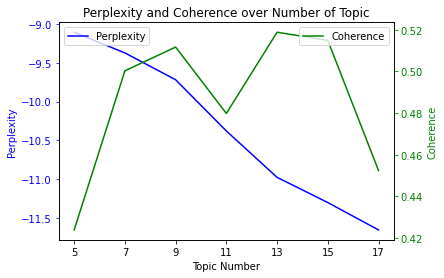

In [231]:
fig, ax1 = plt.subplots()

ax1.plot(perplexity_values, 'b', label='Perplexity')
ax1.set_xlabel('Topic Number')
ax1.set_ylabel('Perplexity', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()
ax2.plot(coherence_values, 'g', label='Coherence')
ax2.set_ylabel('Coherence', color='g')
ax2.tick_params('y', colors='g')

plt.title('Perplexity and Coherence over Number of Topic')

ax1.legend(loc=2)
ax2.legend(loc=1)

plt.xticks(range(len(topic_range)), topic_range)
plt.show()

### Best TFIDF LdaModel

#### Best Coherence Search

In [232]:
max_coherence = max(coherence_values)
max_coherence_index = coherence_values.index(max_coherence)
print(f"Best: {topic_range[max_coherence_index]} Topic")

best_tfidf_ldamodel = lda_list[max_coherence_index]

Best: 13 Topic


#### Print Topics

In [233]:
topics = best_tfidf_ldamodel.print_topics(num_topics=topic_num, num_words=word_num)
for topic in topics:
    print(topic)

(5, '0.034*"flower" + 0.013*"arrangement" + 0.013*"florist" + 0.012*"bouquet" + 0.011*"marshall"')
(7, '0.007*"service" + 0.006*"bike" + 0.006*"customer" + 0.005*"time" + 0.004*"work"')
(6, '0.019*"popcorn" + 0.006*"polish" + 0.006*"hill" + 0.006*"breakfast" + 0.006*"nail"')
(9, '0.012*"movie" + 0.009*"record" + 0.007*"delicious" + 0.007*"film" + 0.007*"rare"')
(10, '0.012*"mall" + 0.012*"food" + 0.012*"target" + 0.009*"grocery" + 0.008*"produce"')
(1, '0.015*"walgreens" + 0.013*"zia" + 0.012*"wynn" + 0.009*"bus" + 0.009*"eaton"')
(11, '0.028*"comic" + 0.014*"exhibit" + 0.008*"guide" + 0.007*"cozy" + 0.007*"curtain"')
(2, '0.014*"hair" + 0.009*"coke" + 0.007*"guitar" + 0.007*"stylist" + 0.006*"cut"')
(4, '0.022*"buffalo" + 0.015*"plant" + 0.012*"vons" + 0.009*"registry" + 0.008*"vegetarian"')
(8, '0.011*"jeweler" + 0.008*"ring" + 0.007*"engagement" + 0.007*"chapel" + 0.007*"comparable"')


####  Retrieving Topic Details

In [234]:
dic_topic_doc = {}

for index, doc in enumerate(doc_clean):
    #for doc in doc_clean:
    bow = dictionary.doc2bow(doc)
    
    #get topic distribution of the ldamodel
    t = best_tfidf_ldamodel.get_document_topics(bow)
    
    #sort the probability value in descending order to extract the top contributing topic id
    sorted_t = sorted(t, key=lambda x: x[1], reverse=True)
    
    #print only the filename 
    print(f"Document {index} Topic: {sorted_t}",)
    
    #get the top scoring item
    top_item = sorted_t.pop(0)
    
    #create dictionary and keep key as topic id and filename and probability in tuple as value
    dic_topic_doc.setdefault(top_item[0],[]).append((index, top_item[1]))

Document 0 Topic: [(7, 0.40404338), (0, 0.28629443), (1, 0.20061411), (2, 0.05183558), (5, 0.022984048), (3, 0.02276454)]
Document 1 Topic: [(7, 0.4809599), (0, 0.3733015), (9, 0.10909968)]
Document 2 Topic: [(0, 0.73327774), (9, 0.10780781), (4, 0.067691684), (10, 0.041480053), (8, 0.03163347)]
Document 3 Topic: [(0, 0.50563496), (7, 0.19645736), (4, 0.1874683), (10, 0.060737435), (9, 0.0330595)]
Document 4 Topic: [(7, 0.443376), (0, 0.3055889), (3, 0.09710602), (2, 0.056794167), (1, 0.043301016), (6, 0.029697295), (9, 0.0176306)]
Document 5 Topic: [(7, 0.904565), (10, 0.07373085)]
Document 6 Topic: [(7, 0.7589622), (5, 0.18462786)]
Document 7 Topic: [(7, 0.6241583), (0, 0.35019407)]
Document 8 Topic: [(7, 0.45535022), (0, 0.38972563), (2, 0.06723146), (8, 0.06051838), (3, 0.011262504), (4, 0.0105734905)]
Document 9 Topic: [(0, 0.8628239), (9, 0.076713584)]
Document 10 Topic: [(7, 0.52101547), (0, 0.17069447), (10, 0.13027048), (6, 0.07500726), (8, 0.05447032), (2, 0.03570846)]
Docume

Document 290 Topic: [(0, 0.43411276), (7, 0.38176137), (10, 0.113786854), (8, 0.04368453)]
Document 291 Topic: [(0, 0.6706235), (4, 0.14414777), (12, 0.09865497), (9, 0.053581785)]
Document 292 Topic: [(0, 0.7386091), (3, 0.071780935), (9, 0.071761906), (4, 0.07168099)]
Document 293 Topic: [(0, 0.613652), (10, 0.17702946), (9, 0.087106064), (5, 0.03727828), (2, 0.02514732), (6, 0.011957828), (8, 0.011747874), (1, 0.011655124), (11, 0.01145125), (4, 0.010463413)]
Document 294 Topic: [(7, 0.8900619), (12, 0.04943767), (10, 0.042180482)]
Document 295 Topic: [(0, 0.60909104), (7, 0.13994373), (10, 0.10199424), (4, 0.06489173), (6, 0.033637132), (8, 0.03358885)]
Document 296 Topic: [(7, 0.94069374), (2, 0.02542669), (12, 0.024716519)]
Document 297 Topic: [(7, 0.6740775), (0, 0.1264973), (9, 0.06443417), (3, 0.03898384), (2, 0.03367194), (6, 0.029398248), (12, 0.026934925)]
Document 298 Topic: [(7, 0.5564063), (11, 0.28525922), (0, 0.12169386)]
Document 299 Topic: [(0, 0.75526327), (5, 0.131

Document 581 Topic: [(0, 0.4044414), (10, 0.31948602), (7, 0.17892192), (5, 0.04143896), (1, 0.02633056), (6, 0.02304248)]
Document 582 Topic: [(0, 0.72565615), (2, 0.15338421), (10, 0.010996868), (7, 0.010996371), (1, 0.01099626), (3, 0.01099626), (4, 0.01099626), (5, 0.01099626), (6, 0.01099626), (8, 0.01099626), (9, 0.01099626), (11, 0.01099626), (12, 0.01099626)]
Document 583 Topic: [(0, 0.4884858), (10, 0.4409941)]
Document 584 Topic: [(10, 0.42532995), (7, 0.4207994), (1, 0.08974758)]
Document 585 Topic: [(0, 0.6162563), (10, 0.20657064), (7, 0.13178974), (5, 0.027617432)]
Document 586 Topic: [(7, 0.4051377), (0, 0.3700304), (9, 0.11079208), (10, 0.062282104), (5, 0.02705459), (2, 0.01897158)]
Document 587 Topic: [(0, 0.50948197), (10, 0.32272315), (1, 0.09785522)]
Document 588 Topic: [(0, 0.6718481), (12, 0.089809194), (2, 0.08792542), (10, 0.06725245), (7, 0.020855917), (5, 0.020264864), (6, 0.015981102), (4, 0.015467806)]
Document 589 Topic: [(0, 0.6698337), (10, 0.1623135), (

Document 906 Topic: [(7, 0.54464144), (0, 0.29512566), (2, 0.14385994)]
Document 907 Topic: [(7, 0.3885734), (0, 0.34726888), (6, 0.15663694), (10, 0.08088051)]
Document 908 Topic: [(7, 0.8744639), (0, 0.10629224)]
Document 909 Topic: [(7, 0.7306298), (0, 0.1988482)]
Document 910 Topic: [(0, 0.47959393), (7, 0.33575058), (4, 0.10767986)]
Document 911 Topic: [(0, 0.3551116), (7, 0.28779313), (10, 0.19836235), (2, 0.13894601)]
Document 912 Topic: [(0, 0.32408437), (10, 0.25813377), (7, 0.19990142), (2, 0.1563075), (9, 0.04104867)]
Document 913 Topic: [(7, 0.8398167), (8, 0.08965307)]
Document 914 Topic: [(7, 0.34322703), (0, 0.31232378), (10, 0.18742059), (2, 0.08653585), (6, 0.044843905)]
Document 915 Topic: [(0, 0.9702118)]
Document 916 Topic: [(0, 0.60082674), (3, 0.1925648), (7, 0.123555966), (1, 0.062043995)]
Document 917 Topic: [(0, 0.61565477), (7, 0.26028773), (1, 0.044949137), (10, 0.020960646), (2, 0.017522499), (9, 0.014210474), (3, 0.011993925), (6, 0.010131078)]
Document 918

Document 1238 Topic: [(7, 0.7927569), (2, 0.13026442)]
Document 1239 Topic: [(7, 0.6944013), (2, 0.15971066), (12, 0.086694136)]
Document 1240 Topic: [(7, 0.9167112), (9, 0.046481974)]
Document 1241 Topic: [(0, 0.67338794), (7, 0.1590229), (2, 0.14679167)]
Document 1242 Topic: [(0, 0.74744195), (7, 0.23454319)]
Document 1243 Topic: [(0, 0.8910693), (10, 0.048356265), (2, 0.022961168), (5, 0.02286737)]
Document 1244 Topic: [(0, 0.9290466), (6, 0.039596647)]
Document 1245 Topic: [(0, 0.9853443)]
Document 1246 Topic: [(0, 0.69226635), (10, 0.02564575), (7, 0.025644759), (1, 0.025644315), (2, 0.025644315), (3, 0.025644315), (4, 0.025644315), (5, 0.025644315), (6, 0.025644315), (8, 0.025644315), (9, 0.025644315), (11, 0.025644315), (12, 0.025644315)]
Document 1247 Topic: [(0, 0.7373085), (7, 0.1602239), (1, 0.059715826)]
Document 1248 Topic: [(0, 0.6726327), (7, 0.23599407), (8, 0.03456795), (5, 0.034457725)]
Document 1249 Topic: [(0, 0.78868246), (5, 0.17605199)]
Document 1250 Topic: [(0, 

Document 1607 Topic: [(0, 0.8608896), (1, 0.09452297), (10, 0.026686125)]
Document 1608 Topic: [(0, 0.9233241), (8, 0.06007426)]
Document 1609 Topic: [(0, 0.85142547), (2, 0.10417292), (11, 0.02561469)]
Document 1610 Topic: [(0, 0.66469926), (7, 0.18878552), (2, 0.08206442), (9, 0.040556274)]
Document 1611 Topic: [(0, 0.89967686), (2, 0.0545649), (7, 0.02328284), (6, 0.013468357)]
Document 1612 Topic: [(0, 0.6050959), (7, 0.13181892), (8, 0.06303794), (11, 0.060582854), (9, 0.05448959), (12, 0.026880108), (2, 0.026131894), (1, 0.014345022), (5, 0.013614456)]
Document 1613 Topic: [(0, 0.540946), (11, 0.11055042), (9, 0.10838738), (10, 0.06941757), (7, 0.051586993), (8, 0.051486466), (2, 0.046444923), (3, 0.0154281175)]
Document 1614 Topic: [(0, 0.71569514), (2, 0.10179822), (9, 0.07337244), (3, 0.032246698), (1, 0.030749666), (11, 0.030737977)]
Document 1615 Topic: [(0, 0.78653103), (2, 0.10743324), (7, 0.05073734), (11, 0.040557355)]
Document 1616 Topic: [(0, 0.5730306), (2, 0.26436824

Document 1953 Topic: [(0, 0.6292205), (7, 0.14396644), (10, 0.09581851), (6, 0.07744195), (2, 0.044618133)]
Document 1954 Topic: [(0, 0.45773202), (10, 0.3369536), (2, 0.1540233)]
Document 1955 Topic: [(0, 0.7217322), (10, 0.107843935), (7, 0.067008875), (11, 0.041862074), (2, 0.03956233)]
Document 1956 Topic: [(0, 0.69373816), (4, 0.11837059), (1, 0.053265642), (2, 0.043192055), (9, 0.041167285), (11, 0.029546816)]
Document 1957 Topic: [(0, 0.9230674)]
Document 1958 Topic: [(7, 0.40777695), (2, 0.40754652), (1, 0.10772287)]
Document 1959 Topic: [(0, 0.7540082), (6, 0.15371469), (11, 0.053800233)]
Document 1960 Topic: [(0, 0.707752), (8, 0.1696639), (7, 0.09051063)]
Document 1961 Topic: [(0, 0.66229147), (10, 0.17755023), (7, 0.10458502), (5, 0.01599411), (12, 0.015835356), (1, 0.015812626)]
Document 1962 Topic: [(7, 0.9538268)]
Document 1963 Topic: [(0, 0.43673354), (7, 0.3362167), (12, 0.096159354), (2, 0.043706927), (10, 0.036786236), (8, 0.03354662)]
Document 1964 Topic: [(0, 0.784

Document 2331 Topic: [(7, 0.5994369), (0, 0.25211632), (5, 0.11375249), (6, 0.021375502)]
Document 2332 Topic: [(0, 0.57844865), (7, 0.21636455), (5, 0.119698994)]
Document 2333 Topic: [(0, 0.4950392), (7, 0.16488366), (5, 0.14258456), (1, 0.05936097), (10, 0.033482477), (4, 0.032231465), (11, 0.030742254), (6, 0.03067918)]
Document 2334 Topic: [(7, 0.31809947), (0, 0.30717558), (10, 0.10514943), (5, 0.09806466), (11, 0.058141556), (4, 0.035467964), (12, 0.025074342), (6, 0.023831367), (9, 0.023183072)]
Document 2335 Topic: [(0, 0.5339949), (7, 0.20101224), (10, 0.15341498), (5, 0.086843826)]
Document 2336 Topic: [(7, 0.40118533), (0, 0.3891342), (5, 0.18636385)]
Document 2337 Topic: [(7, 0.47236356), (0, 0.35777932), (5, 0.07123655), (2, 0.05606661), (9, 0.027538339)]
Document 2338 Topic: [(0, 0.67305654), (5, 0.17312682), (2, 0.089707464)]
Document 2339 Topic: [(0, 0.5362255), (7, 0.198944), (5, 0.18573965), (11, 0.03422864), (2, 0.02049549), (4, 0.017457575)]
Document 2340 Topic: [(

Document 2669 Topic: [(0, 0.5494729), (7, 0.31942523), (3, 0.056342226), (6, 0.056039896)]
Document 2670 Topic: [(0, 0.64743644), (7, 0.23153712), (10, 0.05782127), (12, 0.038458478)]
Document 2671 Topic: [(0, 0.60488796), (7, 0.24648236), (10, 0.068149574), (6, 0.06689955)]
Document 2672 Topic: [(0, 0.5151102), (7, 0.37193137), (10, 0.045845777), (2, 0.04145738)]
Document 2673 Topic: [(0, 0.8262481), (7, 0.14645036)]
Document 2674 Topic: [(0, 0.9670293)]
Document 2675 Topic: [(0, 0.93514776), (2, 0.023976097), (12, 0.023774339)]
Document 2676 Topic: [(0, 0.92405623), (10, 0.028671838), (11, 0.027537687)]
Document 2677 Topic: [(0, 0.6959691), (3, 0.22992216), (7, 0.05662066)]
Document 2678 Topic: [(7, 0.3344366), (0, 0.31423184), (5, 0.08553982), (3, 0.07693473), (4, 0.07632149), (11, 0.05560803), (1, 0.039809246)]
Document 2679 Topic: [(7, 0.74615073), (0, 0.17927307), (10, 0.048505772), (4, 0.010134755), (11, 0.010127076)]
Document 2680 Topic: [(7, 0.90134114), (0, 0.04432988), (3, 0

Document 2965 Topic: [(0, 0.42898095), (2, 0.15513489), (3, 0.13559492), (10, 0.08698925), (7, 0.086126626), (9, 0.037054118), (8, 0.032723434), (1, 0.027527278)]
Document 2966 Topic: [(0, 0.5198658), (7, 0.14360046), (10, 0.13357358), (2, 0.10827958), (12, 0.0485289), (6, 0.030758444)]
Document 2967 Topic: [(7, 0.6297094), (0, 0.20038584), (6, 0.07122104), (9, 0.019231385), (3, 0.018557623), (1, 0.01834465), (4, 0.018104443), (5, 0.017797556)]
Document 2968 Topic: [(0, 0.44313532), (7, 0.4039789), (3, 0.08420747), (6, 0.040916)]
Document 2969 Topic: [(7, 0.61237794), (3, 0.10275183), (10, 0.08147822), (4, 0.069274105), (6, 0.067623645), (0, 0.048505124)]
Document 2970 Topic: [(0, 0.36967754), (7, 0.32762575), (3, 0.13320617), (2, 0.09713574), (10, 0.0188941), (1, 0.017604658), (6, 0.01679341), (11, 0.013481458)]
Document 2971 Topic: [(0, 0.49944246), (2, 0.25300285), (7, 0.1448633), (3, 0.044652272), (6, 0.03680749)]
Document 2972 Topic: [(0, 0.58760303), (2, 0.28784153), (6, 0.050538

Document 3300 Topic: [(0, 0.39544407), (7, 0.3902722), (5, 0.07907671), (2, 0.073969655), (9, 0.051466323)]
Document 3301 Topic: [(0, 0.54783565), (7, 0.33257732), (10, 0.08881033)]
Document 3302 Topic: [(0, 0.48808718), (7, 0.44439995), (10, 0.011310322), (3, 0.010923649), (12, 0.010419808), (5, 0.010375862), (8, 0.010375018), (9, 0.010371209)]
Document 3303 Topic: [(0, 0.897431)]
Document 3304 Topic: [(7, 0.44297788), (0, 0.4250012), (6, 0.056684196), (3, 0.02996932), (2, 0.029572109)]
Document 3305 Topic: [(0, 0.6248847), (7, 0.2822926), (10, 0.05617749)]
Document 3306 Topic: [(7, 0.587788), (0, 0.33332926), (2, 0.026865207), (3, 0.02619447), (8, 0.010358933), (6, 0.010282088)]
Document 3307 Topic: [(0, 0.6006127), (7, 0.28469563), (3, 0.08524328), (5, 0.017903574)]
Document 3308 Topic: [(0, 0.7863374), (3, 0.119636975)]
Document 3309 Topic: [(7, 0.52533525), (0, 0.33598012), (3, 0.047637742), (10, 0.032835893), (12, 0.020632654), (2, 0.018355396), (1, 0.014090628)]
Document 3310 To

Document 3673 Topic: [(0, 0.8812783), (2, 0.056545023), (7, 0.04678169)]
Document 3674 Topic: [(0, 0.8862476), (2, 0.0639666)]
Document 3675 Topic: [(7, 0.9042986), (9, 0.04439392), (0, 0.035272397)]
Document 3676 Topic: [(7, 0.6137541), (0, 0.3333942), (10, 0.033110224)]
Document 3677 Topic: [(7, 0.7388146), (0, 0.12574956), (4, 0.051248986), (8, 0.05120449)]
Document 3678 Topic: [(7, 0.7059712), (0, 0.19907226), (5, 0.036452767), (3, 0.03616127)]
Document 3679 Topic: [(0, 0.7766278), (7, 0.14642711)]
Document 3680 Topic: [(0, 0.8068047), (7, 0.09224326), (1, 0.053174317), (6, 0.029549045)]
Document 3681 Topic: [(7, 0.85450965), (10, 0.08905477)]
Document 3682 Topic: [(7, 0.58989173), (0, 0.26761702), (10, 0.10402589), (2, 0.025085794)]
Document 3683 Topic: [(7, 0.35596532), (10, 0.2788212), (0, 0.17460282), (9, 0.05535217), (1, 0.049433425), (8, 0.04922914), (6, 0.025600098)]
Document 3684 Topic: [(10, 0.7753838), (0, 0.13053003)]
Document 3685 Topic: [(0, 0.53872585), (10, 0.3554857

Document 4043 Topic: [(7, 0.6757704), (0, 0.24079317), (2, 0.035554297), (3, 0.027495584)]
Document 4044 Topic: [(0, 0.47787714), (7, 0.38352692), (10, 0.044471648), (2, 0.040399928), (9, 0.026330663), (11, 0.018254476)]
Document 4045 Topic: [(0, 0.68525743), (7, 0.17235047), (9, 0.064559676), (5, 0.033263072), (11, 0.019172745), (1, 0.01684258)]
Document 4046 Topic: [(7, 0.74571556), (0, 0.22173096)]
Document 4047 Topic: [(7, 0.44805023), (0, 0.3787608), (1, 0.049484737), (2, 0.04474069), (3, 0.033021666), (9, 0.017711509), (11, 0.0125063015), (8, 0.011912767)]
Document 4048 Topic: [(7, 0.5399795), (0, 0.20409745), (9, 0.12776284), (5, 0.046570193), (2, 0.038487516), (6, 0.030574696)]
Document 4049 Topic: [(0, 0.46357155), (7, 0.29619747), (8, 0.06729682), (5, 0.06724799), (2, 0.06720942)]
Document 4050 Topic: [(0, 0.48144558), (7, 0.28022572), (9, 0.124010235), (6, 0.045607552), (3, 0.029367302), (2, 0.026517672)]
Document 4051 Topic: [(0, 0.66143495), (9, 0.1178443), (7, 0.06384824)

Document 4402 Topic: [(7, 0.710408), (0, 0.118919805), (9, 0.09132462), (2, 0.02485135), (1, 0.022090008), (3, 0.015338235), (5, 0.012152451)]
Document 4403 Topic: [(0, 0.7861155), (6, 0.09030473), (11, 0.046819065), (2, 0.046648216)]
Document 4404 Topic: [(0, 0.6341238), (7, 0.29938668), (2, 0.025372898), (3, 0.025011411)]
Document 4405 Topic: [(0, 0.6850183), (2, 0.12919395), (9, 0.06581316), (5, 0.039709665), (7, 0.03823814), (8, 0.019717606), (4, 0.014973927)]
Document 4406 Topic: [(0, 0.6971875), (7, 0.09235452), (2, 0.046695832), (11, 0.03796571), (9, 0.0361524), (3, 0.031660292), (6, 0.013975659), (8, 0.0126591455), (4, 0.012378672), (5, 0.0118982885)]
Document 4407 Topic: [(7, 0.6776094), (0, 0.21297197), (12, 0.041395452), (6, 0.041386504)]
Document 4408 Topic: [(7, 0.8076385), (3, 0.10768599)]
Document 4409 Topic: [(0, 0.84381455), (3, 0.043061823), (12, 0.04304253), (5, 0.042359103)]
Document 4410 Topic: [(0, 0.5759337), (7, 0.2108628), (10, 0.087393925), (3, 0.051133383), (

Document 4756 Topic: [(7, 0.44904542), (0, 0.3557907), (2, 0.056296594), (12, 0.054643426), (3, 0.041905656), (11, 0.02813996)]
Document 4757 Topic: [(0, 0.7315995), (11, 0.15683971), (10, 0.07490964), (8, 0.024499243)]
Document 4758 Topic: [(0, 0.7078605), (11, 0.10839959), (10, 0.086702846), (7, 0.070388064)]
Document 4759 Topic: [(0, 0.47110102), (7, 0.41578722), (2, 0.06784996)]
Document 4760 Topic: [(7, 0.82890797), (10, 0.06610599), (6, 0.05500912), (2, 0.03266237)]
Document 4761 Topic: [(0, 0.40079892), (7, 0.39359134), (10, 0.08727145), (9, 0.049557436), (8, 0.02754951), (12, 0.027416194)]
Document 4762 Topic: [(0, 0.6671729), (2, 0.12979472), (10, 0.12931192), (5, 0.058305643)]
Document 4763 Topic: [(7, 0.48796496), (0, 0.36745927), (1, 0.074190326), (5, 0.04564995)]
Document 4764 Topic: [(0, 0.5891679), (7, 0.10766712), (12, 0.077959225), (10, 0.07548461), (1, 0.059925165), (3, 0.059823383)]
Document 4765 Topic: [(0, 0.55467933), (7, 0.28212687), (12, 0.07043514), (10, 0.0288

Document 5165 Topic: [(0, 0.8038615), (9, 0.10433078), (5, 0.05330752)]
Document 5166 Topic: [(0, 0.77449167), (10, 0.12394632), (12, 0.039885744), (11, 0.03602383)]
Document 5167 Topic: [(0, 0.69816095), (7, 0.08457457), (2, 0.08293732), (9, 0.07416266), (4, 0.038172476)]
Document 5168 Topic: [(0, 0.582278), (7, 0.15866706), (9, 0.122730225), (11, 0.07438787), (10, 0.03202845), (12, 0.019931214)]
Document 5169 Topic: [(0, 0.47185743), (2, 0.23144352), (9, 0.11209534), (3, 0.07177904), (6, 0.071778245)]
Document 5170 Topic: [(0, 0.8356796), (7, 0.04693585), (10, 0.03362404), (5, 0.032637805), (11, 0.032452725)]
Document 5171 Topic: [(0, 0.7749727), (9, 0.08298191), (8, 0.08284575)]
Document 5172 Topic: [(0, 0.46617866), (7, 0.30210665), (10, 0.080689795), (9, 0.061946414), (5, 0.05667554)]
Document 5173 Topic: [(0, 0.5554451), (7, 0.28526282), (10, 0.049597774), (6, 0.025435975), (2, 0.022123285), (9, 0.017873354), (12, 0.013452634), (11, 0.013450059)]
Document 5174 Topic: [(0, 0.53594

Document 5598 Topic: [(7, 0.5993473), (0, 0.27072433), (2, 0.053118944), (3, 0.046690986)]
Document 5599 Topic: [(0, 0.5437646), (10, 0.21339628), (7, 0.08647323), (8, 0.04759378), (2, 0.033705246), (9, 0.03122654), (5, 0.03063078)]
Document 5600 Topic: [(0, 0.6460679), (10, 0.12145502), (6, 0.10097784), (9, 0.0723429), (4, 0.02388889), (11, 0.023288628)]
Document 5601 Topic: [(0, 0.5201202), (10, 0.20306177), (7, 0.08918889), (9, 0.07104544), (2, 0.039860014), (6, 0.034539726), (4, 0.024551252), (8, 0.013309235)]
Document 5602 Topic: [(0, 0.7357734), (10, 0.11658495), (8, 0.04070216), (5, 0.027872192), (6, 0.023894714), (4, 0.023139594), (9, 0.022607224)]
Document 5603 Topic: [(0, 0.5888479), (10, 0.23519748), (9, 0.09453524), (8, 0.06104454)]
Document 5604 Topic: [(10, 0.47268215), (0, 0.41348565), (2, 0.08424137)]
Document 5605 Topic: [(0, 0.8601942), (6, 0.07405141), (2, 0.03825501)]
Document 5606 Topic: [(0, 0.44636065), (7, 0.269308), (10, 0.13785249), (9, 0.047787737), (6, 0.044

Document 5944 Topic: [(0, 0.90713716), (10, 0.035242602), (9, 0.033574414)]
Document 5945 Topic: [(0, 0.5787441), (7, 0.21126318), (10, 0.15297633), (3, 0.034671288)]
Document 5946 Topic: [(7, 0.5012203), (0, 0.40040398), (2, 0.07272451)]
Document 5947 Topic: [(0, 0.74438655), (10, 0.07792684), (2, 0.0672189), (9, 0.067182794)]
Document 5948 Topic: [(0, 0.7141075), (7, 0.19997254), (2, 0.069188856)]
Document 5949 Topic: [(7, 0.9230724)]
Document 5950 Topic: [(7, 0.92306453)]
Document 5951 Topic: [(0, 0.48146054), (7, 0.38803586), (10, 0.08928795), (2, 0.023041168)]
Document 5952 Topic: [(0, 0.9163392), (2, 0.04686361)]
Document 5953 Topic: [(7, 0.6865985), (0, 0.22709021), (9, 0.038020164), (3, 0.017631305), (6, 0.0145914685), (2, 0.010980952)]
Document 5954 Topic: [(7, 0.71120787), (10, 0.21184847)]
Document 5955 Topic: [(0, 0.6712), (7, 0.21504013), (9, 0.082982615)]
Document 5956 Topic: [(0, 0.5020393), (7, 0.4261314), (2, 0.027658116), (6, 0.026855813)]
Document 5957 Topic: [(0, 0.

Document 6349 Topic: [(0, 0.8693917), (7, 0.08354987)]
Document 6350 Topic: [(7, 0.38722533), (10, 0.25727198), (0, 0.22805613), (2, 0.0651431), (6, 0.019229786), (8, 0.017957803), (1, 0.017542496)]
Document 6351 Topic: [(0, 0.5531874), (10, 0.25688344), (7, 0.13863026)]
Document 6352 Topic: [(0, 0.56861407), (10, 0.2775244), (6, 0.08973979)]
Document 6353 Topic: [(0, 0.51744556), (10, 0.22559246), (2, 0.06902014), (7, 0.06054706), (8, 0.0548132), (6, 0.041472603), (9, 0.024780527)]
Document 6354 Topic: [(0, 0.7946758), (10, 0.12120532), (7, 0.065352224)]
Document 6355 Topic: [(0, 0.6739457), (10, 0.21378043), (6, 0.07476248), (7, 0.026338583)]
Document 6356 Topic: [(10, 0.7692113), (0, 0.019232523), (7, 0.019232497), (9, 0.019232485), (2, 0.01923243), (5, 0.019232366), (1, 0.019232338), (3, 0.019232338), (4, 0.019232338), (6, 0.019232338), (8, 0.019232338), (11, 0.019232338), (12, 0.019232338)]
Document 6357 Topic: [(7, 0.6702156), (2, 0.14004509), (6, 0.10325545), (8, 0.053506617)]
D

Document 6742 Topic: [(0, 0.7266197), (10, 0.20677875), (7, 0.047360633)]
Document 6743 Topic: [(0, 0.63900733), (10, 0.15237403), (9, 0.06564346), (5, 0.06400702), (11, 0.055283174)]
Document 6744 Topic: [(0, 0.58146554), (10, 0.3503879), (11, 0.039647073)]
Document 6745 Topic: [(0, 0.37504238), (10, 0.31421527), (7, 0.1634695), (11, 0.08955283)]
Document 6746 Topic: [(7, 0.5473271), (0, 0.37032896), (2, 0.060969956)]
Document 6747 Topic: [(0, 0.7065304), (10, 0.14263625), (7, 0.08548096), (9, 0.03969534)]
Document 6748 Topic: [(0, 0.91158134), (2, 0.047214545), (8, 0.024104046)]
Document 6749 Topic: [(0, 0.66792125), (7, 0.19934629), (6, 0.06984739), (11, 0.047145423)]
Document 6750 Topic: [(0, 0.5556707), (7, 0.17161345), (10, 0.06888955), (2, 0.05384624), (1, 0.053392194), (5, 0.04454218), (8, 0.03003192), (9, 0.01643056)]
Document 6751 Topic: [(0, 0.6751985), (7, 0.16261108), (6, 0.08529978), (8, 0.029894864), (12, 0.02989423)]
Document 6752 Topic: [(10, 0.815398), (0, 0.015383594

Document 7111 Topic: [(0, 0.5034687), (7, 0.3511155), (2, 0.060911912), (5, 0.051527623)]
Document 7112 Topic: [(0, 0.45237252), (7, 0.4104143), (10, 0.041710615), (9, 0.037176065), (12, 0.03708981)]
Document 7113 Topic: [(7, 0.44640195), (0, 0.4305284), (5, 0.07177802)]
Document 7114 Topic: [(0, 0.7626814), (7, 0.114608504), (9, 0.097058065)]
Document 7115 Topic: [(7, 0.60577065), (0, 0.313639), (2, 0.022962654), (12, 0.022405233), (4, 0.022397667)]
Document 7116 Topic: [(7, 0.8432977), (10, 0.091597155)]
Document 7117 Topic: [(0, 0.48187748), (7, 0.30728984), (10, 0.13042368), (12, 0.048929874)]
Document 7118 Topic: [(0, 0.75647783), (2, 0.08970731), (8, 0.08970419)]
Document 7119 Topic: [(7, 0.7916652), (0, 0.18343899)]
Document 7120 Topic: [(0, 0.5594992), (7, 0.3799865)]
Document 7121 Topic: [(0, 0.73437494), (4, 0.0979528), (9, 0.097718455)]
Document 7122 Topic: [(0, 0.67097396), (2, 0.17323336), (4, 0.11304528)]
Document 7123 Topic: [(0, 0.76297784), (4, 0.2031595)]
Document 712

Document 7504 Topic: [(0, 0.5387356), (7, 0.31320503), (8, 0.05945155), (11, 0.047209233), (5, 0.031925157)]
Document 7505 Topic: [(7, 0.52640545), (8, 0.20456368), (0, 0.109005675), (5, 0.0853355), (3, 0.05758834)]
Document 7506 Topic: [(0, 0.4422778), (7, 0.3497906), (2, 0.07531879), (9, 0.043639045), (3, 0.03620867), (5, 0.02489093), (1, 0.022795394)]
Document 7507 Topic: [(0, 0.48995572), (7, 0.28641528), (9, 0.09035342), (10, 0.06003282), (11, 0.046438813)]
Document 7508 Topic: [(0, 0.6925214), (7, 0.23096538), (2, 0.050865706)]
Document 7509 Topic: [(7, 0.6345627), (0, 0.25171757), (3, 0.04302846), (9, 0.042991385)]
Document 7510 Topic: [(0, 0.66917926), (10, 0.25389373)]
Document 7511 Topic: [(0, 0.59314865), (7, 0.18558809), (10, 0.14885263), (12, 0.028308267), (3, 0.02789696)]
Document 7512 Topic: [(0, 0.75299543), (4, 0.095525675), (5, 0.074069224), (9, 0.05575379)]
Document 7513 Topic: [(0, 0.44436365), (7, 0.19838871), (3, 0.13440259), (5, 0.07674204), (12, 0.06222957), (2,

Document 7907 Topic: [(0, 0.74497366), (7, 0.118796036), (9, 0.039537173), (2, 0.031807642), (3, 0.02401824), (11, 0.023715008), (12, 0.011841026)]
Document 7908 Topic: [(0, 0.8448002), (7, 0.07704872), (8, 0.04877277), (10, 0.018384194)]
Document 7909 Topic: [(0, 0.687662), (7, 0.17271124), (10, 0.09648032), (5, 0.017630275), (1, 0.01572409)]
Document 7910 Topic: [(0, 0.7434475), (7, 0.09232496), (6, 0.0423604), (8, 0.041798133), (5, 0.03759332), (3, 0.017561799), (12, 0.017337134)]
Document 7911 Topic: [(7, 0.3161145), (8, 0.31467414), (9, 0.21531358), (11, 0.0153901875), (0, 0.015389958), (6, 0.015389851), (5, 0.015389753), (1, 0.0153896725), (2, 0.0153896725), (3, 0.0153896725), (4, 0.0153896725), (10, 0.0153896725), (12, 0.0153896725)]
Document 7912 Topic: [(7, 0.6556223), (0, 0.2462892), (8, 0.053422365), (5, 0.03312081)]
Document 7913 Topic: [(7, 0.50101084), (0, 0.39798385), (10, 0.042064305), (6, 0.035854343)]
Document 7914 Topic: [(0, 0.60857165), (7, 0.27607676), (2, 0.06726

Document 8248 Topic: [(7, 0.7621555), (0, 0.19682343), (11, 0.015548177), (9, 0.015435995)]
Document 8249 Topic: [(0, 0.5675563), (7, 0.16786209), (9, 0.15465263), (10, 0.04825761), (6, 0.038847208)]
Document 8250 Topic: [(7, 0.5025317), (0, 0.39046904), (9, 0.04804808), (4, 0.03586716)]
Document 8251 Topic: [(0, 0.6180154), (7, 0.19796117), (9, 0.06455436), (2, 0.044445053), (6, 0.035945967), (8, 0.016509075), (3, 0.015778163)]
Document 8252 Topic: [(0, 0.8447018), (7, 0.065187804), (10, 0.03959774), (11, 0.03072494)]
Document 8253 Topic: [(0, 0.8519414), (10, 0.04462576), (9, 0.044104952), (7, 0.031377014), (6, 0.018762767)]
Document 8254 Topic: [(0, 0.5356214), (7, 0.1502938), (2, 0.1473946), (9, 0.12231832), (6, 0.030051988)]
Document 8255 Topic: [(7, 0.6363435), (10, 0.3334273)]
Document 8256 Topic: [(0, 0.6165259), (7, 0.09661937), (10, 0.09601645), (9, 0.052257843), (2, 0.04054024), (3, 0.03831063), (11, 0.03159516), (8, 0.02136765)]
Document 8257 Topic: [(7, 0.46620077), (0, 0.

Document 8603 Topic: [(7, 0.48846972), (0, 0.3142761), (9, 0.09168603), (2, 0.04438289), (10, 0.03427736), (5, 0.017927786)]
Document 8604 Topic: [(0, 0.71979046), (9, 0.21976507)]
Document 8605 Topic: [(0, 0.5770788), (7, 0.397267)]
Document 8606 Topic: [(0, 0.77465564), (7, 0.08122279), (10, 0.055622276), (3, 0.053850364)]
Document 8607 Topic: [(0, 0.7945629), (7, 0.060713053), (8, 0.057939254), (9, 0.038172755), (5, 0.020303449), (11, 0.018857082)]
Document 8608 Topic: [(7, 0.3878996), (0, 0.30513686), (9, 0.11995065), (10, 0.105383135), (8, 0.06293873)]
Document 8609 Topic: [(0, 0.66259), (7, 0.1625672), (8, 0.13986418)]
Document 8610 Topic: [(0, 0.74389833), (2, 0.14451827), (10, 0.052620664), (8, 0.036612354)]
Document 8611 Topic: [(0, 0.52211773), (7, 0.4174243)]
Document 8612 Topic: [(0, 0.75250185), (2, 0.095323086), (8, 0.07852011), (12, 0.04478917)]
Document 8613 Topic: [(0, 0.47765046), (7, 0.20332351), (10, 0.18473633), (9, 0.05355225), (2, 0.052727085)]
Document 8614 Topi

Document 9004 Topic: [(0, 0.62784976), (10, 0.18062589), (4, 0.0811551), (11, 0.06326282), (6, 0.034002833)]
Document 9005 Topic: [(0, 0.6729247), (4, 0.19524407), (11, 0.07687724)]
Document 9006 Topic: [(0, 0.43393505), (10, 0.17202143), (7, 0.1427483), (4, 0.123655446), (11, 0.07419718), (9, 0.02543343), (6, 0.019608108)]
Document 9007 Topic: [(0, 0.7236384), (7, 0.15613636), (10, 0.069588795), (4, 0.030800028)]
Document 9008 Topic: [(0, 0.75769657), (10, 0.09186087), (5, 0.07777866), (7, 0.04039549), (3, 0.020647878)]
Document 9009 Topic: [(0, 0.8217361), (7, 0.15761897)]
Document 9010 Topic: [(7, 0.54148096), (0, 0.3580108), (10, 0.07200935)]
Document 9011 Topic: [(7, 0.57750016), (0, 0.3857022)]
Document 9012 Topic: [(7, 0.50900906), (0, 0.25124082), (2, 0.06585063), (10, 0.046555795), (8, 0.039685797), (3, 0.034082357), (5, 0.023287438), (9, 0.015699515)]
Document 9013 Topic: [(0, 0.5651261), (10, 0.31872088), (9, 0.068058655)]
Document 9014 Topic: [(0, 0.46676326), (10, 0.230609

Document 9413 Topic: [(0, 0.8805401), (1, 0.06138585), (2, 0.04268217)]
Document 9414 Topic: [(0, 0.4669277), (7, 0.2429506), (2, 0.13426752), (9, 0.05376997), (1, 0.049474835), (11, 0.039768152)]
Document 9415 Topic: [(0, 0.4970239), (7, 0.31955278), (10, 0.042076133), (2, 0.04181476), (11, 0.027900234), (6, 0.023591852), (9, 0.021367224), (1, 0.015773196)]
Document 9416 Topic: [(0, 0.6297821), (7, 0.27533093), (5, 0.039430156), (10, 0.038965475)]
Document 9417 Topic: [(0, 0.6922335), (10, 0.025647625), (7, 0.025647335), (1, 0.025647158), (2, 0.025647158), (3, 0.025647158), (4, 0.025647158), (5, 0.025647158), (6, 0.025647158), (8, 0.025647158), (9, 0.025647158), (11, 0.025647158), (12, 0.025647158)]
Document 9418 Topic: [(0, 0.77462804), (2, 0.17835656)]
Document 9419 Topic: [(0, 0.4863741), (7, 0.3915692), (3, 0.040651195), (8, 0.035344556), (11, 0.02775471), (6, 0.01109285)]
Document 9420 Topic: [(0, 0.6054952), (12, 0.22041818), (2, 0.056625877), (10, 0.039557625), (1, 0.039478775)

Document 9809 Topic: [(0, 0.5455959), (7, 0.24149086), (6, 0.059814043), (8, 0.05974104), (9, 0.059129052)]
Document 9810 Topic: [(7, 0.60336566), (0, 0.28663346), (9, 0.044457313), (10, 0.013246501), (3, 0.012755858), (4, 0.01189668), (6, 0.01172734), (11, 0.011635123)]
Document 9811 Topic: [(0, 0.6406665), (7, 0.10881731), (11, 0.09055785), (9, 0.056391332), (2, 0.04142279), (1, 0.041417304)]
Document 9812 Topic: [(0, 0.77002656), (7, 0.10582933), (8, 0.078821264), (2, 0.027557975)]
Document 9813 Topic: [(0, 0.89176756), (3, 0.07688688)]
Document 9814 Topic: [(0, 0.7458268), (7, 0.085011445), (10, 0.046249624), (9, 0.042775054), (6, 0.028527873), (1, 0.021257097), (8, 0.01532675), (12, 0.011053258)]
Document 9815 Topic: [(0, 0.776381), (8, 0.1109392), (2, 0.0777014)]
Document 9816 Topic: [(7, 0.5139852), (0, 0.25862053), (11, 0.06696659), (2, 0.05918135), (10, 0.046214428), (3, 0.037647992)]
Document 9817 Topic: [(0, 0.78959334), (7, 0.06604679), (5, 0.045233253), (3, 0.04326376), (1

Document 10149 Topic: [(0, 0.73892933), (9, 0.06636163), (10, 0.049084477), (7, 0.034985796), (11, 0.023056649), (3, 0.020949228), (5, 0.020702427), (12, 0.02065383), (6, 0.01935232)]
Document 10150 Topic: [(0, 0.58201087), (7, 0.1468846), (10, 0.090000145), (9, 0.074500926), (8, 0.03174616), (4, 0.020195812), (2, 0.016421843), (3, 0.015790189), (1, 0.010827017)]
Document 10151 Topic: [(0, 0.53436947), (7, 0.16472693), (9, 0.079344355), (10, 0.07449705), (2, 0.05944575), (11, 0.03894156), (1, 0.03155382), (8, 0.012937044)]
Document 10152 Topic: [(0, 0.6186387), (10, 0.2602293), (7, 0.103234544)]
Document 10153 Topic: [(0, 0.6220522), (7, 0.15402198), (9, 0.11519249), (2, 0.07413448), (6, 0.023402136)]
Document 10154 Topic: [(0, 0.6961992), (7, 0.09428322), (9, 0.09060892), (10, 0.059075583), (12, 0.04615144)]
Document 10155 Topic: [(0, 0.2991036), (7, 0.28000802), (10, 0.21182403), (9, 0.067655005), (12, 0.05500711), (2, 0.023172386), (5, 0.019477457), (4, 0.01917887), (1, 0.019073987)

Document 10564 Topic: [(0, 0.40149134), (7, 0.28450167), (5, 0.17969476), (2, 0.047200978), (9, 0.034158505), (4, 0.023403974), (11, 0.01950656)]
Document 10565 Topic: [(0, 0.90882844), (7, 0.04938949), (6, 0.024291635)]
Document 10566 Topic: [(0, 0.7439552), (2, 0.09436414), (11, 0.064773664), (5, 0.056551807), (6, 0.026031872)]
Document 10567 Topic: [(0, 0.782002), (9, 0.06583801), (2, 0.054223876), (7, 0.030610949), (8, 0.028809756), (1, 0.025628636)]
Document 10568 Topic: [(7, 0.74969375), (10, 0.096375726), (3, 0.089778386)]
Document 10569 Topic: [(7, 0.9340549)]
Document 10570 Topic: [(7, 0.45162177), (0, 0.37340182), (10, 0.08022026), (9, 0.032715097), (3, 0.019089624), (5, 0.01669288), (8, 0.015453759)]
Document 10571 Topic: [(0, 0.44270334), (7, 0.2008576), (10, 0.10417232), (2, 0.077986434), (12, 0.07701515), (9, 0.049483944), (3, 0.024081735), (1, 0.017590322)]
Document 10572 Topic: [(0, 0.65486485), (7, 0.22211869), (3, 0.071680635)]
Document 10573 Topic: [(0, 0.8361769), (

Document 10971 Topic: [(0, 0.42330548), (7, 0.41209662), (10, 0.09801387), (12, 0.019208401), (4, 0.019106725), (3, 0.018643474)]
Document 10972 Topic: [(7, 0.6796773), (0, 0.18812208), (10, 0.08225237), (5, 0.019835582), (9, 0.019311687)]
Document 10973 Topic: [(7, 0.58912104), (0, 0.28841925), (9, 0.04877883), (3, 0.044822913)]
Document 10974 Topic: [(7, 0.89317507), (9, 0.059809435)]
Document 10975 Topic: [(7, 0.8080895), (3, 0.08536825), (11, 0.057703435), (4, 0.029591141)]
Document 10976 Topic: [(0, 0.6613825), (7, 0.15397464), (3, 0.10769138)]
Document 10977 Topic: [(0, 0.91607296)]
Document 10978 Topic: [(7, 0.7736755), (12, 0.062776834), (10, 0.04948987), (1, 0.03259542), (4, 0.03258062), (9, 0.03255522)]
Document 10979 Topic: [(0, 0.5909492), (7, 0.38340452)]
Document 10980 Topic: [(0, 0.50727904), (7, 0.19496016), (9, 0.11080589), (2, 0.09287308), (10, 0.037403896), (1, 0.017482415), (3, 0.017313536), (5, 0.015662206)]
Document 10981 Topic: [(0, 0.6502886), (7, 0.20131877), (

Document 11378 Topic: [(0, 0.7385876), (11, 0.13827659), (1, 0.07181946)]
Document 11379 Topic: [(0, 0.44989976), (7, 0.42646077), (5, 0.046766046), (8, 0.04676029)]
Document 11380 Topic: [(0, 0.7886037), (7, 0.11842542), (11, 0.06167749), (10, 0.020635895)]
Document 11381 Topic: [(0, 0.75298226), (2, 0.14373122), (8, 0.040190447), (11, 0.03835872)]
Document 11382 Topic: [(0, 0.88058555), (2, 0.053124532), (11, 0.053023167)]
Document 11383 Topic: [(0, 0.8608748), (12, 0.051247235), (11, 0.051240776)]
Document 11384 Topic: [(0, 0.7365853), (11, 0.12930623), (6, 0.06399343), (7, 0.051393233)]
Document 11385 Topic: [(0, 0.7622709), (7, 0.1315475), (11, 0.055881046), (6, 0.03770049)]
Document 11386 Topic: [(0, 0.6783876), (7, 0.15898784), (9, 0.054600473), (11, 0.038600247), (10, 0.030047785), (6, 0.02623079)]
Document 11387 Topic: [(0, 0.5615594), (7, 0.37681934), (9, 0.035966445)]
Document 11388 Topic: [(0, 0.7994823), (7, 0.14845866), (10, 0.028525159), (4, 0.014290374)]
Document 11389 

Document 11789 Topic: [(0, 0.51821053), (7, 0.22471398), (6, 0.09437269), (10, 0.08577116), (1, 0.04895203)]
Document 11790 Topic: [(0, 0.6719453), (7, 0.23977973), (9, 0.03492162), (6, 0.032355897)]
Document 11791 Topic: [(0, 0.5694849), (10, 0.3740865)]
Document 11792 Topic: [(0, 0.41935545), (7, 0.23633237), (3, 0.12190724), (1, 0.08092559), (6, 0.06682158), (10, 0.0604803)]
Document 11793 Topic: [(7, 0.44579154), (0, 0.26825532), (9, 0.2159991)]
Document 11794 Topic: [(7, 0.77324986), (2, 0.14191797), (12, 0.04655157), (11, 0.023852194)]
Document 11795 Topic: [(0, 0.63782835), (2, 0.28526175), (12, 0.04485362)]
Document 11796 Topic: [(7, 0.6547295), (2, 0.17669003), (0, 0.105441585), (12, 0.026371323), (8, 0.023381962)]
Document 11797 Topic: [(7, 0.44896552), (0, 0.3411198), (10, 0.074144244), (2, 0.05419652), (6, 0.028961662), (9, 0.015107616), (8, 0.01151272)]
Document 11798 Topic: [(0, 0.47075722), (2, 0.24443755), (12, 0.10777886), (8, 0.10775683)]
Document 11799 Topic: [(0, 0.

Document 12175 Topic: [(12, 0.39954072), (0, 0.37643784), (10, 0.1285205), (9, 0.060834415)]
Document 12176 Topic: [(0, 0.58497715), (7, 0.14867713), (5, 0.06632524), (8, 0.063567065), (12, 0.060603693), (3, 0.059523944)]
Document 12177 Topic: [(7, 0.62308943), (0, 0.16572051), (9, 0.067010075), (12, 0.05748296), (4, 0.03466024), (11, 0.034653977)]
Document 12178 Topic: [(0, 0.58103585), (12, 0.22675486), (9, 0.1131326), (3, 0.0592894)]
Document 12179 Topic: [(0, 0.46071586), (7, 0.32130197), (5, 0.11483423), (2, 0.06668286)]
Document 12180 Topic: [(7, 0.4640465), (0, 0.41825217), (8, 0.022710197), (2, 0.02187327), (1, 0.02083148), (10, 0.019831553), (11, 0.014197847)]
Document 12181 Topic: [(7, 0.5511948), (0, 0.21049932), (9, 0.10065657), (2, 0.083162196), (1, 0.034616005)]
Document 12182 Topic: [(0, 0.58409727), (7, 0.27121028), (9, 0.09331593), (2, 0.031586166)]
Document 12183 Topic: [(7, 0.69305044), (0, 0.09927254), (2, 0.091267966), (10, 0.050893996), (8, 0.021146107), (9, 0.017

Document 12586 Topic: [(0, 0.51841134), (5, 0.16658425), (8, 0.08655147), (7, 0.0747392), (3, 0.04486979), (4, 0.04484439), (9, 0.04474233)]
Document 12587 Topic: [(0, 0.6886425), (7, 0.11608399), (1, 0.06501033), (9, 0.064947024), (10, 0.046055593)]
Document 12588 Topic: [(0, 0.75338995), (7, 0.100595), (5, 0.04329918), (1, 0.025186595), (2, 0.023104822), (3, 0.02240696), (8, 0.022389244)]
Document 12589 Topic: [(0, 0.51626146), (7, 0.36527452), (10, 0.03845699), (9, 0.029731018), (6, 0.018194284), (2, 0.0152775105), (1, 0.012316345)]
Document 12590 Topic: [(0, 0.35982835), (7, 0.35501626), (5, 0.21273491), (10, 0.030186923), (8, 0.026841229)]
Document 12591 Topic: [(0, 0.66225773), (7, 0.2671924)]
Document 12592 Topic: [(7, 0.49220765), (0, 0.3960734), (8, 0.040336948), (3, 0.018834393), (2, 0.018702516), (9, 0.014403624), (4, 0.01359243)]
Document 12593 Topic: [(0, 0.62277234), (9, 0.15100078), (11, 0.10725004), (7, 0.10075267)]
Document 12594 Topic: [(0, 0.6716607), (7, 0.20669487)

Document 13018 Topic: [(0, 0.87634355), (10, 0.06934628), (11, 0.031676996)]
Document 13019 Topic: [(0, 0.63362277), (7, 0.22007284), (5, 0.06852582), (12, 0.041584503), (1, 0.014486341), (6, 0.014425638)]
Document 13020 Topic: [(0, 0.8812452), (10, 0.047734976), (1, 0.041417826)]
Document 13021 Topic: [(0, 0.86480474), (10, 0.07573634), (1, 0.034635283)]
Document 13022 Topic: [(0, 0.5232302), (7, 0.30893946), (1, 0.09789078)]
Document 13023 Topic: [(7, 0.56537235), (0, 0.26459897), (2, 0.08931222), (8, 0.020770915), (10, 0.017687017), (9, 0.014031986), (6, 0.013362628)]
Document 13024 Topic: [(7, 0.52582794), (0, 0.39945662), (2, 0.045122147)]
Document 13025 Topic: [(7, 0.6176788), (0, 0.16590324), (2, 0.104266405), (10, 0.06544013), (6, 0.030069401)]
Document 13026 Topic: [(0, 0.7624836), (7, 0.1661933), (11, 0.021198902), (5, 0.019505555), (4, 0.019423952)]
Document 13027 Topic: [(0, 0.5430228), (7, 0.26402858), (2, 0.095305376), (10, 0.037936058), (9, 0.037889227), (5, 0.014534672)

Document 13462 Topic: [(0, 0.6594282), (10, 0.24578218), (11, 0.06914287)]
Document 13463 Topic: [(0, 0.81313765), (2, 0.04336652), (9, 0.042179205), (6, 0.029064454), (3, 0.029060388), (1, 0.028621301)]
Document 13464 Topic: [(0, 0.82666415), (9, 0.067847446), (10, 0.04975911), (11, 0.022115473), (8, 0.021990815)]
Document 13465 Topic: [(0, 0.6623744), (10, 0.11139684), (7, 0.10775679), (4, 0.042372573), (9, 0.022858582), (11, 0.021947207), (3, 0.021862632)]
Document 13466 Topic: [(0, 0.78312606), (9, 0.099637754), (7, 0.08411413), (4, 0.020051267)]
Document 13467 Topic: [(0, 0.7511893), (7, 0.10442528), (9, 0.052957363), (2, 0.035575252), (6, 0.031406716), (1, 0.01627672)]
Document 13468 Topic: [(0, 0.6169684), (7, 0.19507533), (11, 0.07093615), (10, 0.04824316), (3, 0.038954776), (6, 0.019844988)]
Document 13469 Topic: [(0, 0.8714657), (10, 0.047459345), (2, 0.042829476), (7, 0.021349467)]
Document 13470 Topic: [(0, 0.77460116), (9, 0.083453976), (2, 0.08275431)]
Document 13471 Topi

Document 13902 Topic: [(0, 0.71820974), (3, 0.098935395), (6, 0.05122931), (12, 0.051185273), (8, 0.051119037)]
Document 13903 Topic: [(0, 0.8736295), (6, 0.09906497)]
Document 13904 Topic: [(0, 0.84844756), (9, 0.10432229), (8, 0.027494043)]
Document 13905 Topic: [(0, 0.78767854), (7, 0.124489434), (9, 0.037288256), (10, 0.023357946), (4, 0.017251186)]
Document 13906 Topic: [(0, 0.76066667), (7, 0.16065112), (9, 0.032919597), (2, 0.030361857)]
Document 13907 Topic: [(7, 0.8597746), (5, 0.057297934), (0, 0.04068238), (10, 0.03445789)]
Document 13908 Topic: [(7, 0.5909599), (0, 0.27828506), (10, 0.062248353), (5, 0.032622177), (1, 0.016689634), (8, 0.01278131)]
Document 13909 Topic: [(0, 0.5488811), (7, 0.316362), (10, 0.114509076)]
Document 13910 Topic: [(0, 0.510798), (7, 0.17358588), (10, 0.15288283), (6, 0.080984), (4, 0.03643912), (5, 0.031124435)]
Document 13911 Topic: [(0, 0.7537671), (10, 0.14044194)]
Document 13912 Topic: [(0, 0.8046248), (2, 0.106010675), (9, 0.04613083), (5, 

Document 14337 Topic: [(7, 0.4574014), (0, 0.19745453), (9, 0.10405724), (12, 0.0883958), (2, 0.06642053), (3, 0.026121465), (6, 0.025858762), (5, 0.025544973)]
Document 14338 Topic: [(0, 0.43703446), (7, 0.39555538), (8, 0.12214822)]
Document 14339 Topic: [(7, 0.6882502), (0, 0.22712415)]
Document 14340 Topic: [(0, 0.65241903), (7, 0.1078104), (12, 0.0767149), (5, 0.06234077), (11, 0.045797218), (3, 0.023648607), (9, 0.021844944)]
Document 14341 Topic: [(0, 0.60013187), (9, 0.20599939), (3, 0.11691954)]
Document 14342 Topic: [(0, 0.6720759), (7, 0.20648037), (10, 0.04322927), (8, 0.031953674), (9, 0.018557094), (3, 0.011412303), (6, 0.011377417)]
Document 14343 Topic: [(7, 0.5293636), (0, 0.2147853), (3, 0.10804936), (1, 0.065496095), (10, 0.027190765), (6, 0.022671869), (5, 0.02261187)]
Document 14344 Topic: [(0, 0.43216518), (7, 0.36085612), (10, 0.114644244), (12, 0.06924758)]
Document 14345 Topic: [(0, 0.63430554), (8, 0.0971357), (9, 0.06829456), (2, 0.056837317), (6, 0.04941171)

Document 14758 Topic: [(0, 0.5760768), (7, 0.26027524), (10, 0.09974846), (9, 0.039167546)]
Document 14759 Topic: [(7, 0.78639436), (1, 0.11956442)]
Document 14760 Topic: [(7, 0.7070011), (0, 0.24598181)]
Document 14761 Topic: [(0, 0.84559506), (7, 0.083124764), (10, 0.047227614)]
Document 14762 Topic: [(0, 0.86299914), (2, 0.058917318), (9, 0.04129971), (7, 0.02138764)]
Document 14763 Topic: [(0, 0.6628493), (7, 0.2051859), (5, 0.047994092), (8, 0.030030666), (1, 0.017213723), (3, 0.015509631), (6, 0.014514986)]
Document 14764 Topic: [(0, 0.70511097), (7, 0.15243527), (11, 0.11395157)]
Document 14765 Topic: [(0, 0.88451564), (7, 0.082930766)]
Document 14766 Topic: [(0, 0.9230697)]
Document 14767 Topic: [(7, 0.4165466), (0, 0.33269158), (10, 0.19158004)]
Document 14768 Topic: [(0, 0.7172544), (10, 0.22227997)]
Document 14769 Topic: [(0, 0.72889143), (2, 0.08307847), (7, 0.07730439), (11, 0.043063007), (12, 0.043033585)]
Document 14770 Topic: [(0, 0.6032984), (7, 0.2201388), (11, 0.0892

Document 15201 Topic: [(0, 0.7399807), (10, 0.11330535), (7, 0.04952418), (5, 0.036334604), (12, 0.024483155), (4, 0.024119085)]
Document 15202 Topic: [(0, 0.5343649), (10, 0.23439202), (7, 0.12851591), (6, 0.031639542), (3, 0.023291098), (8, 0.02098413), (12, 0.018849462)]
Document 15203 Topic: [(0, 0.49634436), (7, 0.17871085), (10, 0.17553245), (3, 0.05124717), (8, 0.048003975), (4, 0.023249077), (9, 0.021210236)]
Document 15204 Topic: [(0, 0.5626316), (10, 0.21702106), (7, 0.11631052), (6, 0.06327965)]
Document 15205 Topic: [(0, 0.73266816), (10, 0.13512106), (7, 0.06747959), (8, 0.024402354), (6, 0.023265917), (9, 0.012027204)]
Document 15206 Topic: [(0, 0.4794571), (10, 0.27239347), (7, 0.14592572), (4, 0.039889682), (3, 0.039518707)]
Document 15207 Topic: [(0, 0.48935443), (7, 0.342142), (10, 0.13350609)]
Document 15208 Topic: [(0, 0.7415069), (10, 0.14746545), (5, 0.034842793), (11, 0.03468267), (2, 0.016691342), (8, 0.01652201)]
Document 15209 Topic: [(0, 0.92898595)]
Document

Document 15631 Topic: [(0, 0.7783127), (2, 0.16042809), (10, 0.040460095)]
Document 15632 Topic: [(0, 0.62152755), (7, 0.071586914), (2, 0.07043468), (6, 0.061870106), (10, 0.06158224), (8, 0.030405456), (12, 0.029776284), (9, 0.0243709), (4, 0.024166696)]
Document 15633 Topic: [(0, 0.756662), (7, 0.05754108), (2, 0.05090222), (10, 0.041635815), (11, 0.023444517), (5, 0.02152601), (1, 0.020946834), (8, 0.020926477)]
Document 15634 Topic: [(0, 0.8293077), (9, 0.060922146), (10, 0.033991627), (7, 0.032761853), (11, 0.018149864), (5, 0.016823342)]
Document 15635 Topic: [(0, 0.6822415), (7, 0.13049614), (9, 0.06599603), (2, 0.05624043), (8, 0.026572434), (11, 0.025624085)]
Document 15636 Topic: [(0, 0.76781607), (7, 0.12599583), (1, 0.03367671), (9, 0.031806782), (6, 0.022728652), (5, 0.012053974)]
Document 15637 Topic: [(0, 0.79371846), (9, 0.115251996), (2, 0.041482862), (8, 0.020211332), (5, 0.019562464)]
Document 15638 Topic: [(7, 0.7610838), (9, 0.10180985), (2, 0.100461096)]
Document

Document 16069 Topic: [(0, 0.61574304), (7, 0.25763094), (6, 0.045619283), (10, 0.036665186), (2, 0.029680505)]
Document 16070 Topic: [(0, 0.5747424), (7, 0.29436427), (5, 0.040664803), (2, 0.0337949), (8, 0.013600509), (11, 0.013596314), (9, 0.013117605), (10, 0.011243374)]
Document 16071 Topic: [(0, 0.38578853), (9, 0.26450327), (7, 0.23307495), (3, 0.04175513), (4, 0.04071812), (2, 0.023592863)]
Document 16072 Topic: [(0, 0.56921107), (7, 0.17514452), (6, 0.10354311), (2, 0.062321994), (10, 0.029423822), (1, 0.028239034), (12, 0.016805187), (9, 0.011780243)]
Document 16073 Topic: [(0, 0.9076804)]
Document 16074 Topic: [(0, 0.626036), (10, 0.19134994), (7, 0.11181653), (1, 0.04309137)]
Document 16075 Topic: [(0, 0.6729981), (7, 0.20856464), (2, 0.028060136), (1, 0.027691301), (6, 0.01792546), (11, 0.0143410545), (8, 0.01433371), (12, 0.010953327)]
Document 16076 Topic: [(0, 0.6454883), (10, 0.16065407), (1, 0.083091885), (3, 0.08306911)]
Document 16077 Topic: [(0, 0.69691974), (7, 0.

Document 16509 Topic: [(0, 0.71976864), (9, 0.21978983)]
Document 16510 Topic: [(0, 0.73431194), (3, 0.18875493)]
Document 16511 Topic: [(0, 0.5383852), (7, 0.37163252), (10, 0.03696478), (6, 0.032017585)]
Document 16512 Topic: [(0, 0.49715206), (7, 0.207375), (2, 0.1747467), (11, 0.053018272), (4, 0.043079372)]
Document 16513 Topic: [(7, 0.39339128), (0, 0.37602305), (10, 0.09769649), (2, 0.040076554), (4, 0.037146416), (11, 0.03708466)]
Document 16514 Topic: [(7, 0.51807547), (0, 0.3682261), (10, 0.08428567), (2, 0.017868716)]
Document 16515 Topic: [(0, 0.884605)]
Document 16516 Topic: [(0, 0.57664955), (7, 0.20895813), (10, 0.063732564), (9, 0.062345084), (6, 0.03246944), (1, 0.020367676), (11, 0.011385798), (4, 0.010541681), (8, 0.010531367)]
Document 16517 Topic: [(0, 0.5310468), (10, 0.19565201), (9, 0.14964825), (7, 0.05951375), (4, 0.042155202), (12, 0.0146040395)]
Document 16518 Topic: [(7, 0.84886867), (0, 0.10216285), (3, 0.03570067)]
Document 16519 Topic: [(7, 0.89420485), 

Document 16954 Topic: [(0, 0.8461501), (7, 0.012820988), (10, 0.012820859), (1, 0.012820803), (2, 0.012820803), (3, 0.012820803), (4, 0.012820803), (5, 0.012820803), (6, 0.012820803), (8, 0.012820803), (9, 0.012820803), (11, 0.012820803), (12, 0.012820803)]
Document 16955 Topic: [(0, 0.71845144), (7, 0.16540374), (2, 0.06461051), (10, 0.024430115), (6, 0.017170731)]
Document 16956 Topic: [(7, 0.43331534), (0, 0.40790564), (2, 0.059612002), (9, 0.045682393), (8, 0.02934307), (6, 0.016654393)]
Document 16957 Topic: [(7, 0.47344938), (10, 0.23677066), (0, 0.22198017), (8, 0.041156333)]
Document 16958 Topic: [(0, 0.54990256), (10, 0.28213838), (7, 0.12392089), (1, 0.026723424)]
Document 16959 Topic: [(0, 0.6752503), (9, 0.23071595)]
Document 16960 Topic: [(0, 0.8974214)]
Document 16961 Topic: [(0, 0.60975), (10, 0.15692417), (7, 0.12233977), (1, 0.08328021)]
Document 16962 Topic: [(7, 0.81017774), (10, 0.07435009), (0, 0.06416905)]
Document 16963 Topic: [(0, 0.52357215), (7, 0.38143235), (

Document 17398 Topic: [(0, 0.5675918), (7, 0.17689936), (5, 0.07982552), (10, 0.06061759), (9, 0.050477654), (3, 0.043031108)]
Document 17399 Topic: [(7, 0.54328024), (10, 0.4310752)]
Document 17400 Topic: [(0, 0.68520635), (7, 0.24281314), (5, 0.029132398), (2, 0.026356058)]
Document 17401 Topic: [(0, 0.5653261), (7, 0.28506702), (2, 0.08122303), (11, 0.027099622), (1, 0.02626581)]
Document 17402 Topic: [(0, 0.78028953), (7, 0.1343222), (3, 0.033567786), (8, 0.025431264), (6, 0.017466478)]
Document 17403 Topic: [(0, 0.64350015), (8, 0.18880071), (2, 0.09774791)]
Document 17404 Topic: [(0, 0.6066898), (7, 0.28501981), (3, 0.036219675), (10, 0.027220255), (8, 0.019712921), (1, 0.016716849)]
Document 17405 Topic: [(0, 0.50606585), (7, 0.18218684), (10, 0.15164746), (9, 0.10681868)]
Document 17406 Topic: [(0, 0.8217482), (8, 0.09436238), (5, 0.048914775)]
Document 17407 Topic: [(7, 0.8997842), (9, 0.055626784)]
Document 17408 Topic: [(0, 0.7418419), (7, 0.13942915), (9, 0.03902554), (2, 0

Document 17833 Topic: [(7, 0.4300666), (0, 0.37995476), (9, 0.12597938), (10, 0.04235684)]
Document 17834 Topic: [(0, 0.56919795), (7, 0.34090734), (8, 0.03858189), (9, 0.030975418), (6, 0.01292017)]
Document 17835 Topic: [(0, 0.58922035), (7, 0.16239367), (10, 0.14960463), (9, 0.05403202), (2, 0.01885013), (4, 0.017208142)]
Document 17836 Topic: [(0, 0.9538406)]
Document 17837 Topic: [(0, 0.75001353), (7, 0.13243015), (6, 0.03670802), (11, 0.034347527), (2, 0.029386539), (8, 0.011501356)]
Document 17838 Topic: [(0, 0.6705321), (7, 0.25258106), (6, 0.04483006)]
Document 17839 Topic: [(0, 0.76662946), (7, 0.18610026), (6, 0.027542055)]
Document 17840 Topic: [(0, 0.7576393), (7, 0.17760949), (10, 0.0271638), (5, 0.022851141)]
Document 17841 Topic: [(7, 0.5011042), (0, 0.37352228), (9, 0.07112344), (11, 0.021093937), (8, 0.021087458)]
Document 17842 Topic: [(0, 0.7108143), (7, 0.22324583), (6, 0.038453728)]
Document 17843 Topic: [(0, 0.55101544), (7, 0.3962652), (8, 0.03073758)]
Document 

Document 18269 Topic: [(7, 0.5565574), (0, 0.3520434), (10, 0.03288238), (1, 0.022716906), (3, 0.022696393)]
Document 18270 Topic: [(7, 0.6660609), (0, 0.15330574), (10, 0.06436813), (11, 0.03136173), (6, 0.03119962), (8, 0.030361338), (5, 0.016344009)]
Document 18271 Topic: [(7, 0.6843156), (0, 0.16982043), (2, 0.05077843), (9, 0.03864404), (11, 0.02718017), (12, 0.012942034), (1, 0.010754453)]
Document 18272 Topic: [(7, 0.7220069), (9, 0.12684202), (10, 0.099139206), (2, 0.0316345)]
Document 18273 Topic: [(7, 0.4773562), (0, 0.3159982), (1, 0.08206893), (11, 0.04723506), (9, 0.044832595), (2, 0.021664858)]
Document 18274 Topic: [(7, 0.46691868), (0, 0.34537712), (6, 0.078860685), (9, 0.05671698), (2, 0.036339577)]
Document 18275 Topic: [(7, 0.6896159), (0, 0.17526059), (2, 0.070688695), (9, 0.030688386), (8, 0.023649994)]
Document 18276 Topic: [(7, 0.81216073), (2, 0.09435259), (3, 0.056847632)]
Document 18277 Topic: [(7, 0.5280174), (0, 0.36637202), (2, 0.04005858), (1, 0.039894726)

Document 18693 Topic: [(7, 0.4447092), (0, 0.42340457), (5, 0.07693619)]
Document 18694 Topic: [(7, 0.75459373), (0, 0.19250312)]
Document 18695 Topic: [(0, 0.45620683), (7, 0.4436896), (2, 0.07415986), (8, 0.015905123)]
Document 18696 Topic: [(0, 0.6278288), (7, 0.3009219), (2, 0.030665495), (3, 0.023904646), (8, 0.010641895)]
Document 18697 Topic: [(7, 0.49081638), (0, 0.3930277), (10, 0.040378347), (4, 0.03277966), (2, 0.017375987), (12, 0.01706663)]
Document 18698 Topic: [(0, 0.7429795), (10, 0.16615045), (5, 0.054229915)]
Document 18699 Topic: [(7, 0.51067805), (0, 0.39096478), (2, 0.036551245), (10, 0.028073417), (6, 0.014360737), (3, 0.012878974)]
Document 18700 Topic: [(0, 0.8292112), (10, 0.12846865)]
Document 18701 Topic: [(7, 0.54954344), (0, 0.3309698), (10, 0.044477195), (9, 0.031754177), (8, 0.026614234)]
Document 18702 Topic: [(0, 0.92898756)]
Document 18703 Topic: [(0, 0.585733), (7, 0.2596087), (2, 0.10049197), (8, 0.021070942), (4, 0.021019109)]
Document 18704 Topic: 

Document 19142 Topic: [(0, 0.7788272), (4, 0.10370789), (7, 0.078975655)]
Document 19143 Topic: [(0, 0.47911575), (7, 0.37981614), (2, 0.067291886), (10, 0.032294173), (9, 0.013577931), (4, 0.010243055), (3, 0.010232464)]
Document 19144 Topic: [(0, 0.6770859), (7, 0.10264456), (9, 0.094366886), (12, 0.048978068), (2, 0.04894264)]
Document 19145 Topic: [(0, 0.72253954), (7, 0.16399917), (10, 0.039281595), (9, 0.023690086), (2, 0.019689621), (5, 0.01359968), (1, 0.012010541)]
Document 19146 Topic: [(0, 0.5154294), (7, 0.2541384), (2, 0.07941853), (9, 0.03702701), (10, 0.032046366), (8, 0.030885354), (1, 0.025013877), (3, 0.010974331)]
Document 19147 Topic: [(0, 0.8974318)]
Document 19148 Topic: [(7, 0.4760546), (0, 0.37398866), (9, 0.070057586), (5, 0.04021391), (2, 0.028069286)]
Document 19149 Topic: [(7, 0.55581176), (0, 0.3384119), (8, 0.05182438), (10, 0.036635824)]
Document 19150 Topic: [(0, 0.62723607), (7, 0.21607892), (9, 0.043848418), (2, 0.04057033), (1, 0.031913687), (11, 0.02

Document 19573 Topic: [(7, 0.5471233), (0, 0.39645186)]
Document 19574 Topic: [(0, 0.5680478), (7, 0.26469067), (11, 0.063322544), (3, 0.06319891)]
Document 19575 Topic: [(0, 0.83474743), (11, 0.09071184), (7, 0.033115473), (3, 0.031085989)]
Document 19576 Topic: [(0, 0.44679078), (7, 0.34838685), (9, 0.06324476), (11, 0.050628036), (2, 0.030342752), (8, 0.02681427), (6, 0.0110682035)]
Document 19577 Topic: [(0, 0.7299038), (7, 0.11042406), (11, 0.04299444), (10, 0.035655677), (9, 0.0330737), (8, 0.02600789)]
Document 19578 Topic: [(0, 0.60323805), (7, 0.2162917), (10, 0.05119492), (6, 0.04662257), (9, 0.041248955), (11, 0.02758855)]
Document 19579 Topic: [(0, 0.6436401), (7, 0.21082845), (10, 0.0564266), (2, 0.044042915), (5, 0.028861508)]
Document 19580 Topic: [(0, 0.87994456), (3, 0.06715906)]
Document 19581 Topic: [(7, 0.75052613), (10, 0.119316325), (6, 0.056583192), (9, 0.027767213), (3, 0.023238137), (1, 0.014978682)]
Document 19582 Topic: [(7, 0.5152428), (0, 0.34485516), (9, 0

Document 20009 Topic: [(0, 0.3611949), (7, 0.3475061), (12, 0.12941374), (9, 0.059191428), (2, 0.029367974), (3, 0.024768665), (5, 0.021747649), (1, 0.011732292), (8, 0.0116920015)]
Document 20010 Topic: [(0, 0.5942399), (7, 0.28926274), (2, 0.051382616), (10, 0.02585274), (11, 0.024938602)]
Document 20011 Topic: [(0, 0.8725736), (7, 0.064469084), (2, 0.054402247)]
Document 20012 Topic: [(0, 0.7060721), (7, 0.11419711), (9, 0.06543856), (11, 0.031424303), (3, 0.031315044), (12, 0.016258933), (8, 0.016209334), (2, 0.0132510215)]
Document 20013 Topic: [(7, 0.5529987), (10, 0.11782961), (9, 0.111161694), (1, 0.090386555), (5, 0.057494566), (8, 0.046706304)]
Document 20014 Topic: [(7, 0.6392679), (0, 0.2277757), (10, 0.108912796)]
Document 20015 Topic: [(0, 0.6790505), (10, 0.09601842), (9, 0.07943058), (3, 0.056574292), (6, 0.056510195)]
Document 20016 Topic: [(7, 0.45516247), (0, 0.3208016), (10, 0.097553775), (2, 0.04566069), (11, 0.033777393), (1, 0.02078661), (12, 0.011884771), (8, 0.

Document 20336 Topic: [(7, 0.5580209), (0, 0.2477663), (3, 0.074869335), (9, 0.044963267), (8, 0.035148196), (4, 0.026089182)]
Document 20337 Topic: [(7, 0.6813106), (0, 0.28846556)]
Document 20338 Topic: [(7, 0.41393745), (0, 0.39609388), (10, 0.0666949), (2, 0.050304193), (11, 0.03237407), (3, 0.016807746), (6, 0.016567843)]
Document 20339 Topic: [(7, 0.6106426), (0, 0.23318411), (10, 0.052121673), (2, 0.05004903), (9, 0.04533049)]
Document 20340 Topic: [(0, 0.5944309), (7, 0.25625026), (2, 0.047429424), (3, 0.024865476), (10, 0.022973787), (9, 0.022577755), (11, 0.02155112)]
Document 20341 Topic: [(7, 0.68951267), (0, 0.2847379), (9, 0.015061412)]
Document 20342 Topic: [(0, 0.4893066), (7, 0.42339388), (8, 0.0471305), (11, 0.024429876)]
Document 20343 Topic: [(0, 0.579861), (7, 0.3014768), (2, 0.026859133), (3, 0.02623706), (9, 0.026213575), (4, 0.026212012)]
Document 20344 Topic: [(0, 0.5695598), (7, 0.35020044), (10, 0.045516454), (2, 0.022128856)]
Document 20345 Topic: [(7, 0.927

Document 20731 Topic: [(0, 0.66792226), (10, 0.14086375), (6, 0.053423006), (7, 0.04271988), (2, 0.034084063), (4, 0.021952014), (3, 0.012765777), (8, 0.011588362), (12, 0.011404737)]
Document 20732 Topic: [(0, 0.7327112), (7, 0.08010375), (10, 0.06277508), (6, 0.03993765), (9, 0.029080218), (2, 0.022453174), (3, 0.014008271), (12, 0.013930026)]
Document 20733 Topic: [(0, 0.77812225), (10, 0.12530766), (6, 0.052080244), (2, 0.027593074)]
Document 20734 Topic: [(0, 0.84418607), (10, 0.11901963)]
Document 20735 Topic: [(0, 0.808478), (7, 0.08251586), (10, 0.045895834), (1, 0.038366534)]
Document 20736 Topic: [(0, 0.68404573), (10, 0.1305118), (7, 0.06614121), (4, 0.038422946), (9, 0.03093966), (6, 0.03015238), (5, 0.014011866)]
Document 20737 Topic: [(0, 0.44235775), (7, 0.32047346), (6, 0.070670344), (9, 0.046991054), (10, 0.043900825), (2, 0.025328802), (3, 0.016325023), (5, 0.0152097205), (8, 0.014636543)]
Document 20738 Topic: [(0, 0.3817638), (7, 0.2883763), (10, 0.25095552), (6, 0.

Document 21129 Topic: [(7, 0.58289146), (0, 0.36817908), (6, 0.035662778)]
Document 21130 Topic: [(0, 0.5013599), (7, 0.4379854), (2, 0.013767092), (12, 0.013418881), (3, 0.013410081), (6, 0.013322804)]
Document 21131 Topic: [(7, 0.88766277), (4, 0.04138621), (9, 0.041356772)]
Document 21132 Topic: [(0, 0.6707161), (7, 0.13413255), (9, 0.06524535), (4, 0.048568036), (6, 0.036371175), (3, 0.035675574)]
Document 21133 Topic: [(0, 0.7032432), (7, 0.15456003), (2, 0.076620415), (11, 0.039903004)]
Document 21134 Topic: [(0, 0.7205879), (10, 0.23910962)]
Document 21135 Topic: [(0, 0.71728253), (2, 0.14349878), (10, 0.067483574), (9, 0.056679107)]
Document 21136 Topic: [(0, 0.8014013), (7, 0.14881188)]
Document 21137 Topic: [(0, 0.5174256), (7, 0.35010308), (12, 0.037106488), (3, 0.037070915), (6, 0.037063226)]
Document 21138 Topic: [(7, 0.7211301), (0, 0.20036793), (3, 0.044986844)]
Document 21139 Topic: [(0, 0.71350163), (11, 0.068412736), (2, 0.06829271), (12, 0.04620144), (1, 0.023879014)

Document 21552 Topic: [(7, 0.61787224), (0, 0.2736156), (2, 0.044635437), (6, 0.01904606), (10, 0.017701108), (11, 0.012095854)]
Document 21553 Topic: [(7, 0.74244833), (0, 0.19611247), (10, 0.036609165)]
Document 21554 Topic: [(7, 0.79993075), (0, 0.11100103), (2, 0.03880026), (4, 0.01954132), (1, 0.019528529)]
Document 21555 Topic: [(7, 0.42604962), (0, 0.35596058), (12, 0.074208125), (10, 0.05297757), (2, 0.039375313), (8, 0.03218316)]
Document 21556 Topic: [(7, 0.74890673), (0, 0.15500697), (5, 0.051904336), (11, 0.02686674)]
Document 21557 Topic: [(0, 0.7596247), (1, 0.13458617)]
Document 21558 Topic: [(0, 0.5482563), (7, 0.2484624), (2, 0.14831704)]
Document 21559 Topic: [(0, 0.561833), (7, 0.24679546), (2, 0.114549235), (11, 0.029907532), (3, 0.029811732)]
Document 21560 Topic: [(7, 0.8435495), (2, 0.06755935), (6, 0.0648413)]
Document 21561 Topic: [(0, 0.42705008), (7, 0.3789816), (10, 0.051441804), (2, 0.037744716), (6, 0.022063527), (9, 0.02006901), (11, 0.014582465), (1, 0.0

Document 21972 Topic: [(0, 0.6268763), (10, 0.128603), (7, 0.11433653), (9, 0.03802269), (11, 0.03679799), (5, 0.03208097), (12, 0.016284434)]
Document 21973 Topic: [(0, 0.6791425), (10, 0.17693391), (9, 0.055479005), (2, 0.04805568), (1, 0.026070885)]
Document 21974 Topic: [(0, 0.774551), (7, 0.11682515), (5, 0.06335091)]
Document 21975 Topic: [(0, 0.6795319), (3, 0.17941852), (10, 0.012823442), (7, 0.012822681), (1, 0.012822612), (2, 0.012822612), (4, 0.012822612), (5, 0.012822612), (6, 0.012822612), (8, 0.012822612), (9, 0.012822612), (11, 0.012822612), (12, 0.012822612)]
Document 21976 Topic: [(0, 0.5937192), (10, 0.30429918), (9, 0.060739577), (2, 0.016438639), (3, 0.01574883)]
Document 21977 Topic: [(7, 0.7918182), (10, 0.1068885), (5, 0.04162985), (2, 0.03657865)]
Document 21978 Topic: [(0, 0.5925812), (10, 0.2938694), (3, 0.04302559), (2, 0.04281805)]
Document 21979 Topic: [(0, 0.70863646), (10, 0.16718903), (9, 0.055151593), (2, 0.05253344)]
Document 21980 Topic: [(0, 0.729394

Document 22409 Topic: [(0, 0.63724995), (10, 0.16120057), (4, 0.06287787), (5, 0.061025616), (2, 0.046298433), (6, 0.020334614)]
Document 22410 Topic: [(0, 0.86264586), (11, 0.076902516)]
Document 22411 Topic: [(0, 0.80385023), (11, 0.1038407), (4, 0.05384027)]
Document 22412 Topic: [(10, 0.4967617), (7, 0.42630783)]
Document 22413 Topic: [(7, 0.50067806), (10, 0.35828352), (0, 0.0128218485), (1, 0.012821658), (2, 0.012821658), (3, 0.012821658), (4, 0.012821658), (5, 0.012821658), (6, 0.012821658), (8, 0.012821658), (9, 0.012821658), (11, 0.012821658), (12, 0.012821658)]
Document 22414 Topic: [(7, 0.6119143), (6, 0.13852343), (0, 0.13169664), (2, 0.071675375)]
Document 22415 Topic: [(7, 0.785111), (0, 0.1214149), (11, 0.038267992), (4, 0.033564966)]
Document 22416 Topic: [(7, 0.9164631), (4, 0.046740342)]
Document 22417 Topic: [(7, 0.5936204), (0, 0.27225053), (10, 0.03428551), (11, 0.033465985), (9, 0.01785847), (1, 0.017510433), (8, 0.010958484)]
Document 22418 Topic: [(0, 0.56830347

Document 22845 Topic: [(0, 0.61930823), (10, 0.1711953), (9, 0.16140744)]
Document 22846 Topic: [(0, 0.56329924), (10, 0.22965026), (9, 0.06695317), (7, 0.045491353), (1, 0.0407846), (8, 0.035862528)]
Document 22847 Topic: [(0, 0.5796477), (7, 0.2523167), (2, 0.07236418), (9, 0.04949909)]
Document 22848 Topic: [(0, 0.6922812), (7, 0.02564386), (10, 0.025643224), (1, 0.025643168), (2, 0.025643168), (3, 0.025643168), (4, 0.025643168), (5, 0.025643168), (6, 0.025643168), (8, 0.025643168), (9, 0.025643168), (11, 0.025643168), (12, 0.025643168)]
Document 22849 Topic: [(0, 0.8133613), (6, 0.087922744), (3, 0.06207274)]
Document 22850 Topic: [(0, 0.75079733), (2, 0.15324455), (10, 0.06847264)]
Document 22851 Topic: [(0, 0.7069344), (10, 0.12532173), (6, 0.10606676), (2, 0.037798274)]
Document 22852 Topic: [(7, 0.33174223), (0, 0.2872904), (10, 0.27905616), (9, 0.039876796), (3, 0.039221145)]
Document 22853 Topic: [(0, 0.5054289), (10, 0.23956779), (7, 0.14145486), (2, 0.043134317), (1, 0.0391

Document 23278 Topic: [(0, 0.43671766), (7, 0.37854984), (2, 0.09019603), (10, 0.021942826), (3, 0.021370608), (1, 0.021083295), (12, 0.021083131)]
Document 23279 Topic: [(7, 0.5965559), (0, 0.2429468), (6, 0.06263172), (2, 0.036044765), (10, 0.033269126), (3, 0.013005894), (12, 0.010830934)]
Document 23280 Topic: [(0, 0.5461143), (7, 0.31154177), (6, 0.039855957), (11, 0.0398519), (3, 0.039837386)]
Document 23281 Topic: [(0, 0.80849284), (7, 0.1365656), (2, 0.040143833)]
Document 23282 Topic: [(0, 0.8413373), (7, 0.078291714), (10, 0.04829954)]
Document 23283 Topic: [(0, 0.74116004), (7, 0.1608587), (3, 0.037082322), (11, 0.03701748)]
Document 23284 Topic: [(0, 0.71979713), (3, 0.16599007), (11, 0.05925942)]
Document 23285 Topic: [(7, 0.49063438), (0, 0.45081756), (9, 0.043157425)]
Document 23286 Topic: [(0, 0.39201805), (7, 0.2896366), (2, 0.09767135), (8, 0.05605425), (11, 0.030771403), (10, 0.028232198), (12, 0.026280314), (3, 0.021048602), (9, 0.016628332), (6, 0.015171032), (4, 0

Document 23703 Topic: [(0, 0.7570052), (7, 0.15520261), (10, 0.025827212), (2, 0.019828057), (3, 0.017662149), (12, 0.016664084)]
Document 23704 Topic: [(0, 0.76317817), (10, 0.09559863), (9, 0.08197508)]
Document 23705 Topic: [(0, 0.4225353), (7, 0.41085753), (3, 0.06154741), (1, 0.04874954), (10, 0.043993473)]
Document 23706 Topic: [(7, 0.5987236), (0, 0.23318526), (4, 0.11213402), (10, 0.018677905), (12, 0.014900533), (3, 0.014896061)]
Document 23707 Topic: [(7, 0.7673476), (2, 0.0653492), (6, 0.06329918), (4, 0.06326819)]
Document 23708 Topic: [(0, 0.7241152), (7, 0.19892305)]
Document 23709 Topic: [(0, 0.6558998), (7, 0.27067047), (2, 0.04382203)]
Document 23710 Topic: [(7, 0.86808336), (0, 0.010993296), (10, 0.010993105), (1, 0.010993025), (2, 0.010993025), (3, 0.010993025), (4, 0.010993025), (5, 0.010993025), (6, 0.010993025), (8, 0.010993025), (9, 0.010993025), (11, 0.010993025), (12, 0.010993025)]
Document 23711 Topic: [(0, 0.72561824), (8, 0.097057335), (9, 0.09703789), (10, 

Document 24105 Topic: [(0, 0.48335204), (7, 0.38604888), (10, 0.05822957), (8, 0.024244633), (9, 0.019077841), (6, 0.016406953)]
Document 24106 Topic: [(0, 0.55732983), (7, 0.32682335), (8, 0.05196885), (10, 0.03997202), (2, 0.016575703)]
Document 24107 Topic: [(7, 0.70502), (8, 0.13581668), (0, 0.10224627), (3, 0.034575786)]
Document 24108 Topic: [(7, 0.67985296), (0, 0.26667404), (2, 0.031487025)]
Document 24109 Topic: [(0, 0.6930083), (8, 0.1287467), (2, 0.097913876), (11, 0.048854027)]
Document 24110 Topic: [(0, 0.82239014), (2, 0.09266944), (8, 0.03721363), (10, 0.02949946)]
Document 24111 Topic: [(7, 0.56767744), (0, 0.40313613)]
Document 24112 Topic: [(7, 0.44479024), (0, 0.39736167), (8, 0.10768893), (6, 0.031438936)]
Document 24113 Topic: [(7, 0.57488227), (0, 0.2585089), (10, 0.082239054), (11, 0.04157974), (5, 0.018486865), (2, 0.017811378)]
Document 24114 Topic: [(7, 0.4467208), (0, 0.36884657), (10, 0.11149969), (2, 0.022250028), (11, 0.0202694), (12, 0.020249939)]
Documen

Document 24534 Topic: [(0, 0.9087272), (9, 0.03678156), (1, 0.030448215)]
Document 24535 Topic: [(0, 0.824295), (11, 0.08281019), (7, 0.062097386)]
Document 24536 Topic: [(0, 0.5588097), (7, 0.26797438), (2, 0.083311066), (10, 0.04335279), (6, 0.019188492), (12, 0.0182304)]
Document 24537 Topic: [(0, 0.8518004), (10, 0.049472064), (7, 0.044899724), (2, 0.04075807)]
Document 24538 Topic: [(0, 0.8526454), (10, 0.059442297), (1, 0.05126971)]
Document 24539 Topic: [(0, 0.6970327), (7, 0.17666315), (2, 0.052159023), (8, 0.021990629), (3, 0.021277916), (6, 0.02051005)]
Document 24540 Topic: [(0, 0.82863384), (7, 0.09166566), (8, 0.043579046), (5, 0.021683155)]
Document 24541 Topic: [(0, 0.66708404), (7, 0.20003341), (2, 0.042036097), (8, 0.036264036), (11, 0.034717884)]
Document 24542 Topic: [(0, 0.81889683), (7, 0.13654777)]
Document 24543 Topic: [(0, 0.79097), (7, 0.106655896), (11, 0.05383128), (9, 0.036391426)]
Document 24544 Topic: [(0, 0.9015749), (10, 0.073879205), (8, 0.014285826)]
D

Document 24911 Topic: [(0, 0.62481666), (7, 0.17909999), (8, 0.048053525), (10, 0.04457655), (11, 0.041372385), (6, 0.04135706)]
Document 24912 Topic: [(0, 0.82528526), (5, 0.09777425)]
Document 24913 Topic: [(0, 0.5806895), (10, 0.16382577), (7, 0.12655365), (6, 0.051181752), (2, 0.026629284), (11, 0.023906434), (12, 0.017787298)]
Document 24914 Topic: [(0, 0.4046672), (10, 0.35905856), (7, 0.11389001), (2, 0.08638785), (8, 0.012327477), (6, 0.010041116)]
Document 24915 Topic: [(7, 0.42740038), (0, 0.2091336), (10, 0.13966985), (2, 0.05433285), (9, 0.042717498), (6, 0.028540414), (8, 0.026392963), (3, 0.019205235), (1, 0.018153323), (12, 0.013453282), (11, 0.010434717)]
Document 24916 Topic: [(10, 0.35885933), (0, 0.29421133), (7, 0.23215604), (8, 0.04319618), (2, 0.035887495), (4, 0.024226177)]
Document 24917 Topic: [(0, 0.59559935), (10, 0.1323066), (6, 0.08765388), (4, 0.07170909), (2, 0.07167827)]
Document 24918 Topic: [(0, 0.49264154), (7, 0.3054338), (5, 0.17444374)]
Document 24

Document 25316 Topic: [(0, 0.7731953), (7, 0.09651635), (2, 0.0566334), (9, 0.02401435), (8, 0.020275362), (11, 0.019564133)]
Document 25317 Topic: [(0, 0.89320135), (5, 0.059782535)]
Document 25318 Topic: [(0, 0.7071924), (7, 0.09432164), (10, 0.07726121), (9, 0.06270539), (11, 0.034647744), (6, 0.0160587)]
Document 25319 Topic: [(0, 0.72875094), (9, 0.059603553), (7, 0.052563306), (11, 0.052358113), (1, 0.026655978), (6, 0.023889504), (4, 0.023832066), (8, 0.02379231)]
Document 25320 Topic: [(0, 0.63277483), (7, 0.24104235), (10, 0.046044584), (11, 0.04267998), (2, 0.015045196), (5, 0.014931435)]
Document 25321 Topic: [(0, 0.6342032), (7, 0.16830605), (9, 0.08227456), (4, 0.044838462), (3, 0.04472455)]
Document 25322 Topic: [(0, 0.803494), (7, 0.10078926), (9, 0.031903192), (4, 0.02495974), (6, 0.024524726)]
Document 25323 Topic: [(0, 0.8191492), (7, 0.10710636), (9, 0.05625833)]
Document 25324 Topic: [(7, 0.5486), (0, 0.23927908), (10, 0.19186978)]
Document 25325 Topic: [(0, 0.81736

Document 25736 Topic: [(0, 0.73978376), (12, 0.08567496), (7, 0.07048854), (9, 0.030075822), (10, 0.024500024), (5, 0.015364717), (8, 0.011647486), (11, 0.010058431)]
Document 25737 Topic: [(0, 0.6780291), (12, 0.15380374), (7, 0.078397065), (6, 0.03954843), (5, 0.031562973)]
Document 25738 Topic: [(0, 0.591364), (7, 0.20786436), (12, 0.096189), (2, 0.080909394), (9, 0.015234294)]
Document 25739 Topic: [(0, 0.6705018), (12, 0.112168595), (7, 0.09293831), (2, 0.0639523), (6, 0.05034392)]
Document 25740 Topic: [(0, 0.6480629), (12, 0.11578073), (2, 0.10301256), (10, 0.07040786), (5, 0.025921077), (8, 0.024557464)]
Document 25741 Topic: [(0, 0.5885346), (7, 0.27893528), (2, 0.04457619), (9, 0.037055355), (5, 0.031036135)]
Document 25742 Topic: [(0, 0.56117356), (7, 0.40244788), (2, 0.022127198)]
Document 25743 Topic: [(0, 0.67430764), (12, 0.18809657), (2, 0.06300004), (3, 0.029057518), (1, 0.028897513)]
Document 25744 Topic: [(0, 0.47759223), (7, 0.21448027), (12, 0.1747523), (10, 0.0949

Document 26149 Topic: [(0, 0.53281194), (10, 0.25506404), (7, 0.10957706), (11, 0.03426877), (9, 0.029758466), (6, 0.017376583)]
Document 26150 Topic: [(0, 0.69938755), (10, 0.1635368), (9, 0.052234963), (2, 0.051849086)]
Document 26151 Topic: [(10, 0.3861261), (0, 0.36760932), (7, 0.097579494), (9, 0.025020933), (6, 0.020763325), (5, 0.018686825), (4, 0.018526569), (2, 0.018365055), (8, 0.016174309), (1, 0.013034794), (12, 0.01078372)]
Document 26152 Topic: [(0, 0.78170145), (10, 0.15784869)]
Document 26153 Topic: [(0, 0.716966), (7, 0.22875236), (1, 0.03164659)]
Document 26154 Topic: [(0, 0.72190636), (10, 0.1243151), (2, 0.08965744)]
Document 26155 Topic: [(10, 0.54804486), (0, 0.33659267), (11, 0.0672704)]
Document 26156 Topic: [(0, 0.58305955), (7, 0.17955321), (10, 0.16741897)]
Document 26157 Topic: [(10, 0.66517323), (0, 0.1485658), (7, 0.06044716), (3, 0.05458503), (11, 0.031858698), (6, 0.02519081)]
Document 26158 Topic: [(0, 0.6432368), (7, 0.19858144), (10, 0.11486086), (9, 

Document 26546 Topic: [(0, 0.48500213), (10, 0.22083378), (6, 0.06652228), (2, 0.065338224), (7, 0.06287604), (8, 0.061936527), (1, 0.030699473)]
Document 26547 Topic: [(0, 0.57785857), (10, 0.20717303), (9, 0.08962652), (7, 0.057811458), (12, 0.017267834), (6, 0.01607549), (1, 0.015555144), (11, 0.013120955)]
Document 26548 Topic: [(0, 0.5015536), (10, 0.2076089), (7, 0.14406687), (9, 0.054582488), (6, 0.040013913), (11, 0.038691137)]
Document 26549 Topic: [(0, 0.69773716), (10, 0.2062496), (8, 0.037157755), (3, 0.03576478)]
Document 26550 Topic: [(0, 0.5607402), (10, 0.27357483), (7, 0.11528128), (2, 0.036825612)]
Document 26551 Topic: [(0, 0.55466735), (10, 0.39805534), (11, 0.029790485)]
Document 26552 Topic: [(0, 0.5734288), (10, 0.16759118), (7, 0.08486363), (9, 0.055921752), (6, 0.036384694), (4, 0.03367034), (2, 0.022183614), (1, 0.019202508)]
Document 26553 Topic: [(10, 0.58221745), (0, 0.16019842), (9, 0.07313682), (11, 0.07174568), (3, 0.071659535)]
Document 26554 Topic: [(0

Document 26962 Topic: [(0, 0.78731596), (7, 0.13859458), (9, 0.029619886), (10, 0.012614649)]
Document 26963 Topic: [(0, 0.8579967), (10, 0.11555393)]
Document 26964 Topic: [(0, 0.75811595), (10, 0.079630755), (7, 0.07843276), (9, 0.028312346), (2, 0.022570882), (8, 0.021940397)]
Document 26965 Topic: [(0, 0.5466425), (7, 0.30383903), (9, 0.05920883), (2, 0.049182583), (11, 0.013300246), (6, 0.011823412), (4, 0.011192889)]
Document 26966 Topic: [(0, 0.6950708), (10, 0.08907009), (7, 0.06846265), (9, 0.06284301), (2, 0.041664027), (1, 0.03404659)]
Document 26967 Topic: [(0, 0.8251861), (11, 0.09787957)]
Document 26968 Topic: [(0, 0.5923871), (7, 0.16937707), (10, 0.08245635), (9, 0.07900032), (4, 0.022404242), (1, 0.022395883), (11, 0.02235644)]
Document 26969 Topic: [(0, 0.58601785), (7, 0.25839496), (11, 0.08357321), (10, 0.04362894), (1, 0.01794672)]
Document 26970 Topic: [(0, 0.44976977), (7, 0.3148267), (9, 0.10476516), (2, 0.045208164), (11, 0.03647909), (4, 0.032621387)]
Document

Document 27358 Topic: [(0, 0.7399313), (7, 0.13812464), (6, 0.07313958), (2, 0.030081436)]
Document 27359 Topic: [(0, 0.55001235), (7, 0.34313613), (2, 0.057713676), (11, 0.02987088)]
Document 27360 Topic: [(0, 0.7026603), (7, 0.24952447), (10, 0.021829648), (4, 0.015800672)]
Document 27361 Topic: [(0, 0.61805266), (7, 0.21383727), (6, 0.068151064), (9, 0.06350375)]
Document 27362 Topic: [(0, 0.6967269), (9, 0.111200556), (2, 0.058452804), (8, 0.05767965), (11, 0.031081606), (1, 0.029893434)]
Document 27363 Topic: [(7, 0.4466903), (0, 0.41600242), (4, 0.0710309), (6, 0.04153938)]
Document 27364 Topic: [(0, 0.8686946), (7, 0.10641344)]
Document 27365 Topic: [(0, 0.706331), (7, 0.23082551), (9, 0.025262889), (6, 0.022845626)]
Document 27366 Topic: [(7, 0.47482267), (0, 0.37407404), (2, 0.06382019), (5, 0.037576698), (6, 0.03159169)]
Document 27367 Topic: [(0, 0.59298044), (7, 0.28322086), (2, 0.06687556), (4, 0.034578476)]
Document 27368 Topic: [(0, 0.77807283), (7, 0.09818131), (10, 0.0

Document 27774 Topic: [(0, 0.6087936), (10, 0.25203383), (7, 0.100697175)]
Document 27775 Topic: [(0, 0.5126311), (7, 0.1999963), (10, 0.16633785), (2, 0.047488447), (3, 0.046775594)]
Document 27776 Topic: [(0, 0.5112503), (7, 0.20165242), (10, 0.1742861), (3, 0.05029821), (6, 0.033349123), (11, 0.020331342)]
Document 27777 Topic: [(7, 0.46595058), (0, 0.32333684), (10, 0.15423882), (9, 0.0423396)]
Document 27778 Topic: [(0, 0.496632), (10, 0.46657246)]
Document 27779 Topic: [(0, 0.65599877), (7, 0.15695098), (10, 0.15040624)]
Document 27780 Topic: [(7, 0.7077954), (5, 0.20756005)]
Document 27781 Topic: [(0, 0.46154886), (10, 0.41755924), (7, 0.010990271), (2, 0.010990175), (3, 0.010990168), (5, 0.010990162), (9, 0.010990162), (1, 0.010990156), (4, 0.010990156), (6, 0.010990156), (8, 0.010990156), (11, 0.010990156), (12, 0.010990156)]
Document 27782 Topic: [(10, 0.40848258), (0, 0.28686845), (7, 0.18967462), (9, 0.050934587), (12, 0.025639309), (8, 0.025572276)]
Document 27783 Topic: [

Document 28200 Topic: [(0, 0.5598204), (7, 0.23688042), (5, 0.14834188)]
Document 28201 Topic: [(0, 0.5068127), (10, 0.16587481), (7, 0.11229477), (9, 0.049065083), (5, 0.049027253), (8, 0.04886744), (3, 0.04701802)]
Document 28202 Topic: [(0, 0.9384543)]
Document 28203 Topic: [(0, 0.6570262), (9, 0.101153895), (7, 0.07592734), (2, 0.07533186), (10, 0.02536094), (12, 0.023316182), (8, 0.013267036), (1, 0.0131847905), (5, 0.011970874)]
Document 28204 Topic: [(0, 0.37443343), (7, 0.25144133), (9, 0.15118746), (6, 0.08790286), (10, 0.08596522), (3, 0.03366672)]
Document 28205 Topic: [(0, 0.673126), (9, 0.173077), (11, 0.089684315)]
Document 28206 Topic: [(0, 0.57703865), (9, 0.19181243), (2, 0.08033704), (1, 0.05328723), (3, 0.030658932), (6, 0.02866914), (8, 0.026347034)]
Document 28207 Topic: [(7, 0.6267943), (0, 0.19954745), (8, 0.085959494), (2, 0.06732911)]
Document 28208 Topic: [(7, 0.6630282), (0, 0.27185786)]
Document 28209 Topic: [(7, 0.6518549), (0, 0.21656968), (3, 0.07485078),

Document 28609 Topic: [(0, 0.7259195), (10, 0.12855993), (5, 0.08678942), (11, 0.022890266), (12, 0.022740178)]
Document 28610 Topic: [(0, 0.5312548), (7, 0.37932748), (9, 0.036392625), (2, 0.03323299)]
Document 28611 Topic: [(7, 0.67539257), (0, 0.20108046), (2, 0.10089425)]
Document 28612 Topic: [(7, 0.68632704), (10, 0.1391674), (6, 0.064586975), (2, 0.048404567), (1, 0.026896574), (12, 0.02114624)]
Document 28613 Topic: [(7, 0.8229465), (10, 0.10012492)]
Document 28614 Topic: [(10, 0.500928), (0, 0.30499718), (9, 0.03855396), (6, 0.035755333), (2, 0.0354612), (1, 0.034733877), (8, 0.034665544)]
Document 28615 Topic: [(7, 0.39259815), (0, 0.31811696), (10, 0.16349465), (1, 0.04891548), (2, 0.04888806)]
Document 28616 Topic: [(7, 0.701353), (10, 0.123420596), (9, 0.086940326), (6, 0.044198837), (3, 0.03125589)]
Document 28617 Topic: [(7, 0.42786187), (0, 0.31292164), (10, 0.1720867), (2, 0.04083693), (12, 0.018533107), (8, 0.018471908)]
Document 28618 Topic: [(7, 0.50981337), (10, 0.

Document 29037 Topic: [(0, 0.7958939), (2, 0.09104366), (11, 0.090431474)]
Document 29038 Topic: [(0, 0.6905395), (7, 0.219832), (10, 0.034389466), (6, 0.033590533)]
Document 29039 Topic: [(0, 0.53840935), (7, 0.27133062), (10, 0.055906456), (11, 0.047141265), (2, 0.038758002), (8, 0.038471468)]
Document 29040 Topic: [(7, 0.50756234), (2, 0.20774245), (5, 0.10772462), (10, 0.10769614)]
Document 29041 Topic: [(0, 0.6562125), (10, 0.24223006), (6, 0.038424596), (1, 0.03839996)]
Document 29042 Topic: [(7, 0.93845594)]
Document 29043 Topic: [(7, 0.5526456), (0, 0.24988036), (10, 0.14976357), (4, 0.02898909)]
Document 29044 Topic: [(0, 0.56055015), (7, 0.28804824), (10, 0.067680486), (2, 0.0340203), (6, 0.031591717)]
Document 29045 Topic: [(0, 0.70848364), (7, 0.20687339)]
Document 29046 Topic: [(0, 0.5982911), (10, 0.1946006), (6, 0.12802427), (9, 0.059299123)]
Document 29047 Topic: [(7, 0.5252954), (0, 0.39787745), (5, 0.048355803), (9, 0.017650088)]
Document 29048 Topic: [(0, 0.64561105)

Document 29471 Topic: [(0, 0.757912), (10, 0.08875713), (7, 0.05123304), (9, 0.028543724), (1, 0.023584321), (11, 0.020477315), (6, 0.012573973), (5, 0.012545588)]
Document 29472 Topic: [(10, 0.33175653), (0, 0.2603059), (7, 0.25499094), (2, 0.056406848), (9, 0.047624893), (8, 0.032590616)]
Document 29473 Topic: [(0, 0.6390332), (7, 0.21483184), (12, 0.06924992), (6, 0.04677126)]
Document 29474 Topic: [(0, 0.62869644), (7, 0.19624187), (8, 0.061531033), (10, 0.059793293), (12, 0.021520553), (3, 0.021439472)]
Document 29475 Topic: [(7, 0.4259483), (0, 0.40766537), (10, 0.05348347), (2, 0.034960274), (6, 0.031098459), (9, 0.02242097), (3, 0.010927404)]
Document 29476 Topic: [(0, 0.5109708), (9, 0.22685513), (7, 0.07761343), (6, 0.07735656), (11, 0.031744257), (3, 0.03150604), (12, 0.030753117)]
Document 29477 Topic: [(7, 0.6682438), (10, 0.1825004), (1, 0.052906267), (8, 0.027576253), (12, 0.027520586), (11, 0.027429493)]
Document 29478 Topic: [(7, 0.7380505), (0, 0.09377904), (10, 0.047

Document 29891 Topic: [(0, 0.68073606), (10, 0.17089894), (9, 0.07225868), (8, 0.04176201), (4, 0.013759056), (1, 0.013677205)]
Document 29892 Topic: [(0, 0.6638857), (10, 0.14278118), (2, 0.053179864), (8, 0.035226382), (7, 0.03220949), (6, 0.027570104), (9, 0.014559514), (11, 0.013969195), (12, 0.0129084885)]
Document 29893 Topic: [(0, 0.74551654), (7, 0.111786306), (1, 0.07028446), (10, 0.039679848), (5, 0.02280325)]
Document 29894 Topic: [(0, 0.7730573), (2, 0.06764648), (7, 0.06584866), (10, 0.04942122), (9, 0.017715115), (1, 0.017616993)]
Document 29895 Topic: [(0, 0.40355113), (7, 0.3555658), (9, 0.19562525)]
Document 29896 Topic: [(0, 0.50440294), (7, 0.2418428), (10, 0.15739009), (3, 0.06569784), (9, 0.020732721)]
Document 29897 Topic: [(0, 0.71063364), (10, 0.21243058)]
Document 29898 Topic: [(7, 0.6019269), (0, 0.21813473), (3, 0.109453395), (10, 0.043846644)]
Document 29899 Topic: [(0, 0.5301026), (7, 0.18682972), (10, 0.07860854), (11, 0.07643571), (9, 0.07449026), (2, 0.0

Document 30338 Topic: [(0, 0.5519941), (7, 0.34620282), (2, 0.07698554)]
Document 30339 Topic: [(7, 0.69619334), (0, 0.23134735), (10, 0.05607383)]
Document 30340 Topic: [(0, 0.82867825), (7, 0.055323653), (3, 0.03265324), (12, 0.032492597), (9, 0.032169253)]
Document 30341 Topic: [(7, 0.69196486), (0, 0.17540796), (10, 0.0774523), (8, 0.033526536)]
Document 30342 Topic: [(7, 0.6396711), (0, 0.23667856), (2, 0.068873726), (10, 0.028440796), (8, 0.016713772)]
Document 30343 Topic: [(0, 0.43131387), (7, 0.3156154), (2, 0.14652735), (1, 0.07991127)]
Document 30344 Topic: [(0, 0.88460493)]
Document 30345 Topic: [(0, 0.61507845), (7, 0.27913213)]
Document 30346 Topic: [(7, 0.71750855), (2, 0.14697218), (4, 0.051274672), (11, 0.05127271)]
Document 30347 Topic: [(7, 0.72065014), (0, 0.11101679), (2, 0.09643831), (8, 0.028552497), (1, 0.027553083)]
Document 30348 Topic: [(0, 0.40111274), (7, 0.37092933), (6, 0.09104933), (3, 0.04339657), (5, 0.03974992), (12, 0.035799067)]
Document 30349 Topic

Document 30766 Topic: [(7, 0.5911259), (0, 0.33998016), (10, 0.04485144)]
Document 30767 Topic: [(7, 0.8833048), (5, 0.04583229), (3, 0.028897604), (6, 0.025469823)]
Document 30768 Topic: [(7, 0.8520747), (0, 0.05780481), (2, 0.050894693), (6, 0.015422405), (8, 0.0151310675)]
Document 30769 Topic: [(7, 0.8077233), (5, 0.10765114)]
Document 30770 Topic: [(0, 0.50187945), (7, 0.4298717), (4, 0.039748956)]
Document 30771 Topic: [(0, 0.6824135), (7, 0.21317473), (2, 0.069910236), (5, 0.014530573), (3, 0.012166025)]
Document 30772 Topic: [(0, 0.72581303), (12, 0.1159373), (7, 0.08177784), (9, 0.042353768), (6, 0.021545285)]
Document 30773 Topic: [(0, 0.7753497), (5, 0.19644234)]
Document 30774 Topic: [(0, 0.6958909), (5, 0.14639102), (7, 0.12107817)]
Document 30775 Topic: [(7, 0.59393036), (0, 0.2706463), (2, 0.058701735), (10, 0.03715112), (3, 0.015888857), (11, 0.015754992)]
Document 30776 Topic: [(0, 0.65751594), (10, 0.090487026), (6, 0.08916035), (7, 0.05743905), (12, 0.043258667), (11

Document 31190 Topic: [(7, 0.5906689), (0, 0.34118), (6, 0.054650426)]
Document 31191 Topic: [(7, 0.8431357), (0, 0.0996728), (2, 0.022553371), (3, 0.021058004)]
Document 31192 Topic: [(7, 0.7385261), (11, 0.13842098), (5, 0.07175661)]
Document 31193 Topic: [(7, 0.79995316), (0, 0.13835199), (3, 0.023662329), (2, 0.023291336)]
Document 31194 Topic: [(0, 0.6308131), (7, 0.1821355), (9, 0.13899875), (1, 0.02933496)]
Document 31195 Topic: [(0, 0.46070576), (7, 0.43844703), (2, 0.03790803), (10, 0.018626172), (9, 0.016962484)]
Document 31196 Topic: [(0, 0.4481578), (7, 0.34731308), (9, 0.1442272), (6, 0.02198539), (3, 0.011487767), (1, 0.01137284), (10, 0.010583778)]
Document 31197 Topic: [(0, 0.61514944), (9, 0.17982839), (2, 0.119522765)]
Document 31198 Topic: [(0, 0.6364425), (7, 0.20838952), (9, 0.076763466), (8, 0.043241154), (3, 0.022333656)]
Document 31199 Topic: [(7, 0.57125294), (0, 0.16929267), (8, 0.07170757), (11, 0.061015997), (10, 0.052069258), (9, 0.026551003), (3, 0.0208488

Document 31640 Topic: [(7, 0.51021457), (0, 0.34408742), (2, 0.06471782), (3, 0.031591326), (6, 0.03127501)]
Document 31641 Topic: [(0, 0.53433365), (7, 0.39583063), (10, 0.045013078)]
Document 31642 Topic: [(7, 0.6046231), (0, 0.33815435), (10, 0.017719518), (4, 0.016839743), (3, 0.013005004)]
Document 31643 Topic: [(0, 0.563478), (7, 0.22562554), (2, 0.100302376), (10, 0.048042327), (4, 0.028368907), (3, 0.019467682), (1, 0.010438253)]
Document 31644 Topic: [(0, 0.754302), (8, 0.09225457), (10, 0.06812013), (9, 0.06659698)]
Document 31645 Topic: [(0, 0.80808645), (2, 0.13146521)]
Document 31646 Topic: [(7, 0.47286502), (0, 0.4406376), (11, 0.039282724), (9, 0.037027888)]
Document 31647 Topic: [(0, 0.78971004), (7, 0.078265905), (6, 0.03909204), (10, 0.030347547), (12, 0.029054927), (8, 0.018966174)]
Document 31648 Topic: [(0, 0.9037759), (7, 0.06801164)]
Document 31649 Topic: [(7, 0.45811117), (0, 0.3555034), (10, 0.12433643), (9, 0.03816203)]
Document 31650 Topic: [(7, 0.5700363), (

Document 32081 Topic: [(7, 0.7678088), (2, 0.110382915), (10, 0.037374295), (0, 0.03489228), (8, 0.01988815), (9, 0.019666273)]
Document 32082 Topic: [(7, 0.44515315), (0, 0.36214527), (2, 0.055192664), (4, 0.053630117), (10, 0.030669551), (3, 0.025696034), (9, 0.019551715)]
Document 32083 Topic: [(7, 0.6957243), (0, 0.23170763), (10, 0.042965)]
Document 32084 Topic: [(7, 0.53067476), (0, 0.39121568), (11, 0.026904404), (6, 0.026838021), (4, 0.016370496)]
Document 32085 Topic: [(0, 0.4789847), (7, 0.2545302), (2, 0.11556055), (1, 0.0832287), (10, 0.03171439), (3, 0.024988072)]
Document 32086 Topic: [(7, 0.5361897), (0, 0.40335983)]
Document 32087 Topic: [(0, 0.86240274), (7, 0.09057972)]
Document 32088 Topic: [(0, 0.8729733), (5, 0.090229)]
Document 32089 Topic: [(0, 0.7419286), (7, 0.22672945)]
Document 32090 Topic: [(0, 0.64915746), (7, 0.21944097), (1, 0.043985065), (5, 0.02728244), (10, 0.0262516), (6, 0.022410005)]
Document 32091 Topic: [(0, 0.6353256), (7, 0.2654824), (10, 0.0236

Document 32519 Topic: [(0, 0.30542186), (7, 0.25408143), (6, 0.1488448), (3, 0.14224002), (10, 0.07261747), (11, 0.051131893)]
Document 32520 Topic: [(0, 0.47395954), (7, 0.32638803), (10, 0.061365895), (8, 0.05383829), (6, 0.05365382)]
Document 32521 Topic: [(7, 0.9025853), (6, 0.03705089), (0, 0.033831142)]
Document 32522 Topic: [(0, 0.47901225), (7, 0.47658843), (9, 0.02284805)]
Document 32523 Topic: [(7, 0.7764928), (9, 0.04892836), (5, 0.04890517), (1, 0.04885911), (11, 0.04882998)]
Document 32524 Topic: [(0, 0.85208696), (1, 0.08281675)]
Document 32525 Topic: [(7, 0.47725278), (0, 0.35520005), (2, 0.055075537), (8, 0.04809517), (12, 0.032470025), (10, 0.023481505)]
Document 32526 Topic: [(7, 0.50464076), (0, 0.2623081), (10, 0.18056011), (2, 0.029439475), (9, 0.014615545)]
Document 32527 Topic: [(0, 0.63824), (7, 0.26136345), (6, 0.06263187), (2, 0.023615358)]
Document 32528 Topic: [(0, 0.7023872), (6, 0.11374761), (7, 0.08382), (11, 0.061553083)]
Document 32529 Topic: [(0, 0.918

Document 32965 Topic: [(0, 0.6620491), (10, 0.27611548), (9, 0.037011582)]
Document 32966 Topic: [(0, 0.7046482), (10, 0.16174121), (9, 0.052216385), (3, 0.024987036), (8, 0.02406045), (11, 0.013875956), (4, 0.012907407)]
Document 32967 Topic: [(0, 0.55304277), (10, 0.4116967)]
Document 32968 Topic: [(0, 0.83844304), (9, 0.10482607), (2, 0.03883182)]
Document 32969 Topic: [(10, 0.5007804), (0, 0.4222844)]
Document 32970 Topic: [(0, 0.8679789), (10, 0.060485747), (9, 0.04193927)]
Document 32971 Topic: [(10, 0.3822424), (0, 0.37207827), (7, 0.15149152), (2, 0.072546646)]
Document 32972 Topic: [(0, 0.72975683), (10, 0.12537514), (7, 0.083665356), (9, 0.034872353), (1, 0.01670863)]
Document 32973 Topic: [(0, 0.75964236), (6, 0.13457906)]
Document 32974 Topic: [(0, 0.53677386), (10, 0.23019858), (7, 0.16337076), (2, 0.057507157)]
Document 32975 Topic: [(0, 0.5792884), (10, 0.21303481), (9, 0.11932966), (7, 0.069628)]
Document 32976 Topic: [(0, 0.7562594), (7, 0.10927628), (9, 0.057670515), 

Document 33403 Topic: [(7, 0.5314935), (0, 0.31428573), (6, 0.06475039), (5, 0.03535156), (9, 0.03487764)]
Document 33404 Topic: [(0, 0.68228275), (10, 0.27539676)]
Document 33405 Topic: [(7, 0.4598201), (0, 0.29142427), (9, 0.06730796), (5, 0.060114633), (10, 0.042061985), (8, 0.03408016), (3, 0.031603917)]
Document 33406 Topic: [(0, 0.42498168), (10, 0.27163264), (7, 0.25208887)]
Document 33407 Topic: [(0, 0.44519073), (8, 0.2538788), (7, 0.2283312), (9, 0.040701073), (10, 0.02049482)]
Document 33408 Topic: [(0, 0.5008295), (7, 0.39743352), (2, 0.0667617)]
Document 33409 Topic: [(7, 0.94002897), (3, 0.03351835)]
Document 33410 Topic: [(0, 0.7872146), (7, 0.06648246), (5, 0.05937796), (10, 0.038698), (2, 0.030624779)]
Document 33411 Topic: [(0, 0.9160719)]
Document 33412 Topic: [(0, 0.6075239), (7, 0.20338918), (10, 0.09130807), (6, 0.041269958), (2, 0.030752853), (9, 0.01884883)]
Document 33413 Topic: [(0, 0.7781156), (9, 0.09668679), (11, 0.056198277), (8, 0.026875308), (1, 0.026730

Document 33829 Topic: [(0, 0.47880793), (7, 0.23403658), (10, 0.14609028), (4, 0.09052615), (8, 0.03243156)]
Document 33830 Topic: [(0, 0.8077421), (2, 0.10762664)]
Document 33831 Topic: [(0, 0.5686192), (7, 0.29627258), (2, 0.074412584), (9, 0.02205446), (1, 0.01611557), (5, 0.014717145)]
Document 33832 Topic: [(0, 0.640305), (7, 0.1900355), (9, 0.042989682), (1, 0.0407382), (2, 0.037136443), (6, 0.017112149), (11, 0.010747887), (8, 0.010122633)]
Document 33833 Topic: [(0, 0.5169154), (7, 0.23163056), (9, 0.084425166), (2, 0.07303316), (3, 0.059790615)]
Document 33834 Topic: [(0, 0.6566654), (11, 0.0994519), (7, 0.089019015), (9, 0.0763545), (10, 0.06710988)]
Document 33835 Topic: [(0, 0.5262076), (9, 0.18716472), (10, 0.18163165), (3, 0.05461669), (11, 0.034179334)]
Document 33836 Topic: [(0, 0.4768384), (7, 0.29781657), (11, 0.11741939), (9, 0.08755751)]
Document 33837 Topic: [(7, 0.67953336), (3, 0.1794122), (0, 0.0128234895), (10, 0.012823229), (2, 0.012823165), (1, 0.012823072), 

Document 34227 Topic: [(0, 0.571626), (7, 0.22017497), (10, 0.092686884), (2, 0.054314867), (1, 0.040479496), (3, 0.01381062)]
Document 34228 Topic: [(7, 0.595556), (0, 0.3080165), (2, 0.037584256), (6, 0.03575617)]
Document 34229 Topic: [(7, 0.4993326), (0, 0.4039909), (10, 0.060034122)]
Document 34230 Topic: [(0, 0.91607803)]
Document 34231 Topic: [(7, 0.5871084), (0, 0.21914786), (10, 0.0832535), (6, 0.067204505)]
Document 34232 Topic: [(7, 0.5232895), (0, 0.37569386), (2, 0.0753705)]
Document 34233 Topic: [(7, 0.6471662), (0, 0.25565445), (8, 0.0566866)]
Document 34234 Topic: [(0, 0.47256425), (7, 0.41471568), (3, 0.094825774)]
Document 34235 Topic: [(7, 0.71621126), (0, 0.19511034), (3, 0.066045575)]
Document 34236 Topic: [(7, 0.5439289), (0, 0.3394687), (2, 0.04404417), (5, 0.029045474), (10, 0.028495502)]
Document 34237 Topic: [(0, 0.5398599), (7, 0.31785786), (10, 0.06668156), (2, 0.048567306), (5, 0.016931258)]
Document 34238 Topic: [(0, 0.73324966), (10, 0.10316886), (7, 0.09

Document 34615 Topic: [(0, 0.6484756), (7, 0.16335182), (9, 0.057591256), (2, 0.049843434), (8, 0.022882096), (12, 0.022118833), (11, 0.012092107), (4, 0.010433981), (3, 0.010220802)]
Document 34616 Topic: [(0, 0.76148254), (7, 0.095498554), (9, 0.039807018), (2, 0.03867618), (12, 0.0149530675), (1, 0.014842535), (6, 0.014754243), (8, 0.014635906)]
Document 34617 Topic: [(0, 0.7956819), (9, 0.085768536), (10, 0.037893098), (5, 0.032358732), (3, 0.030707134)]
Document 34618 Topic: [(0, 0.7558255), (7, 0.10351312), (9, 0.056853756), (2, 0.03128937), (8, 0.022109358), (11, 0.020240698)]
Document 34619 Topic: [(0, 0.8217151), (2, 0.056232627), (11, 0.054872215), (8, 0.036977988), (5, 0.019208241)]
Document 34620 Topic: [(0, 0.8393679), (5, 0.0446002), (7, 0.039629158), (2, 0.037545398), (11, 0.01553279), (6, 0.015514986)]
Document 34621 Topic: [(0, 0.7647148), (7, 0.106621705), (2, 0.08211592), (8, 0.028322497)]
Document 34622 Topic: [(0, 0.74609727), (2, 0.12866175), (10, 0.048251245), (1

Document 34982 Topic: [(0, 0.74759835), (11, 0.057698023), (6, 0.05763444), (12, 0.057620287), (10, 0.033671986), (3, 0.030810233)]
Document 34983 Topic: [(7, 0.45174637), (0, 0.35787427), (12, 0.10391469), (11, 0.064823456)]
Document 34984 Topic: [(0, 0.6960426), (10, 0.093448445), (9, 0.07327069), (1, 0.073236704), (12, 0.025600703), (8, 0.02557254)]
Document 34985 Topic: [(0, 0.4689007), (7, 0.41577142), (10, 0.044893924), (9, 0.038856823), (5, 0.010405395)]
Document 34986 Topic: [(0, 0.47295818), (7, 0.40303713), (11, 0.06534349), (12, 0.036322128)]
Document 34987 Topic: [(7, 0.73621297), (0, 0.13284963), (10, 0.04919278), (2, 0.024992414), (6, 0.022967653), (9, 0.010719465)]
Document 34988 Topic: [(7, 0.8055753), (2, 0.06906543), (0, 0.058846258), (10, 0.050653875), (8, 0.010683927)]
Document 34989 Topic: [(0, 0.78585833), (9, 0.13631913), (2, 0.035179216), (11, 0.029063536)]
Document 34990 Topic: [(0, 0.5250121), (7, 0.18373044), (9, 0.16734906), (1, 0.06474843), (8, 0.04938529)]

In [235]:
for key,value in dic_topic_doc.items():
    sorted_value = sorted(value, key=lambda x: x[1], reverse=True)
    print(f"\nTopic {key}, has {len(value)} documents:")
    
    #print the topic word and most represented doc
    print(best_tfidf_ldamodel.print_topic(key,word_num))


Topic 7, has 10277 documents:
0.007*"service" + 0.006*"bike" + 0.006*"customer" + 0.005*"time" + 0.004*"work"

Topic 0, has 24388 documents:
0.006*"great" + 0.006*"shop" + 0.006*"love" + 0.005*"price" + 0.005*"selection"

Topic 10, has 595 documents:
0.012*"mall" + 0.012*"food" + 0.012*"target" + 0.009*"grocery" + 0.008*"produce"

Topic 9, has 17 documents:
0.012*"movie" + 0.009*"record" + 0.007*"delicious" + 0.007*"film" + 0.007*"rare"

Topic 2, has 21 documents:
0.014*"hair" + 0.009*"coke" + 0.007*"guitar" + 0.007*"stylist" + 0.006*"cut"

Topic 6, has 3 documents:
0.019*"popcorn" + 0.006*"polish" + 0.006*"hill" + 0.006*"breakfast" + 0.006*"nail"

Topic 12, has 2 documents:
0.018*"spa" + 0.016*"soap" + 0.013*"facial" + 0.010*"perfume" + 0.008*"trick"

Topic 4, has 2 documents:
0.022*"buffalo" + 0.015*"plant" + 0.012*"vons" + 0.009*"registry" + 0.008*"vegetarian"

Topic 1, has 5 documents:
0.015*"walgreens" + 0.013*"zia" + 0.012*"wynn" + 0.009*"bus" + 0.009*"eaton"

Topic 11, has 3 do

#### Visualize Topics and Keywords

The visualization shows the topics learned by the LDA model and the distribution of words within each topic. 
- The size of each circle representing the generality of the topic in the corpus.
- The distance between circles indicating the similarity between topics.

With that said, when model is more widely spread accross the plot, it means that there are lesser similarity between topics. Which can help in better clustering topic into the correct group.

**From the visual below It seems that with the best coherence for TFIDF LDA model are unable to learn that well as it classify majority (59.5%) to topic 1.**
Conclusion: Not learning that well.

In [236]:
%matplotlib inline

# visualize the topics and keywords
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(best_tfidf_ldamodel, tfidf_corpus, dictionary)
vis

C:\Users\Zhang Xiang\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.384948 -0.099841       1        1  40.561862
7      0.362805 -0.039905       2        1  23.675667
10     0.160446  0.183202       3        1   7.284208
2     -0.047244  0.212723       4        1   4.693808
9     -0.059201  0.212599       5        1   4.239213
6     -0.109677 -0.000863       6        1   2.847393
3     -0.100060 -0.032145       7        1   2.664973
5     -0.094305 -0.059157       8        1   2.591698
8     -0.104218 -0.056709       9        1   2.571461
11    -0.101591 -0.056030      10        1   2.538042
1     -0.101851 -0.086235      11        1   2.225790
12    -0.095469 -0.086300      12        1   2.103834
4     -0.094582 -0.091339      13        1   2.002053, topic_info=        Term        Freq       Total Category  logprob  loglift
356   flower  195.000000  195.000000  Default  30.0000  30.0000
550     mall  368.000000  368.000000  Default  29.0000  29.0000
5773   cigar  164.000000  164.000000  Default  28.0000  28.0000
285     food  309.000000  309.000000  Default  27.0000  27.0000
1413   comic  167.000000  167.000000  Default  26.0000  26.0000
...      ...         ...         ...      ...      ...      ...
1920    farm   18.034172   22.560765  Topic13  -5.2791   3.6871
1450   blown   19.851538   28.257949  Topic13  -5.1831   3.5579
5958   chest   16.350822   21.097451  Topic13  -5.3771   3.6561
90    garden   19.343390   60.985878  Topic13  -5.2091   2.7627
1028    tree   18.635486   68.757073  Topic13  -5.2463   2.6055

[672 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
7205      5  0.952630          ace
4192      2  0.944943  acknowledge
4936      7  0.955491    admission
7123      6  0.909423       aisles
5328      6  0.932196          ala
...     ...       ...          ...
5284      3  0.940584       yogurt
7008     13  0.950036    yorkville
4779     11  0.986726          zia
1831      1  0.958497            £
1831      2  0.023667            £

[1000 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 8, 11, 3, 10, 7, 4, 6, 9, 12, 2, 13, 5])

### LSI Topic Optimization Function

In [237]:
def lsi_compute_coherence_values(corpus, dictionary, texts, max_topic, min_topic, step):

    coherence_values = []
    lsi_list = []
    
    for num_topics in range(min_topic, max_topic, step):
        # generate LSA model
        model = LsiModel(corpus, num_topics=num_topics, id2word = dictionary)  # train model
        lsi_list.append(model)
        
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
    return lsi_list, coherence_values

### LSI Model - Bag Of Word

In [238]:
topic_num = 10
word_num = 5

lsimodel = LsiModel(corpus=bow_corpus, num_topics=topic_num, id2word=dictionary)

C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(


#### Print Topics

In [239]:
topics = lsimodel.print_topics(num_topics=topic_num, num_words=word_num)
for topic in topics:
    print(topic)

(0, '0.275*"time" + 0.264*"shop" + 0.224*"price" + 0.222*"great" + 0.215*"good"')
(1, '-0.541*"shop" + 0.271*"time" + 0.254*"service" + 0.229*"customer" + 0.177*"tell"')
(2, '-0.592*"shop" + -0.508*"dress" + 0.270*"great" + -0.262*"bike" + 0.215*"price"')
(3, '0.711*"dress" + -0.373*"bike" + -0.276*"shop" + 0.173*"price" + 0.158*"shoe"')
(4, '-0.463*"price" + -0.327*"buy" + 0.289*"time" + 0.264*"mall" + -0.247*"bike"')
(5, '-0.659*"great" + -0.487*"bike" + 0.244*"mall" + 0.150*"item" + -0.141*"dress"')
(6, '-0.764*"book" + 0.344*"shoe" + 0.267*"great" + 0.232*"mall" + -0.171*"dress"')
(7, '0.502*"shoe" + 0.419*"bike" + -0.279*"service" + -0.266*"customer" + 0.218*"time"')
(8, '-0.418*"good" + 0.409*"shoe" + -0.368*"bike" + 0.358*"book" + 0.244*"shop"')
(9, '0.511*"room" + -0.424*"time" + 0.269*"hotel" + 0.258*"encore" + 0.212*"stay"')


In [240]:
coherence_model_lsi = CoherenceModel(model=lsimodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
lsi_coherence = coherence_model_lsi.get_coherence()
print('\nCoherence Score: ', lsi_coherence)


coherence_model_lsi = CoherenceModel(model = ldamodel, 
                                     texts = doc_clean,
                                     dictionary = dictionary,
                                     coherence="c_v"
                                    )
print()
print('Coherence: ', coherence_model_lsi.get_coherence())


Coherence Score:  0.4436878467355777

Coherence:  0.4673502112559181


### Run Optimization

In [241]:
min_topic = 5
max_topic = 18 # +1 to view the max topic.
step = 2

lsi_list, coherence_values = lsi_compute_coherence_values(corpus=bow_corpus, 
                                                                            dictionary=dictionary, 
                                                                            texts=doc_clean, 
                                                                            min_topic=min_topic, 
                                                                            max_topic=max_topic, 
                                                                            step=step)

C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anacond

In [242]:
topic_range = range(min_topic, max_topic, step)

In [243]:
for topic_count, coherence_value in zip(topic_range, coherence_values):
    print(f"Topic Count: {topic_count}, Coherence: {round(coherence_value, 4)}")

Topic Count: 5, Coherence: 0.4269
Topic Count: 7, Coherence: 0.4709
Topic Count: 9, Coherence: 0.4506
Topic Count: 11, Coherence: 0.4495
Topic Count: 13, Coherence: 0.4222
Topic Count: 15, Coherence: 0.4084
Topic Count: 17, Coherence: 0.3858


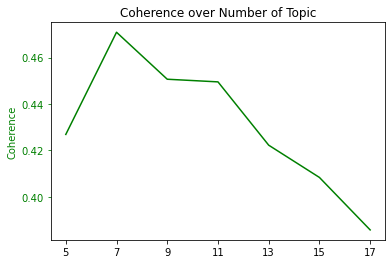

In [244]:
fig, ax1 = plt.subplots()

ax1.plot(coherence_values, 'g', label='Coherence')
ax1.set_ylabel('Coherence', color='g')
ax1.tick_params('y', colors='g')

plt.title('Coherence over Number of Topic')

plt.xticks(range(len(topic_range)), topic_range)
plt.show()

In [245]:
max_coherence = max(coherence_values)
max_coherence_index = coherence_values.index(max_coherence)
print(f"Best: {topic_range[max_coherence_index]} Topic")

best_bow_lsimodel = lsi_list[max_coherence_index]

Best: 7 Topic


### LSI Model - TFIDF

In [246]:
min_topic = 5
max_topic = 18 # +1 to view the max topic.
step = 2

lsi_list, coherence_values = lsi_compute_coherence_values(corpus=tfidf_corpus, 
                                                                            dictionary=dictionary, 
                                                                            texts=doc_clean, 
                                                                            min_topic=min_topic, 
                                                                            max_topic=max_topic, 
                                                                            step=step)

C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anaconda3\lib\site-packages\gensim\models\lsimodel.py:963: DeprecationWarning: Please use `csc_matvecs` from the `scipy.sparse` namespace, the `scipy.sparse.sparsetools` namespace is deprecated.
  sparsetools.csc_matvecs(
C:\Users\Zhang Xiang\anacond

In [247]:
topic_range = range(min_topic, max_topic, step)

In [248]:
for topic_count, coherence_value in zip(topic_range, coherence_values):
    print(f"Topic Count: {topic_count}, Coherence: {round(coherence_value, 4)}")

Topic Count: 5, Coherence: 0.465
Topic Count: 7, Coherence: 0.5091
Topic Count: 9, Coherence: 0.4241
Topic Count: 11, Coherence: 0.4161
Topic Count: 13, Coherence: 0.4281
Topic Count: 15, Coherence: 0.3891
Topic Count: 17, Coherence: 0.3758


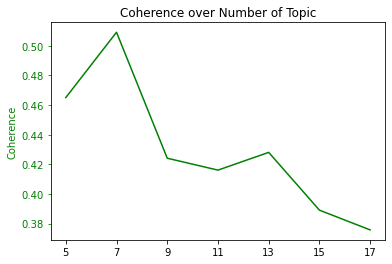

In [249]:
fig, ax1 = plt.subplots()

ax1.plot(coherence_values, 'g', label='Coherence')
ax1.set_ylabel('Coherence', color='g')
ax1.tick_params('y', colors='g')

plt.title('Coherence over Number of Topic')

plt.xticks(range(len(topic_range)), topic_range)
plt.show()

In [250]:
max_coherence = max(coherence_values)
max_coherence_index = coherence_values.index(max_coherence)
print(f"Best: {topic_range[max_coherence_index]} Topic")

best_tfidf_lsimodel = lsi_list[max_coherence_index]

Best: 7 Topic


### HDP Model - Bag Of Word

In [251]:
hdpmodel_bow = HdpModel(corpus=bow_corpus, id2word=dictionary)

In [252]:
pprint(hdpmodel_bow.print_topics())

[(0,
  '0.009*time + 0.008*shop + 0.008*great + 0.007*good + 0.007*price + '
  '0.006*buy + 0.005*service + 0.005*thing + 0.005*day + 0.005*love'),
 (1,
  '0.009*time + 0.009*shop + 0.008*price + 0.008*great + 0.008*good + '
  '0.007*buy + 0.006*love + 0.005*thing + 0.005*selection + 0.005*item'),
 (2,
  '0.009*time + 0.009*shop + 0.008*great + 0.007*price + 0.007*good + '
  '0.007*buy + 0.005*service + 0.005*love + 0.005*work + 0.005*thing'),
 (3,
  '0.010*shop + 0.009*great + 0.008*time + 0.008*good + 0.007*price + '
  '0.006*buy + 0.006*love + 0.005*selection + 0.005*thing + 0.004*staff'),
 (4,
  '0.010*shop + 0.009*great + 0.008*time + 0.007*good + 0.007*price + '
  '0.006*love + 0.006*buy + 0.005*selection + 0.005*thing + 0.004*staff'),
 (5,
  '0.010*shop + 0.008*great + 0.008*time + 0.007*price + 0.007*good + '
  '0.006*buy + 0.006*love + 0.005*selection + 0.005*thing + 0.004*staff'),
 (6,
  '0.009*shop + 0.008*great + 0.007*time + 0.007*price + 0.007*good + '
  '0.006*love + 0.0

In [253]:
hdpmodel_coherence = CoherenceModel(model = hdpmodel_bow, texts= doc_clean, dictionary= dictionary, coherence='c_v')
hdp_bow_coherence_ = hdpmodel_coherence.get_coherence()
print('Coherence score: ',hdp_bow_coherence_)

Coherence score:  0.3843827526210282


## Evaluation
Perform the necessary steps and explain the rationale taken here.

### Considerations:

1. **Build the best model for each of the 3 Topic Modelling Techniques with BOW and TFIDF(LDA,LSI, HDP). Total up to 6 model comparison.**


2. **Coherence Comparison Visual**
    - Compare the coherence score
    - the one with highest scoring will be identified as the best model.


3. **Best Topic Model Through Coherence**
    - More Likely overfitted as seen from the data and visuals, majority of documents are classified under 2 topics only.
    - Coherence Score: 0.5188173806832519
    - Conclude that it is less generalise, unable to learn new data.


4. **Best Topic Model Through Visual + Data** (Selected)
    - LDA BOW, Distribution of data seems fair and visuals are widely spread out, which mean it can better identify related document to it topics.
    - Coherence: 0.4624525634812417


### Run 6 Models Best Coherence

#### LDA Bag of Word

In [256]:
print(best_bow_ldamodel)

coherence_model_lda = CoherenceModel(model=best_bow_ldamodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
lda_bow_coherence = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', lda_bow_coherence)

LdaModel<num_terms=13491, num_topics=9, decay=0.5, chunksize=2000>

Coherence Score:  0.4624525634812417


#### LDA TFIDF

In [257]:
print(best_tfidf_ldamodel)

coherence_model_lda = CoherenceModel(model=best_tfidf_ldamodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
lda_tfidf_coherence = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', lda_tfidf_coherence)

LdaModel<num_terms=13491, num_topics=13, decay=0.5, chunksize=2000>

Coherence Score:  0.5188173806832519


#### LSI Bag of Word

In [258]:
print(best_bow_lsimodel)

coherence_model_lsi = CoherenceModel(model=best_bow_lsimodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
lsi_bow_coherence = coherence_model_lsi.get_coherence()
print('\nCoherence Score: ', lsi_bow_coherence)

LsiModel<num_terms=13491, num_topics=7, decay=1.0, chunksize=20000>

Coherence Score:  0.4708801562324429


#### LSI TFIDF

In [259]:
print(best_tfidf_lsimodel)

coherence_model_lsi = CoherenceModel(model=best_tfidf_lsimodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
lsi_tfidf_coherence = coherence_model_lsi.get_coherence()
print('\nCoherence Score: ', lsi_tfidf_coherence)

LsiModel<num_terms=13491, num_topics=7, decay=1.0, chunksize=20000>

Coherence Score:  0.5090686787426526


#### HDP Bag of Word

In [260]:
hdpmodel_bow = HdpModel(corpus=bow_corpus, id2word=dictionary)
print(hdpmodel_bow)

hdpmodel_coherence = CoherenceModel(model = hdpmodel_bow, texts= doc_clean, dictionary= dictionary, coherence='c_v')
hdp_bow_coherence = hdpmodel_coherence.get_coherence()
print('Coherence score: ',hdp_bow_coherence)

Coherence score:  0.38477364769993033


### Coherence Comparison Visual

Text(0.5, 1.0, 'Coherence of the 5 Topic Models')

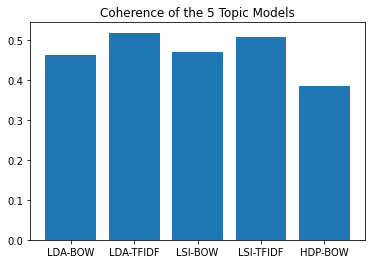

In [270]:
indices = ['LDA-BOW', 'LDA-TFIDF', 'LSI-BOW', 'LSI-TFIDF', 'HDP-BOW']
values = [lda_bow_coherence, lda_tfidf_coherence, lsi_bow_coherence, lsi_tfidf_coherence ,hdp_bow_coherence]
plt.bar(indices, values)
plt.title('Coherence of the 5 Topic Models')

**From the graph, we can see that LDA Topic Modelling with TFIDF perform the best out of the others**
- Highest Coherence = 0.54839109290974
- With the best result found with 5 topics given.
**However, it was mentioned above that the best coherence model for LDA TFIDF is overfitted it only able to identify better in 1 topic**




### Best Topic Model through Coherence

In [280]:
print(best_tfidf_ldamodel)

coherence_model_lda = CoherenceModel(model=best_tfidf_ldamodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
lda_tfidf_coherence = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', lda_tfidf_coherence)

LdaModel<num_terms=13491, num_topics=13, decay=0.5, chunksize=2000>

Coherence Score:  0.5188173806832519


In [281]:
topics = best_tfidf_ldamodel.print_topics(num_topics=topic_num, num_words=word_num)
for topic in topics:
    print(topic)

(11, '0.028*"comic" + 0.014*"exhibit" + 0.008*"guide" + 0.007*"cozy" + 0.007*"curtain"')
(12, '0.018*"spa" + 0.016*"soap" + 0.013*"facial" + 0.010*"perfume" + 0.008*"trick"')
(1, '0.015*"walgreens" + 0.013*"zia" + 0.012*"wynn" + 0.009*"bus" + 0.009*"eaton"')
(8, '0.011*"jeweler" + 0.008*"ring" + 0.007*"engagement" + 0.007*"chapel" + 0.007*"comparable"')
(2, '0.014*"hair" + 0.009*"coke" + 0.007*"guitar" + 0.007*"stylist" + 0.006*"cut"')
(7, '0.007*"service" + 0.006*"bike" + 0.006*"customer" + 0.005*"time" + 0.004*"work"')
(0, '0.006*"great" + 0.006*"shop" + 0.006*"love" + 0.005*"price" + 0.005*"selection"')
(4, '0.022*"buffalo" + 0.015*"plant" + 0.012*"vons" + 0.009*"registry" + 0.008*"vegetarian"')
(3, '0.035*"cigar" + 0.011*"smoke" + 0.007*"humidor" + 0.007*"verizon" + 0.006*"packed"')
(10, '0.012*"mall" + 0.012*"food" + 0.012*"target" + 0.009*"grocery" + 0.008*"produce"')


In [282]:
dic_topic_doc = {}

for index, doc in enumerate(doc_clean):
    #for doc in doc_clean:
    bow = dictionary.doc2bow(doc)
    
    #get topic distribution of the ldamodel
    t = best_tfidf_ldamodel.get_document_topics(bow)
    
    #sort the probability value in descending order to extract the top contributing topic id
    sorted_t = sorted(t, key=lambda x: x[1], reverse=True)
    
    #print only the filename 
    print(f"Document {index} Topic: {sorted_t}",)
    
    #get the top scoring item
    top_item = sorted_t.pop(0)
    
    #create dictionary and keep key as topic id and filename and probability in tuple as value
    dic_topic_doc.setdefault(top_item[0],[]).append((index, top_item[1]))

Document 0 Topic: [(7, 0.40403333), (0, 0.28630412), (1, 0.2006143), (2, 0.051835716), (5, 0.022984054), (3, 0.022764543)]
Document 1 Topic: [(7, 0.4824439), (0, 0.37208846), (9, 0.10882866)]
Document 2 Topic: [(0, 0.7332714), (9, 0.107791975), (4, 0.06769748), (10, 0.041496493), (8, 0.03163346)]
Document 3 Topic: [(0, 0.5056365), (7, 0.19645552), (4, 0.18746828), (10, 0.06073763), (9, 0.033059523)]
Document 4 Topic: [(7, 0.44336686), (0, 0.30559805), (3, 0.09710602), (2, 0.056794167), (1, 0.043301016), (6, 0.029697295), (9, 0.0176306)]
Document 5 Topic: [(7, 0.90455854), (10, 0.07373734)]
Document 6 Topic: [(7, 0.7589969), (5, 0.18459314)]
Document 7 Topic: [(7, 0.62408245), (0, 0.35026997)]
Document 8 Topic: [(7, 0.45492068), (0, 0.3901491), (2, 0.06722979), (8, 0.06052633), (3, 0.011262327), (4, 0.010573478)]
Document 9 Topic: [(0, 0.8628239), (9, 0.076713584)]
Document 10 Topic: [(7, 0.5209874), (0, 0.17072645), (10, 0.13026804), (6, 0.075007536), (8, 0.054471686), (2, 0.03570535)]

Document 499 Topic: [(7, 0.67275167), (0, 0.27185255), (2, 0.04028951)]
Document 500 Topic: [(7, 0.62145984), (0, 0.17676584), (10, 0.1482384), (6, 0.032550357)]
Document 501 Topic: [(0, 0.49538168), (10, 0.23183295), (7, 0.14423452), (8, 0.08799207), (12, 0.016978398), (2, 0.015773451)]
Document 502 Topic: [(7, 0.6468271), (0, 0.18923628), (10, 0.06609264), (6, 0.0632069), (2, 0.014148602), (11, 0.013751324)]
Document 503 Topic: [(0, 0.6067641), (7, 0.25967577), (10, 0.09551952), (8, 0.023611825)]
Document 504 Topic: [(0, 0.9289888)]
Document 505 Topic: [(0, 0.72524655), (3, 0.20058274), (2, 0.048498683)]
Document 506 Topic: [(0, 0.6069129), (10, 0.170904), (7, 0.13754414), (8, 0.033193793), (9, 0.032595623), (6, 0.013994816)]
Document 507 Topic: [(0, 0.42200005), (10, 0.20078713), (5, 0.16744798), (9, 0.087957054), (2, 0.05157467), (11, 0.0468106)]
Document 508 Topic: [(10, 0.6068078), (0, 0.28395507), (7, 0.050710555), (9, 0.038152575)]
Document 509 Topic: [(7, 0.97801626)]
Document

Document 953 Topic: [(0, 0.45400658), (10, 0.27427366), (7, 0.10947211), (12, 0.07524439), (9, 0.056210205)]
Document 954 Topic: [(0, 0.44314793), (10, 0.17965399), (2, 0.17461084), (7, 0.16230594), (6, 0.025614232)]
Document 955 Topic: [(0, 0.65550417), (10, 0.20448086), (9, 0.13039474)]
Document 956 Topic: [(10, 0.49917167), (0, 0.41728878), (3, 0.04511723), (6, 0.02336475)]
Document 957 Topic: [(0, 0.55703795), (10, 0.28014296), (7, 0.08289459), (12, 0.06518619)]
Document 958 Topic: [(0, 0.46397898), (10, 0.43975493), (11, 0.051751107), (2, 0.027192073)]
Document 959 Topic: [(0, 0.45504725), (10, 0.28659377), (9, 0.17183554), (8, 0.064881444)]
Document 960 Topic: [(0, 0.60080224), (10, 0.32862115)]
Document 961 Topic: [(0, 0.9762596)]
Document 962 Topic: [(0, 0.748238), (10, 0.22530468)]
Document 963 Topic: [(0, 0.5347189), (10, 0.3947627)]
Document 964 Topic: [(7, 0.73658746), (0, 0.16555168), (1, 0.03710511), (2, 0.036866553)]
Document 965 Topic: [(0, 0.59979993), (9, 0.22310948),

Document 1359 Topic: [(0, 0.8660667), (10, 0.0774987)]
Document 1360 Topic: [(0, 0.88755757), (11, 0.06262228)]
Document 1361 Topic: [(7, 0.6345556), (0, 0.24441873), (10, 0.054153927), (2, 0.02795131), (9, 0.024925588)]
Document 1362 Topic: [(0, 0.45971012), (7, 0.35737658), (6, 0.09148528), (10, 0.07700071)]
Document 1363 Topic: [(7, 0.6540414), (0, 0.24786948), (9, 0.074038185)]
Document 1364 Topic: [(7, 0.97020805)]
Document 1365 Topic: [(0, 0.5480133), (7, 0.24409486), (3, 0.11409635), (2, 0.04328882), (10, 0.032902915)]
Document 1366 Topic: [(0, 0.6829993), (3, 0.15568632), (9, 0.13566086)]
Document 1367 Topic: [(0, 0.7593461), (3, 0.16613168), (8, 0.028347336), (2, 0.027919311)]
Document 1368 Topic: [(7, 0.589018), (0, 0.27614933), (8, 0.061082736), (3, 0.053366076)]
Document 1369 Topic: [(7, 0.72106636), (0, 0.21977815), (12, 0.022417327), (2, 0.02230923)]
Document 1370 Topic: [(7, 0.68340564), (0, 0.2174796), (10, 0.05948693), (4, 0.021270232), (2, 0.011869974)]
Document 1371 

Document 1802 Topic: [(0, 0.8570112), (5, 0.06944854), (7, 0.03920044), (3, 0.023840394)]
Document 1803 Topic: [(0, 0.9679946), (9, 0.01789066)]
Document 1804 Topic: [(0, 0.39752343), (7, 0.37918532), (9, 0.18279764)]
Document 1805 Topic: [(0, 0.7255387), (9, 0.21838662), (7, 0.04657393)]
Document 1806 Topic: [(0, 0.7781727), (7, 0.089729786), (6, 0.06709273), (9, 0.0541828)]
Document 1807 Topic: [(0, 0.49738696), (7, 0.25395), (9, 0.1833203), (8, 0.039688017)]
Document 1808 Topic: [(7, 0.6343561), (0, 0.33024684), (4, 0.020599984)]
Document 1809 Topic: [(0, 0.6245088), (8, 0.12310019), (7, 0.10152702), (6, 0.08314581), (11, 0.043072306)]
Document 1810 Topic: [(7, 0.57663584), (0, 0.39604086)]
Document 1811 Topic: [(0, 0.8800026), (9, 0.099352345)]
Document 1812 Topic: [(0, 0.6894866), (7, 0.111160636), (6, 0.07877037), (10, 0.05050296), (8, 0.031673357), (9, 0.0209013), (3, 0.012738074)]
Document 1813 Topic: [(0, 0.71437263), (7, 0.14980027), (10, 0.06209496), (4, 0.025455585), (8, 0.

Document 2235 Topic: [(0, 0.7764095), (2, 0.09246203), (10, 0.07982398)]
Document 2236 Topic: [(0, 0.8033694), (5, 0.078905), (1, 0.04728847), (9, 0.042729642)]
Document 2237 Topic: [(0, 0.7337687), (7, 0.09061783), (10, 0.077954575), (5, 0.050673634), (2, 0.03196882)]
Document 2238 Topic: [(0, 0.76914537), (7, 0.019238014), (10, 0.019237911), (1, 0.019237867), (4, 0.019237867), (12, 0.019237867), (2, 0.019237865), (3, 0.019237865), (5, 0.019237865), (6, 0.019237865), (8, 0.019237865), (9, 0.019237865), (11, 0.019237865)]
Document 2239 Topic: [(0, 0.54728353), (7, 0.18504453), (10, 0.084384926), (5, 0.07992588), (3, 0.04140035), (1, 0.041232202)]
Document 2240 Topic: [(0, 0.6572396), (7, 0.14561976), (5, 0.06704624), (11, 0.027242191), (1, 0.0259908), (12, 0.023420878), (3, 0.023275504), (2, 0.021782722)]
Document 2241 Topic: [(0, 0.77407646), (9, 0.11156092), (7, 0.084763475)]
Document 2242 Topic: [(0, 0.70929354), (7, 0.08228685), (10, 0.08101084), (6, 0.054124173), (8, 0.02991164), 

Document 2671 Topic: [(0, 0.6048946), (7, 0.24647555), (10, 0.06814982), (6, 0.06689952)]
Document 2672 Topic: [(0, 0.5151046), (7, 0.3719371), (10, 0.045845695), (2, 0.041457348)]
Document 2673 Topic: [(0, 0.82632047), (7, 0.14637797)]
Document 2674 Topic: [(0, 0.9670293)]
Document 2675 Topic: [(0, 0.93514776), (2, 0.023976095), (12, 0.023774337)]
Document 2676 Topic: [(0, 0.92405623), (10, 0.028671838), (11, 0.027537687)]
Document 2677 Topic: [(0, 0.69592273), (3, 0.22991775), (7, 0.056671478)]
Document 2678 Topic: [(7, 0.3344382), (0, 0.31423044), (5, 0.085539766), (3, 0.07693475), (4, 0.076321475), (11, 0.055607893), (1, 0.03980925)]
Document 2679 Topic: [(7, 0.7461408), (0, 0.17928366), (10, 0.048505105), (4, 0.010134753), (11, 0.010127075)]
Document 2680 Topic: [(7, 0.9013206), (0, 0.04435048), (3, 0.020679649), (6, 0.02032548)]
Document 2681 Topic: [(10, 0.43374193), (0, 0.2602953), (7, 0.13139683), (2, 0.11159963)]
Document 2682 Topic: [(0, 0.7621447), (7, 0.089779116), (2, 0.0

Document 3115 Topic: [(0, 0.5409087), (7, 0.25744882), (11, 0.08519242), (12, 0.059734512), (8, 0.02890585), (9, 0.021469437)]
Document 3116 Topic: [(7, 0.69536966), (0, 0.2446399), (9, 0.03516073)]
Document 3117 Topic: [(7, 0.44514737), (0, 0.39749792), (10, 0.07251407), (3, 0.04230201), (4, 0.017261103), (9, 0.017235195)]
Document 3118 Topic: [(7, 0.6748359), (0, 0.18546547), (4, 0.073163375), (2, 0.026351431), (8, 0.025522843)]
Document 3119 Topic: [(0, 0.37981507), (7, 0.26018718), (10, 0.10782246), (12, 0.0773758), (2, 0.058057405), (9, 0.03564515), (11, 0.03193658), (6, 0.027139919), (5, 0.017281171)]
Document 3120 Topic: [(0, 0.53031236), (7, 0.32151797), (10, 0.0688707), (2, 0.04492078), (9, 0.019449329)]
Document 3121 Topic: [(0, 0.5654055), (7, 0.2989633), (10, 0.06683907), (2, 0.022612706), (9, 0.015750574), (5, 0.013533443)]
Document 3122 Topic: [(7, 0.6060201), (0, 0.33542854), (11, 0.025892107), (5, 0.012919031), (6, 0.01240655)]
Document 3123 Topic: [(0, 0.54271793), (7,

Document 3527 Topic: [(7, 0.49626958), (0, 0.38484818), (11, 0.04417218), (9, 0.026882967), (8, 0.0151792085), (6, 0.014240791), (4, 0.012842128)]
Document 3528 Topic: [(7, 0.7644175), (0, 0.17670149), (2, 0.028387045), (8, 0.012778031)]
Document 3529 Topic: [(7, 0.5438183), (0, 0.24846819), (2, 0.07496352), (10, 0.06569469), (11, 0.02739636), (3, 0.014039766), (9, 0.013397187)]
Document 3530 Topic: [(0, 0.41581053), (7, 0.34682474), (6, 0.10268397), (5, 0.04049869), (2, 0.03852403), (4, 0.03707751)]
Document 3531 Topic: [(7, 0.74097276), (0, 0.17220175), (2, 0.03555049), (5, 0.031488065)]
Document 3532 Topic: [(7, 0.55047923), (0, 0.33700877), (3, 0.056520365), (2, 0.024604388), (10, 0.02007751)]
Document 3533 Topic: [(0, 0.5673511), (7, 0.1832947), (10, 0.13919036), (4, 0.049092144), (3, 0.024431903), (11, 0.02439415)]
Document 3534 Topic: [(0, 0.5958304), (7, 0.320585), (6, 0.029673979), (9, 0.023020083), (2, 0.018062796)]
Document 3535 Topic: [(7, 0.7875511), (0, 0.11077382), (2, 0

Document 3967 Topic: [(0, 0.7339593), (3, 0.098939314), (7, 0.082500905), (2, 0.05161925)]
Document 3968 Topic: [(7, 0.4386373), (10, 0.2842406), (1, 0.12746008), (3, 0.03412742), (5, 0.034058016), (9, 0.03356697), (12, 0.033474468)]
Document 3969 Topic: [(7, 0.55775225), (0, 0.3213441), (3, 0.057440266), (10, 0.038695853)]
Document 3970 Topic: [(0, 0.69805557), (10, 0.1958051), (9, 0.049064692), (1, 0.034732297)]
Document 3971 Topic: [(0, 0.6523539), (10, 0.20984806), (7, 0.065658696), (9, 0.028793942), (8, 0.027506238)]
Document 3972 Topic: [(0, 0.79856956), (10, 0.100633904), (1, 0.043275014), (5, 0.022389363), (9, 0.022302272)]
Document 3973 Topic: [(7, 0.7862726), (2, 0.10208822), (0, 0.07315583)]
Document 3974 Topic: [(7, 0.58643085), (0, 0.3426694), (6, 0.041305706)]
Document 3975 Topic: [(7, 0.51656884), (0, 0.36234522), (9, 0.050589886), (10, 0.028866025), (5, 0.026609242)]
Document 3976 Topic: [(0, 0.45740333), (7, 0.35557118), (11, 0.097732365), (1, 0.06695282)]
Document 397

Document 4429 Topic: [(0, 0.6273046), (10, 0.21890269), (6, 0.091570616), (1, 0.03451577)]
Document 4430 Topic: [(0, 0.61199903), (7, 0.108779974), (2, 0.09044242), (11, 0.054653477), (5, 0.044286177), (3, 0.03995344), (6, 0.022052372), (4, 0.020426799)]
Document 4431 Topic: [(0, 0.8681242), (7, 0.010989878), (10, 0.010989812), (1, 0.01098961), (2, 0.01098961), (3, 0.01098961), (4, 0.01098961), (5, 0.01098961), (6, 0.01098961), (8, 0.01098961), (9, 0.01098961), (11, 0.01098961), (12, 0.01098961)]
Document 4432 Topic: [(0, 0.48809484), (7, 0.17831412), (10, 0.1612364), (6, 0.047928665), (9, 0.029662153), (12, 0.020812372), (8, 0.020333076), (4, 0.019272316), (2, 0.01206287), (5, 0.010520234), (11, 0.010282084)]
Document 4433 Topic: [(0, 0.8666463), (2, 0.09487785)]
Document 4434 Topic: [(0, 0.8846032)]
Document 4435 Topic: [(0, 0.7761968), (9, 0.1359743), (2, 0.052855846)]
Document 4436 Topic: [(0, 0.5923732), (7, 0.3015114), (9, 0.05740766), (12, 0.02187441), (2, 0.017061876)]
Document

Document 4865 Topic: [(0, 0.49676612), (7, 0.42154333), (10, 0.049631793)]
Document 4866 Topic: [(0, 0.87993467), (2, 0.06716628)]
Document 4867 Topic: [(0, 0.54560876), (7, 0.2322845), (10, 0.09323748), (4, 0.061984926), (9, 0.032629807), (8, 0.022792159)]
Document 4868 Topic: [(0, 0.61425567), (7, 0.15332524), (2, 0.13310543), (6, 0.041054085), (3, 0.037026964)]
Document 4869 Topic: [(7, 0.54887867), (0, 0.29943523), (9, 0.098654866), (5, 0.035271212)]
Document 4870 Topic: [(0, 0.92305887)]
Document 4871 Topic: [(0, 0.407793), (7, 0.30209336), (1, 0.18777852), (3, 0.076669)]
Document 4872 Topic: [(0, 0.6504508), (10, 0.15984432), (11, 0.13840824)]
Document 4873 Topic: [(0, 0.6908442), (11, 0.07564446), (10, 0.06452617), (7, 0.046713956), (6, 0.03853796), (9, 0.03590495), (1, 0.020815229), (4, 0.019874668)]
Document 4874 Topic: [(7, 0.5533035), (0, 0.31766772), (10, 0.06740242), (8, 0.03773988)]
Document 4875 Topic: [(0, 0.6471916), (7, 0.21458305), (10, 0.056810945), (2, 0.049915664)

Document 5297 Topic: [(0, 0.51575494), (7, 0.39641103), (3, 0.05118973)]
Document 5298 Topic: [(0, 0.5499189), (7, 0.32572815), (9, 0.06513436), (10, 0.037564445)]
Document 5299 Topic: [(0, 0.8035631), (10, 0.12440504), (7, 0.04797798)]
Document 5300 Topic: [(0, 0.5840977), (7, 0.3446182), (10, 0.025650991), (3, 0.017900087), (12, 0.017639901)]
Document 5301 Topic: [(0, 0.70624715), (7, 0.25345522)]
Document 5302 Topic: [(0, 0.49247783), (7, 0.2937735), (6, 0.062430214), (2, 0.03947828), (11, 0.03264484), (1, 0.032626286), (3, 0.032569304)]
Document 5303 Topic: [(0, 0.5092901), (7, 0.3586217), (1, 0.07825425), (3, 0.021304255), (12, 0.020687329)]
Document 5304 Topic: [(7, 0.5514377), (0, 0.28725532), (10, 0.047332257), (6, 0.046928264), (3, 0.020491384), (1, 0.019515872), (9, 0.012086014), (8, 0.010979655)]
Document 5305 Topic: [(0, 0.77102846), (9, 0.07070063), (10, 0.060456056), (2, 0.028405786), (8, 0.016976511), (4, 0.016396267), (3, 0.015558409), (12, 0.015055511)]
Document 5306 T

Document 5751 Topic: [(0, 0.82599115), (7, 0.09727809), (9, 0.04925109)]
Document 5752 Topic: [(0, 0.6611001), (10, 0.15418908), (7, 0.12180293), (5, 0.0419207)]
Document 5753 Topic: [(7, 0.5141142), (10, 0.39312518), (3, 0.05427008)]
Document 5754 Topic: [(0, 0.7021603), (7, 0.20451327), (10, 0.030245055), (2, 0.021329088), (5, 0.0141835455), (3, 0.011740119), (1, 0.011067415)]
Document 5755 Topic: [(7, 0.7949664), (2, 0.12818208), (5, 0.044790123)]
Document 5756 Topic: [(0, 0.6483546), (9, 0.29077095), (10, 0.03682449)]
Document 5757 Topic: [(7, 0.90768516)]
Document 5758 Topic: [(7, 0.45934686), (0, 0.38746834), (10, 0.11821041)]
Document 5759 Topic: [(0, 0.5560345), (7, 0.23439167), (6, 0.07143742), (9, 0.054268554), (12, 0.04720889), (4, 0.024412416)]
Document 5760 Topic: [(0, 0.67974514), (7, 0.1312824), (2, 0.061225716), (5, 0.041823626), (9, 0.019944845), (10, 0.016937576), (6, 0.016722402), (12, 0.014130852), (1, 0.014130651)]
Document 5761 Topic: [(0, 0.62206984), (7, 0.29960

Document 6226 Topic: [(10, 0.4784754), (0, 0.24420744), (7, 0.13674873), (9, 0.07329209), (3, 0.02690776), (5, 0.02689741)]
Document 6227 Topic: [(0, 0.48644447), (10, 0.35343912), (2, 0.0449105), (3, 0.044813965), (11, 0.04473329)]
Document 6228 Topic: [(0, 0.54188144), (10, 0.17835854), (7, 0.17560361), (9, 0.05199556), (2, 0.03080524), (5, 0.014360217)]
Document 6229 Topic: [(0, 0.52495664), (10, 0.38297543), (9, 0.041048862), (2, 0.021365028), (11, 0.01884297)]
Document 6230 Topic: [(0, 0.6499829), (10, 0.2660093), (3, 0.025257159), (9, 0.024637863), (2, 0.014259332), (6, 0.013197906)]
Document 6231 Topic: [(0, 0.57103896), (10, 0.17016438), (7, 0.16822867), (2, 0.037689213), (11, 0.033629626)]
Document 6232 Topic: [(0, 0.500023), (7, 0.209219), (9, 0.09949055), (1, 0.07002282), (5, 0.05182569), (12, 0.029002432), (8, 0.02887059)]
Document 6233 Topic: [(0, 0.6084622), (10, 0.14468133), (7, 0.12932244), (9, 0.059876632), (11, 0.02341347), (8, 0.022520494)]
Document 6234 Topic: [(0, 

Document 6671 Topic: [(7, 0.7723472), (0, 0.14387658), (11, 0.048785683)]
Document 6672 Topic: [(0, 0.5376506), (7, 0.28654724), (10, 0.086687155), (8, 0.04218397), (11, 0.029827297)]
Document 6673 Topic: [(0, 0.58098626), (7, 0.1875456), (6, 0.09734292), (3, 0.047160458), (9, 0.027656589), (12, 0.024438767), (11, 0.024370663)]
Document 6674 Topic: [(0, 0.8048524), (7, 0.10024912), (10, 0.03592344), (2, 0.035868946)]
Document 6675 Topic: [(7, 0.6003193), (0, 0.29211766), (10, 0.065492205), (8, 0.025583565)]
Document 6676 Topic: [(0, 0.50598735), (7, 0.29010397), (10, 0.14700672), (1, 0.016272116), (6, 0.016267987), (2, 0.01619874)]
Document 6677 Topic: [(0, 0.8626863), (6, 0.076867595)]
Document 6678 Topic: [(7, 0.58608013), (0, 0.24731764), (10, 0.098136716), (5, 0.028310098), (8, 0.025498476)]
Document 6679 Topic: [(0, 0.84614664), (7, 0.012821244), (10, 0.012821163), (1, 0.012821097), (2, 0.012821097), (3, 0.012821097), (4, 0.012821097), (5, 0.012821097), (6, 0.012821097), (8, 0.012

Document 7111 Topic: [(0, 0.5035748), (7, 0.35101292), (2, 0.060908414), (5, 0.051527537)]
Document 7112 Topic: [(0, 0.45245713), (7, 0.4103295), (10, 0.04171086), (9, 0.037176028), (12, 0.03708981)]
Document 7113 Topic: [(7, 0.4435814), (0, 0.433349), (5, 0.07177801)]
Document 7114 Topic: [(0, 0.7626254), (7, 0.11468177), (9, 0.09704082)]
Document 7115 Topic: [(7, 0.60579324), (0, 0.31361637), (2, 0.022962622), (12, 0.022405233), (4, 0.022397667)]
Document 7116 Topic: [(7, 0.8432933), (10, 0.091601625)]
Document 7117 Topic: [(0, 0.4820081), (7, 0.30715865), (10, 0.13042417), (12, 0.04892987)]
Document 7118 Topic: [(0, 0.736444), (10, 0.10973141), (8, 0.08970963)]
Document 7119 Topic: [(7, 0.79172224), (0, 0.18338196)]
Document 7120 Topic: [(0, 0.55960685), (7, 0.37987885)]
Document 7121 Topic: [(0, 0.734375), (4, 0.09795279), (9, 0.097718455)]
Document 7122 Topic: [(0, 0.6709739), (2, 0.17323332), (4, 0.11304531)]
Document 7123 Topic: [(0, 0.762978), (4, 0.20315942)]
Document 7124 Top

Document 7526 Topic: [(7, 0.83978266), (2, 0.08969353)]
Document 7527 Topic: [(10, 0.40774405), (0, 0.36778474), (9, 0.13603722), (5, 0.053810015)]
Document 7528 Topic: [(7, 0.49535835), (0, 0.36623606), (10, 0.11913252)]
Document 7529 Topic: [(7, 0.6716461), (0, 0.18096378), (2, 0.12713651)]
Document 7530 Topic: [(7, 0.7854849), (0, 0.08484083), (11, 0.036194712), (6, 0.033897445), (12, 0.023889946), (1, 0.023718687)]
Document 7531 Topic: [(7, 0.6356687), (0, 0.24876179), (3, 0.0752969), (2, 0.02790498)]
Document 7532 Topic: [(7, 0.5115089), (0, 0.35064158), (2, 0.055315048), (6, 0.05242067)]
Document 7533 Topic: [(7, 0.47130427), (0, 0.46359506)]
Document 7534 Topic: [(0, 0.57659614), (7, 0.34970385), (6, 0.042921796)]
Document 7535 Topic: [(7, 0.59097564), (0, 0.23221162), (10, 0.07297993), (2, 0.030171974), (9, 0.029979978), (5, 0.029092781)]
Document 7536 Topic: [(7, 0.6132593), (0, 0.18134204), (10, 0.07921891), (3, 0.069082566), (9, 0.034045994), (8, 0.015760988)]
Document 7537 

Document 7965 Topic: [(0, 0.6999963), (9, 0.1617527), (7, 0.06885518), (11, 0.03187351), (2, 0.016638914), (6, 0.012550908)]
Document 7966 Topic: [(0, 0.6920612), (7, 0.16161646), (9, 0.046754494), (6, 0.033722147), (1, 0.031211961), (10, 0.026463395)]
Document 7967 Topic: [(0, 0.7903994), (9, 0.06165938), (7, 0.04099182), (2, 0.038889706), (5, 0.01654081), (1, 0.01535867), (11, 0.015333834), (3, 0.0153283235)]
Document 7968 Topic: [(0, 0.8521338), (7, 0.07635159), (2, 0.032781977), (9, 0.028545076)]
Document 7969 Topic: [(0, 0.8665191), (10, 0.074585706), (9, 0.03916391)]
Document 7970 Topic: [(7, 0.46814018), (0, 0.33817938), (11, 0.08307612), (3, 0.08290031)]
Document 7971 Topic: [(0, 0.66072553), (7, 0.16484019), (9, 0.12389132), (5, 0.030747622)]
Document 7972 Topic: [(0, 0.65020335), (10, 0.17574887), (8, 0.056764692), (12, 0.04757495), (9, 0.021684224), (1, 0.02042211), (7, 0.01904727)]
Document 7973 Topic: [(0, 0.6979546), (7, 0.124894984), (2, 0.06316567), (3, 0.03261592), (9,

Document 8411 Topic: [(0, 0.72106165), (6, 0.089737006), (10, 0.07782714), (3, 0.049864803), (4, 0.038679957)]
Document 8412 Topic: [(0, 0.80175704), (7, 0.107201934), (3, 0.041505557), (2, 0.0406534)]
Document 8413 Topic: [(7, 0.80108917), (2, 0.0767847), (3, 0.066735655), (0, 0.028078962), (10, 0.020459333)]
Document 8414 Topic: [(7, 0.78509855), (10, 0.17258292)]
Document 8415 Topic: [(0, 0.42887655), (7, 0.4176565), (8, 0.08270277), (11, 0.043055445)]
Document 8416 Topic: [(0, 0.8956611), (2, 0.074113674)]
Document 8417 Topic: [(0, 0.8462114), (12, 0.056655724), (3, 0.056630515)]
Document 8418 Topic: [(7, 0.5265541), (10, 0.15720214), (1, 0.11966663), (5, 0.11963294)]
Document 8419 Topic: [(0, 0.49230945), (10, 0.24928375), (7, 0.21912448), (2, 0.025430173)]
Document 8420 Topic: [(0, 0.86604804), (2, 0.071883716), (3, 0.03642055)]
Document 8421 Topic: [(0, 0.64011675), (7, 0.3316721)]
Document 8422 Topic: [(0, 0.6212374), (7, 0.18943655), (9, 0.05715673), (3, 0.04597388), (5, 0.024

Document 8894 Topic: [(7, 0.52371573), (0, 0.3976276), (10, 0.029164778), (6, 0.02461372), (3, 0.018037006)]
Document 8895 Topic: [(0, 0.634809), (11, 0.15703551), (10, 0.096285045), (6, 0.05876084), (4, 0.03374481)]
Document 8896 Topic: [(0, 0.5910705), (10, 0.11767887), (1, 0.08284375), (4, 0.08273703), (11, 0.07830925)]
Document 8897 Topic: [(7, 0.61254054), (0, 0.33768037)]
Document 8898 Topic: [(0, 0.9757061)]
Document 8899 Topic: [(7, 0.74236876), (0, 0.21920212), (6, 0.022398453)]
Document 8900 Topic: [(0, 0.46778664), (7, 0.42677167), (10, 0.062325876), (11, 0.026225543)]
Document 8901 Topic: [(7, 0.49344003), (0, 0.339233), (2, 0.078118876), (12, 0.041616347), (9, 0.03116099), (6, 0.010931956)]
Document 8902 Topic: [(0, 0.7388425), (10, 0.102986656), (6, 0.069259435), (8, 0.034619085), (1, 0.034412846)]
Document 8903 Topic: [(7, 0.44992116), (0, 0.41213578), (2, 0.05036555), (11, 0.048250165), (6, 0.025010116)]
Document 8904 Topic: [(7, 0.4578683), (0, 0.4118097), (4, 0.034631

Document 9364 Topic: [(10, 0.4762291), (0, 0.4633251)]
Document 9365 Topic: [(0, 0.71496123), (9, 0.12590612), (6, 0.07054585), (10, 0.045251686), (4, 0.027550338)]
Document 9366 Topic: [(0, 0.41512915), (10, 0.35189065), (2, 0.076929264), (7, 0.063834704), (8, 0.05191967), (6, 0.026826473)]
Document 9367 Topic: [(7, 0.65899855), (10, 0.110628724), (0, 0.07663638), (6, 0.06701582), (12, 0.03472811), (5, 0.03460936)]
Document 9368 Topic: [(10, 0.41169208), (7, 0.3621746), (0, 0.19960521)]
Document 9369 Topic: [(0, 0.68551195), (7, 0.24862908), (5, 0.038367398)]
Document 9370 Topic: [(7, 0.81574875), (10, 0.08720574), (9, 0.05654711)]
Document 9371 Topic: [(7, 0.5784647), (0, 0.36511803)]
Document 9372 Topic: [(7, 0.664315), (10, 0.2742313), (3, 0.035805847)]
Document 9373 Topic: [(0, 0.7862207), (10, 0.07305411), (9, 0.062154405), (12, 0.03347228), (6, 0.018366668), (8, 0.018042363)]
Document 9374 Topic: [(0, 0.6604857), (9, 0.080179624), (7, 0.077232815), (2, 0.054750852), (10, 0.04044

Document 9801 Topic: [(0, 0.58263785), (7, 0.3427143), (1, 0.028298097), (6, 0.028119754)]
Document 9802 Topic: [(0, 0.88696796), (2, 0.06324428)]
Document 9803 Topic: [(0, 0.7068056), (7, 0.2649853)]
Document 9804 Topic: [(0, 0.8307666), (9, 0.061164726), (2, 0.05754535), (12, 0.030736445)]
Document 9805 Topic: [(7, 0.9044693), (3, 0.02940904), (0, 0.027161151), (9, 0.017896976), (6, 0.013368408)]
Document 9806 Topic: [(0, 0.48181063), (7, 0.4208876), (11, 0.042069588), (9, 0.02303828), (10, 0.021192543)]
Document 9807 Topic: [(7, 0.8475249), (0, 0.07928926), (6, 0.03900059), (9, 0.02111177)]
Document 9808 Topic: [(7, 0.62623024), (0, 0.16652499), (2, 0.11191516), (1, 0.041524023), (6, 0.04149305)]
Document 9809 Topic: [(0, 0.545777), (7, 0.2413098), (6, 0.059814036), (8, 0.059741035), (9, 0.05912905)]
Document 9810 Topic: [(7, 0.603256), (0, 0.28674343), (9, 0.04445749), (10, 0.013245951), (3, 0.012755809), (4, 0.011896677), (6, 0.011727336), (11, 0.011635205)]
Document 9811 Topic: [

Document 10267 Topic: [(0, 0.73787105), (10, 0.21981004)]
Document 10268 Topic: [(7, 0.7231011), (0, 0.20167546), (8, 0.038582556)]
Document 10269 Topic: [(7, 0.46379477), (0, 0.3414115), (9, 0.124052495), (12, 0.043033954)]
Document 10270 Topic: [(0, 0.6749837), (7, 0.28269646)]
Document 10271 Topic: [(7, 0.5538455), (0, 0.27367592), (2, 0.057965543), (5, 0.026760435), (4, 0.025604712), (1, 0.025591569), (9, 0.02555515)]
Document 10272 Topic: [(0, 0.2842865), (2, 0.2698193), (3, 0.25356418), (7, 0.019233225), (1, 0.019232983), (4, 0.019232983), (5, 0.019232983), (6, 0.019232983), (8, 0.019232983), (9, 0.019232983), (10, 0.019232983), (11, 0.019232983), (12, 0.019232983)]
Document 10273 Topic: [(0, 0.77258116), (7, 0.0920565), (2, 0.057158023), (5, 0.04116037), (10, 0.02472238)]
Document 10274 Topic: [(0, 0.57187414), (7, 0.17322287), (2, 0.11949504), (9, 0.0714215), (8, 0.026615271), (4, 0.024834564)]
Document 10275 Topic: [(0, 0.88921773), (7, 0.05125393), (5, 0.034702864)]
Document 

Document 10746 Topic: [(7, 0.8977149), (2, 0.07407532)]
Document 10747 Topic: [(7, 0.80422115), (10, 0.12328318), (2, 0.03144057), (6, 0.024948226)]
Document 10748 Topic: [(7, 0.88460857)]
Document 10749 Topic: [(0, 0.59989035), (2, 0.2265853), (7, 0.13074577)]
Document 10750 Topic: [(0, 0.67174786), (7, 0.19809048), (9, 0.040273234), (8, 0.037433814), (11, 0.022016358), (4, 0.020267595)]
Document 10751 Topic: [(0, 0.46828294), (7, 0.35574165), (10, 0.059198685), (3, 0.03205521), (9, 0.028301967), (5, 0.019035889), (11, 0.01585218), (1, 0.015848385)]
Document 10752 Topic: [(0, 0.70016193), (7, 0.13664691), (9, 0.07826967), (2, 0.042250335), (6, 0.017956948), (1, 0.016163092)]
Document 10753 Topic: [(0, 0.6968304), (7, 0.14754191), (2, 0.11455715), (6, 0.016930817), (5, 0.015344635)]
Document 10754 Topic: [(0, 0.8944701), (9, 0.06098346)]
Document 10755 Topic: [(10, 0.37067965), (7, 0.34776235), (0, 0.23881494)]
Document 10756 Topic: [(7, 0.6828605), (0, 0.14819989), (2, 0.057455957), (

Document 11212 Topic: [(7, 0.5834316), (0, 0.34295318), (2, 0.042828664)]
Document 11213 Topic: [(7, 0.55236274), (0, 0.33302262), (2, 0.076831445), (8, 0.020264573), (12, 0.011655437)]
Document 11214 Topic: [(7, 0.8556756), (10, 0.12464077)]
Document 11215 Topic: [(7, 0.9289864)]
Document 11216 Topic: [(7, 0.8995706), (10, 0.07624892)]
Document 11217 Topic: [(0, 0.8846012)]
Document 11218 Topic: [(7, 0.79142594), (0, 0.1476052), (3, 0.037655406)]
Document 11219 Topic: [(7, 0.4993302), (0, 0.16493767), (10, 0.1476846), (2, 0.09494272), (6, 0.05185608), (8, 0.027779728)]
Document 11220 Topic: [(7, 0.61291945), (0, 0.1600951), (2, 0.07382555), (12, 0.037286047), (6, 0.029663362), (10, 0.02681871), (8, 0.016979795), (11, 0.01632506), (9, 0.012070175)]
Document 11221 Topic: [(0, 0.40233475), (7, 0.27453688), (10, 0.22213721), (2, 0.06076354), (5, 0.025569249)]
Document 11222 Topic: [(0, 0.3222696), (7, 0.25521773), (10, 0.2423273), (1, 0.09618831), (2, 0.064753644)]
Document 11223 Topic: [

Document 11650 Topic: [(7, 0.5949232), (0, 0.2402706), (10, 0.08221651), (4, 0.03811338), (6, 0.029161556), (11, 0.010280143)]
Document 11651 Topic: [(7, 0.7171358), (0, 0.20149778), (3, 0.06565536)]
Document 11652 Topic: [(0, 0.59230226), (7, 0.2581048), (9, 0.056637004), (1, 0.05650299)]
Document 11653 Topic: [(0, 0.8846077)]
Document 11654 Topic: [(0, 0.7342389), (2, 0.18881716)]
Document 11655 Topic: [(0, 0.673795), (7, 0.265759)]
Document 11656 Topic: [(0, 0.55357385), (7, 0.23654164), (9, 0.085124284), (10, 0.053103138), (2, 0.03333841), (1, 0.015814403), (4, 0.015711088)]
Document 11657 Topic: [(0, 0.82139105), (6, 0.0626307), (7, 0.05954473), (5, 0.021948649), (11, 0.021919087)]
Document 11658 Topic: [(0, 0.7706718), (5, 0.08738712), (3, 0.08275735)]
Document 11659 Topic: [(0, 0.7137927), (7, 0.12352904), (2, 0.07235598), (9, 0.03161314), (6, 0.025931843), (11, 0.021771563)]
Document 11660 Topic: [(0, 0.7685036), (7, 0.09044508), (2, 0.044011094), (5, 0.041483957), (6, 0.023261

Document 12083 Topic: [(0, 0.70743126), (7, 0.16371492), (9, 0.041280545), (10, 0.032000702), (6, 0.023064945), (2, 0.02150431)]
Document 12084 Topic: [(0, 0.8608892), (8, 0.06684356), (10, 0.047434825)]
Document 12085 Topic: [(0, 0.9007784), (7, 0.071010776)]
Document 12086 Topic: [(7, 0.4663932), (0, 0.38693762), (10, 0.03353545), (2, 0.032854106), (9, 0.032739997), (5, 0.031684052)]
Document 12087 Topic: [(0, 0.3344648), (2, 0.22663513), (1, 0.22621444), (10, 0.17417392)]
Document 12088 Topic: [(0, 0.5309065), (7, 0.38359538), (1, 0.037025046), (2, 0.036321055)]
Document 12089 Topic: [(7, 0.6452366), (0, 0.18120521), (10, 0.07488731), (9, 0.035884444), (5, 0.03586736), (1, 0.017933745)]
Document 12090 Topic: [(7, 0.8832151), (2, 0.08293094)]
Document 12091 Topic: [(0, 0.6555223), (4, 0.16367608), (9, 0.098686285), (2, 0.05200541)]
Document 12092 Topic: [(0, 0.6656568), (7, 0.07469496), (10, 0.06473927), (4, 0.059146475), (8, 0.039045747), (2, 0.02659888), (6, 0.016988238), (1, 0.016

Document 12542 Topic: [(0, 0.72544366), (7, 0.22165808)]
Document 12543 Topic: [(0, 0.73575616), (10, 0.14088556), (6, 0.049801268), (12, 0.04469754)]
Document 12544 Topic: [(0, 0.7146405), (10, 0.15060093), (2, 0.07979274)]
Document 12545 Topic: [(0, 0.8329587), (7, 0.06554821), (12, 0.038410336), (11, 0.038347766)]
Document 12546 Topic: [(7, 0.8397476), (5, 0.08973337)]
Document 12547 Topic: [(7, 0.4061103), (0, 0.32739672), (10, 0.09844116), (11, 0.071582094), (9, 0.040753856), (4, 0.03713265)]
Document 12548 Topic: [(0, 0.5333482), (7, 0.23774461), (3, 0.11857139), (6, 0.040701874), (10, 0.03533474), (11, 0.023736233)]
Document 12549 Topic: [(7, 0.6078945), (0, 0.2918319), (5, 0.038662646), (10, 0.0384595)]
Document 12550 Topic: [(0, 0.70512193), (7, 0.24195193)]
Document 12551 Topic: [(7, 0.61033773), (0, 0.32134467), (4, 0.039818823)]
Document 12552 Topic: [(7, 0.7118336), (0, 0.21127547), (11, 0.04483379)]
Document 12553 Topic: [(0, 0.52579534), (7, 0.22701538), (5, 0.14314367),

Document 12984 Topic: [(0, 0.64881784), (7, 0.31591246)]
Document 12985 Topic: [(0, 0.48211604), (7, 0.35120308), (5, 0.046528533), (10, 0.038265552), (9, 0.0329882), (1, 0.032559596)]
Document 12986 Topic: [(0, 0.51255345), (7, 0.45359397)]
Document 12987 Topic: [(0, 0.86716676), (5, 0.094367914)]
Document 12988 Topic: [(7, 0.4973173), (0, 0.37881204), (2, 0.047069248), (9, 0.042339068), (4, 0.021898381)]
Document 12989 Topic: [(7, 0.62246287), (0, 0.17052755), (10, 0.10263076), (3, 0.04620899), (4, 0.036933348)]
Document 12990 Topic: [(7, 0.80903095), (3, 0.09119157), (10, 0.04543185), (8, 0.016521025), (12, 0.015140331), (4, 0.015090384)]
Document 12991 Topic: [(7, 0.73427665), (3, 0.18875958)]
Document 12992 Topic: [(0, 0.7995936), (2, 0.068160415), (10, 0.055511586), (12, 0.021942103), (6, 0.02191593), (9, 0.021879893)]
Document 12993 Topic: [(7, 0.86158395), (2, 0.074774876), (8, 0.037105784)]
Document 12994 Topic: [(7, 0.48312092), (0, 0.46227783), (9, 0.020258177), (10, 0.01328

Document 13442 Topic: [(0, 0.6701285), (7, 0.1954489), (2, 0.076876216), (11, 0.02237498), (3, 0.022346351)]
Document 13443 Topic: [(0, 0.7636767), (7, 0.06234433), (9, 0.048788432), (10, 0.044718616), (2, 0.024985151), (12, 0.013107752), (1, 0.0130859045), (5, 0.0129037425), (8, 0.012630032)]
Document 13444 Topic: [(0, 0.7034048), (9, 0.07580738), (10, 0.07050417), (7, 0.054808326), (6, 0.044201784), (1, 0.0407055)]
Document 13445 Topic: [(0, 0.80202246), (10, 0.10677813), (9, 0.056222986)]
Document 13446 Topic: [(0, 0.87947404), (9, 0.067627974)]
Document 13447 Topic: [(0, 0.9037324), (10, 0.036804456), (11, 0.034640566)]
Document 13448 Topic: [(0, 0.82571334), (9, 0.085650526), (10, 0.055179544)]
Document 13449 Topic: [(0, 0.78293777), (9, 0.10368735), (10, 0.080252916), (11, 0.02005205)]
Document 13450 Topic: [(0, 0.8382702), (2, 0.091201134)]
Document 13451 Topic: [(0, 0.7559896), (7, 0.07411202), (11, 0.047598988), (2, 0.032967392), (9, 0.02660985), (8, 0.024210326), (6, 0.020151

Document 13920 Topic: [(0, 0.4608685), (7, 0.2890873), (10, 0.10474652), (1, 0.07539794), (5, 0.04313291), (9, 0.011131069), (8, 0.011107179)]
Document 13921 Topic: [(0, 0.97435427)]
Document 13922 Topic: [(7, 0.64245874), (0, 0.26657927), (1, 0.03815181), (9, 0.03631213)]
Document 13923 Topic: [(7, 0.5043687), (0, 0.3234328), (6, 0.0913315), (10, 0.04979405), (9, 0.021451322)]
Document 13924 Topic: [(7, 0.49806324), (0, 0.30296886), (9, 0.047788214), (10, 0.040264416), (5, 0.03796016), (8, 0.03450929), (3, 0.033425022)]
Document 13925 Topic: [(7, 0.58265203), (0, 0.36079127), (3, 0.024421465), (4, 0.019543838)]
Document 13926 Topic: [(7, 0.78246826), (0, 0.07676142), (8, 0.07161621), (10, 0.053034917)]
Document 13927 Topic: [(7, 0.43745512), (0, 0.41245535), (10, 0.07482831), (1, 0.027925612), (2, 0.02682391), (8, 0.014019618)]
Document 13928 Topic: [(0, 0.59113103), (7, 0.21894118), (10, 0.08849057), (1, 0.06545531), (8, 0.022880359)]
Document 13929 Topic: [(0, 0.46858087), (10, 0.23

Document 14405 Topic: [(0, 0.9129107), (10, 0.032799296), (12, 0.03165162)]
Document 14406 Topic: [(0, 0.73704004), (7, 0.10609187), (2, 0.089559495), (9, 0.026183657), (6, 0.026100429)]
Document 14407 Topic: [(0, 0.84251404), (8, 0.043938268), (7, 0.03336985), (1, 0.027382433), (12, 0.022898242), (5, 0.01842606)]
Document 14408 Topic: [(7, 0.79274124), (10, 0.08229297), (9, 0.06353392), (1, 0.023903288), (6, 0.023844302)]
Document 14409 Topic: [(0, 0.4420798), (7, 0.40820336), (6, 0.109212644)]
Document 14410 Topic: [(0, 0.8846076)]
Document 14411 Topic: [(0, 0.8004037), (9, 0.10540649), (2, 0.055717945)]
Document 14412 Topic: [(0, 0.5667149), (7, 0.362759)]
Document 14413 Topic: [(0, 0.8128629), (9, 0.075838104), (10, 0.06413198), (2, 0.030269174)]
Document 14414 Topic: [(0, 0.4272656), (9, 0.20254476), (7, 0.15833968), (8, 0.074723504), (10, 0.05949224), (5, 0.04261065), (11, 0.025778437)]
Document 14415 Topic: [(0, 0.6243628), (7, 0.15662502), (2, 0.06900464), (9, 0.06646704), (6, 

Document 14912 Topic: [(7, 0.5356747), (0, 0.36014572), (11, 0.055706114), (2, 0.021521982), (9, 0.010992802), (1, 0.01092037)]
Document 14913 Topic: [(0, 0.6305273), (9, 0.14597693), (11, 0.083973855), (3, 0.076859474), (4, 0.03985908)]
Document 14914 Topic: [(0, 0.51934034), (7, 0.33089337), (1, 0.04327087), (10, 0.035056025), (8, 0.022415044), (11, 0.022409854), (3, 0.01699313)]
Document 14915 Topic: [(0, 0.76783437), (11, 0.07990736), (7, 0.06783215), (10, 0.0577872)]
Document 14916 Topic: [(0, 0.777156), (7, 0.14600943), (11, 0.0415267), (9, 0.02145534)]
Document 14917 Topic: [(0, 0.6800439), (7, 0.18531512), (11, 0.054660942), (10, 0.0355853), (1, 0.02819186)]
Document 14918 Topic: [(7, 0.48401347), (0, 0.2532767), (4, 0.11698317), (2, 0.05639905), (6, 0.039752718), (12, 0.039206028)]
Document 14919 Topic: [(0, 0.71833867), (7, 0.14434421), (11, 0.0741466), (1, 0.038434908)]
Document 14920 Topic: [(0, 0.9090429), (10, 0.052473776)]
Document 14921 Topic: [(0, 0.72858536), (9, 0.06

Document 15387 Topic: [(0, 0.561248), (7, 0.40028247)]
Document 15388 Topic: [(0, 0.5722851), (9, 0.21382774), (7, 0.089520045), (10, 0.0510908), (4, 0.043956693), (3, 0.021623196)]
Document 15389 Topic: [(0, 0.6667391), (7, 0.11714973), (9, 0.107726924), (2, 0.042551726), (8, 0.021838829), (11, 0.021030957), (4, 0.016066916)]
Document 15390 Topic: [(0, 0.5602102), (7, 0.26382783), (9, 0.12738632), (3, 0.036633223)]
Document 15391 Topic: [(0, 0.8031528), (9, 0.086419135), (3, 0.024831718), (4, 0.024469448), (11, 0.024450181), (6, 0.024433125)]
Document 15392 Topic: [(0, 0.6848357), (7, 0.102541715), (8, 0.078119695), (2, 0.04662946), (5, 0.02755422), (9, 0.022934947), (12, 0.016787544), (1, 0.01457724)]
Document 15393 Topic: [(0, 0.6943244), (7, 0.22669108), (2, 0.033639256), (1, 0.027577223)]
Document 15394 Topic: [(0, 0.74261844), (5, 0.10732789), (4, 0.073204495), (11, 0.0467383)]
Document 15395 Topic: [(0, 0.9049301), (10, 0.07219079)]
Document 15396 Topic: [(0, 0.68471634), (7, 0.

Document 15857 Topic: [(7, 0.6876549), (0, 0.22167078), (6, 0.04733157), (2, 0.028548041)]
Document 15858 Topic: [(0, 0.7886398), (7, 0.16011183), (5, 0.029871317)]
Document 15859 Topic: [(7, 0.95383966)]
Document 15860 Topic: [(7, 0.5911818), (0, 0.29518268), (2, 0.06462039), (3, 0.029774703)]
Document 15861 Topic: [(0, 0.56802946), (7, 0.34157962), (2, 0.038419403), (12, 0.031596538)]
Document 15862 Topic: [(7, 0.6591567), (0, 0.30054656)]
Document 15863 Topic: [(7, 0.7606047), (0, 0.17427292)]
Document 15864 Topic: [(7, 0.9360182), (1, 0.03576716)]
Document 15865 Topic: [(7, 0.7587497), (0, 0.07775581), (3, 0.07065186), (2, 0.03829887), (1, 0.034684412)]
Document 15866 Topic: [(7, 0.75789607), (0, 0.18963003), (10, 0.01572669), (9, 0.011515537), (3, 0.010455262)]
Document 15867 Topic: [(7, 0.70015), (0, 0.11787231), (10, 0.07099407), (2, 0.051365457), (4, 0.028871916), (11, 0.012420352)]
Document 15868 Topic: [(0, 0.60363626), (10, 0.19466022), (7, 0.09013626), (5, 0.044467382), (9,

Document 16312 Topic: [(0, 0.84720725), (2, 0.12360635)]
Document 16313 Topic: [(0, 0.84526235), (7, 0.089186594), (10, 0.032878626), (9, 0.025222003)]
Document 16314 Topic: [(7, 0.5367121), (0, 0.381135), (6, 0.028218802), (2, 0.02327595), (5, 0.017560007)]
Document 16315 Topic: [(0, 0.7736556), (7, 0.17659232), (11, 0.028951013)]
Document 16316 Topic: [(0, 0.74346757), (7, 0.090720534), (2, 0.07074879), (6, 0.035566818), (1, 0.032939702), (8, 0.018001752)]
Document 16317 Topic: [(0, 0.4711598), (7, 0.37668276), (3, 0.055558447), (9, 0.049251366), (6, 0.03155999)]
Document 16318 Topic: [(0, 0.529392), (7, 0.28668877), (2, 0.119848244), (5, 0.025022976), (3, 0.024725676)]
Document 16319 Topic: [(0, 0.88693297), (3, 0.06328042)]
Document 16320 Topic: [(0, 0.5666101), (7, 0.1899951), (10, 0.1269237), (9, 0.051464494), (3, 0.04130077)]
Document 16321 Topic: [(7, 0.8207116), (10, 0.118836336)]
Document 16322 Topic: [(0, 0.4304657), (7, 0.20669813), (10, 0.19446564), (2, 0.10056229), (11, 0

Document 16772 Topic: [(7, 0.85259557), (0, 0.10893412)]
Document 16773 Topic: [(0, 0.5906585), (10, 0.14762363), (7, 0.14472613), (11, 0.039871648), (6, 0.02704336), (3, 0.025924115), (2, 0.012743987)]
Document 16774 Topic: [(7, 0.5041692), (0, 0.43073127)]
Document 16775 Topic: [(0, 0.76166004), (10, 0.11679661), (7, 0.07841427), (11, 0.026239391)]
Document 16776 Topic: [(0, 0.9160782)]
Document 16777 Topic: [(0, 0.52349204), (7, 0.38248628)]
Document 16778 Topic: [(7, 0.57012886), (0, 0.33583766)]
Document 16779 Topic: [(7, 0.37213868), (0, 0.36016017), (3, 0.106935486), (10, 0.08767512), (1, 0.03337847), (11, 0.022873426)]
Document 16780 Topic: [(7, 0.37242034), (0, 0.34833896), (10, 0.12584484), (9, 0.0519796), (3, 0.04691513), (1, 0.04327825)]
Document 16781 Topic: [(0, 0.65898067), (7, 0.18896121), (10, 0.10397311)]
Document 16782 Topic: [(7, 0.45466125), (0, 0.3363307), (9, 0.17694205)]
Document 16783 Topic: [(7, 0.8378722), (10, 0.087503046), (2, 0.043844122)]
Document 16784 T

Document 17219 Topic: [(0, 0.9260207), (12, 0.041425817)]
Document 17220 Topic: [(7, 0.47806573), (12, 0.39527544), (10, 0.0511141), (3, 0.04538959)]
Document 17221 Topic: [(7, 0.6337161), (0, 0.30583516)]
Document 17222 Topic: [(7, 0.6854606), (0, 0.16134498), (12, 0.05196368), (10, 0.031114755), (3, 0.029839579), (5, 0.026802154)]
Document 17223 Topic: [(7, 0.79755783), (2, 0.10833972), (5, 0.026623964), (1, 0.026255734), (11, 0.026203517)]
Document 17224 Topic: [(0, 0.4008363), (7, 0.29362795), (10, 0.17547344), (2, 0.054733332), (5, 0.042374875), (8, 0.021958064)]
Document 17225 Topic: [(0, 0.46018678), (7, 0.44577333)]
Document 17226 Topic: [(0, 0.44580027), (7, 0.44127628), (2, 0.08332619)]
Document 17227 Topic: [(7, 0.58088243), (0, 0.28512776), (10, 0.06053265), (2, 0.025224917), (8, 0.023529941)]
Document 17228 Topic: [(0, 0.6762459), (11, 0.14654152), (7, 0.09270545), (3, 0.051523514)]
Document 17229 Topic: [(7, 0.6752248), (3, 0.230745)]
Document 17230 Topic: [(0, 0.49976024

Document 17669 Topic: [(0, 0.70457804), (1, 0.13377745), (7, 0.084132746), (2, 0.04738881)]
Document 17670 Topic: [(0, 0.71982604), (3, 0.14833055), (11, 0.076884486)]
Document 17671 Topic: [(0, 0.73984104), (7, 0.1514052), (4, 0.034622554), (2, 0.034177694), (9, 0.029690484)]
Document 17672 Topic: [(0, 0.72186375), (7, 0.21485355), (10, 0.022047412), (9, 0.019890718), (12, 0.012155445)]
Document 17673 Topic: [(0, 0.5897231), (7, 0.1634081), (2, 0.14858554), (8, 0.05980154)]
Document 17674 Topic: [(0, 0.66677964), (7, 0.21220058), (9, 0.047181115), (11, 0.04068615), (6, 0.02107882)]
Document 17675 Topic: [(0, 0.9192659), (10, 0.03254367), (2, 0.027928445)]
Document 17676 Topic: [(0, 0.78751105), (10, 0.050705124), (11, 0.04226314), (2, 0.039023742), (9, 0.025116913), (3, 0.024094002), (4, 0.021859553)]
Document 17677 Topic: [(0, 0.48947924), (7, 0.3402423), (2, 0.039136328), (3, 0.039002948), (10, 0.02478256), (9, 0.02113135), (1, 0.016668634)]
Document 17678 Topic: [(0, 0.6572275), (7

Document 18113 Topic: [(0, 0.87844616), (2, 0.065604076), (11, 0.032634582)]
Document 18114 Topic: [(0, 0.6690908), (11, 0.1478568), (2, 0.074926645), (10, 0.04766528), (4, 0.038473237)]
Document 18115 Topic: [(0, 0.51263183), (10, 0.29800078), (2, 0.12556492), (6, 0.029057778), (12, 0.018103804)]
Document 18116 Topic: [(7, 0.4471708), (0, 0.40299463), (11, 0.11136376)]
Document 18117 Topic: [(7, 0.45640358), (0, 0.4161249), (8, 0.07616856)]
Document 18118 Topic: [(7, 0.7234554), (0, 0.136518), (3, 0.07596891), (2, 0.027082615), (9, 0.01519752), (1, 0.01449415)]
Document 18119 Topic: [(0, 0.591218), (9, 0.15379117), (10, 0.062376495), (11, 0.058117285), (1, 0.053800695), (5, 0.05375964)]
Document 18120 Topic: [(0, 0.57195336), (9, 0.25930855), (10, 0.059513226), (11, 0.04418072), (1, 0.041366715)]
Document 18121 Topic: [(0, 0.62234324), (9, 0.24209577), (10, 0.033551704), (11, 0.029001482), (1, 0.026601618), (6, 0.014196693), (5, 0.013729563), (8, 0.013543693)]
Document 18122 Topic: [(

Document 18575 Topic: [(0, 0.6197033), (7, 0.2155215), (2, 0.06483513), (3, 0.043669697), (10, 0.023329092), (11, 0.02194295)]
Document 18576 Topic: [(0, 0.3935214), (7, 0.29341713), (10, 0.17944816), (8, 0.102137275)]
Document 18577 Topic: [(7, 0.58087796), (0, 0.26902896), (10, 0.10027076), (2, 0.03443147)]
Document 18578 Topic: [(0, 0.44092044), (7, 0.2729188), (10, 0.25270915)]
Document 18579 Topic: [(0, 0.7548565), (2, 0.19224954)]
Document 18580 Topic: [(7, 0.55254006), (10, 0.18761086), (8, 0.12410673), (2, 0.092386514), (4, 0.027569825)]
Document 18581 Topic: [(0, 0.3544503), (7, 0.30542722), (2, 0.30340353), (5, 0.0222834)]
Document 18582 Topic: [(7, 0.5807909), (0, 0.32886305), (3, 0.04816218), (9, 0.026071588)]
Document 18583 Topic: [(0, 0.70122844), (7, 0.19999063), (10, 0.03662653), (12, 0.03456132), (2, 0.01732599)]
Document 18584 Topic: [(0, 0.544794), (7, 0.2639227), (10, 0.16563581)]
Document 18585 Topic: [(7, 0.593734), (0, 0.28509203), (12, 0.08071607), (9, 0.0163431

Document 19028 Topic: [(0, 0.5041941), (7, 0.25544223), (9, 0.12978606), (3, 0.06729369)]
Document 19029 Topic: [(7, 0.7397684), (10, 0.10638352), (11, 0.089728)]
Document 19030 Topic: [(7, 0.61484367), (0, 0.20486626), (10, 0.12139986), (4, 0.035800762)]
Document 19031 Topic: [(7, 0.6417507), (10, 0.29347682), (0, 0.034123812), (9, 0.018709505)]
Document 19032 Topic: [(0, 0.6098977), (10, 0.2009654), (7, 0.14505306), (2, 0.027191587)]
Document 19033 Topic: [(0, 0.43985522), (7, 0.27840662), (10, 0.25324208)]
Document 19034 Topic: [(0, 0.49636635), (7, 0.38090366), (9, 0.047923483), (6, 0.045885358)]
Document 19035 Topic: [(7, 0.59957355), (0, 0.24973297), (2, 0.11570859)]
Document 19036 Topic: [(0, 0.7427179), (6, 0.13366327), (9, 0.09015859)]
Document 19037 Topic: [(0, 0.671587), (7, 0.18658105), (9, 0.08262198)]
Document 19038 Topic: [(0, 0.42741838), (7, 0.32531926), (9, 0.08016748), (10, 0.05797651), (2, 0.048581548), (5, 0.019568872), (6, 0.011774601)]
Document 19039 Topic: [(0, 

Document 19494 Topic: [(0, 0.6220406), (9, 0.08800478), (1, 0.08292531), (6, 0.08286344), (4, 0.07676848)]
Document 19495 Topic: [(0, 0.55771244), (10, 0.300087), (2, 0.10372587)]
Document 19496 Topic: [(0, 0.60772055), (10, 0.2485871), (6, 0.059070565), (3, 0.037791207), (4, 0.028725684)]
Document 19497 Topic: [(0, 0.69226414), (10, 0.025646089), (7, 0.025644647), (1, 0.02564451), (2, 0.02564451), (3, 0.02564451), (4, 0.02564451), (5, 0.02564451), (6, 0.02564451), (8, 0.02564451), (9, 0.02564451), (11, 0.02564451), (12, 0.02564451)]
Document 19498 Topic: [(10, 0.40375662), (7, 0.2637102), (0, 0.14910027), (4, 0.079902716), (2, 0.07985137)]
Document 19499 Topic: [(0, 0.45996812), (7, 0.28079587), (10, 0.14045367), (6, 0.06259106), (3, 0.04079964)]
Document 19500 Topic: [(0, 0.94569653)]
Document 19501 Topic: [(0, 0.66987574), (10, 0.21206535), (4, 0.04486827), (2, 0.04431797)]
Document 19502 Topic: [(0, 0.62626606), (10, 0.28911132)]
Document 19503 Topic: [(7, 0.70993716), (0, 0.117145

Document 19960 Topic: [(7, 0.45284995), (0, 0.41916856), (2, 0.051070776), (1, 0.046798117)]
Document 19961 Topic: [(0, 0.5313535), (7, 0.43609434)]
Document 19962 Topic: [(7, 0.4944897), (0, 0.22095017), (12, 0.10766564), (5, 0.107618585)]
Document 19963 Topic: [(0, 0.71968323), (10, 0.22742817)]
Document 19964 Topic: [(0, 0.4408178), (7, 0.34293228), (10, 0.09356348), (6, 0.045743555), (9, 0.043320093), (12, 0.022397166)]
Document 19965 Topic: [(0, 0.7456348), (10, 0.110558584), (7, 0.051891636), (1, 0.03234741), (12, 0.031020574), (9, 0.02012529)]
Document 19966 Topic: [(0, 0.30770174), (7, 0.2947449), (12, 0.2876385), (10, 0.01099151), (6, 0.010991489), (2, 0.010991486), (1, 0.010991485), (3, 0.010991485), (4, 0.010991485), (5, 0.010991485), (8, 0.010991485), (9, 0.010991485), (11, 0.010991485)]
Document 19967 Topic: [(7, 0.6651933), (10, 0.19214676), (2, 0.0945736)]
Document 19968 Topic: [(0, 0.83141553), (7, 0.04355762), (11, 0.040717397), (10, 0.03174031), (6, 0.021087633), (12,

Document 20425 Topic: [(10, 0.44817972), (0, 0.42797104), (2, 0.046968736), (3, 0.0467714)]
Document 20426 Topic: [(0, 0.88460004)]
Document 20427 Topic: [(0, 0.4976751), (10, 0.4407828), (12, 0.03588829)]
Document 20428 Topic: [(0, 0.5850243), (10, 0.35179108), (3, 0.033658773), (5, 0.01816945)]
Document 20429 Topic: [(0, 0.48341072), (7, 0.26094094), (10, 0.13740014), (9, 0.06317577), (12, 0.020161862), (8, 0.010810114), (6, 0.010796224)]
Document 20430 Topic: [(0, 0.55638313), (10, 0.34652), (9, 0.056603793)]
Document 20431 Topic: [(0, 0.6365458), (10, 0.20855139), (9, 0.062339444), (6, 0.048798665), (3, 0.018933851), (8, 0.01654202)]
Document 20432 Topic: [(0, 0.87195694), (10, 0.10576618)]
Document 20433 Topic: [(0, 0.6015337), (10, 0.28175083), (7, 0.060218867), (6, 0.042358436)]
Document 20434 Topic: [(7, 0.7933012), (10, 0.092285), (3, 0.07573404), (11, 0.015746735), (9, 0.0146064395)]
Document 20435 Topic: [(0, 0.9164455), (6, 0.04675637)]
Document 20436 Topic: [(0, 0.7310286)

Document 20848 Topic: [(0, 0.4413592), (10, 0.28028396), (7, 0.18549804), (9, 0.036593463), (1, 0.035727262)]
Document 20849 Topic: [(7, 0.7690975), (10, 0.072899304), (6, 0.059795167), (11, 0.059734)]
Document 20850 Topic: [(7, 0.72155994), (0, 0.14797007), (10, 0.089011244), (2, 0.024319483)]
Document 20851 Topic: [(7, 0.77411735), (0, 0.1155925), (8, 0.034249913), (9, 0.029278861), (6, 0.0262252), (3, 0.014540659)]
Document 20852 Topic: [(0, 0.51477396), (7, 0.3333984), (8, 0.06442449), (5, 0.03403597), (10, 0.01920924), (11, 0.019078907), (4, 0.010760965)]
Document 20853 Topic: [(0, 0.5029403), (7, 0.417506), (11, 0.04053758), (5, 0.025435695)]
Document 20854 Topic: [(0, 0.8087468), (2, 0.063896105), (7, 0.039227154), (6, 0.028055182), (5, 0.024241319), (3, 0.023857547)]
Document 20855 Topic: [(0, 0.73947996), (7, 0.12915888), (8, 0.059925593), (3, 0.029201908), (2, 0.026836956)]
Document 20856 Topic: [(7, 0.62540525), (0, 0.22243215), (10, 0.08409806), (12, 0.04142081)]
Document 2

Document 21298 Topic: [(0, 0.5268511), (7, 0.18847449), (2, 0.16637442), (11, 0.07656642), (3, 0.026719814)]
Document 21299 Topic: [(7, 0.43810537), (0, 0.2759099), (2, 0.24901225), (5, 0.022538489)]
Document 21300 Topic: [(0, 0.8076745), (8, 0.10766437)]
Document 21301 Topic: [(0, 0.72281903), (10, 0.13361642), (2, 0.07939745), (8, 0.024953572), (11, 0.024891015)]
Document 21302 Topic: [(0, 0.35958448), (7, 0.29646233), (6, 0.15383065), (9, 0.07260735), (10, 0.06263004), (1, 0.038555037)]
Document 21303 Topic: [(0, 0.52272564), (7, 0.23608571), (5, 0.096045755), (10, 0.077496395), (8, 0.043005686)]
Document 21304 Topic: [(7, 0.47163212), (0, 0.3892191), (11, 0.079970315)]
Document 21305 Topic: [(0, 0.66134626), (9, 0.07437703), (11, 0.04114489), (1, 0.04032582), (2, 0.033644628), (10, 0.033103283), (6, 0.031717747), (8, 0.02724088), (12, 0.014167636), (3, 0.014155096), (5, 0.014141756), (4, 0.013620641)]
Document 21306 Topic: [(0, 0.56377125), (9, 0.14258455), (7, 0.10084305), (11, 0.

Document 21757 Topic: [(0, 0.9230674)]
Document 21758 Topic: [(7, 0.67188287), (0, 0.18125983), (10, 0.06119889), (11, 0.038455475), (4, 0.036400374)]
Document 21759 Topic: [(7, 0.7308771), (5, 0.09440326), (2, 0.094325416), (6, 0.048911113)]
Document 21760 Topic: [(0, 0.8461337), (7, 0.012822435), (10, 0.012822192), (1, 0.012822161), (2, 0.012822161), (3, 0.012822161), (4, 0.012822161), (5, 0.012822161), (6, 0.012822161), (8, 0.012822161), (9, 0.012822161), (11, 0.012822161), (12, 0.012822161)]
Document 21761 Topic: [(7, 0.6422454), (0, 0.25780037), (5, 0.037087042), (10, 0.030570682), (3, 0.020225381)]
Document 21762 Topic: [(7, 0.86968726), (5, 0.039145354), (11, 0.039115097), (3, 0.038983777)]
Document 21763 Topic: [(7, 0.82517266), (1, 0.097887024)]
Document 21764 Topic: [(0, 0.46178433), (10, 0.24509309), (7, 0.22765926), (3, 0.039803505)]
Document 21765 Topic: [(0, 0.6597358), (10, 0.23780718), (4, 0.05970445)]
Document 21766 Topic: [(7, 0.47476774), (0, 0.3860993), (10, 0.05556

Document 22227 Topic: [(7, 0.41025767), (0, 0.39896134), (8, 0.070548095), (10, 0.045555145), (4, 0.029913979), (3, 0.029793883)]
Document 22228 Topic: [(0, 0.50802815), (2, 0.24436225), (10, 0.076804444), (7, 0.06652339), (6, 0.043150216), (5, 0.026171893), (1, 0.024462618)]
Document 22229 Topic: [(0, 0.42437282), (7, 0.33474505), (10, 0.060768858), (9, 0.05866719), (3, 0.031555377), (5, 0.024611926), (2, 0.02191319), (6, 0.020749284), (11, 0.017565716)]
Document 22230 Topic: [(0, 0.709362), (7, 0.2196567), (4, 0.041390527)]
Document 22231 Topic: [(0, 0.5486966), (7, 0.3758947), (5, 0.03884992), (2, 0.015199828), (11, 0.013562197)]
Document 22232 Topic: [(0, 0.81522566), (7, 0.05903524), (2, 0.047225222), (8, 0.037248533), (12, 0.0165381), (9, 0.016435834)]
Document 22233 Topic: [(0, 0.7610753), (7, 0.10542213), (11, 0.06920641), (10, 0.04120288)]
Document 22234 Topic: [(0, 0.7396281), (7, 0.1757421)]
Document 22235 Topic: [(0, 0.75688577), (7, 0.11383123), (10, 0.08017304), (5, 0.029

Document 22676 Topic: [(0, 0.7222383), (7, 0.21508771), (10, 0.019486198), (11, 0.01679537), (4, 0.016772913)]
Document 22677 Topic: [(0, 0.855723), (10, 0.099734165), (5, 0.02413607), (12, 0.012446705)]
Document 22678 Topic: [(0, 0.80783355), (9, 0.10752017)]
Document 22679 Topic: [(0, 0.8292747), (7, 0.110290095), (8, 0.04406403)]
Document 22680 Topic: [(0, 0.8084748), (10, 0.064329885), (11, 0.054523982), (1, 0.028236981), (8, 0.028229501)]
Document 22681 Topic: [(0, 0.7119317), (7, 0.20856087), (10, 0.07034638)]
Document 22682 Topic: [(0, 0.6907877), (7, 0.27728772), (9, 0.020773958)]
Document 22683 Topic: [(0, 0.75965583), (5, 0.13456163)]
Document 22684 Topic: [(0, 0.96153545)]
Document 22685 Topic: [(0, 0.79835486), (7, 0.15361615), (8, 0.017209627), (6, 0.014189591), (1, 0.0104716625)]
Document 22686 Topic: [(0, 0.93988174), (10, 0.037845362)]
Document 22687 Topic: [(0, 0.6303804), (7, 0.20272227), (9, 0.09164963), (6, 0.058356952)]
Document 22688 Topic: [(7, 0.6547606), (0, 0.

Document 23175 Topic: [(0, 0.5988128), (7, 0.16189371), (2, 0.14795192), (10, 0.029060094), (11, 0.026480911), (4, 0.023828818)]
Document 23176 Topic: [(0, 0.74803597), (9, 0.14050563), (2, 0.09472944)]
Document 23177 Topic: [(7, 0.65573156), (0, 0.21043934), (10, 0.05339051), (1, 0.048954263)]
Document 23178 Topic: [(0, 0.6389475), (10, 0.24613373), (11, 0.04426688), (1, 0.042950235)]
Document 23179 Topic: [(0, 0.82971954), (7, 0.09838453), (10, 0.030003842), (5, 0.01632901), (6, 0.016235188)]
Document 23180 Topic: [(0, 0.39247903), (7, 0.37638602), (3, 0.09501842), (6, 0.08283555)]
Document 23181 Topic: [(0, 0.5281868), (7, 0.2744598), (10, 0.11612232), (11, 0.02844754), (9, 0.016867638), (12, 0.014981485), (3, 0.014608009)]
Document 23182 Topic: [(0, 0.74264157), (6, 0.13371749), (1, 0.09018393)]
Document 23183 Topic: [(0, 0.7453655), (10, 0.17769659)]
Document 23184 Topic: [(0, 0.7586704), (7, 0.07184006), (9, 0.05472481), (8, 0.043196544), (10, 0.035718467), (12, 0.024626084)]
Doc

Document 23657 Topic: [(0, 0.45579562), (7, 0.38374317), (10, 0.100479774), (2, 0.024131136), (11, 0.022749687)]
Document 23658 Topic: [(7, 0.8599462), (9, 0.10982867)]
Document 23659 Topic: [(7, 0.5722205), (0, 0.248446), (9, 0.13407195)]
Document 23660 Topic: [(0, 0.7300922), (7, 0.21318601), (2, 0.033398308)]
Document 23661 Topic: [(0, 0.74265283), (5, 0.13365026), (1, 0.046791047), (12, 0.04678923)]
Document 23662 Topic: [(0, 0.88459957)]
Document 23663 Topic: [(0, 0.7362705), (5, 0.072606355), (9, 0.06401041), (3, 0.03747606), (8, 0.035843357), (4, 0.035831805)]
Document 23664 Topic: [(0, 0.76862776), (7, 0.073256254), (9, 0.055203374), (10, 0.036534008), (8, 0.029768933), (1, 0.02436406)]
Document 23665 Topic: [(0, 0.58899283), (7, 0.28668246), (8, 0.05698325), (6, 0.028936662), (9, 0.015601503), (11, 0.015418342)]
Document 23666 Topic: [(0, 0.95204985), (6, 0.026790492)]
Document 23667 Topic: [(0, 0.55484104), (7, 0.3319289), (5, 0.031984836), (9, 0.031631213), (1, 0.03149555)]


Document 24068 Topic: [(7, 0.5254691), (0, 0.36434162), (3, 0.095671)]
Document 24069 Topic: [(0, 0.7913796), (6, 0.076820605), (5, 0.07681777)]
Document 24070 Topic: [(0, 0.5454229), (7, 0.43489343)]
Document 24071 Topic: [(0, 0.5149493), (7, 0.2361256), (10, 0.08235759), (9, 0.075148575), (8, 0.039126325), (2, 0.023339527), (11, 0.020231955)]
Document 24072 Topic: [(0, 0.41029754), (7, 0.27437705), (10, 0.18032765), (3, 0.07130633), (1, 0.031959727), (5, 0.01919939)]
Document 24073 Topic: [(0, 0.66185397), (7, 0.17955342), (9, 0.040960234), (5, 0.033054225), (11, 0.030079009), (2, 0.0173546), (8, 0.01602978), (1, 0.015536169)]
Document 24074 Topic: [(7, 0.5073094), (0, 0.3187595), (10, 0.08873182), (9, 0.03745437), (8, 0.01933829), (1, 0.019116167)]
Document 24075 Topic: [(0, 0.6919781), (2, 0.15866011), (3, 0.06125442), (11, 0.053464543)]
Document 24076 Topic: [(0, 0.41160807), (10, 0.23875779), (8, 0.18877687), (9, 0.09790905)]
Document 24077 Topic: [(7, 0.6685612), (0, 0.14873916)

Document 24488 Topic: [(7, 0.5298751), (0, 0.28901115), (10, 0.046476517), (12, 0.034845646), (5, 0.029635938), (4, 0.029103486), (11, 0.028567163)]
Document 24489 Topic: [(7, 0.55333865), (0, 0.18938185), (2, 0.0703759), (11, 0.049170673), (6, 0.047997087), (10, 0.04507982), (8, 0.028028661)]
Document 24490 Topic: [(0, 0.4809223), (7, 0.33457518), (2, 0.0605191), (4, 0.051257234), (6, 0.04673617), (11, 0.017298607)]
Document 24491 Topic: [(0, 0.74697393), (7, 0.07494829), (9, 0.06416461), (3, 0.059400678), (11, 0.03463096)]
Document 24492 Topic: [(0, 0.6885665), (7, 0.153228), (2, 0.07567831), (5, 0.048011735), (1, 0.02194989)]
Document 24493 Topic: [(0, 0.87300444), (9, 0.09019898)]
Document 24494 Topic: [(0, 0.68701273), (7, 0.15991828), (2, 0.046637278), (1, 0.041397616), (9, 0.041350227)]
Document 24495 Topic: [(0, 0.8244939), (9, 0.07726959), (1, 0.047322083), (7, 0.024841268), (12, 0.016576944)]
Document 24496 Topic: [(0, 0.69894886), (7, 0.20168129), (9, 0.040305033), (1, 0.024

Document 24965 Topic: [(0, 0.49959767), (7, 0.4293148), (11, 0.02974854), (12, 0.024027666)]
Document 24966 Topic: [(7, 0.45793164), (0, 0.38917464), (9, 0.052631274), (10, 0.033049848), (6, 0.027833797), (8, 0.027666733)]
Document 24967 Topic: [(7, 0.47462288), (0, 0.31815857), (9, 0.14317656), (10, 0.032236446), (2, 0.020809406)]
Document 24968 Topic: [(0, 0.85936654), (9, 0.11644775)]
Document 24969 Topic: [(0, 0.7792447), (9, 0.10683849), (7, 0.049982592), (5, 0.0475899), (8, 0.010480809)]
Document 24970 Topic: [(0, 0.5742424), (7, 0.30626124), (2, 0.045797117), (12, 0.04484389)]
Document 24971 Topic: [(0, 0.46671316), (7, 0.35614976), (3, 0.11001927), (10, 0.021059051), (2, 0.019736134), (9, 0.017487573)]
Document 24972 Topic: [(7, 0.598408), (0, 0.24576952), (10, 0.08092504), (2, 0.020514946), (5, 0.019598847), (8, 0.011816139), (9, 0.01137003)]
Document 24973 Topic: [(0, 0.83597213), (3, 0.069209576), (11, 0.03704904), (12, 0.034687486)]
Document 24974 Topic: [(7, 0.7077777), (5

Document 25422 Topic: [(0, 0.8011757), (10, 0.09609886), (9, 0.06415617), (3, 0.024135767)]
Document 25423 Topic: [(0, 0.8520651), (9, 0.08282638)]
Document 25424 Topic: [(0, 0.4864129), (7, 0.43293184), (10, 0.039615937), (8, 0.02493)]
Document 25425 Topic: [(0, 0.71069455), (7, 0.19686565), (2, 0.022434115), (9, 0.020497136), (6, 0.012324631), (8, 0.0112179555), (5, 0.011204439), (1, 0.010833313)]
Document 25426 Topic: [(0, 0.6521166), (7, 0.20021737), (5, 0.06957575), (6, 0.022353087), (8, 0.022345325), (1, 0.022160994)]
Document 25427 Topic: [(0, 0.66027325), (7, 0.31327897)]
Document 25428 Topic: [(0, 0.6356964), (7, 0.18546256), (9, 0.06826137), (8, 0.061781064), (3, 0.02049337), (11, 0.018851796)]
Document 25429 Topic: [(0, 0.9076852)]
Document 25430 Topic: [(0, 0.8763855), (7, 0.08365745), (9, 0.023225611)]
Document 25431 Topic: [(0, 0.821186), (7, 0.0693722), (12, 0.04147455), (9, 0.041276343)]
Document 25432 Topic: [(0, 0.80337834), (7, 0.13327734), (2, 0.025751209), (12, 0.0

Document 25914 Topic: [(0, 0.67434865), (7, 0.24129945), (9, 0.07035431)]
Document 25915 Topic: [(0, 0.80654365), (9, 0.07596716), (8, 0.038308244), (2, 0.030164368), (1, 0.02213941), (4, 0.011490486), (7, 0.010419813)]
Document 25916 Topic: [(0, 0.67261815), (10, 0.119127065), (6, 0.061904635), (5, 0.044627752), (7, 0.04159023), (9, 0.025317539), (12, 0.015139399), (2, 0.014236036)]
Document 25917 Topic: [(0, 0.47257212), (7, 0.42881036), (2, 0.021962281), (5, 0.021934733), (12, 0.021905037), (11, 0.021818753)]
Document 25918 Topic: [(5, 0.6100468), (0, 0.31303388)]
Document 25919 Topic: [(0, 0.38151595), (7, 0.3168101), (5, 0.17766272), (1, 0.02643215), (11, 0.02473298), (3, 0.022431392), (2, 0.022242343), (4, 0.020147214)]
Document 25920 Topic: [(7, 0.49376622), (0, 0.2878118), (5, 0.07787744), (6, 0.038278256), (10, 0.0369723), (11, 0.03544004), (9, 0.015822958), (1, 0.010823163)]
Document 25921 Topic: [(0, 0.83774257), (2, 0.059789773), (12, 0.059715867)]
Document 25922 Topic: [(7

Document 26390 Topic: [(0, 0.74931616), (7, 0.08709416), (5, 0.056232765), (2, 0.02787276), (10, 0.02388984), (3, 0.022893842), (12, 0.022873722)]
Document 26391 Topic: [(0, 0.8184631), (7, 0.14306615)]
Document 26392 Topic: [(7, 0.7692265), (0, 0.019231437), (10, 0.01923111), (1, 0.0192311), (2, 0.0192311), (3, 0.0192311), (4, 0.0192311), (5, 0.0192311), (6, 0.0192311), (8, 0.0192311), (9, 0.0192311), (11, 0.0192311), (12, 0.0192311)]
Document 26393 Topic: [(0, 0.54296184), (7, 0.34898525), (6, 0.044791665), (9, 0.025259318), (5, 0.024613256)]
Document 26394 Topic: [(7, 0.68526495), (0, 0.21103905), (10, 0.035036966), (3, 0.024633208), (9, 0.019435996), (12, 0.010119542), (1, 0.010112319)]
Document 26395 Topic: [(0, 0.7245283), (10, 0.10532592), (7, 0.07255089), (12, 0.04155741), (8, 0.023757106), (11, 0.021503434)]
Document 26396 Topic: [(0, 0.6128424), (7, 0.15634921), (12, 0.13462292)]
Document 26397 Topic: [(7, 0.61458623), (0, 0.15333799), (6, 0.14007708), (3, 0.051266838)]
Docum

Document 26820 Topic: [(7, 0.53276616), (0, 0.3977778), (6, 0.03715517), (3, 0.019699922)]
Document 26821 Topic: [(7, 0.9139326), (2, 0.034165554), (9, 0.021032497), (1, 0.018716967)]
Document 26822 Topic: [(0, 0.6506539), (7, 0.31087628)]
Document 26823 Topic: [(7, 0.6205911), (0, 0.25911805), (3, 0.03237529), (11, 0.021674514), (2, 0.021081764), (10, 0.017670939)]
Document 26824 Topic: [(0, 0.464311), (7, 0.40443364), (3, 0.04956206), (9, 0.03437672), (10, 0.021268236), (4, 0.017355964)]
Document 26825 Topic: [(7, 0.43348342), (0, 0.41971883), (2, 0.044368647), (1, 0.043253236), (8, 0.029508067), (6, 0.018444106)]
Document 26826 Topic: [(0, 0.58617336), (7, 0.23792188), (8, 0.11884977), (12, 0.03471601)]
Document 26827 Topic: [(7, 0.57082796), (0, 0.25873703), (10, 0.10630104)]
Document 26828 Topic: [(7, 0.64388645), (10, 0.15946954), (0, 0.14256658), (9, 0.021575391), (1, 0.02088534)]
Document 26829 Topic: [(0, 0.76963013), (7, 0.06774854), (12, 0.046950113), (5, 0.034417003), (1, 0

Document 27258 Topic: [(0, 0.6779888), (7, 0.17868496), (2, 0.07134344), (10, 0.032780442), (6, 0.015834479), (8, 0.015557114)]
Document 27259 Topic: [(7, 0.79639256), (10, 0.1431573)]
Document 27260 Topic: [(0, 0.5832691), (10, 0.31424692), (5, 0.059719045)]
Document 27261 Topic: [(0, 0.8251703), (5, 0.09786194)]
Document 27262 Topic: [(0, 0.7061932), (7, 0.18206507), (10, 0.08180485), (12, 0.018198889)]
Document 27263 Topic: [(0, 0.60894203), (10, 0.23023225), (5, 0.0745778), (4, 0.039130423), (2, 0.03806128)]
Document 27264 Topic: [(0, 0.61734235), (10, 0.14138225), (7, 0.08088247), (2, 0.051887445), (9, 0.051283345), (5, 0.031542357)]
Document 27265 Topic: [(0, 0.5310264), (5, 0.17308298), (10, 0.14844981), (12, 0.08973849)]
Document 27266 Topic: [(0, 0.54876125), (10, 0.26589206), (7, 0.07781809), (8, 0.031048698), (5, 0.030779632), (9, 0.030302236)]
Document 27267 Topic: [(0, 0.59837896), (10, 0.24359712), (5, 0.11527668)]
Document 27268 Topic: [(7, 0.38120553), (0, 0.37648475), 

Document 27701 Topic: [(0, 0.7803736), (3, 0.07893686), (10, 0.06442867), (9, 0.03324466), (2, 0.027225152)]
Document 27702 Topic: [(0, 0.7635961), (7, 0.12486643), (9, 0.065021), (5, 0.028292695)]
Document 27703 Topic: [(7, 0.60245734), (0, 0.23098162), (4, 0.064651996), (8, 0.02904747), (6, 0.02826621), (3, 0.013719075), (12, 0.013213601), (11, 0.013078555)]
Document 27704 Topic: [(0, 0.6044849), (7, 0.2569159), (4, 0.06998389), (8, 0.029730842), (2, 0.024889389)]
Document 27705 Topic: [(7, 0.6155197), (0, 0.2755079), (4, 0.06959192), (10, 0.016201848), (12, 0.014743894)]
Document 27706 Topic: [(7, 0.7513011), (0, 0.17775375), (3, 0.041351587)]
Document 27707 Topic: [(7, 0.55522615), (0, 0.30201113), (10, 0.10255873), (4, 0.02446321)]
Document 27708 Topic: [(0, 0.5800762), (7, 0.34893477), (4, 0.04139863)]
Document 27709 Topic: [(7, 0.5410007), (0, 0.25952208), (8, 0.11143253), (2, 0.038205937), (11, 0.020651227), (4, 0.019731466)]
Document 27710 Topic: [(7, 0.54825586), (0, 0.261704

Document 28203 Topic: [(0, 0.65700656), (9, 0.101153724), (7, 0.075957544), (2, 0.075324394), (10, 0.025358893), (12, 0.023316184), (8, 0.013266342), (1, 0.013184591), (5, 0.011970875)]
Document 28204 Topic: [(0, 0.37442428), (7, 0.25145182), (9, 0.1511871), (6, 0.08790286), (10, 0.08596412), (3, 0.03366684)]
Document 28205 Topic: [(0, 0.673126), (9, 0.173077), (11, 0.089684315)]
Document 28206 Topic: [(0, 0.5770383), (9, 0.19181332), (2, 0.080335744), (1, 0.053287223), (3, 0.030659247), (6, 0.02866934), (8, 0.026347296)]
Document 28207 Topic: [(7, 0.6267678), (0, 0.19957392), (8, 0.08596035), (2, 0.06732823)]
Document 28208 Topic: [(7, 0.6628346), (0, 0.27205148)]
Document 28209 Topic: [(7, 0.6518464), (0, 0.21657822), (3, 0.074850716), (2, 0.028862907), (12, 0.011180267), (1, 0.011068842)]
Document 28210 Topic: [(0, 0.46132812), (7, 0.3572078), (10, 0.07495194), (3, 0.03836205), (9, 0.01992884), (12, 0.019910624), (5, 0.019755889)]
Document 28211 Topic: [(7, 0.8988732), (8, 0.0565817

Document 28638 Topic: [(0, 0.30511445), (10, 0.20376071), (9, 0.16825536), (2, 0.09852587), (11, 0.089741245), (3, 0.08971342)]
Document 28639 Topic: [(0, 0.5569106), (10, 0.31139496), (6, 0.07673023)]
Document 28640 Topic: [(0, 0.47248852), (10, 0.22222948), (7, 0.21572533), (2, 0.07416592)]
Document 28641 Topic: [(0, 0.36541417), (10, 0.3006055), (7, 0.25572935), (1, 0.043748304), (3, 0.021938866)]
Document 28642 Topic: [(0, 0.7908054), (7, 0.06084658), (10, 0.057933763), (9, 0.046911854), (5, 0.0298186)]
Document 28643 Topic: [(0, 0.749553), (10, 0.10308975), (7, 0.036919776), (2, 0.03688351), (6, 0.0280513), (5, 0.013939175), (1, 0.013570505), (8, 0.0132405395)]
Document 28644 Topic: [(0, 0.7366937), (7, 0.12139236), (10, 0.040325638), (8, 0.029044952), (12, 0.029043294), (2, 0.028934667)]
Document 28645 Topic: [(0, 0.74796104), (9, 0.111181505), (7, 0.0554895), (10, 0.026879376), (1, 0.02339261), (8, 0.02337287)]
Document 28646 Topic: [(0, 0.6787613), (7, 0.20294492), (4, 0.062862

Document 29055 Topic: [(0, 0.59169626), (7, 0.29034176), (2, 0.079343036), (10, 0.021107119), (12, 0.011097484)]
Document 29056 Topic: [(0, 0.888799), (9, 0.045665197), (11, 0.023287017), (8, 0.0232596), (4, 0.012070722)]
Document 29057 Topic: [(7, 0.37032816), (0, 0.29921162), (5, 0.19597194), (6, 0.07406228), (12, 0.038438503)]
Document 29058 Topic: [(0, 0.58688635), (7, 0.29065), (6, 0.06294561), (9, 0.03852753)]
Document 29059 Topic: [(0, 0.6325797), (11, 0.10219374), (7, 0.0773641), (10, 0.07303183), (8, 0.042650905), (1, 0.04146604), (9, 0.02147399)]
Document 29060 Topic: [(0, 0.6409762), (10, 0.17434888), (7, 0.16494377)]
Document 29061 Topic: [(0, 0.71522355), (7, 0.15038379), (10, 0.042592555), (2, 0.018501805), (4, 0.017894892), (9, 0.017423136), (11, 0.016704137)]
Document 29062 Topic: [(0, 0.6024667), (7, 0.20042512), (5, 0.047870148), (10, 0.045982648), (12, 0.04103008), (4, 0.02805456), (8, 0.01451936), (6, 0.014449421)]
Document 29063 Topic: [(7, 0.9560402)]
Document 290

Document 29514 Topic: [(7, 0.74518484), (0, 0.18442109), (6, 0.03163976), (9, 0.011074999), (1, 0.011064005), (12, 0.011060737)]
Document 29515 Topic: [(0, 0.68297803), (7, 0.1747708), (11, 0.053841833), (6, 0.053781856)]
Document 29516 Topic: [(7, 0.7392122), (0, 0.19872043), (2, 0.04603355)]
Document 29517 Topic: [(0, 0.7952803), (7, 0.08931166), (4, 0.06730702)]
Document 29518 Topic: [(7, 0.6914989), (0, 0.2843219)]
Document 29519 Topic: [(0, 0.50469726), (7, 0.3565346), (11, 0.057580307), (2, 0.03408047), (3, 0.03000435)]
Document 29520 Topic: [(7, 0.48527446), (0, 0.39044294), (10, 0.04670277), (6, 0.03530855), (1, 0.026874345)]
Document 29521 Topic: [(0, 0.7538917), (7, 0.11080789), (11, 0.06456122), (6, 0.04303461)]
Document 29522 Topic: [(0, 0.75717664), (7, 0.1302642), (9, 0.05029013), (6, 0.032340474), (8, 0.020599516)]
Document 29523 Topic: [(0, 0.67042434), (7, 0.16775098), (8, 0.07683633), (10, 0.059337772)]
Document 29524 Topic: [(0, 0.7752499), (7, 0.06768203), (2, 0.052

Document 29952 Topic: [(0, 0.7484225), (7, 0.08498106), (9, 0.055214927), (10, 0.025571862), (8, 0.022933766), (1, 0.020183302), (11, 0.019514846), (3, 0.016179914)]
Document 29953 Topic: [(0, 0.6292191), (10, 0.20478614), (7, 0.11394593), (12, 0.03167422)]
Document 29954 Topic: [(0, 0.6863737), (10, 0.18181172), (9, 0.076858714)]
Document 29955 Topic: [(7, 0.5253405), (0, 0.42452687), (8, 0.030895954)]
Document 29956 Topic: [(0, 0.77948844), (10, 0.14357409)]
Document 29957 Topic: [(0, 0.8271537), (2, 0.07359613), (10, 0.056506474)]
Document 29958 Topic: [(0, 0.7371919), (7, 0.085425675), (10, 0.082410395), (2, 0.062928714), (6, 0.024713738)]
Document 29959 Topic: [(0, 0.49822325), (10, 0.22097798), (7, 0.1557346), (8, 0.09208734)]
Document 29960 Topic: [(0, 0.72677577), (2, 0.059837047), (6, 0.059798427), (9, 0.05973532), (8, 0.059648238)]
Document 29961 Topic: [(0, 0.89742196)]
Document 29962 Topic: [(0, 0.6833631), (10, 0.16321649), (11, 0.06700843), (7, 0.066616595)]
Document 2996

Document 30326 Topic: [(0, 0.7215974), (10, 0.098773174), (7, 0.07555913), (2, 0.033970088), (11, 0.030975362), (8, 0.017490095), (12, 0.014528117)]
Document 30327 Topic: [(0, 0.47408268), (7, 0.44652402), (2, 0.022939194), (11, 0.02195407), (8, 0.021932691)]
Document 30328 Topic: [(0, 0.91588074), (7, 0.041231256), (2, 0.024986355)]
Document 30329 Topic: [(0, 0.8516151), (7, 0.08235898), (8, 0.025011638), (3, 0.024904927)]
Document 30330 Topic: [(0, 0.8019111), (7, 0.1028109), (10, 0.052296825), (6, 0.02148706), (9, 0.013497247)]
Document 30331 Topic: [(7, 0.54810596), (0, 0.38186407), (3, 0.016438803), (10, 0.014603842), (2, 0.011223767)]
Document 30332 Topic: [(0, 0.7562943), (9, 0.09869671), (5, 0.063710116), (12, 0.031629432), (11, 0.03156297)]
Document 30333 Topic: [(0, 0.72546613), (9, 0.07065856), (10, 0.052243132), (5, 0.04377006), (6, 0.031017847), (1, 0.030945776), (8, 0.025895365), (12, 0.014731619)]
Document 30334 Topic: [(0, 0.83812964), (2, 0.054818165), (9, 0.049552593)

Document 30748 Topic: [(7, 0.66645944), (0, 0.11266005), (3, 0.07092438), (10, 0.05637533), (1, 0.027331341), (2, 0.025393205), (6, 0.021690914), (4, 0.014099908)]
Document 30749 Topic: [(0, 0.48391983), (7, 0.40444157), (10, 0.0766535)]
Document 30750 Topic: [(0, 0.8974315)]
Document 30751 Topic: [(0, 0.7957444), (7, 0.098972134), (10, 0.028915038), (2, 0.02184022), (8, 0.021806851), (6, 0.021715716)]
Document 30752 Topic: [(0, 0.7096496), (7, 0.10702068), (2, 0.079557635), (8, 0.032448623), (10, 0.021072207), (4, 0.01679314), (1, 0.016747525), (12, 0.010695126)]
Document 30753 Topic: [(0, 0.65710235), (10, 0.18444036), (7, 0.11963047), (2, 0.015279232), (4, 0.015112014)]
Document 30754 Topic: [(0, 0.70790464), (7, 0.15551256), (9, 0.061686974), (10, 0.04481337), (12, 0.020462545)]
Document 30755 Topic: [(0, 0.48197135), (7, 0.26328695), (10, 0.087507226), (5, 0.0406412), (6, 0.030861301), (8, 0.027678523), (4, 0.024390455), (9, 0.01597296), (12, 0.012611177), (1, 0.0123608215)]
Docum

Document 31179 Topic: [(0, 0.64713323), (7, 0.13129207), (10, 0.106793664), (6, 0.041590687), (2, 0.03296069), (4, 0.026752127)]
Document 31180 Topic: [(0, 0.61020213), (7, 0.22236839), (6, 0.12216997)]
Document 31181 Topic: [(0, 0.4490275), (7, 0.3747176), (10, 0.077936046), (2, 0.03251347), (4, 0.029205065), (6, 0.015103872), (8, 0.014990051)]
Document 31182 Topic: [(0, 0.6388745), (10, 0.15779886), (9, 0.1077993), (1, 0.07164535)]
Document 31183 Topic: [(0, 0.68603843), (7, 0.09448856), (9, 0.07887587), (1, 0.075064324), (12, 0.026269006), (6, 0.026120774)]
Document 31184 Topic: [(0, 0.64288443), (7, 0.28029892), (12, 0.04145269), (11, 0.021511666)]
Document 31185 Topic: [(0, 0.7767398), (2, 0.09134028), (6, 0.0683169), (12, 0.02610317), (11, 0.02381613)]
Document 31186 Topic: [(0, 0.89930886), (9, 0.07150638)]
Document 31187 Topic: [(0, 0.81489426), (7, 0.07581041), (9, 0.039433114), (2, 0.01814333), (6, 0.016927306), (3, 0.014335112), (12, 0.014298212)]
Document 31188 Topic: [(0, 

Document 31581 Topic: [(7, 0.5573056), (10, 0.24379137), (0, 0.10605644), (3, 0.036484968), (8, 0.03584227)]
Document 31582 Topic: [(10, 0.52347416), (7, 0.41607183)]
Document 31583 Topic: [(0, 0.40371966), (7, 0.28198805), (10, 0.2677702), (6, 0.020381011), (11, 0.0112502705)]
Document 31584 Topic: [(7, 0.7242257), (10, 0.18076782), (9, 0.028215105), (0, 0.027764542), (6, 0.017223012), (12, 0.014619898)]
Document 31585 Topic: [(7, 0.3842263), (10, 0.36098635), (0, 0.14854898), (6, 0.041959412), (11, 0.028528104), (3, 0.02837027)]
Document 31586 Topic: [(7, 0.5930876), (0, 0.25730926), (10, 0.07870427), (1, 0.05314234)]
Document 31587 Topic: [(0, 0.56002647), (10, 0.3190622), (7, 0.010992081), (9, 0.0109920595), (1, 0.01099191), (2, 0.01099191), (3, 0.01099191), (4, 0.01099191), (5, 0.01099191), (6, 0.01099191), (8, 0.01099191), (11, 0.01099191), (12, 0.01099191)]
Document 31588 Topic: [(7, 0.8281114), (12, 0.06333272), (6, 0.06329867)]
Document 31589 Topic: [(0, 0.5106459), (7, 0.3414

Document 32055 Topic: [(0, 0.6588316), (7, 0.18567728), (9, 0.10957023), (2, 0.03542826)]
Document 32056 Topic: [(0, 0.65480417), (7, 0.1400254), (4, 0.119658515)]
Document 32057 Topic: [(7, 0.5847437), (0, 0.29791477), (9, 0.08741132), (12, 0.01818842)]
Document 32058 Topic: [(0, 0.724421), (10, 0.16698661), (11, 0.063335)]
Document 32059 Topic: [(0, 0.6179204), (9, 0.2395685), (10, 0.06883384), (8, 0.044822436)]
Document 32060 Topic: [(0, 0.49433717), (7, 0.23339236), (9, 0.08932567), (10, 0.042538214), (2, 0.04163351), (5, 0.02880385), (3, 0.022650821), (6, 0.018128164), (11, 0.017842598)]
Document 32061 Topic: [(0, 0.716468), (10, 0.19214755), (2, 0.054735057)]
Document 32062 Topic: [(0, 0.7075392), (10, 0.13697417), (9, 0.11108585), (1, 0.017420147), (3, 0.01720931)]
Document 32063 Topic: [(0, 0.52374876), (7, 0.33809394), (2, 0.047378536), (9, 0.03975391), (10, 0.026246646), (8, 0.01648718)]
Document 32064 Topic: [(0, 0.7248341), (10, 0.118806876), (7, 0.06255144), (9, 0.03548324

Document 32485 Topic: [(0, 0.6737566), (10, 0.12731636), (2, 0.10179264), (8, 0.03881335), (1, 0.037094496)]
Document 32486 Topic: [(0, 0.5729723), (7, 0.15341616), (10, 0.13873681), (6, 0.106015846)]
Document 32487 Topic: [(0, 0.49962538), (7, 0.23779146), (10, 0.12536994), (2, 0.086433284), (8, 0.039162684)]
Document 32488 Topic: [(0, 0.5339115), (7, 0.14821818), (2, 0.13824195), (10, 0.07533121), (6, 0.04310842), (12, 0.026920216), (9, 0.022724427)]
Document 32489 Topic: [(0, 0.66113865), (10, 0.21074446), (7, 0.042738017), (6, 0.03554903), (3, 0.031692654)]
Document 32490 Topic: [(0, 0.6742918), (7, 0.12339505), (10, 0.1070013), (9, 0.065724954), (11, 0.01878299)]
Document 32491 Topic: [(0, 0.42923158), (7, 0.3519167), (9, 0.15965249)]
Document 32492 Topic: [(2, 0.3591362), (7, 0.3588208), (0, 0.025640585), (10, 0.025640367), (9, 0.025640346), (5, 0.025640294), (1, 0.025640199), (3, 0.025640199), (4, 0.025640199), (6, 0.025640199), (8, 0.025640199), (11, 0.025640199), (12, 0.025640

Document 32868 Topic: [(0, 0.45151696), (7, 0.4474689), (12, 0.06412074), (5, 0.022465594)]
Document 32869 Topic: [(0, 0.9380021), (9, 0.034697812)]
Document 32870 Topic: [(0, 0.7535172), (7, 0.16731255), (2, 0.023913674), (5, 0.021515025), (11, 0.021427603)]
Document 32871 Topic: [(0, 0.9357409), (10, 0.037810937)]
Document 32872 Topic: [(7, 0.8104785), (2, 0.07535626), (0, 0.057213783), (9, 0.027900347), (3, 0.022570357)]
Document 32873 Topic: [(7, 0.7293893), (3, 0.093138605), (9, 0.080220066), (2, 0.060596332), (10, 0.027731663)]
Document 32874 Topic: [(7, 0.77350444), (0, 0.12955463), (2, 0.03813299), (3, 0.03572158)]
Document 32875 Topic: [(7, 0.91270274), (1, 0.048824836)]
Document 32876 Topic: [(7, 0.6673632), (0, 0.22268853), (2, 0.039842542), (6, 0.02611813), (10, 0.023188641), (8, 0.016486293)]
Document 32877 Topic: [(7, 0.7102457), (0, 0.15538104), (10, 0.077013485), (6, 0.022319324), (5, 0.022209248)]
Document 32878 Topic: [(7, 0.6985153), (0, 0.1745852), (3, 0.054591034),

Document 33311 Topic: [(0, 0.5156344), (7, 0.242498), (5, 0.14487326), (10, 0.043180197), (2, 0.016017267), (8, 0.015575662), (11, 0.015527875)]
Document 33312 Topic: [(0, 0.7611487), (10, 0.115943395), (7, 0.06538915), (2, 0.022951443), (6, 0.021995375)]
Document 33313 Topic: [(0, 0.38315764), (7, 0.2950212), (10, 0.14480463), (6, 0.10769088)]
Document 33314 Topic: [(0, 0.39316812), (10, 0.24357864), (7, 0.2360468), (9, 0.077399574), (5, 0.03840412)]
Document 33315 Topic: [(0, 0.8059016), (10, 0.1018556), (9, 0.05377223)]
Document 33316 Topic: [(0, 0.6078591), (10, 0.22380127), (7, 0.076102234), (2, 0.041495454), (11, 0.020312345), (5, 0.020260144)]
Document 33317 Topic: [(0, 0.6966484), (10, 0.22310737), (9, 0.04679293)]
Document 33318 Topic: [(7, 0.56361246), (10, 0.3866055)]
Document 33319 Topic: [(0, 0.5446459), (12, 0.15991539), (3, 0.08281852), (5, 0.08266997), (9, 0.08257568)]
Document 33320 Topic: [(7, 0.3219744), (0, 0.30430487), (10, 0.29503733), (9, 0.024656419), (8, 0.0233

Document 33740 Topic: [(0, 0.6688205), (7, 0.27475226)]
Document 33741 Topic: [(0, 0.5497102), (7, 0.23893067), (6, 0.0715457), (10, 0.06518214), (9, 0.036982566), (5, 0.025117986)]
Document 33742 Topic: [(0, 0.6830554), (7, 0.14908585), (2, 0.09789597)]
Document 33743 Topic: [(0, 0.5144305), (7, 0.18765673), (10, 0.17740677), (4, 0.09038212)]
Document 33744 Topic: [(0, 0.72585636), (7, 0.16062696), (10, 0.04035737), (2, 0.028656265), (11, 0.028294982)]
Document 33745 Topic: [(7, 0.72269404), (10, 0.15361957), (5, 0.046794012), (6, 0.046784066)]
Document 33746 Topic: [(7, 0.46557122), (0, 0.30037838), (12, 0.12334532), (6, 0.06094149), (5, 0.031654827)]
Document 33747 Topic: [(7, 0.50608414), (0, 0.43346968)]
Document 33748 Topic: [(7, 0.86812145), (0, 0.010990074), (10, 0.01099003), (12, 0.010989874), (9, 0.010989851), (2, 0.010989844), (1, 0.010989839), (3, 0.010989839), (4, 0.010989839), (5, 0.010989839), (6, 0.010989839), (8, 0.010989839), (11, 0.010989839)]
Document 33749 Topic: [

Document 34194 Topic: [(7, 0.72529125), (5, 0.1538096), (0, 0.010990996), (10, 0.010990826), (2, 0.010990819), (1, 0.010990813), (3, 0.010990813), (4, 0.010990813), (6, 0.010990813), (8, 0.010990813), (9, 0.010990813), (11, 0.010990813), (12, 0.010990813)]
Document 34195 Topic: [(7, 0.7549251), (3, 0.067324914), (1, 0.06726909), (10, 0.06718569)]
Document 34196 Topic: [(7, 0.759637), (2, 0.13458748)]
Document 34197 Topic: [(7, 0.6935942), (0, 0.24995743)]
Document 34198 Topic: [(7, 0.5457868), (0, 0.25892022), (2, 0.15517366), (1, 0.024379836)]
Document 34199 Topic: [(7, 0.92307276)]
Document 34200 Topic: [(7, 0.73327976), (0, 0.1806799), (2, 0.055265963)]
Document 34201 Topic: [(7, 0.80192196), (9, 0.07415003), (2, 0.07263479)]
Document 34202 Topic: [(7, 0.8058053), (2, 0.05833304), (1, 0.057700522), (9, 0.03138633), (4, 0.029665612)]
Document 34203 Topic: [(7, 0.8264847), (10, 0.049941275), (1, 0.046806235), (11, 0.046652053)]
Document 34204 Topic: [(7, 0.6202544), (0, 0.19822685), (

Document 34645 Topic: [(7, 0.796877), (0, 0.10717618), (2, 0.060975038)]
Document 34646 Topic: [(0, 0.6175961), (2, 0.2112934), (10, 0.10114441)]
Document 34647 Topic: [(0, 0.4152292), (7, 0.40448833), (2, 0.10699664), (9, 0.030019397), (8, 0.02747764)]
Document 34648 Topic: [(0, 0.67417014), (7, 0.14836848), (2, 0.060042895), (3, 0.0527841), (10, 0.028597396), (6, 0.015582768), (4, 0.01429623)]
Document 34649 Topic: [(0, 0.9658074)]
Document 34650 Topic: [(0, 0.9061207), (7, 0.045341413), (8, 0.028288327)]
Document 34651 Topic: [(0, 0.66416246), (7, 0.16693164), (9, 0.05804481), (2, 0.041189432), (8, 0.024735725), (10, 0.020422537), (4, 0.015796196)]
Document 34652 Topic: [(0, 0.87531954), (7, 0.08923241), (2, 0.020646228)]
Document 34653 Topic: [(0, 0.48585466), (7, 0.35604066), (11, 0.11535987)]
Document 34654 Topic: [(7, 0.7844236), (10, 0.1591586)]
Document 34655 Topic: [(7, 0.57208335), (12, 0.11661424), (0, 0.115607925), (3, 0.07991022), (10, 0.051860258), (6, 0.043196227)]
Docu

Document 35049 Topic: [(0, 0.75423545), (7, 0.14705464), (10, 0.06186764), (12, 0.02241586)]
Document 35050 Topic: [(7, 0.7590364), (10, 0.09734095), (9, 0.06015781), (0, 0.042017244), (3, 0.027120315)]
Document 35051 Topic: [(0, 0.55226), (10, 0.3268325), (7, 0.010991717), (5, 0.010991611), (1, 0.010991576), (2, 0.010991576), (3, 0.010991576), (4, 0.010991576), (6, 0.010991576), (8, 0.010991576), (9, 0.010991576), (11, 0.010991576), (12, 0.010991576)]
Document 35052 Topic: [(0, 0.8043402), (2, 0.057483874), (10, 0.03376621), (12, 0.02986656), (6, 0.029863177), (3, 0.029708939)]
Document 35053 Topic: [(0, 0.51355124), (7, 0.25688985), (10, 0.21385483)]
Document 35054 Topic: [(0, 0.65042377), (7, 0.22859868), (2, 0.056051776), (6, 0.035809945), (12, 0.01849417)]
Document 35055 Topic: [(0, 0.682879), (7, 0.24570622), (2, 0.020428287), (4, 0.019899987), (11, 0.019679919)]
Document 35056 Topic: [(7, 0.45473498), (0, 0.30959243), (10, 0.11770612), (9, 0.08238294), (12, 0.025961027)]
Documen

**Refering to the data and visuals below, the distribution of document seems to be quite overfitted.**

In [283]:
for key,value in dic_topic_doc.items():
    sorted_value = sorted(value, key=lambda x: x[1], reverse=True)
    print(f"\nTopic {key}, has {len(value)} documents:")
    
    #print the topic word and most represented doc
    print(best_tfidf_ldamodel.print_topic(key,word_num))


Topic 7, has 10269 documents:
0.007*"service" + 0.006*"bike" + 0.006*"customer" + 0.005*"time" + 0.004*"work"

Topic 0, has 24392 documents:
0.006*"great" + 0.006*"shop" + 0.006*"love" + 0.005*"price" + 0.005*"selection"

Topic 10, has 599 documents:
0.012*"mall" + 0.012*"food" + 0.012*"target" + 0.009*"grocery" + 0.008*"produce"

Topic 9, has 17 documents:
0.012*"movie" + 0.009*"record" + 0.007*"delicious" + 0.007*"film" + 0.007*"rare"

Topic 2, has 21 documents:
0.014*"hair" + 0.009*"coke" + 0.007*"guitar" + 0.007*"stylist" + 0.006*"cut"

Topic 6, has 3 documents:
0.019*"popcorn" + 0.006*"polish" + 0.006*"hill" + 0.006*"breakfast" + 0.006*"nail"

Topic 12, has 2 documents:
0.018*"spa" + 0.016*"soap" + 0.013*"facial" + 0.010*"perfume" + 0.008*"trick"

Topic 4, has 2 documents:
0.022*"buffalo" + 0.015*"plant" + 0.012*"vons" + 0.009*"registry" + 0.008*"vegetarian"

Topic 1, has 5 documents:
0.015*"walgreens" + 0.013*"zia" + 0.012*"wynn" + 0.009*"bus" + 0.009*"eaton"

Topic 11, has 3 do

**From the visual below It seems that with the best coherence for TFIDF LDA model are unable to learn that well as it classify majority (59.5%) to topic 1.**

Conclusion: Not learning that well.

In [284]:
%matplotlib inline

# visualize the topics and keywords
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(best_tfidf_ldamodel, tfidf_corpus, dictionary)
vis

C:\Users\Zhang Xiang\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.384948 -0.099841       1        1  40.570241
7      0.362805 -0.039905       2        1  23.668352
10     0.160446  0.183202       3        1   7.283894
2     -0.047244  0.212723       4        1   4.695565
9     -0.059201  0.212599       5        1   4.236961
6     -0.109677 -0.000863       6        1   2.846647
3     -0.100060 -0.032145       7        1   2.664584
5     -0.094305 -0.059157       8        1   2.590784
8     -0.104218 -0.056709       9        1   2.572679
11    -0.101591 -0.056030      10        1   2.538634
1     -0.101851 -0.086235      11        1   2.225929
12    -0.095469 -0.086300      12        1   2.103571
4     -0.094582 -0.091339      13        1   2.002159, topic_info=        Term        Freq       Total Category  logprob  loglift
356   flower  195.000000  195.000000  Default  30.0000  30.0000
550     mall  368.000000  368.000000  Default  29.0000  29.0000
5773   cigar  164.000000  164.000000  Default  28.0000  28.0000
285     food  309.000000  309.000000  Default  27.0000  27.0000
1413   comic  167.000000  167.000000  Default  26.0000  26.0000
...      ...         ...         ...      ...      ...      ...
1920    farm   18.035133   22.562953  Topic13  -5.2791   3.6870
1450   blown   19.852595   28.257192  Topic13  -5.1831   3.5579
5958   chest   16.351693   21.099988  Topic13  -5.3771   3.6560
90    garden   19.344421   60.984592  Topic13  -5.2091   2.7627
1028    tree   18.636479   68.767959  Topic13  -5.2463   2.6053

[672 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
7205      5  0.953114          ace
4192      2  0.945222  acknowledge
4936      7  0.955624    admission
7123      6  0.909645       aisles
5328      6  0.932426          ala
...     ...       ...          ...
5284      3  0.940624       yogurt
7008     13  0.949992    yorkville
4779     11  0.986667          zia
1831      1  0.958313            £
1831      2  0.023662            £

[1000 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 8, 11, 3, 10, 7, 4, 6, 9, 12, 2, 13, 5])

### Best Topic Model through Visuals + Data Distribution

In [285]:
print(best_bow_ldamodel)

coherence_model_lda = CoherenceModel(model=best_bow_ldamodel, texts=doc_clean, dictionary=dictionary, coherence='c_v')
lda_bow_coherence = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', lda_bow_coherence)

LdaModel<num_terms=13491, num_topics=9, decay=0.5, chunksize=2000>

Coherence Score:  0.4624525634812417


In [286]:
topics = best_bow_ldamodel.print_topics(num_topics=topic_num, num_words=word_num)
for topic in topics:
    print(topic)

(0, '0.016*"shop" + 0.012*"great" + 0.011*"art" + 0.010*"love" + 0.008*"book"')
(1, '0.031*"staff" + 0.027*"great" + 0.023*"price" + 0.022*"friendly" + 0.018*"good"')
(2, '0.023*"mall" + 0.016*"shop" + 0.013*"park" + 0.010*"area" + 0.010*"nice"')
(3, '0.024*"shoe" + 0.022*"dress" + 0.015*"clothes" + 0.015*"shop" + 0.014*"price"')
(4, '0.023*"service" + 0.018*"customer" + 0.014*"day" + 0.014*"time" + 0.013*"tell"')
(5, '0.022*"food" + 0.020*"book" + 0.016*"good" + 0.015*"love" + 0.013*"wine"')
(6, '0.029*"hair" + 0.022*"product" + 0.018*"love" + 0.016*"cut" + 0.013*"great"')
(7, '0.026*"price" + 0.025*"item" + 0.023*"stuff" + 0.022*"buy" + 0.019*"thing"')
(8, '0.021*"time" + 0.013*"people" + 0.013*"walk" + 0.009*"work" + 0.008*"wait"')


In [287]:
dic_topic_doc = {}

for index, doc in enumerate(doc_clean):
    #for doc in doc_clean:
    bow = dictionary.doc2bow(doc)
    
    #get topic distribution of the ldamodel
    t = best_bow_ldamodel.get_document_topics(bow)
    
    #sort the probability value in descending order to extract the top contributing topic id
    sorted_t = sorted(t, key=lambda x: x[1], reverse=True)
    
    #print only the filename 
    print(f"Document {index} Topic: {sorted_t}",)
    
    #get the top scoring item
    top_item = sorted_t.pop(0)
    
    #create dictionary and keep key as topic id and filename and probability in tuple as value
    dic_topic_doc.setdefault(top_item[0],[]).append((index, top_item[1]))

Document 0 Topic: [(1, 0.6468372), (8, 0.3100232), (5, 0.028939335)]
Document 1 Topic: [(1, 0.5476374), (8, 0.3598621), (0, 0.060733076)]
Document 2 Topic: [(7, 0.45837805), (0, 0.28797096), (4, 0.13077772), (2, 0.10650318)]
Document 3 Topic: [(7, 0.40318847), (0, 0.31536), (4, 0.21200886), (1, 0.054780215)]
Document 4 Topic: [(4, 0.3878688), (1, 0.21550804), (3, 0.15473156), (8, 0.1495943), (7, 0.051781964), (0, 0.035873048)]
Document 5 Topic: [(2, 0.44822788), (1, 0.3016304), (7, 0.23302746)]
Document 6 Topic: [(2, 0.6430263), (3, 0.20783953), (7, 0.11202918)]
Document 7 Topic: [(1, 0.39770013), (7, 0.2637691), (3, 0.17434978), (2, 0.14732845)]
Document 8 Topic: [(4, 0.44489726), (3, 0.20405768), (0, 0.1329893), (7, 0.08493712), (1, 0.06687264), (8, 0.046141453), (6, 0.017958587)]
Document 9 Topic: [(1, 0.48333758), (5, 0.2510602), (3, 0.21793461)]
Document 10 Topic: [(3, 0.35270107), (8, 0.22506945), (1, 0.15647505), (4, 0.15593812), (5, 0.099699795)]
Document 11 Topic: [(3, 0.34825

Document 318 Topic: [(5, 0.35613698), (3, 0.31153294), (7, 0.29524368)]
Document 319 Topic: [(7, 0.35202524), (8, 0.34537503), (0, 0.2787552)]
Document 320 Topic: [(0, 0.4720413), (1, 0.4501304), (7, 0.011123833), (8, 0.011121875), (3, 0.011117873), (5, 0.01111712), (2, 0.011116658), (4, 0.011116399), (6, 0.011114587)]
Document 321 Topic: [(7, 0.50728625), (8, 0.27684495), (0, 0.114599906), (5, 0.07988254)]
Document 322 Topic: [(7, 0.4493462), (0, 0.2899935), (5, 0.13834424), (8, 0.06199199), (6, 0.04548469)]
Document 323 Topic: [(7, 0.5167706), (0, 0.43744478)]
Document 324 Topic: [(0, 0.39887246), (7, 0.31283128), (1, 0.22155368), (6, 0.011127206), (3, 0.0111266505), (5, 0.011126308), (2, 0.011121775), (4, 0.011120641), (8, 0.0111200055)]
Document 325 Topic: [(0, 0.4583064), (7, 0.4337247), (6, 0.070886716)]
Document 326 Topic: [(4, 0.2885742), (8, 0.2832562), (7, 0.15780284), (2, 0.08442002), (0, 0.08031317), (1, 0.07694715), (6, 0.025084624)]
Document 327 Topic: [(2, 0.29999202), (

Document 624 Topic: [(3, 0.40809584), (0, 0.35571107), (1, 0.10778495), (5, 0.06647637), (4, 0.053375047)]
Document 625 Topic: [(4, 0.29586723), (3, 0.2699233), (0, 0.24907416), (8, 0.07626879), (5, 0.055167116), (6, 0.029729042), (2, 0.022750752)]
Document 626 Topic: [(4, 0.4323596), (8, 0.3220872), (2, 0.15074453), (1, 0.08775432)]
Document 627 Topic: [(1, 0.38607597), (4, 0.37748998), (8, 0.20973772)]
Document 628 Topic: [(1, 0.6828086), (2, 0.18950543), (4, 0.11057951)]
Document 629 Topic: [(4, 0.43437955), (8, 0.14380439), (3, 0.1306994), (7, 0.1215551), (2, 0.11355443), (0, 0.05155234)]
Document 630 Topic: [(2, 0.38438028), (4, 0.21703278), (1, 0.21022026), (8, 0.16611914)]
Document 631 Topic: [(1, 0.33104977), (8, 0.32210174), (0, 0.31811884), (3, 0.021936731)]
Document 632 Topic: [(0, 0.3599501), (8, 0.31663173), (1, 0.2673935), (6, 0.04276271)]
Document 633 Topic: [(1, 0.4130672), (8, 0.33033973), (0, 0.16581132), (4, 0.04354475), (2, 0.037960622)]
Document 634 Topic: [(0, 0.3

Document 1018 Topic: [(8, 0.59382975), (5, 0.26155257), (4, 0.13311234)]
Document 1019 Topic: [(8, 0.5999625), (4, 0.18751752), (2, 0.107967936), (0, 0.07181824)]
Document 1020 Topic: [(8, 0.42661527), (2, 0.40253764), (3, 0.13572861)]
Document 1021 Topic: [(8, 0.4239411), (2, 0.38049874), (7, 0.139962)]
Document 1022 Topic: [(7, 0.62328726), (2, 0.18059053), (3, 0.090249844), (5, 0.07938656)]
Document 1023 Topic: [(8, 0.56058407), (7, 0.28242114), (0, 0.0847613), (6, 0.048041075)]
Document 1024 Topic: [(8, 0.4448145), (4, 0.29301405), (1, 0.21805261), (3, 0.03319902)]
Document 1025 Topic: [(7, 0.59801346), (4, 0.37083676)]
Document 1026 Topic: [(8, 0.5333002), (4, 0.22238627), (2, 0.11207274), (3, 0.10692366)]
Document 1027 Topic: [(7, 0.54941666), (1, 0.19043732), (4, 0.1249552), (3, 0.124265164)]
Document 1028 Topic: [(1, 0.60930485), (7, 0.31287825), (2, 0.011119371), (6, 0.011118235), (3, 0.011117789), (5, 0.01111757), (0, 0.011116455), (4, 0.011113751), (8, 0.0111137)]
Document 1

Document 1451 Topic: [(4, 0.5111905), (8, 0.18008798), (0, 0.14956316), (3, 0.14275566)]
Document 1452 Topic: [(4, 0.51067656), (8, 0.19434337), (0, 0.15146618), (1, 0.07408292), (7, 0.060523957)]
Document 1453 Topic: [(4, 0.35182315), (6, 0.33032826), (0, 0.16522948), (1, 0.11556731)]
Document 1454 Topic: [(1, 0.29908976), (6, 0.26726687), (8, 0.1897997), (2, 0.11930403), (4, 0.1016937), (5, 0.016032824)]
Document 1455 Topic: [(7, 0.5042122), (3, 0.33546716), (1, 0.13132155)]
Document 1456 Topic: [(2, 0.62934124), (0, 0.27335355), (8, 0.013909062), (7, 0.013903929), (1, 0.013902859), (4, 0.013899936), (5, 0.013897216), (3, 0.013896793), (6, 0.013895407)]
Document 1457 Topic: [(3, 0.23293656), (6, 0.22805166), (8, 0.1856137), (1, 0.17808324), (4, 0.17057897)]
Document 1458 Topic: [(8, 0.37962562), (6, 0.23392403), (4, 0.21031521), (7, 0.109413445), (2, 0.060269535)]
Document 1459 Topic: [(4, 0.36162725), (6, 0.30089524), (8, 0.13880812), (1, 0.13580465), (7, 0.058277518)]
Document 1460

Document 1894 Topic: [(8, 0.48775598), (4, 0.27669236), (1, 0.13048382), (5, 0.061689764), (2, 0.038474936)]
Document 1895 Topic: [(4, 0.74405825), (1, 0.17456697), (6, 0.052360404)]
Document 1896 Topic: [(8, 0.34800506), (1, 0.26715344), (2, 0.16978), (0, 0.12864074), (5, 0.044977345), (7, 0.032847613)]
Document 1897 Topic: [(2, 0.26732004), (4, 0.26021227), (1, 0.20377882), (8, 0.094461076), (0, 0.086921535), (7, 0.047260784), (6, 0.033861887)]
Document 1898 Topic: [(8, 0.68254167), (1, 0.24672687), (4, 0.010109425), (2, 0.010105804), (7, 0.010104565), (3, 0.010103363), (5, 0.010103247), (0, 0.010102816), (6, 0.010102252)]
Document 1899 Topic: [(8, 0.3762372), (2, 0.24552165), (3, 0.16088663), (4, 0.12983026), (0, 0.06634153)]
Document 1900 Topic: [(8, 0.7366396), (4, 0.19104785), (1, 0.06045497)]
Document 1901 Topic: [(4, 0.6378041), (7, 0.30660257)]
Document 1902 Topic: [(4, 0.3808831), (6, 0.34767407), (0, 0.15318166), (2, 0.07031993), (1, 0.040385418)]
Document 1903 Topic: [(2, 0

Document 2300 Topic: [(3, 0.24033071), (6, 0.22965294), (7, 0.19736311), (0, 0.14719598), (2, 0.06668017), (1, 0.062895395), (4, 0.05340614)]
Document 2301 Topic: [(1, 0.2896811), (0, 0.25946155), (2, 0.13877313), (6, 0.12493419), (8, 0.08626641), (4, 0.081210785)]
Document 2302 Topic: [(3, 0.71186787), (1, 0.14136548), (6, 0.10505905)]
Document 2303 Topic: [(6, 0.47445), (4, 0.29066673), (0, 0.093398035), (8, 0.05487187), (2, 0.05381055), (7, 0.027114375)]
Document 2304 Topic: [(3, 0.6138161), (0, 0.15524583), (1, 0.13933869), (5, 0.052169822), (8, 0.033068996)]
Document 2305 Topic: [(1, 0.5481921), (4, 0.19925809), (7, 0.16912316), (8, 0.013909912), (2, 0.013904737), (5, 0.013904024), (6, 0.013903279), (3, 0.013902886), (0, 0.01390184)]
Document 2306 Topic: [(3, 0.68919927), (4, 0.19698735), (1, 0.1045455)]
Document 2307 Topic: [(3, 0.4399796), (4, 0.28854266), (1, 0.2605296)]
Document 2308 Topic: [(3, 0.2929303), (0, 0.27521554), (4, 0.22670849), (1, 0.08640047), (7, 0.06428495), (8

Document 2694 Topic: [(8, 0.40069017), (0, 0.35253045), (2, 0.091702394), (7, 0.088829786), (5, 0.056327745)]
Document 2695 Topic: [(8, 0.40713203), (4, 0.30487373), (0, 0.22509484), (2, 0.047432005)]
Document 2696 Topic: [(8, 0.28014842), (0, 0.18083206), (1, 0.17228833), (3, 0.16905549), (7, 0.11491595), (4, 0.077287905)]
Document 2697 Topic: [(1, 0.25213894), (4, 0.2508169), (0, 0.22869352), (8, 0.12687822), (2, 0.072304316), (7, 0.063592725)]
Document 2698 Topic: [(3, 0.61023575), (0, 0.15242288), (1, 0.15137444), (7, 0.06536613)]
Document 2699 Topic: [(3, 0.5779089), (4, 0.17547742), (0, 0.13406935), (5, 0.102044545)]
Document 2700 Topic: [(3, 0.66097194), (1, 0.30788413)]
Document 2701 Topic: [(3, 0.6316101), (1, 0.164949), (0, 0.09192816), (7, 0.06363138), (5, 0.03991806)]
Document 2702 Topic: [(3, 0.5439711), (7, 0.4041473)]
Document 2703 Topic: [(4, 0.5027604), (8, 0.33105507), (3, 0.13106278)]
Document 2704 Topic: [(6, 0.39489782), (1, 0.24020112), (8, 0.19902565), (4, 0.1549

Document 3107 Topic: [(8, 0.2724076), (5, 0.23021273), (4, 0.18986098), (7, 0.18229628), (6, 0.10742142)]
Document 3108 Topic: [(6, 0.6427167), (4, 0.17797317), (5, 0.085068166), (3, 0.07570301)]
Document 3109 Topic: [(3, 0.36458448), (7, 0.17581837), (1, 0.14923556), (8, 0.13513009), (4, 0.07543995), (0, 0.046417557), (6, 0.026994623), (5, 0.024788978)]
Document 3110 Topic: [(3, 0.46305788), (8, 0.19166785), (1, 0.14342272), (2, 0.09542122), (6, 0.054558527), (0, 0.04639655)]
Document 3111 Topic: [(6, 0.30914095), (7, 0.28254426), (8, 0.136034), (4, 0.063091286), (0, 0.059057582), (2, 0.056498334), (3, 0.05315853), (5, 0.039002527)]
Document 3112 Topic: [(1, 0.2689081), (3, 0.20050399), (2, 0.18960248), (7, 0.18873951), (6, 0.099371664), (4, 0.044736788)]
Document 3113 Topic: [(1, 0.35046327), (3, 0.3352933), (0, 0.14899947), (7, 0.09185776), (8, 0.054823928)]
Document 3114 Topic: [(3, 0.5126126), (7, 0.21475941), (0, 0.16654187), (5, 0.095586404)]
Document 3115 Topic: [(3, 0.43689448

Document 3503 Topic: [(1, 0.27690747), (5, 0.27288306), (0, 0.22304651), (2, 0.15791732), (4, 0.058388326)]
Document 3504 Topic: [(5, 0.46029755), (2, 0.13989097), (7, 0.13583991), (8, 0.115048885), (4, 0.07610791), (0, 0.06639523)]
Document 3505 Topic: [(2, 0.53167075), (5, 0.35711724), (6, 0.015894562), (8, 0.015890623), (1, 0.015889427), (7, 0.015888661), (3, 0.015885392), (4, 0.015883086), (0, 0.015880298)]
Document 3506 Topic: [(1, 0.36861995), (2, 0.21278138), (5, 0.15673037), (0, 0.14674497), (4, 0.10672327)]
Document 3507 Topic: [(7, 0.39141065), (1, 0.33430472), (0, 0.21433409), (2, 0.05098034)]
Document 3508 Topic: [(5, 0.45821205), (1, 0.35161158), (8, 0.1654663)]
Document 3509 Topic: [(8, 0.3837931), (2, 0.30940843), (7, 0.09890044), (0, 0.09396176), (4, 0.054415163), (6, 0.04759168)]
Document 3510 Topic: [(8, 0.93159217)]
Document 3511 Topic: [(7, 0.37591857), (0, 0.26045424), (4, 0.15820344), (8, 0.09980708), (6, 0.060900442), (5, 0.040595558)]
Document 3512 Topic: [(0, 0

Document 3899 Topic: [(1, 0.20862189), (7, 0.19489115), (0, 0.17025271), (3, 0.13516207), (4, 0.13284607), (2, 0.10415211), (6, 0.048896678)]
Document 3900 Topic: [(2, 0.3420472), (1, 0.30049035), (5, 0.21808624), (6, 0.078186765), (7, 0.04945238)]
Document 3901 Topic: [(6, 0.51997703), (7, 0.37424886), (5, 0.05048036), (8, 0.02999514), (2, 0.018732095)]
Document 3902 Topic: [(6, 0.71813774), (4, 0.16241305), (7, 0.08021036)]
Document 3903 Topic: [(6, 0.7705138), (3, 0.12894267), (0, 0.06539037)]
Document 3904 Topic: [(6, 0.44430345), (1, 0.36630884), (4, 0.10730831), (2, 0.06469724)]
Document 3905 Topic: [(1, 0.45566472), (6, 0.24502818), (0, 0.20481078), (5, 0.07946396)]
Document 3906 Topic: [(6, 0.4190911), (4, 0.29223788), (7, 0.1688381), (5, 0.09386195), (1, 0.020254448)]
Document 3907 Topic: [(6, 0.32927492), (7, 0.27406648), (3, 0.13730848), (2, 0.06904942), (4, 0.06841589), (0, 0.06278362), (8, 0.056701675)]
Document 3908 Topic: [(6, 0.5661373), (7, 0.15852201), (8, 0.104104094

Document 4325 Topic: [(3, 0.5611445), (7, 0.2845194), (5, 0.1276494)]
Document 4326 Topic: [(7, 0.6095593), (8, 0.25868228), (4, 0.08995204)]
Document 4327 Topic: [(7, 0.5419915), (4, 0.17486049), (0, 0.09378301), (1, 0.09020001), (3, 0.086446926)]
Document 4328 Topic: [(7, 0.3287847), (1, 0.28912708), (5, 0.18744063), (8, 0.10086021), (0, 0.08488709)]
Document 4329 Topic: [(7, 0.44687873), (4, 0.14613368), (2, 0.118270725), (8, 0.11074919), (1, 0.09437377), (5, 0.070748344)]
Document 4330 Topic: [(5, 0.41677162), (7, 0.21252173), (8, 0.19273554), (3, 0.13210848), (4, 0.041410103)]
Document 4331 Topic: [(5, 0.3775302), (8, 0.27729836), (1, 0.17898722), (2, 0.06328202), (0, 0.051565524), (4, 0.041493565)]
Document 4332 Topic: [(5, 0.40927866), (7, 0.2988557), (8, 0.08433501), (2, 0.05775713), (6, 0.04638621), (3, 0.045747127), (4, 0.039565437), (1, 0.017531676)]
Document 4333 Topic: [(7, 0.4626672), (3, 0.2500896), (6, 0.23584962)]
Document 4334 Topic: [(8, 0.37313116), (1, 0.25736356),

Document 4725 Topic: [(2, 0.24364099), (8, 0.23544748), (1, 0.2319183), (0, 0.13202366), (4, 0.0994164), (5, 0.035734598), (3, 0.019168722)]
Document 4726 Topic: [(0, 0.30558303), (8, 0.29284066), (1, 0.16278777), (5, 0.13427715), (6, 0.09102905)]
Document 4727 Topic: [(1, 0.6017127), (2, 0.26527694), (8, 0.11337776)]
Document 4728 Topic: [(1, 0.27571753), (0, 0.27404386), (8, 0.1307485), (4, 0.11974801), (7, 0.11221443), (5, 0.06581383), (3, 0.017940735)]
Document 4729 Topic: [(4, 0.34067228), (8, 0.24085818), (5, 0.2124004), (2, 0.12529084), (1, 0.053860743), (6, 0.02523018)]
Document 4730 Topic: [(5, 0.38356224), (1, 0.34005353), (0, 0.2393211)]
Document 4731 Topic: [(1, 0.2464567), (5, 0.24333973), (0, 0.15654078), (8, 0.152338), (4, 0.13845035), (7, 0.05885379)]
Document 4732 Topic: [(8, 0.34709457), (5, 0.31026527), (0, 0.19353388), (1, 0.13840383)]
Document 4733 Topic: [(0, 0.31468245), (1, 0.21372467), (2, 0.14804526), (5, 0.13343601), (8, 0.08204786), (7, 0.07510326), (4, 0.03

Document 5114 Topic: [(5, 0.6207777), (1, 0.33826524)]
Document 5115 Topic: [(5, 0.48966664), (1, 0.32308534), (2, 0.17511074)]
Document 5116 Topic: [(5, 0.38966504), (2, 0.38789418), (1, 0.2053352)]
Document 5117 Topic: [(5, 0.6922159), (6, 0.15011778), (7, 0.1361413)]
Document 5118 Topic: [(5, 0.6469692), (6, 0.17663999), (8, 0.108815774), (4, 0.05939254)]
Document 5119 Topic: [(5, 0.7837014), (7, 0.1203071), (6, 0.08448189)]
Document 5120 Topic: [(1, 0.51450366), (0, 0.21077207), (8, 0.17585188), (6, 0.0723967)]
Document 5121 Topic: [(5, 0.5775386), (0, 0.16687684), (2, 0.13134146), (6, 0.056067362), (1, 0.039981876), (4, 0.022968465)]
Document 5122 Topic: [(5, 0.82735795), (8, 0.112766854)]
Document 5123 Topic: [(5, 0.3979476), (7, 0.2789222), (1, 0.25270554), (6, 0.054968845)]
Document 5124 Topic: [(1, 0.5540067), (5, 0.23972961), (8, 0.07806946), (3, 0.05875841), (4, 0.05456622)]
Document 5125 Topic: [(5, 0.5851723), (7, 0.15031719), (2, 0.1187361), (6, 0.07973776), (3, 0.0352268

Document 5544 Topic: [(1, 0.43869534), (8, 0.18421699), (0, 0.18093987), (2, 0.08023205), (4, 0.06325476), (3, 0.04902794)]
Document 5545 Topic: [(1, 0.37815082), (0, 0.22402719), (8, 0.19300134), (7, 0.09943347), (3, 0.05733416), (2, 0.04208687)]
Document 5546 Topic: [(1, 0.52975255), (0, 0.26361138), (5, 0.17630872)]
Document 5547 Topic: [(1, 0.41923574), (0, 0.18009548), (5, 0.15859959), (7, 0.113275796), (3, 0.047036387), (2, 0.044632193), (8, 0.033150103)]
Document 5548 Topic: [(1, 0.4555368), (8, 0.22912966), (0, 0.19794665), (3, 0.09208516)]
Document 5549 Topic: [(2, 0.3387806), (5, 0.33872056), (7, 0.27118132)]
Document 5550 Topic: [(2, 0.49752957), (5, 0.42465064), (7, 0.011121966), (8, 0.011119552), (3, 0.0111178905), (1, 0.011117623), (0, 0.011116696), (6, 0.011113092), (4, 0.011112996)]
Document 5551 Topic: [(8, 0.36942413), (4, 0.31825766), (1, 0.25801814), (0, 0.0379313)]
Document 5552 Topic: [(1, 0.610963), (8, 0.24858157), (2, 0.075890005), (0, 0.053435586)]
Document 55

Document 5941 Topic: [(3, 0.6875304), (4, 0.23508596), (0, 0.0543547)]
Document 5942 Topic: [(3, 0.86551434), (8, 0.062299605), (0, 0.06222145)]
Document 5943 Topic: [(3, 0.3216351), (4, 0.24830951), (7, 0.2321587), (2, 0.13605207), (6, 0.02407799), (8, 0.014568271), (5, 0.011691564), (0, 0.010643072)]
Document 5944 Topic: [(3, 0.63178086), (4, 0.23983273), (1, 0.10753236)]
Document 5945 Topic: [(3, 0.5558499), (7, 0.23552355), (0, 0.09769347), (8, 0.09298738)]
Document 5946 Topic: [(3, 0.80259293), (7, 0.1369214), (8, 0.04084407)]
Document 5947 Topic: [(3, 0.87008256), (6, 0.08124769)]
Document 5948 Topic: [(3, 0.35423067), (8, 0.23414963), (7, 0.20365019), (1, 0.14781713), (0, 0.050477166)]
Document 5949 Topic: [(8, 0.8238056), (1, 0.111342005)]
Document 5950 Topic: [(7, 0.4970943), (8, 0.31014195), (3, 0.13715746)]
Document 5951 Topic: [(3, 0.30923462), (7, 0.2221944), (8, 0.21837755), (4, 0.13007638), (2, 0.10156143), (1, 0.01642849)]
Document 5952 Topic: [(7, 0.6152806), (2, 0.286

Document 6339 Topic: [(0, 0.60593796), (6, 0.18499047), (4, 0.1772891)]
Document 6340 Topic: [(1, 0.8729482), (3, 0.015887456), (5, 0.015885415), (7, 0.015884206), (6, 0.015884161), (2, 0.01588203), (0, 0.015880795), (4, 0.01587388), (8, 0.015873827)]
Document 6341 Topic: [(5, 0.3153658), (8, 0.20229903), (7, 0.19907553), (4, 0.146373), (0, 0.08385015), (1, 0.026251104), (2, 0.023735989)]
Document 6342 Topic: [(8, 0.44460383), (5, 0.24139768), (7, 0.19643572), (0, 0.08664721)]
Document 6343 Topic: [(0, 0.79314834), (1, 0.17905653)]
Document 6344 Topic: [(0, 0.72783756), (7, 0.20729005)]
Document 6345 Topic: [(0, 0.6956338), (4, 0.1681482), (3, 0.119944684)]
Document 6346 Topic: [(0, 0.53593165), (4, 0.2262621), (2, 0.07830182), (3, 0.07439004), (5, 0.04333537), (7, 0.032991346)]
Document 6347 Topic: [(0, 0.53369236), (7, 0.26560423), (6, 0.091937214), (1, 0.07948589)]
Document 6348 Topic: [(0, 0.7048983), (7, 0.12564038), (5, 0.08263773), (1, 0.0713767)]
Document 6349 Topic: [(0, 0.533

Document 6730 Topic: [(0, 0.35036325), (2, 0.31427467), (8, 0.19682948), (1, 0.06316314), (5, 0.051533505), (3, 0.019550199)]
Document 6731 Topic: [(2, 0.33859235), (8, 0.31176785), (0, 0.17657314), (6, 0.15245654)]
Document 6732 Topic: [(8, 0.35889506), (0, 0.32250202), (2, 0.17620876), (5, 0.12773684)]
Document 6733 Topic: [(8, 0.4178456), (0, 0.26614258), (7, 0.16603902), (2, 0.117369056), (6, 0.028798727)]
Document 6734 Topic: [(0, 0.38819236), (2, 0.3029919), (8, 0.22104703), (6, 0.058487143)]
Document 6735 Topic: [(5, 0.32779518), (8, 0.30860567), (1, 0.27058074), (6, 0.07447665)]
Document 6736 Topic: [(1, 0.2934059), (7, 0.2689387), (5, 0.22807947), (0, 0.158796), (2, 0.010157463), (8, 0.010156357), (3, 0.010156222), (4, 0.010155163), (6, 0.010154715)]
Document 6737 Topic: [(4, 0.43134993), (1, 0.24242245), (8, 0.13864468), (5, 0.12580597), (0, 0.012359264), (3, 0.012354808), (2, 0.012354523), (7, 0.01235445), (6, 0.012353921)]
Document 6738 Topic: [(8, 0.55508715), (4, 0.389303

Document 7106 Topic: [(3, 0.40801167), (0, 0.22064644), (2, 0.13341253), (4, 0.10447844), (8, 0.07029132), (5, 0.031231917), (7, 0.03093236)]
Document 7107 Topic: [(2, 0.3053535), (8, 0.26427355), (7, 0.13113137), (5, 0.11993006), (1, 0.08605938), (0, 0.077354215)]
Document 7108 Topic: [(0, 0.32204646), (3, 0.3051747), (1, 0.19809577), (4, 0.1583286)]
Document 7109 Topic: [(4, 0.4839917), (3, 0.40524322), (0, 0.055186797), (6, 0.043485165)]
Document 7110 Topic: [(3, 0.44016543), (4, 0.39802623), (8, 0.09845025), (0, 0.046947923), (7, 0.012171376)]
Document 7111 Topic: [(3, 0.3975962), (4, 0.23488247), (1, 0.2015549), (0, 0.08649162), (2, 0.060125776)]
Document 7112 Topic: [(1, 0.48799446), (4, 0.25962812), (8, 0.13108112), (3, 0.10212185)]
Document 7113 Topic: [(4, 0.5407094), (3, 0.40742105)]
Document 7114 Topic: [(0, 0.61896807), (7, 0.26588747), (8, 0.09428714)]
Document 7115 Topic: [(4, 0.35820314), (3, 0.34180015), (1, 0.23028092), (6, 0.04644396), (5, 0.014004971)]
Document 7116 

Document 7512 Topic: [(5, 0.47646406), (2, 0.19684994), (6, 0.1762814), (0, 0.13354112)]
Document 7513 Topic: [(6, 0.5126993), (1, 0.17995963), (5, 0.1475872), (8, 0.1461751)]
Document 7514 Topic: [(0, 0.37159503), (4, 0.18396272), (5, 0.15349483), (3, 0.12438446), (6, 0.08604833), (2, 0.041902144), (7, 0.035640996)]
Document 7515 Topic: [(8, 0.41576284), (4, 0.33248535), (1, 0.14294544), (3, 0.08100407)]
Document 7516 Topic: [(4, 0.6743274), (1, 0.26471308), (7, 0.05141768)]
Document 7517 Topic: [(1, 0.4262678), (4, 0.36616263), (0, 0.12898754), (6, 0.057975687)]
Document 7518 Topic: [(3, 0.33052525), (4, 0.22170702), (2, 0.18007515), (8, 0.13306285), (7, 0.12968302)]
Document 7519 Topic: [(1, 0.75778526), (7, 0.11208016), (8, 0.10445221)]
Document 7520 Topic: [(8, 0.48103458), (1, 0.25453377), (7, 0.13663031), (3, 0.093022645)]
Document 7521 Topic: [(7, 0.26588836), (1, 0.24503198), (2, 0.21536672), (0, 0.12657431), (8, 0.10890882), (4, 0.018834582), (5, 0.01661264)]
Document 7522 To

Document 7911 Topic: [(0, 0.4225218), (2, 0.42170528), (1, 0.022261463), (7, 0.0222606), (8, 0.022258418), (5, 0.022253139), (3, 0.022252303), (4, 0.02224697), (6, 0.022240056)]
Document 7912 Topic: [(3, 0.53820425), (8, 0.15340596), (7, 0.08483021), (2, 0.07603009), (4, 0.06628589), (5, 0.041590028), (6, 0.023507282), (0, 0.014316567)]
Document 7913 Topic: [(3, 0.34881118), (1, 0.29011095), (4, 0.27227566), (6, 0.07026501)]
Document 7914 Topic: [(1, 0.3127553), (4, 0.2298751), (7, 0.21347472), (6, 0.12932761), (3, 0.08839222)]
Document 7915 Topic: [(3, 0.3698676), (8, 0.34914666), (1, 0.123999864), (6, 0.10379274), (0, 0.042292807)]
Document 7916 Topic: [(8, 0.47438723), (3, 0.2792752), (6, 0.16297019), (2, 0.064826384)]
Document 7917 Topic: [(8, 0.30098042), (2, 0.19466147), (0, 0.19408725), (1, 0.17107026), (3, 0.12529814)]
Document 7918 Topic: [(3, 0.3348425), (8, 0.28946966), (0, 0.14321195), (2, 0.0786232), (1, 0.055156473), (6, 0.05195564), (5, 0.040875062)]
Document 7919 Topic:

Document 8335 Topic: [(5, 0.58968973), (2, 0.18676361), (8, 0.17179272), (7, 0.034902345)]
Document 8336 Topic: [(1, 0.42940852), (4, 0.33376396), (3, 0.17975661), (2, 0.042440396)]
Document 8337 Topic: [(5, 0.39190102), (0, 0.22775948), (6, 0.1631656), (2, 0.13075528), (3, 0.08055965)]
Document 8338 Topic: [(5, 0.56333), (6, 0.25223005), (2, 0.06196897), (8, 0.06049426), (0, 0.04925563)]
Document 8339 Topic: [(5, 0.46183652), (2, 0.27118734), (8, 0.12565328), (1, 0.08053979), (0, 0.05221861)]
Document 8340 Topic: [(5, 0.69135267), (1, 0.12823133), (0, 0.12498963), (4, 0.045111787)]
Document 8341 Topic: [(5, 0.47481245), (7, 0.2594929), (2, 0.13325833), (6, 0.124700665)]
Document 8342 Topic: [(5, 0.71361417), (2, 0.12750626), (7, 0.08985106), (1, 0.05744011)]
Document 8343 Topic: [(5, 0.5250482), (7, 0.22592476), (6, 0.10212464), (8, 0.08405549), (4, 0.03308885), (0, 0.025570834)]
Document 8344 Topic: [(5, 0.4071146), (8, 0.1809719), (2, 0.15286103), (6, 0.115060374), (0, 0.061072394),

Document 8716 Topic: [(5, 0.631129), (8, 0.1752101), (2, 0.12974314), (7, 0.055613328)]
Document 8717 Topic: [(5, 0.44749892), (0, 0.29113832), (2, 0.20573741)]
Document 8718 Topic: [(5, 0.67667174), (2, 0.12519856), (7, 0.113276616), (8, 0.072206795)]
Document 8719 Topic: [(8, 0.36516374), (5, 0.28130573), (7, 0.13651422), (0, 0.10921488), (1, 0.051122367), (3, 0.04852767)]
Document 8720 Topic: [(5, 0.34249517), (2, 0.14139904), (8, 0.1370514), (0, 0.12646972), (7, 0.08468034), (6, 0.084271796), (3, 0.045473073), (4, 0.03707811)]
Document 8721 Topic: [(5, 0.61717206), (0, 0.14397712), (8, 0.1373257), (6, 0.0934627)]
Document 8722 Topic: [(5, 0.64706403), (2, 0.29732183)]
Document 8723 Topic: [(2, 0.48142993), (8, 0.32990614), (5, 0.17415403)]
Document 8724 Topic: [(2, 0.5091153), (8, 0.21110927), (7, 0.1316559), (5, 0.12031142)]
Document 8725 Topic: [(5, 0.39424753), (8, 0.27208328), (0, 0.14292479), (2, 0.10087471), (7, 0.059407894), (4, 0.027279722)]
Document 8726 Topic: [(5, 0.4650

Document 9095 Topic: [(5, 0.55639887), (8, 0.18172355), (1, 0.14696012), (2, 0.06461016), (0, 0.045901615)]
Document 9096 Topic: [(5, 0.40882978), (1, 0.32977986), (2, 0.12347954), (4, 0.10999398)]
Document 9097 Topic: [(5, 0.4873816), (4, 0.21198213), (1, 0.198961), (2, 0.079423815)]
Document 9098 Topic: [(5, 0.38929877), (3, 0.16233446), (4, 0.15911885), (2, 0.15494452), (0, 0.11840007)]
Document 9099 Topic: [(1, 0.37633744), (5, 0.31186095), (8, 0.28797027)]
Document 9100 Topic: [(5, 0.83574367), (0, 0.13040489)]
Document 9101 Topic: [(5, 0.5684896), (8, 0.25475177), (1, 0.1449879)]
Document 9102 Topic: [(5, 0.91106224), (1, 0.011124317), (7, 0.011124182), (3, 0.01112059), (6, 0.011115871), (0, 0.011114776), (2, 0.011113499), (4, 0.0111122625), (8, 0.011112247)]
Document 9103 Topic: [(5, 0.5856888), (7, 0.3523841), (1, 0.045244124)]
Document 9104 Topic: [(5, 0.5375662), (7, 0.18556416), (1, 0.10760986), (0, 0.08391969), (2, 0.081287526)]
Document 9105 Topic: [(1, 0.26819137), (5, 0.

Document 9540 Topic: [(5, 0.34468573), (1, 0.24104564), (7, 0.15453513), (2, 0.13723423), (4, 0.10766969)]
Document 9541 Topic: [(0, 0.42130655), (8, 0.27821827), (1, 0.16225868), (7, 0.086468935), (3, 0.042838294)]
Document 9542 Topic: [(1, 0.8006858), (6, 0.12855738), (0, 0.010112935), (2, 0.010109822), (7, 0.010109066), (3, 0.010107849), (5, 0.010107326), (8, 0.01010551), (4, 0.010104309)]
Document 9543 Topic: [(1, 0.5144739), (8, 0.26346886), (0, 0.13924439), (5, 0.06538938)]
Document 9544 Topic: [(3, 0.6038569), (7, 0.27219734), (4, 0.10638207)]
Document 9545 Topic: [(3, 0.66452885), (7, 0.17191602), (2, 0.08563681), (8, 0.054746933)]
Document 9546 Topic: [(3, 0.43467343), (8, 0.36024973), (1, 0.18355513)]
Document 9547 Topic: [(3, 0.51565045), (0, 0.24105376), (6, 0.11961516), (2, 0.10548004), (4, 0.013559504)]
Document 9548 Topic: [(1, 0.77473676), (8, 0.20579478)]
Document 9549 Topic: [(4, 0.5321273), (8, 0.36014122), (3, 0.08472327)]
Document 9550 Topic: [(5, 0.60905886), (3, 

Document 9939 Topic: [(3, 0.34273294), (0, 0.25836298), (8, 0.18830891), (7, 0.09448779), (2, 0.062022716), (1, 0.04504731)]
Document 9940 Topic: [(8, 0.3875178), (7, 0.30319402), (0, 0.17590353), (4, 0.09249012), (6, 0.030750357)]
Document 9941 Topic: [(3, 0.3937416), (7, 0.24495803), (0, 0.17677872), (1, 0.12261126), (8, 0.05223367)]
Document 9942 Topic: [(3, 0.40478587), (8, 0.16604303), (4, 0.13850386), (0, 0.11810472), (7, 0.107286245), (1, 0.061152786)]
Document 9943 Topic: [(7, 0.4826356), (3, 0.21674763), (2, 0.1076322), (1, 0.09145766), (8, 0.08295296)]
Document 9944 Topic: [(3, 0.36110705), (1, 0.33028707), (8, 0.11682013), (7, 0.11531216), (6, 0.068072066)]
Document 9945 Topic: [(3, 0.7757089), (2, 0.102474116), (7, 0.043172844), (0, 0.03436817), (5, 0.025556348), (6, 0.013019457)]
Document 9946 Topic: [(3, 0.70341814), (4, 0.14801511), (8, 0.09057587), (7, 0.049299937)]
Document 9947 Topic: [(1, 0.7221175), (4, 0.12761156), (0, 0.11319554)]
Document 9948 Topic: [(4, 0.52533

Document 10332 Topic: [(4, 0.45892754), (8, 0.196698), (3, 0.13404211), (2, 0.12025149), (0, 0.04230981), (6, 0.039427496)]
Document 10333 Topic: [(4, 0.38584033), (3, 0.37712756), (0, 0.15623716), (2, 0.07196472)]
Document 10334 Topic: [(3, 0.4631529), (4, 0.29335937), (8, 0.21629569), (1, 0.019125683)]
Document 10335 Topic: [(8, 0.33935365), (4, 0.336405), (3, 0.22902311), (7, 0.046434443), (6, 0.031550642)]
Document 10336 Topic: [(4, 0.64222383), (3, 0.15858398), (8, 0.15646163), (2, 0.016198432), (6, 0.013499437), (0, 0.01181612)]
Document 10337 Topic: [(3, 0.83619374), (6, 0.069744654), (0, 0.06700015), (1, 0.020667505)]
Document 10338 Topic: [(7, 0.42597115), (0, 0.26338986), (2, 0.11159727), (5, 0.0996708), (3, 0.09230213)]
Document 10339 Topic: [(4, 0.43677032), (7, 0.24255894), (1, 0.19698045), (0, 0.06039665), (3, 0.051866245)]
Document 10340 Topic: [(2, 0.7200554), (5, 0.19207601), (6, 0.06933351)]
Document 10341 Topic: [(2, 0.7849459), (4, 0.18724272)]
Document 10342 Topic:

Document 10765 Topic: [(7, 0.35603726), (8, 0.23354207), (4, 0.21454296), (0, 0.10616017), (6, 0.080617286)]
Document 10766 Topic: [(1, 0.40186614), (7, 0.17784187), (0, 0.17014945), (3, 0.14055549), (6, 0.053195428), (2, 0.046573736)]
Document 10767 Topic: [(4, 0.76830256), (8, 0.15386471), (7, 0.011122927), (2, 0.0111225415), (1, 0.011119565), (3, 0.01111888), (5, 0.0111180395), (0, 0.011116444), (6, 0.011114322)]
Document 10768 Topic: [(3, 0.35615733), (0, 0.3176787), (1, 0.12237728), (8, 0.08087974), (4, 0.0661561), (5, 0.04898328)]
Document 10769 Topic: [(1, 0.27655908), (4, 0.25321656), (3, 0.19360414), (6, 0.10887694), (5, 0.086081065), (8, 0.075243786)]
Document 10770 Topic: [(3, 0.50526226), (0, 0.38087058), (4, 0.046473242), (6, 0.038938012), (1, 0.021034552)]
Document 10771 Topic: [(3, 0.37481472), (0, 0.2435424), (1, 0.14344425), (2, 0.11806985), (4, 0.07657731), (5, 0.038417473)]
Document 10772 Topic: [(3, 0.47735518), (7, 0.14468415), (8, 0.1169548), (2, 0.08296358), (0, 

Document 11161 Topic: [(3, 0.694456), (8, 0.14267647), (1, 0.05709144), (6, 0.04781757), (0, 0.04653403)]
Document 11162 Topic: [(3, 0.39798644), (0, 0.23884808), (5, 0.12786323), (1, 0.10144216), (2, 0.067057475), (8, 0.052873515)]
Document 11163 Topic: [(3, 0.55882955), (4, 0.39251816)]
Document 11164 Topic: [(7, 0.44321412), (5, 0.4215554), (2, 0.10743061)]
Document 11165 Topic: [(3, 0.32634693), (7, 0.23885366), (0, 0.19505379), (2, 0.09738175), (5, 0.09297948), (8, 0.04562947)]
Document 11166 Topic: [(7, 0.4974275), (8, 0.2435304), (0, 0.21733095)]
Document 11167 Topic: [(7, 0.4123667), (2, 0.17770977), (5, 0.1551852), (3, 0.14049095), (8, 0.08610905), (6, 0.02307632)]
Document 11168 Topic: [(7, 0.222882), (5, 0.19923794), (3, 0.17188965), (8, 0.16676164), (0, 0.065936156), (4, 0.054977838), (1, 0.047681205), (6, 0.04492993), (2, 0.025703622)]
Document 11169 Topic: [(3, 0.41883805), (8, 0.24884614), (4, 0.1487956), (2, 0.08581036), (5, 0.049551923), (6, 0.042496637)]
Document 1117

Document 11578 Topic: [(4, 0.35012418), (1, 0.22390984), (0, 0.13115682), (8, 0.10940717), (3, 0.10914379), (6, 0.07186467)]
Document 11579 Topic: [(4, 0.56877846), (0, 0.22063376), (3, 0.14288306), (6, 0.057001565)]
Document 11580 Topic: [(4, 0.59543914), (0, 0.18143214), (6, 0.10175284), (1, 0.0560493), (8, 0.053396393)]
Document 11581 Topic: [(4, 0.49418718), (0, 0.3619071), (1, 0.12679896)]
Document 11582 Topic: [(3, 0.4192258), (7, 0.21674284), (2, 0.124239355), (1, 0.120456435), (5, 0.065517224), (6, 0.048146497)]
Document 11583 Topic: [(0, 0.43815023), (3, 0.27536273), (5, 0.08187944), (2, 0.06332947), (6, 0.05860022), (8, 0.04804928), (7, 0.03212793)]
Document 11584 Topic: [(4, 0.44676065), (8, 0.15186867), (7, 0.117544495), (0, 0.11251768), (1, 0.08814831), (3, 0.07998183)]
Document 11585 Topic: [(4, 0.58573693), (8, 0.17776595), (1, 0.114278756), (3, 0.06977252), (5, 0.048398234)]
Document 11586 Topic: [(4, 0.53689945), (0, 0.15294102), (3, 0.12742278), (8, 0.09184013), (1, 0

Document 11981 Topic: [(0, 0.44728342), (2, 0.34761646), (8, 0.15743877)]
Document 11982 Topic: [(0, 0.35661912), (2, 0.22053987), (8, 0.14148031), (1, 0.13920876), (5, 0.09584161), (3, 0.024357894), (6, 0.018110001)]
Document 11983 Topic: [(1, 0.4821398), (5, 0.40667507), (4, 0.015890852), (8, 0.015890725), (7, 0.015883869), (3, 0.015882378), (6, 0.015879968), (2, 0.01587943), (0, 0.015877938)]
Document 11984 Topic: [(8, 0.303343), (0, 0.25619602), (5, 0.1425283), (1, 0.14101385), (3, 0.10397931), (4, 0.04737195)]
Document 11985 Topic: [(0, 0.5706571), (2, 0.2190443), (1, 0.12626325), (6, 0.0697637)]
Document 11986 Topic: [(8, 0.34042138), (4, 0.3099554), (3, 0.28227264), (2, 0.047983527), (0, 0.014995611)]
Document 11987 Topic: [(2, 0.60906446), (6, 0.12700938), (5, 0.06101636), (1, 0.05978743), (8, 0.05941214), (7, 0.031834707), (3, 0.028366024), (0, 0.021767443)]
Document 11988 Topic: [(2, 0.39632463), (1, 0.2880504), (3, 0.12394771), (0, 0.1143213), (5, 0.068444885)]
Document 1198

Document 12387 Topic: [(2, 0.4823459), (3, 0.33808833), (5, 0.09845659), (8, 0.036575843), (4, 0.024821606), (6, 0.01622934)]
Document 12388 Topic: [(2, 0.67113835), (4, 0.14563644), (8, 0.10840071), (3, 0.04663807), (5, 0.023007745)]
Document 12389 Topic: [(2, 0.8730229), (7, 0.078340515)]
Document 12390 Topic: [(2, 0.6821605), (0, 0.17162006), (3, 0.06617137), (8, 0.032919835), (4, 0.022687087), (6, 0.018958375)]
Document 12391 Topic: [(8, 0.3736165), (2, 0.20469756), (3, 0.13840318), (7, 0.092976764), (4, 0.08045391), (0, 0.03877364), (5, 0.035794925), (1, 0.02128441), (6, 0.013999117)]
Document 12392 Topic: [(3, 0.41797537), (2, 0.28359112), (0, 0.11377781), (5, 0.111116745), (7, 0.029279195), (1, 0.02196759), (6, 0.019434733)]
Document 12393 Topic: [(3, 0.35744843), (7, 0.13181832), (5, 0.119474925), (2, 0.10014199), (8, 0.08991085), (6, 0.08930323), (1, 0.061663624), (0, 0.049495924)]
Document 12394 Topic: [(2, 0.5845778), (3, 0.18626398), (7, 0.14004505), (8, 0.057312887), (0, 0

Document 12791 Topic: [(7, 0.4773333), (0, 0.25453287), (8, 0.11470434), (3, 0.06333384), (2, 0.052973013), (5, 0.03126237)]
Document 12792 Topic: [(5, 0.3654329), (1, 0.31487888), (8, 0.17943357), (4, 0.050077148), (2, 0.049788658), (7, 0.037718922)]
Document 12793 Topic: [(5, 0.41607285), (1, 0.17715554), (8, 0.16335024), (7, 0.13060297), (4, 0.08595227), (0, 0.023420664)]
Document 12794 Topic: [(2, 0.3934663), (8, 0.28361142), (5, 0.23569414), (7, 0.07428261)]
Document 12795 Topic: [(1, 0.35585308), (7, 0.18822616), (5, 0.13329414), (0, 0.11207991), (8, 0.088640474), (3, 0.07394033), (2, 0.044313878)]
Document 12796 Topic: [(3, 0.51347435), (7, 0.2749928), (4, 0.14637871), (1, 0.033191144), (0, 0.024900742)]
Document 12797 Topic: [(3, 0.62109435), (0, 0.18102884), (2, 0.11919651), (8, 0.043758325), (5, 0.026650466)]
Document 12798 Topic: [(3, 0.4372393), (4, 0.2646739), (7, 0.09973726), (2, 0.093980074), (5, 0.04876469), (8, 0.029887108), (0, 0.022181349)]
Document 12799 Topic: [(4,

Document 13195 Topic: [(3, 0.27492338), (0, 0.22057159), (7, 0.21539436), (8, 0.12867445), (2, 0.096561536), (1, 0.06120226)]
Document 13196 Topic: [(3, 0.64479756), (0, 0.2578142), (4, 0.013920763), (1, 0.013914784), (7, 0.013913392), (5, 0.013912945), (8, 0.013911123), (6, 0.013909069), (2, 0.013906164)]
Document 13197 Topic: [(3, 0.38531032), (0, 0.20699313), (4, 0.17139484), (5, 0.06846098), (6, 0.057310592), (2, 0.048450913), (8, 0.02986923), (1, 0.017667986), (7, 0.014542002)]
Document 13198 Topic: [(4, 0.6414519), (3, 0.25059012), (8, 0.09040202)]
Document 13199 Topic: [(3, 0.55148196), (4, 0.3760675), (7, 0.053368628)]
Document 13200 Topic: [(2, 0.26160464), (3, 0.18486069), (8, 0.14537293), (7, 0.124736816), (4, 0.09425955), (0, 0.08489833), (5, 0.07119493), (6, 0.032207023)]
Document 13201 Topic: [(2, 0.32522884), (3, 0.30041414), (7, 0.2533634), (6, 0.044089977), (8, 0.035378985), (5, 0.032685183)]
Document 13202 Topic: [(0, 0.50978655), (3, 0.21036583), (1, 0.13300379), (7,

Document 13529 Topic: [(7, 0.56527215), (2, 0.31508026), (8, 0.10376212)]
Document 13530 Topic: [(7, 0.35688576), (3, 0.33454), (8, 0.11362069), (1, 0.10686115), (5, 0.04026839), (6, 0.038803183)]
Document 13531 Topic: [(3, 0.5177906), (4, 0.4432818)]
Document 13532 Topic: [(3, 0.7155112), (2, 0.11425521), (0, 0.06049043), (4, 0.056542043), (1, 0.04446479)]
Document 13533 Topic: [(2, 0.50877947), (0, 0.4410717), (6, 0.0325273)]
Document 13534 Topic: [(2, 0.30857468), (1, 0.2761382), (0, 0.24635056), (3, 0.08163323), (5, 0.070801154)]
Document 13535 Topic: [(3, 0.87287515), (1, 0.015899831), (7, 0.015898107), (4, 0.01589171), (5, 0.01589016), (0, 0.015887305), (8, 0.015886888), (2, 0.015886243), (6, 0.01588456)]
Document 13536 Topic: [(4, 0.35651588), (8, 0.34459496), (1, 0.1744454), (0, 0.06298657), (3, 0.048124846), (6, 0.011496463)]
Document 13537 Topic: [(4, 0.422189), (1, 0.28077534), (0, 0.14698718), (8, 0.124737106)]
Document 13538 Topic: [(0, 0.34301358), (3, 0.29765758), (4, 0.

Document 13936 Topic: [(2, 0.6229634), (3, 0.19558795), (5, 0.090589754), (4, 0.061221134), (6, 0.022453066)]
Document 13937 Topic: [(2, 0.76217824), (8, 0.18219519)]
Document 13938 Topic: [(2, 0.34171465), (7, 0.24022357), (1, 0.22215673), (8, 0.17850369)]
Document 13939 Topic: [(3, 0.85173273), (8, 0.018549459), (7, 0.018537652), (4, 0.018535402), (5, 0.018532384), (1, 0.018531349), (2, 0.01852971), (6, 0.018527597), (0, 0.0185237)]
Document 13940 Topic: [(4, 0.5066977), (1, 0.21788411), (8, 0.15333633), (0, 0.06476276), (6, 0.051138036)]
Document 13941 Topic: [(4, 0.5872302), (1, 0.22066252), (7, 0.1569939)]
Document 13942 Topic: [(2, 0.7911447), (5, 0.14629765), (7, 0.044013664)]
Document 13943 Topic: [(2, 0.57630104), (8, 0.17256829), (7, 0.08961742), (3, 0.081721485), (0, 0.06542806)]
Document 13944 Topic: [(2, 0.606132), (0, 0.21602726), (7, 0.16756652)]
Document 13945 Topic: [(2, 0.40949786), (8, 0.27027884), (4, 0.19037797), (5, 0.090109296)]
Document 13946 Topic: [(8, 0.62902

Document 14318 Topic: [(0, 0.42891696), (3, 0.34051022), (8, 0.14255928), (1, 0.07769401)]
Document 14319 Topic: [(3, 0.57521844), (1, 0.3648865)]
Document 14320 Topic: [(7, 0.5248012), (1, 0.22857633), (4, 0.21991725)]
Document 14321 Topic: [(1, 0.4695407), (3, 0.46106252), (0, 0.047863014)]
Document 14322 Topic: [(0, 0.395723), (7, 0.27863336), (2, 0.08137513), (8, 0.07622331), (1, 0.059885234), (4, 0.04112449), (3, 0.030927777), (5, 0.018588582), (6, 0.017519122)]
Document 14323 Topic: [(0, 0.519778), (7, 0.17701091), (3, 0.13597405), (2, 0.07992441), (5, 0.043532398), (6, 0.03879292)]
Document 14324 Topic: [(0, 0.5610435), (7, 0.23155987), (2, 0.07532958), (8, 0.07478143), (3, 0.027922546), (5, 0.02349575)]
Document 14325 Topic: [(8, 0.52500355), (7, 0.27130756), (0, 0.19133301)]
Document 14326 Topic: [(0, 0.49917567), (8, 0.14666712), (7, 0.14436637), (2, 0.14105192), (6, 0.03526317), (3, 0.028172577)]
Document 14327 Topic: [(0, 0.59311783), (7, 0.25142258), (8, 0.07775873), (2, 0

Document 14728 Topic: [(1, 0.61038953), (8, 0.31160018), (2, 0.011154035), (0, 0.011153779), (4, 0.011142031), (3, 0.011141159), (7, 0.011140887), (5, 0.011139686), (6, 0.01113871)]
Document 14729 Topic: [(8, 0.2962393), (3, 0.20127526), (1, 0.19670285), (2, 0.14702931), (5, 0.06511557), (0, 0.053607505), (7, 0.036840335)]
Document 14730 Topic: [(8, 0.3266441), (1, 0.30635524), (7, 0.10567519), (6, 0.10450335), (2, 0.07996703), (4, 0.06703158)]
Document 14731 Topic: [(8, 0.56975895), (1, 0.38926265)]
Document 14732 Topic: [(1, 0.49026966), (8, 0.46876585)]
Document 14733 Topic: [(8, 0.40640733), (1, 0.30096912), (5, 0.16074978), (0, 0.11268458)]
Document 14734 Topic: [(8, 0.703685), (0, 0.14380026), (6, 0.06882263), (3, 0.049134158), (1, 0.01961496), (5, 0.01262301)]
Document 14735 Topic: [(8, 0.35409534), (1, 0.29132664), (2, 0.21285349), (3, 0.105046846), (6, 0.029136458)]
Document 14736 Topic: [(8, 0.5748626), (4, 0.19094838), (7, 0.15040013), (3, 0.054679543), (5, 0.023606697)]
Doc

Document 15094 Topic: [(3, 0.6507944), (8, 0.1413839), (6, 0.097478725), (0, 0.09296331)]
Document 15095 Topic: [(3, 0.48148793), (6, 0.22523421), (2, 0.120090306), (0, 0.11347717), (8, 0.05190345)]
Document 15096 Topic: [(1, 0.5914239), (2, 0.34369954)]
Document 15097 Topic: [(3, 0.5643985), (2, 0.3490802), (5, 0.012370018), (8, 0.012361768), (6, 0.012361184), (0, 0.012359146), (1, 0.012359066), (7, 0.0123550575), (4, 0.012355001)]
Document 15098 Topic: [(3, 0.5788203), (1, 0.29604065), (2, 0.09178403)]
Document 15099 Topic: [(3, 0.7390523), (2, 0.117213905), (1, 0.07384607), (7, 0.053991184)]
Document 15100 Topic: [(3, 0.7449894), (1, 0.20919023)]
Document 15101 Topic: [(2, 0.3771553), (5, 0.31478807), (8, 0.24739088), (7, 0.010122317), (1, 0.010114523), (3, 0.010110432), (0, 0.010108237), (4, 0.010106154), (6, 0.010104087)]
Document 15102 Topic: [(8, 0.28302878), (7, 0.2469825), (1, 0.16211264), (6, 0.097895786), (5, 0.089670524), (2, 0.0728543), (3, 0.024108494), (0, 0.021859577)]


Document 15486 Topic: [(2, 0.309183), (3, 0.29278412), (8, 0.18245983), (0, 0.16747285), (6, 0.041999802)]
Document 15487 Topic: [(3, 0.49007702), (4, 0.38346946), (8, 0.07433821), (7, 0.04298923)]
Document 15488 Topic: [(0, 0.36383075), (7, 0.3097822), (2, 0.16349052), (1, 0.09121403), (5, 0.03508058), (4, 0.029782476)]
Document 15489 Topic: [(0, 0.5635709), (7, 0.298299), (4, 0.121435374)]
Document 15490 Topic: [(3, 0.790757), (1, 0.1856546)]
Document 15491 Topic: [(1, 0.8516635), (8, 0.018558934), (2, 0.01854741), (7, 0.018542072), (4, 0.018539991), (3, 0.01853957), (5, 0.018539004), (0, 0.018538995), (6, 0.018530522)]
Document 15492 Topic: [(8, 0.7346555), (1, 0.14916824), (7, 0.07691564)]
Document 15493 Topic: [(3, 0.34017515), (8, 0.17704089), (0, 0.17328613), (7, 0.1425231), (2, 0.07252439), (5, 0.054914232), (6, 0.019848844), (1, 0.01878807)]
Document 15494 Topic: [(1, 0.35450822), (3, 0.34373873), (0, 0.21462904), (7, 0.068582274)]
Document 15495 Topic: [(7, 0.5207608), (1, 0.

Document 15903 Topic: [(5, 0.3352831), (0, 0.17419112), (7, 0.1733002), (8, 0.16577674), (2, 0.12178828)]
Document 15904 Topic: [(7, 0.40450174), (1, 0.27291867), (8, 0.18437955), (5, 0.12463078)]
Document 15905 Topic: [(4, 0.43397737), (8, 0.21915983), (6, 0.16777445), (3, 0.12486276), (0, 0.035903085), (1, 0.015392681)]
Document 15906 Topic: [(3, 0.381703), (2, 0.2751807), (4, 0.22724159), (6, 0.09849422)]
Document 15907 Topic: [(3, 0.37240452), (4, 0.3027033), (6, 0.17895013), (8, 0.13563913)]
Document 15908 Topic: [(5, 0.62522584), (1, 0.17389481), (2, 0.15918617)]
Document 15909 Topic: [(2, 0.33470345), (7, 0.17444952), (3, 0.14906529), (6, 0.13549635), (5, 0.07654711), (1, 0.07404344), (0, 0.05039039)]
Document 15910 Topic: [(4, 0.5180175), (5, 0.4430594)]
Document 15911 Topic: [(4, 0.5300411), (8, 0.3185356), (1, 0.08574386), (6, 0.057499915)]
Document 15912 Topic: [(1, 0.2375179), (2, 0.23487638), (4, 0.20134474), (0, 0.17813101), (6, 0.05952081), (8, 0.053754527), (3, 0.030559

Document 16313 Topic: [(3, 0.5556267), (4, 0.16553262), (8, 0.164762), (0, 0.042855486), (2, 0.035728183), (6, 0.01937807), (7, 0.013911906)]
Document 16314 Topic: [(3, 0.30022004), (4, 0.2733251), (8, 0.25172532), (7, 0.16313812)]
Document 16315 Topic: [(1, 0.34824795), (2, 0.24995054), (3, 0.23874475), (8, 0.07662696), (4, 0.07440235)]
Document 16316 Topic: [(3, 0.6556011), (0, 0.17721093), (1, 0.09236644), (8, 0.06612541)]
Document 16317 Topic: [(3, 0.4242514), (7, 0.3011362), (2, 0.16331507), (5, 0.09738666)]
Document 16318 Topic: [(3, 0.6568854), (1, 0.21252346), (7, 0.06968202), (2, 0.048810814)]
Document 16319 Topic: [(1, 0.576087), (8, 0.27499816), (2, 0.10966368)]
Document 16320 Topic: [(0, 0.2542658), (1, 0.23837405), (3, 0.14700994), (2, 0.14352676), (4, 0.12960972), (6, 0.07436525)]
Document 16321 Topic: [(4, 0.6950187), (6, 0.1461549), (2, 0.111161895)]
Document 16322 Topic: [(2, 0.48423412), (0, 0.17976962), (4, 0.12244001), (6, 0.07872829), (1, 0.057182647), (8, 0.043088

Document 16646 Topic: [(4, 0.70738816), (1, 0.1462618), (3, 0.11053775), (8, 0.031361103)]
Document 16647 Topic: [(4, 0.47571826), (3, 0.2166638), (2, 0.12091385), (1, 0.0953598), (6, 0.08507364)]
Document 16648 Topic: [(1, 0.43740004), (3, 0.41035506), (4, 0.13202024)]
Document 16649 Topic: [(3, 0.4542447), (1, 0.2920703), (8, 0.1819286), (0, 0.05433932)]
Document 16650 Topic: [(1, 0.49841943), (3, 0.40323278), (0, 0.069318205)]
Document 16651 Topic: [(1, 0.8221905), (5, 0.022230271), (3, 0.022229934), (6, 0.022227027), (0, 0.022227015), (2, 0.02222532), (7, 0.022224892), (4, 0.022222493), (8, 0.022222493)]
Document 16652 Topic: [(4, 0.44205794), (1, 0.3689555), (2, 0.097487874), (7, 0.062236305)]
Document 16653 Topic: [(5, 0.6396919), (1, 0.22400692), (4, 0.09456447)]
Document 16654 Topic: [(5, 0.51440454), (7, 0.44464055)]
Document 16655 Topic: [(1, 0.68119615), (4, 0.18903579), (5, 0.018547418), (2, 0.018543886), (7, 0.018536722), (8, 0.018536055), (6, 0.018535519), (3, 0.018534895

Document 17023 Topic: [(2, 0.69231826), (5, 0.2630209), (0, 0.034838565)]
Document 17024 Topic: [(2, 0.6082593), (7, 0.120056674), (8, 0.11368853), (5, 0.050618216), (0, 0.05047748), (1, 0.027601214), (4, 0.026203793)]
Document 17025 Topic: [(2, 0.5439448), (8, 0.26138994), (1, 0.027825588), (7, 0.027820796), (3, 0.02781564), (6, 0.027813917), (5, 0.027802443), (0, 0.027801666), (4, 0.027785258)]
Document 17026 Topic: [(2, 0.6587072), (8, 0.110329546), (5, 0.09643732), (0, 0.05001664), (3, 0.042660315), (7, 0.033275325)]
Document 17027 Topic: [(2, 0.4327991), (5, 0.31238323), (8, 0.092258856), (6, 0.079907484), (0, 0.06616621)]
Document 17028 Topic: [(2, 0.7494506), (5, 0.18429494), (4, 0.046625696)]
Document 17029 Topic: [(2, 0.5835984), (1, 0.29417378), (5, 0.087095685)]
Document 17030 Topic: [(3, 0.45453474), (1, 0.2752786), (4, 0.13357466), (2, 0.116024226)]
Document 17031 Topic: [(2, 0.54899806), (8, 0.13170733), (4, 0.09290696), (1, 0.0865707), (3, 0.079962075), (5, 0.055780962)]

Document 17426 Topic: [(8, 0.43156105), (1, 0.31015858), (3, 0.123118185), (2, 0.09602805), (4, 0.032771047)]
Document 17427 Topic: [(4, 0.70097905), (8, 0.24340697)]
Document 17428 Topic: [(1, 0.51100254), (8, 0.29577073), (7, 0.067780964), (2, 0.059213717), (3, 0.054826234)]
Document 17429 Topic: [(8, 0.58996075), (1, 0.38409624)]
Document 17430 Topic: [(8, 0.43636727), (1, 0.19611682), (7, 0.13761342), (2, 0.09060461), (4, 0.08839983), (6, 0.040783435)]
Document 17431 Topic: [(3, 0.4634568), (8, 0.22692035), (0, 0.14301138), (1, 0.123018086), (6, 0.029584592)]
Document 17432 Topic: [(0, 0.3362602), (3, 0.31903103), (8, 0.15818013), (2, 0.06749), (6, 0.06568118), (5, 0.04749497)]
Document 17433 Topic: [(8, 0.2986529), (3, 0.291964), (0, 0.17930366), (1, 0.14283997), (7, 0.079820506)]
Document 17434 Topic: [(0, 0.42024988), (3, 0.4165667), (8, 0.07827012), (1, 0.07307915)]
Document 17435 Topic: [(3, 0.40908206), (8, 0.3380082), (0, 0.16526262), (2, 0.0749999)]
Document 17436 Topic: [(

Document 17809 Topic: [(8, 0.3777687), (2, 0.22196834), (0, 0.19334286), (3, 0.18551645)]
Document 17810 Topic: [(1, 0.53525615), (2, 0.41610998)]
Document 17811 Topic: [(1, 0.521736), (6, 0.38099644), (5, 0.013898368), (2, 0.013896611), (8, 0.013896591), (3, 0.013895345), (0, 0.013894), (4, 0.013893794), (7, 0.013892782)]
Document 17812 Topic: [(2, 0.6461998), (7, 0.32495376)]
Document 17813 Topic: [(4, 0.8132659), (8, 0.15557632)]
Document 17814 Topic: [(4, 0.6428043), (8, 0.27477878), (1, 0.05711093), (7, 0.020191045)]
Document 17815 Topic: [(0, 0.56493527), (7, 0.28385842), (8, 0.13492018)]
Document 17816 Topic: [(4, 0.46096945), (3, 0.24757087), (8, 0.17252271), (0, 0.06337606), (2, 0.030109905), (5, 0.023113873)]
Document 17817 Topic: [(5, 0.5182851), (7, 0.16798203), (1, 0.08730594), (0, 0.06308036), (2, 0.059262194), (8, 0.05864494), (6, 0.042756617)]
Document 17818 Topic: [(5, 0.3102607), (1, 0.23899499), (8, 0.18136981), (2, 0.13017683), (4, 0.123852)]
Document 17819 Topic: [

Document 18127 Topic: [(7, 0.53097147), (3, 0.27949414), (2, 0.1524664)]
Document 18128 Topic: [(4, 0.35130274), (1, 0.27288732), (2, 0.2086234), (7, 0.15628564)]
Document 18129 Topic: [(1, 0.5172957), (3, 0.22998439), (6, 0.058855716), (2, 0.05318862), (8, 0.050667103), (7, 0.04639404), (5, 0.037907597)]
Document 18130 Topic: [(1, 0.36056778), (3, 0.3563349), (7, 0.15492503), (8, 0.07733932), (2, 0.041554317)]
Document 18131 Topic: [(3, 0.4031241), (7, 0.17100048), (2, 0.15589392), (1, 0.14742169), (8, 0.119028024)]
Document 18132 Topic: [(4, 0.2897527), (0, 0.21892132), (3, 0.18443781), (8, 0.1643367), (7, 0.11745075), (5, 0.019960877)]
Document 18133 Topic: [(7, 0.25823534), (3, 0.23745924), (0, 0.2353201), (4, 0.15454933), (5, 0.07834461), (2, 0.031516038)]
Document 18134 Topic: [(7, 0.47806928), (4, 0.22521289), (5, 0.22069944), (0, 0.06098031)]
Document 18135 Topic: [(7, 0.3127844), (8, 0.25510338), (5, 0.16387816), (3, 0.110338576), (1, 0.07962131), (2, 0.06993019)]
Document 181

Document 18492 Topic: [(5, 0.7747417), (2, 0.19743949)]
Document 18493 Topic: [(5, 0.35557306), (8, 0.19219202), (7, 0.17339863), (6, 0.089780115), (0, 0.0786861), (2, 0.07846206), (4, 0.028127484)]
Document 18494 Topic: [(8, 0.35600066), (2, 0.2298948), (7, 0.1807724), (1, 0.11098573), (5, 0.084426746), (3, 0.031962473)]
Document 18495 Topic: [(5, 0.3717652), (1, 0.28293085), (4, 0.16005535), (8, 0.12379475), (0, 0.050315235)]
Document 18496 Topic: [(5, 0.7069206), (2, 0.12253637), (7, 0.08425496), (0, 0.07822735)]
Document 18497 Topic: [(5, 0.5724947), (1, 0.39043936)]
Document 18498 Topic: [(5, 0.45834222), (2, 0.33959112), (4, 0.15759034)]
Document 18499 Topic: [(5, 0.6713416), (7, 0.26873487)]
Document 18500 Topic: [(5, 0.4155703), (8, 0.26674736), (2, 0.12269195), (3, 0.06976581), (1, 0.06440636), (0, 0.03574236), (6, 0.022845184)]
Document 18501 Topic: [(1, 0.6006525), (5, 0.29277146), (0, 0.08572319)]
Document 18502 Topic: [(5, 0.61589223), (2, 0.12558675), (8, 0.102959424), (6

Document 18876 Topic: [(8, 0.26531962), (3, 0.19863811), (4, 0.14155975), (2, 0.1093842), (0, 0.10780604), (6, 0.09111304), (5, 0.051361423), (1, 0.033830695)]
Document 18877 Topic: [(2, 0.7802361), (1, 0.14187807), (5, 0.011131895), (4, 0.011128926), (8, 0.011127698), (7, 0.011127694), (0, 0.011125145), (3, 0.011124464), (6, 0.011119974)]
Document 18878 Topic: [(4, 0.5251082), (7, 0.2927286), (5, 0.14880122)]
Document 18879 Topic: [(5, 0.5486169), (7, 0.35410893), (1, 0.013904679), (3, 0.01389758), (0, 0.013896403), (4, 0.013895924), (6, 0.013893581), (8, 0.0138934925), (2, 0.013892527)]
Document 18880 Topic: [(4, 0.3168387), (8, 0.2095246), (5, 0.16210723), (7, 0.16066201), (1, 0.0897752), (0, 0.055786483)]
Document 18881 Topic: [(4, 0.64417714), (8, 0.20747608), (3, 0.101057395), (0, 0.03434547)]
Document 18882 Topic: [(3, 0.7381748), (2, 0.09817681), (1, 0.06494876), (5, 0.06089394), (6, 0.029406367)]
Document 18883 Topic: [(3, 0.45624974), (7, 0.2106068), (0, 0.15502064), (8, 0.12

Document 19269 Topic: [(4, 0.38800183), (2, 0.3694194), (8, 0.12576552), (6, 0.10217798)]
Document 19270 Topic: [(2, 0.40312064), (8, 0.31211326), (6, 0.20671824), (3, 0.05138549), (7, 0.016678976)]
Document 19271 Topic: [(0, 0.31126118), (2, 0.3108293), (6, 0.2136274), (5, 0.10850283), (4, 0.011163181), (7, 0.011154035), (1, 0.011154034), (8, 0.011154034), (3, 0.011154033)]
Document 19272 Topic: [(2, 0.49264207), (0, 0.21659009), (6, 0.16594356), (1, 0.1124653)]
Document 19273 Topic: [(2, 0.39814734), (6, 0.17821023), (0, 0.11007614), (4, 0.10973269), (1, 0.08668957), (5, 0.059783716), (7, 0.049392506)]
Document 19274 Topic: [(2, 0.57610655), (6, 0.1458259), (4, 0.08541885), (0, 0.07061047), (3, 0.052663144), (5, 0.030223692), (1, 0.02513168), (7, 0.013319063)]
Document 19275 Topic: [(2, 0.57754475), (6, 0.17009693), (8, 0.14791964), (4, 0.09208085)]
Document 19276 Topic: [(6, 0.6281804), (2, 0.2086263), (4, 0.1261189)]
Document 19277 Topic: [(2, 0.45435187), (6, 0.23938681), (5, 0.11

Document 19672 Topic: [(2, 0.21666501), (0, 0.2083939), (7, 0.19578601), (3, 0.18931599), (8, 0.103207216), (5, 0.052004457), (6, 0.029180754)]
Document 19673 Topic: [(3, 0.5075899), (1, 0.4275788)]
Document 19674 Topic: [(3, 0.50976783), (0, 0.2873512), (4, 0.17619391)]
Document 19675 Topic: [(4, 0.42297974), (3, 0.40019864), (8, 0.13539158), (6, 0.03575695)]
Document 19676 Topic: [(4, 0.5049696), (3, 0.2982079), (0, 0.12743151), (5, 0.03800518), (1, 0.026416454)]
Document 19677 Topic: [(0, 0.37187344), (1, 0.182257), (8, 0.14895363), (4, 0.1193239), (7, 0.07508723), (3, 0.049000386), (6, 0.046760872)]
Document 19678 Topic: [(8, 0.25123274), (2, 0.22886594), (7, 0.19549292), (0, 0.19235978), (3, 0.06403073), (4, 0.03917791), (6, 0.026716854)]
Document 19679 Topic: [(4, 0.9335697), (2, 0.044180878)]
Document 19680 Topic: [(4, 0.73303205), (1, 0.13193251), (8, 0.11481438)]
Document 19681 Topic: [(1, 0.5152368), (8, 0.42914915)]
Document 19682 Topic: [(1, 0.6818901), (2, 0.12695383), (7,

Document 20133 Topic: [(5, 0.58631074), (2, 0.3272359), (1, 0.012357506), (6, 0.012351972), (3, 0.012351631), (0, 0.0123507995), (7, 0.012348481), (4, 0.012346499), (8, 0.012346421)]
Document 20134 Topic: [(2, 0.38056338), (6, 0.27652928), (1, 0.2594953), (3, 0.0139069725), (8, 0.013906187), (5, 0.013903351), (7, 0.013899863), (0, 0.013899656), (4, 0.0138960015)]
Document 20135 Topic: [(8, 0.48481244), (5, 0.4178541), (2, 0.0139095625), (0, 0.013906063), (3, 0.013905667), (6, 0.013904782), (7, 0.013902571), (4, 0.013902472), (1, 0.013902323)]
Document 20136 Topic: [(8, 0.4947318), (1, 0.3733331), (2, 0.08743952)]
Document 20137 Topic: [(8, 0.4731981), (7, 0.22934003), (3, 0.11315788), (6, 0.096646026), (2, 0.076245286)]
Document 20138 Topic: [(8, 0.5126589), (7, 0.2746868), (1, 0.13632028), (6, 0.061636984)]
Document 20139 Topic: [(8, 0.28305393), (2, 0.23745753), (7, 0.23221247), (6, 0.22074324)]
Document 20140 Topic: [(2, 0.49226892), (7, 0.24635269), (5, 0.17174694), (1, 0.07605949)

Document 20526 Topic: [(3, 0.6397138), (4, 0.30041724)]
Document 20527 Topic: [(4, 0.5178581), (3, 0.18254887), (8, 0.12415791), (2, 0.1237983), (7, 0.04368607)]
Document 20528 Topic: [(3, 0.5149682), (7, 0.29920024), (8, 0.1620074)]
Document 20529 Topic: [(3, 0.58398545), (8, 0.22875768), (7, 0.12953246), (1, 0.041816097)]
Document 20530 Topic: [(3, 0.34996364), (2, 0.348616), (4, 0.13514431), (8, 0.124319084), (7, 0.023962483), (5, 0.01530086)]
Document 20531 Topic: [(3, 0.47236001), (7, 0.4411571), (6, 0.012375094), (8, 0.012354868), (4, 0.01235101), (1, 0.012350672), (2, 0.012350495), (5, 0.012350409), (0, 0.012350257)]
Document 20532 Topic: [(3, 0.48881236), (7, 0.2576558), (8, 0.16929281), (5, 0.030760173), (2, 0.02690717), (6, 0.020905478)]
Document 20533 Topic: [(8, 0.47821748), (1, 0.3462336), (2, 0.1310501)]
Document 20534 Topic: [(4, 0.36636722), (3, 0.3059481), (7, 0.24114582), (1, 0.07847778)]
Document 20535 Topic: [(4, 0.42173663), (0, 0.2769829), (1, 0.22713967), (8, 0.0

Document 20892 Topic: [(4, 0.31317443), (2, 0.24888653), (0, 0.16197497), (5, 0.1619365), (1, 0.053822808), (8, 0.049030848)]
Document 20893 Topic: [(8, 0.40751755), (0, 0.3372349), (4, 0.19914885), (2, 0.043460153)]
Document 20894 Topic: [(7, 0.30817652), (4, 0.25850916), (2, 0.20968175), (8, 0.1512557), (6, 0.058471482)]
Document 20895 Topic: [(4, 0.38427514), (8, 0.37457693), (1, 0.117232434), (2, 0.07499015), (0, 0.023228843), (6, 0.02003724)]
Document 20896 Topic: [(4, 0.32360986), (8, 0.25507656), (2, 0.184113), (3, 0.11933501), (5, 0.059130374), (1, 0.03100566), (7, 0.023813631)]
Document 20897 Topic: [(4, 0.35670936), (8, 0.32423055), (0, 0.16618285), (2, 0.109878495), (1, 0.036152683)]
Document 20898 Topic: [(4, 0.28822023), (2, 0.26763913), (1, 0.15044904), (0, 0.14432585), (8, 0.13627312)]
Document 20899 Topic: [(8, 0.46449244), (2, 0.24818274), (0, 0.12126804), (4, 0.1118501), (5, 0.040246)]
Document 20900 Topic: [(2, 0.4526385), (6, 0.28792188), (5, 0.037078086), (3, 0.037

Document 21292 Topic: [(0, 0.47888896), (7, 0.25883183), (8, 0.21094754)]
Document 21293 Topic: [(4, 0.50760525), (7, 0.37834483), (6, 0.0665605), (1, 0.035122935)]
Document 21294 Topic: [(7, 0.5044829), (4, 0.19273232), (1, 0.11537637), (6, 0.07465969), (8, 0.07343613), (0, 0.033005517)]
Document 21295 Topic: [(4, 0.41187873), (7, 0.25626346), (1, 0.23157257), (8, 0.06770067), (2, 0.025736004)]
Document 21296 Topic: [(1, 0.35877872), (0, 0.28644937), (2, 0.19579476), (6, 0.13369119)]
Document 21297 Topic: [(6, 0.49647424), (4, 0.20541033), (8, 0.14091726), (1, 0.098277), (0, 0.044546917)]
Document 21298 Topic: [(6, 0.47100222), (0, 0.23722906), (4, 0.1835363), (3, 0.09466961)]
Document 21299 Topic: [(6, 0.4690694), (8, 0.17730755), (7, 0.15893339), (4, 0.118382394), (3, 0.06757503)]
Document 21300 Topic: [(4, 0.46328914), (5, 0.2777121), (1, 0.10429274), (0, 0.10385844), (7, 0.0101705715), (2, 0.010170244), (8, 0.010169469), (3, 0.010168632), (6, 0.010168632)]
Document 21301 Topic: [(

Document 21746 Topic: [(1, 0.69011384), (4, 0.14168225), (3, 0.072486654), (2, 0.067883365)]
Document 21747 Topic: [(3, 0.492936), (2, 0.35143358), (7, 0.022244401), (5, 0.022244383), (1, 0.02223603), (0, 0.022228187), (8, 0.022226864), (4, 0.02222567), (6, 0.022224912)]
Document 21748 Topic: [(4, 0.59077376), (1, 0.22571574), (3, 0.10608953), (0, 0.058782794)]
Document 21749 Topic: [(3, 0.8729526), (7, 0.01588973), (1, 0.015886702), (2, 0.01588464), (5, 0.015880123), (0, 0.015877614), (8, 0.01587743), (4, 0.015876854), (6, 0.015874341)]
Document 21750 Topic: [(3, 0.3324391), (0, 0.17677978), (2, 0.13920091), (8, 0.08400127), (6, 0.081176385), (7, 0.06734494), (5, 0.060950316), (4, 0.056445006)]
Document 21751 Topic: [(3, 0.35151634), (7, 0.2514208), (4, 0.13928236), (2, 0.12385227), (0, 0.07852957), (6, 0.027421443), (1, 0.024927301)]
Document 21752 Topic: [(1, 0.6447675), (3, 0.32529563)]
Document 21753 Topic: [(7, 0.49369812), (0, 0.30757895), (2, 0.16694787)]
Document 21754 Topic: 

Document 22177 Topic: [(0, 0.40631253), (7, 0.3124259), (1, 0.11032387), (6, 0.094665416), (8, 0.047033563), (5, 0.023763962)]
Document 22178 Topic: [(7, 0.29824567), (8, 0.18612717), (5, 0.14353858), (0, 0.13166961), (3, 0.11014322), (2, 0.063255526), (6, 0.062375285)]
Document 22179 Topic: [(4, 0.29574814), (7, 0.25187245), (8, 0.22081152), (0, 0.14007208), (5, 0.0692311)]
Document 22180 Topic: [(3, 0.25211316), (8, 0.19178154), (7, 0.18386374), (0, 0.101267695), (6, 0.08887157), (5, 0.08138772), (1, 0.054588266), (2, 0.040218495)]
Document 22181 Topic: [(8, 0.7388122), (5, 0.12688866), (0, 0.08298021)]
Document 22182 Topic: [(8, 0.7238873), (1, 0.16063909), (3, 0.0783847)]
Document 22183 Topic: [(3, 0.503302), (7, 0.43183002)]
Document 22184 Topic: [(0, 0.27717775), (2, 0.26952156), (7, 0.24475682), (1, 0.10458021), (3, 0.09159613)]
Document 22185 Topic: [(3, 0.3026482), (7, 0.19870275), (2, 0.18275847), (5, 0.1696437), (8, 0.13511752)]
Document 22186 Topic: [(0, 0.45636466), (7, 0.

Document 22582 Topic: [(6, 0.7045021), (4, 0.1875091), (0, 0.06453248), (2, 0.031095432)]
Document 22583 Topic: [(8, 0.32534924), (4, 0.31342477), (6, 0.2551174), (7, 0.05851311), (3, 0.040735666)]
Document 22584 Topic: [(6, 0.5807985), (1, 0.17476732), (5, 0.07531787), (4, 0.063431844), (8, 0.057518665), (2, 0.040022384)]
Document 22585 Topic: [(0, 0.46889222), (4, 0.3980683), (6, 0.11001999)]
Document 22586 Topic: [(6, 0.3836868), (8, 0.22448778), (7, 0.15624931), (1, 0.14443257), (0, 0.08520828)]
Document 22587 Topic: [(4, 0.3049309), (8, 0.29685998), (6, 0.24731573), (0, 0.074792325), (1, 0.043677453), (2, 0.030816998)]
Document 22588 Topic: [(8, 0.424277), (6, 0.31017983), (4, 0.13270915), (1, 0.05875337), (0, 0.036679305), (5, 0.030144468)]
Document 22589 Topic: [(6, 0.46250087), (8, 0.26286095), (7, 0.119833924), (4, 0.116884574), (1, 0.030377796)]
Document 22590 Topic: [(6, 0.60921603), (4, 0.16007063), (0, 0.13439043), (3, 0.07576239)]
Document 22591 Topic: [(6, 0.64613736), (

Document 23017 Topic: [(4, 0.51354986), (1, 0.2464083), (7, 0.11948748), (6, 0.038838733), (2, 0.038151428), (5, 0.034278695)]
Document 23018 Topic: [(1, 0.76899254), (3, 0.17110528)]
Document 23019 Topic: [(1, 0.53877753), (2, 0.34160247), (0, 0.10055254)]
Document 23020 Topic: [(1, 0.5758226), (2, 0.19339761), (7, 0.11352157), (5, 0.09739415)]
Document 23021 Topic: [(1, 0.32598042), (0, 0.30436394), (4, 0.13788754), (2, 0.108964354), (7, 0.10889272)]
Document 23022 Topic: [(1, 0.57851523), (8, 0.18310766), (4, 0.12611017), (2, 0.104429655)]
Document 23023 Topic: [(1, 0.60784197), (4, 0.20554744), (7, 0.091202706), (0, 0.08581319)]
Document 23024 Topic: [(1, 0.40570483), (0, 0.32303518), (7, 0.114029534), (2, 0.059288166), (4, 0.03489952), (8, 0.031480446), (3, 0.029234516)]
Document 23025 Topic: [(4, 0.44195172), (7, 0.16189885), (1, 0.15440883), (3, 0.09871331), (6, 0.08738152), (0, 0.048689324)]
Document 23026 Topic: [(8, 0.53019685), (3, 0.21205221), (4, 0.2081325), (6, 0.03535568

Document 23398 Topic: [(7, 0.24250984), (0, 0.23975158), (3, 0.19587275), (2, 0.07716015), (8, 0.07655327), (6, 0.06580041), (5, 0.05324183), (4, 0.029728578), (1, 0.01938156)]
Document 23399 Topic: [(0, 0.40602088), (2, 0.39390087), (3, 0.17985146)]
Document 23400 Topic: [(2, 0.42659998), (8, 0.31466055), (6, 0.13582993), (7, 0.08582498)]
Document 23401 Topic: [(4, 0.45158905), (7, 0.25900412), (6, 0.15579423), (0, 0.09885093)]
Document 23402 Topic: [(1, 0.53097713), (7, 0.3645422), (6, 0.06522113)]
Document 23403 Topic: [(7, 0.61452234), (0, 0.34840205)]
Document 23404 Topic: [(7, 0.310197), (0, 0.25019026), (1, 0.11916347), (4, 0.11574999), (2, 0.106239066), (6, 0.07525734), (5, 0.020193283)]
Document 23405 Topic: [(5, 0.23582281), (0, 0.22032577), (7, 0.15740289), (6, 0.14178815), (4, 0.07313889), (3, 0.07302729), (1, 0.06397293), (8, 0.032418966)]
Document 23406 Topic: [(0, 0.37835854), (2, 0.24222718), (7, 0.12466761), (4, 0.096366204), (5, 0.072181076), (6, 0.06810987), (8, 0.01

Document 23813 Topic: [(4, 0.7639361), (1, 0.09488452), (0, 0.08984347)]
Document 23814 Topic: [(1, 0.61532104), (0, 0.31977317)]
Document 23815 Topic: [(4, 0.4773596), (8, 0.1608208), (2, 0.13656701), (1, 0.12766683), (6, 0.071413584)]
Document 23816 Topic: [(0, 0.5904704), (2, 0.2312844), (7, 0.14116892)]
Document 23817 Topic: [(0, 0.3885286), (3, 0.27205014), (4, 0.11442276), (7, 0.10668553), (6, 0.04771218), (1, 0.036147263), (8, 0.022107033), (5, 0.011649843)]
Document 23818 Topic: [(0, 0.33473572), (8, 0.2379119), (2, 0.1729025), (3, 0.14316101), (7, 0.10650316)]
Document 23819 Topic: [(7, 0.453358), (8, 0.23138824), (5, 0.17812482), (2, 0.09197702), (6, 0.0365887)]
Document 23820 Topic: [(0, 0.347932), (8, 0.3299399), (7, 0.10325647), (5, 0.10052536), (4, 0.074431516), (6, 0.03576741)]
Document 23821 Topic: [(3, 0.6201129), (0, 0.1593657), (8, 0.116479695), (2, 0.09332273)]
Document 23822 Topic: [(3, 0.5962623), (8, 0.10830413), (4, 0.090287305), (7, 0.08472699), (1, 0.06741317)

Document 24255 Topic: [(0, 0.41129667), (1, 0.34110513), (2, 0.11024435), (5, 0.06686698), (4, 0.0650574)]
Document 24256 Topic: [(0, 0.30205536), (2, 0.28843), (8, 0.194875), (1, 0.15639414), (4, 0.048571955)]
Document 24257 Topic: [(1, 0.3771576), (0, 0.28489897), (8, 0.19833446), (5, 0.1287021)]
Document 24258 Topic: [(1, 0.6592324), (6, 0.31295943)]
Document 24259 Topic: [(7, 0.43586525), (2, 0.30003348), (0, 0.21279643)]
Document 24260 Topic: [(4, 0.90115124), (8, 0.012366787), (2, 0.012362252), (1, 0.012355138), (6, 0.012353946), (5, 0.012353573), (3, 0.012353517), (7, 0.01235273), (0, 0.012350822)]
Document 24261 Topic: [(1, 0.60664564), (0, 0.35952002)]
Document 24262 Topic: [(3, 0.6524421), (8, 0.12936157), (4, 0.09043277), (1, 0.0661683), (5, 0.053504433)]
Document 24263 Topic: [(3, 0.62927777), (6, 0.17257853), (2, 0.1417254), (4, 0.041782517)]
Document 24264 Topic: [(3, 0.25861672), (2, 0.2531206), (1, 0.19491272), (7, 0.14761882), (8, 0.13562354)]
Document 24265 Topic: [(3

Document 24667 Topic: [(1, 0.34311602), (7, 0.3013724), (2, 0.16940248), (4, 0.087638415), (3, 0.07818833)]
Document 24668 Topic: [(8, 0.3359529), (2, 0.2291556), (1, 0.19041699), (7, 0.1383194), (4, 0.05086279), (3, 0.048744187)]
Document 24669 Topic: [(1, 0.64055794), (7, 0.22215013), (2, 0.103935145)]
Document 24670 Topic: [(2, 0.33718672), (1, 0.28403026), (3, 0.12990458), (7, 0.10114458), (8, 0.0977874), (6, 0.04092139)]
Document 24671 Topic: [(1, 0.3549139), (7, 0.30508417), (3, 0.17491099), (5, 0.11592371), (6, 0.04323226)]
Document 24672 Topic: [(3, 0.2573112), (7, 0.20454377), (4, 0.13992347), (1, 0.115038455), (6, 0.112900525), (2, 0.10388067), (0, 0.064056195)]
Document 24673 Topic: [(1, 0.23181018), (7, 0.22608125), (3, 0.20874497), (4, 0.1591517), (8, 0.08907161), (2, 0.08176841)]
Document 24674 Topic: [(1, 0.44230458), (2, 0.19704355), (7, 0.18748948), (0, 0.060443047), (8, 0.052232508), (4, 0.023397187), (5, 0.01862808), (6, 0.017085562)]
Document 24675 Topic: [(3, 0.677

Document 25111 Topic: [(7, 0.49619737), (0, 0.21570304), (5, 0.13877791), (8, 0.06858269), (4, 0.053886782), (2, 0.023671366)]
Document 25112 Topic: [(0, 0.36742815), (3, 0.19097246), (7, 0.17271066), (5, 0.10032007), (8, 0.08190177), (1, 0.06580132), (2, 0.01887733)]
Document 25113 Topic: [(3, 0.35881743), (2, 0.3331833), (0, 0.20516093), (5, 0.07192691)]
Document 25114 Topic: [(3, 0.8713165), (0, 0.06624401), (2, 0.032665145), (4, 0.020793168)]
Document 25115 Topic: [(3, 0.5870196), (8, 0.13478698), (0, 0.110409595), (6, 0.06357413), (7, 0.040639546), (4, 0.030771712), (5, 0.029615913)]
Document 25116 Topic: [(4, 0.39432475), (8, 0.32118794), (7, 0.20937473), (2, 0.025479631), (1, 0.02277076), (6, 0.01265406), (3, 0.012452987)]
Document 25117 Topic: [(3, 0.4783918), (7, 0.27837068), (1, 0.16050996), (4, 0.06881775)]
Document 25118 Topic: [(2, 0.5943841), (7, 0.27592805), (5, 0.01853142), (8, 0.018529184), (3, 0.018525934), (0, 0.018525343), (1, 0.018525343), (4, 0.018525343), (6, 0.0

Document 25508 Topic: [(3, 0.7662877), (0, 0.20593351)]
Document 25509 Topic: [(3, 0.60540575), (1, 0.23301557), (6, 0.11389699)]
Document 25510 Topic: [(3, 0.43829957), (0, 0.22808433), (7, 0.20339715), (6, 0.07373005), (4, 0.048092715)]
Document 25511 Topic: [(3, 0.6347748), (0, 0.11255607), (7, 0.088645875), (8, 0.08663697), (6, 0.065974995)]
Document 25512 Topic: [(1, 0.34814614), (2, 0.25142977), (4, 0.23822132), (7, 0.0815719), (8, 0.044187717), (0, 0.030374967)]
Document 25513 Topic: [(4, 0.9531782)]
Document 25514 Topic: [(7, 0.81194896), (5, 0.12818469)]
Document 25515 Topic: [(5, 0.5336315), (2, 0.251997), (0, 0.12829913), (4, 0.04170114), (3, 0.033227727)]
Document 25516 Topic: [(1, 0.7577429), (7, 0.16443539), (4, 0.011128026), (6, 0.011118404), (5, 0.011116656), (3, 0.011115881), (0, 0.011114865), (8, 0.011113968), (2, 0.011113899)]
Document 25517 Topic: [(3, 0.5321164), (7, 0.36308762), (4, 0.0781103)]
Document 25518 Topic: [(3, 0.47323844), (6, 0.39701748), (8, 0.0185503

Document 25920 Topic: [(4, 0.60978365), (8, 0.123049416), (0, 0.0793786), (7, 0.048957866), (2, 0.048397187), (6, 0.033528674), (3, 0.028817838), (1, 0.027229749)]
Document 25921 Topic: [(1, 0.50415146), (6, 0.3403629), (2, 0.118376136)]
Document 25922 Topic: [(8, 0.4070278), (4, 0.2726981), (1, 0.148879), (0, 0.051802617), (2, 0.040659484), (7, 0.029456083), (6, 0.021778144), (5, 0.018640343)]
Document 25923 Topic: [(1, 0.29440072), (4, 0.27776718), (8, 0.21823151), (2, 0.15204968), (6, 0.05011867)]
Document 25924 Topic: [(4, 0.41261107), (1, 0.1727111), (3, 0.1362008), (7, 0.115513586), (0, 0.106210925), (5, 0.045610007)]
Document 25925 Topic: [(0, 0.28754908), (1, 0.20280893), (8, 0.18842423), (3, 0.112063214), (5, 0.08325923), (7, 0.08072953), (6, 0.027984586), (2, 0.016434148)]
Document 25926 Topic: [(2, 0.40353736), (6, 0.19296768), (5, 0.13491777), (8, 0.12689279), (7, 0.11944033)]
Document 25927 Topic: [(2, 0.7293626), (3, 0.1739746), (5, 0.07955279)]
Document 25928 Topic: [(2,

Document 26335 Topic: [(8, 0.5403506), (1, 0.34961173), (5, 0.08334449)]
Document 26336 Topic: [(1, 0.51959366), (0, 0.43462545)]
Document 26337 Topic: [(4, 0.49239784), (1, 0.4368363), (8, 0.010116945), (2, 0.010110112), (7, 0.01010941), (0, 0.010108239), (5, 0.0101072965), (3, 0.0101069845), (6, 0.01010691)]
Document 26338 Topic: [(3, 0.4612087), (0, 0.3557113), (4, 0.14139242), (2, 0.03055182)]
Document 26339 Topic: [(3, 0.63082767), (0, 0.19720362), (7, 0.15174478)]
Document 26340 Topic: [(3, 0.5006993), (0, 0.427879), (1, 0.056588408)]
Document 26341 Topic: [(3, 0.69426644), (0, 0.27202213), (5, 0.02456887)]
Document 26342 Topic: [(4, 0.5392208), (8, 0.2742078), (1, 0.11260152), (7, 0.062617406)]
Document 26343 Topic: [(7, 0.9406923)]
Document 26344 Topic: [(4, 0.8888257), (0, 0.013906141), (6, 0.013900245), (3, 0.013896182), (7, 0.0138956625), (8, 0.01389551), (2, 0.013894764), (5, 0.013893885), (1, 0.013891935)]
Document 26345 Topic: [(7, 0.25051492), (4, 0.21209818), (6, 0.1776

Document 26754 Topic: [(3, 0.52770275), (7, 0.21340711), (4, 0.10007249), (1, 0.06268085), (2, 0.046972454), (0, 0.030660786), (5, 0.01670671)]
Document 26755 Topic: [(1, 0.42512256), (4, 0.26183194), (8, 0.12436787), (3, 0.07014979), (0, 0.039350457), (2, 0.029666817), (6, 0.02736178), (5, 0.020683069)]
Document 26756 Topic: [(1, 0.5435581), (4, 0.1481443), (8, 0.13402091), (3, 0.06784103), (6, 0.061314207), (2, 0.03955581)]
Document 26757 Topic: [(8, 0.40643078), (4, 0.302922), (2, 0.22299787), (5, 0.04624789)]
Document 26758 Topic: [(1, 0.6472114), (8, 0.17301527), (7, 0.13805526)]
Document 26759 Topic: [(1, 0.5462555), (2, 0.22548579), (8, 0.2115733)]
Document 26760 Topic: [(1, 0.7067102), (4, 0.20904203), (8, 0.05755083)]
Document 26761 Topic: [(4, 0.35168415), (1, 0.20096222), (8, 0.19220313), (3, 0.16491841), (6, 0.07631605)]
Document 26762 Topic: [(0, 0.35328442), (3, 0.2552701), (7, 0.17662647), (6, 0.10647442), (5, 0.09055507)]
Document 26763 Topic: [(4, 0.43993148), (2, 0.25

Document 27160 Topic: [(0, 0.38975465), (7, 0.17825541), (8, 0.16942655), (2, 0.091777004), (6, 0.06598887), (1, 0.05095161), (5, 0.04827508)]
Document 27161 Topic: [(0, 0.7057379), (3, 0.14230469), (1, 0.11272652)]
Document 27162 Topic: [(7, 0.38786983), (1, 0.326125), (3, 0.17932512), (0, 0.057153657), (8, 0.040624063)]
Document 27163 Topic: [(7, 0.5143526), (1, 0.20448674), (0, 0.12310749), (8, 0.07943717), (2, 0.064696155)]
Document 27164 Topic: [(7, 0.58863133), (8, 0.14923726), (2, 0.13778478), (3, 0.07270896), (5, 0.03991778)]
Document 27165 Topic: [(7, 0.40757123), (0, 0.31393743), (3, 0.16042773), (6, 0.09819767)]
Document 27166 Topic: [(2, 0.86757195), (1, 0.05657227), (7, 0.05499726)]
Document 27167 Topic: [(2, 0.50095755), (8, 0.2836666), (1, 0.10129666), (0, 0.09347068)]
Document 27168 Topic: [(2, 0.5423303), (3, 0.2458994), (5, 0.114805415), (1, 0.050582647), (8, 0.035520997)]
Document 27169 Topic: [(2, 0.71539074), (7, 0.18807445), (0, 0.07631229)]
Document 27170 Topic: 

Document 27579 Topic: [(4, 0.49408612), (1, 0.36367363), (8, 0.0995839), (6, 0.030014208)]
Document 27580 Topic: [(3, 0.71758074), (0, 0.117245), (8, 0.0966365), (6, 0.031941243), (1, 0.028779032)]
Document 27581 Topic: [(3, 0.80167174), (5, 0.11306442), (8, 0.041851353), (4, 0.031572163)]
Document 27582 Topic: [(3, 0.62553316), (7, 0.119603254), (0, 0.11046043), (5, 0.06554714), (8, 0.041678324), (4, 0.03169567)]
Document 27583 Topic: [(3, 0.6550792), (0, 0.18067281), (2, 0.062448043), (7, 0.05887989), (6, 0.032053556)]
Document 27584 Topic: [(3, 0.7451286), (0, 0.19725849), (7, 0.02349877), (2, 0.014996483), (4, 0.01411217)]
Document 27585 Topic: [(3, 0.67689204), (0, 0.21259607), (4, 0.065783866), (7, 0.019740086), (6, 0.019130254)]
Document 27586 Topic: [(3, 0.7010171), (0, 0.15475217), (2, 0.056348454), (5, 0.048968833), (6, 0.031730477)]
Document 27587 Topic: [(6, 0.6861456), (8, 0.24308972), (5, 0.010110988), (1, 0.010110543), (7, 0.010110279), (3, 0.0101097245), (2, 0.010109083

Document 27994 Topic: [(4, 0.47466), (1, 0.18963268), (3, 0.16340624), (2, 0.09139939), (6, 0.06949082)]
Document 27995 Topic: [(1, 0.91107464), (7, 0.011117915), (2, 0.011117601), (0, 0.0111161815), (8, 0.011115588), (3, 0.011115033), (5, 0.011114878), (4, 0.011114349), (6, 0.0111137945)]
Document 27996 Topic: [(8, 0.5099194), (1, 0.32399383), (3, 0.1357431)]
Document 27997 Topic: [(7, 0.5086026), (8, 0.44815418)]
Document 27998 Topic: [(7, 0.59460276), (6, 0.27564406), (1, 0.018547637), (5, 0.018541116), (2, 0.01853932), (3, 0.01853359), (4, 0.01853096), (0, 0.018530535), (8, 0.018530011)]
Document 27999 Topic: [(1, 0.445792), (4, 0.22327152), (2, 0.11962631), (5, 0.11790746), (6, 0.07691193)]
Document 28000 Topic: [(0, 0.39486504), (8, 0.22904442), (7, 0.16689646), (2, 0.107577205), (1, 0.09497527)]
Document 28001 Topic: [(4, 0.4400052), (1, 0.16669554), (7, 0.11921179), (8, 0.10850839), (0, 0.063612826), (2, 0.053937636), (3, 0.04381948)]
Document 28002 Topic: [(1, 0.6847692), (3, 

Document 28397 Topic: [(2, 0.9444013)]
Document 28398 Topic: [(5, 0.47446352), (2, 0.41693097), (4, 0.08079849)]
Document 28399 Topic: [(2, 0.22089696), (8, 0.21729764), (0, 0.21416962), (7, 0.17961456), (1, 0.15790854)]
Document 28400 Topic: [(2, 0.67454195), (5, 0.15457624), (7, 0.13909778)]
Document 28401 Topic: [(2, 0.53856224), (7, 0.3395127), (6, 0.10481123)]
Document 28402 Topic: [(2, 0.7963033), (5, 0.098373845), (7, 0.05044993), (3, 0.040236667)]
Document 28403 Topic: [(2, 0.46100745), (8, 0.24519438), (5, 0.23594914), (1, 0.04321561)]
Document 28404 Topic: [(2, 0.65895855), (5, 0.1522218), (3, 0.1124725), (8, 0.04724899), (6, 0.0235351)]
Document 28405 Topic: [(2, 0.34207532), (4, 0.1831032), (8, 0.18130784), (5, 0.13725609), (3, 0.10245007), (6, 0.045666356)]
Document 28406 Topic: [(2, 0.6497251), (3, 0.20532295), (8, 0.124092735)]
Document 28407 Topic: [(3, 0.3187927), (7, 0.22187959), (4, 0.1665292), (2, 0.13853988), (0, 0.075313635), (6, 0.07239628)]
Document 28408 Topic:

Document 28815 Topic: [(4, 0.49301213), (8, 0.26263055), (2, 0.077409394), (6, 0.06393618), (7, 0.060922496), (1, 0.038716186)]
Document 28816 Topic: [(1, 0.76681525), (8, 0.14993896), (4, 0.0532736)]
Document 28817 Topic: [(1, 0.7835841), (8, 0.12995699), (7, 0.012355774), (2, 0.01235279), (4, 0.012352718), (5, 0.012350429), (3, 0.012350084), (0, 0.012348859), (6, 0.0123481965)]
Document 28818 Topic: [(1, 0.5227431), (4, 0.25147274), (8, 0.16015774), (0, 0.050989605)]
Document 28819 Topic: [(3, 0.36310703), (4, 0.25211477), (8, 0.16996153), (1, 0.11475438), (7, 0.060667798), (6, 0.031446334)]
Document 28820 Topic: [(7, 0.32707283), (6, 0.30834064), (4, 0.2811848), (1, 0.013904087), (0, 0.0139038665), (5, 0.013902634), (3, 0.013899917), (2, 0.013895923), (8, 0.013895314)]
Document 28821 Topic: [(3, 0.30957064), (7, 0.25944176), (4, 0.15714605), (2, 0.09686548), (6, 0.09145672), (8, 0.08129373)]
Document 28822 Topic: [(7, 0.43657497), (3, 0.22844084), (0, 0.17879686), (8, 0.09737849), (

Document 29238 Topic: [(1, 0.51893747), (8, 0.21164428), (0, 0.133219), (6, 0.120301776)]
Document 29239 Topic: [(4, 0.51410365), (8, 0.3441845), (2, 0.050632473), (6, 0.03470603), (7, 0.029458627), (1, 0.022578323)]
Document 29240 Topic: [(8, 0.32809064), (2, 0.24127127), (1, 0.21375169), (7, 0.19271268)]
Document 29241 Topic: [(3, 0.8889886), (2, 0.08104012)]
Document 29242 Topic: [(1, 0.38113406), (3, 0.34884667), (7, 0.100646004), (0, 0.09827095), (8, 0.06403448)]
Document 29243 Topic: [(1, 0.7494507), (0, 0.10442201), (7, 0.05000593), (3, 0.045044), (8, 0.04497596)]
Document 29244 Topic: [(1, 0.3910162), (8, 0.19676127), (2, 0.14114398), (4, 0.104867525), (0, 0.097480685), (7, 0.04512615), (3, 0.021462198)]
Document 29245 Topic: [(0, 0.4403189), (8, 0.31618366), (7, 0.22442307)]
Document 29246 Topic: [(0, 0.7784187), (3, 0.10704632), (8, 0.07529942)]
Document 29247 Topic: [(0, 0.41381657), (4, 0.20993571), (2, 0.1683343), (8, 0.11001249), (7, 0.08881963)]
Document 29248 Topic: [(8

Document 29650 Topic: [(8, 0.39233738), (4, 0.2872192), (3, 0.22111921), (2, 0.045184664), (5, 0.03922202)]
Document 29651 Topic: [(4, 0.6356002), (8, 0.13361436), (7, 0.11783894), (6, 0.036693726), (3, 0.03560682), (0, 0.03396456)]
Document 29652 Topic: [(1, 0.48102677), (4, 0.2555019), (2, 0.17237465), (8, 0.049224846), (6, 0.0343309)]
Document 29653 Topic: [(1, 0.5201655), (4, 0.19010103), (5, 0.12768415), (8, 0.09148119), (3, 0.041466855), (6, 0.023248127)]
Document 29654 Topic: [(1, 0.68423724), (0, 0.21848054), (8, 0.01390188), (7, 0.013898655), (3, 0.013897838), (2, 0.013896911), (4, 0.013895939), (6, 0.013895632), (5, 0.013895311)]
Document 29655 Topic: [(1, 0.5974056), (4, 0.29000893), (0, 0.05602923), (5, 0.039139085)]
Document 29656 Topic: [(1, 0.56809413), (4, 0.23216522), (8, 0.089146435), (0, 0.07090031), (7, 0.030966477)]
Document 29657 Topic: [(1, 0.83235747), (7, 0.11207934)]
Document 29658 Topic: [(1, 0.90423286), (8, 0.044644736), (2, 0.033999033)]
Document 29659 Top

Document 30103 Topic: [(0, 0.26819804), (1, 0.26053196), (8, 0.1717331), (3, 0.091585696), (7, 0.08034568), (2, 0.05692312), (6, 0.05410183), (5, 0.015539588)]
Document 30104 Topic: [(5, 0.41010067), (2, 0.31016275), (6, 0.13796222), (7, 0.066796795), (1, 0.05563368)]
Document 30105 Topic: [(5, 0.7146693), (6, 0.1261938), (7, 0.068296954), (3, 0.03867297), (4, 0.028168319), (2, 0.020107878)]
Document 30106 Topic: [(5, 0.48215064), (2, 0.28892577), (8, 0.116077825), (6, 0.06947809), (3, 0.036726672)]
Document 30107 Topic: [(5, 0.55245394), (2, 0.21684434), (3, 0.1774857), (4, 0.039969787)]
Document 30108 Topic: [(8, 0.4197621), (7, 0.3014827), (1, 0.23704238)]
Document 30109 Topic: [(5, 0.5956935), (7, 0.20837808), (2, 0.18379256)]
Document 30110 Topic: [(5, 0.5830736), (0, 0.17290571), (8, 0.090213306), (1, 0.055142134), (3, 0.05258436), (6, 0.040782183)]
Document 30111 Topic: [(5, 0.3833393), (2, 0.25916636), (6, 0.17078699), (7, 0.109408535), (8, 0.05610717)]
Document 30112 Topic: [(

Document 30491 Topic: [(1, 0.4720603), (7, 0.23020546), (3, 0.09679063), (0, 0.07998825), (2, 0.077137515), (8, 0.04054434)]
Document 30492 Topic: [(1, 0.54179597), (4, 0.2664565), (8, 0.16058435), (0, 0.022856586)]
Document 30493 Topic: [(1, 0.73145247), (7, 0.22340488), (6, 0.029253734)]
Document 30494 Topic: [(1, 0.5959978), (3, 0.123779364), (0, 0.11039157), (7, 0.08906915), (2, 0.07519863)]
Document 30495 Topic: [(1, 0.7971519), (5, 0.15095127)]
Document 30496 Topic: [(1, 0.526506), (7, 0.16026759), (3, 0.110508434), (0, 0.1053624), (6, 0.0489424), (8, 0.039616928)]
Document 30497 Topic: [(1, 0.3290316), (2, 0.23450696), (7, 0.21012478), (3, 0.16454509), (8, 0.053983923)]
Document 30498 Topic: [(1, 0.46813777), (4, 0.1645669), (7, 0.14124945), (2, 0.12674835), (0, 0.09120901)]
Document 30499 Topic: [(0, 0.45414025), (1, 0.18961772), (4, 0.15765056), (8, 0.117334805), (2, 0.04453202), (7, 0.029464804)]
Document 30500 Topic: [(0, 0.58692616), (7, 0.092164755), (8, 0.08169906), (3, 0

Document 30884 Topic: [(5, 0.40720904), (2, 0.3941482), (1, 0.11179978), (8, 0.06532918), (7, 0.017801015)]
Document 30885 Topic: [(5, 0.524935), (2, 0.38007045), (3, 0.06718205)]
Document 30886 Topic: [(4, 0.46020952), (7, 0.36054012), (2, 0.0731339), (0, 0.07176433), (8, 0.03145919)]
Document 30887 Topic: [(7, 0.60643065), (4, 0.28138041), (8, 0.089948736)]
Document 30888 Topic: [(7, 0.32922137), (2, 0.24762937), (1, 0.23247117), (4, 0.097180545), (6, 0.072312765)]
Document 30889 Topic: [(7, 0.38566205), (4, 0.3672679), (0, 0.23316737)]
Document 30890 Topic: [(2, 0.59410185), (5, 0.27030107), (0, 0.074900486), (8, 0.010120623), (4, 0.010117006), (7, 0.010115736), (6, 0.010115032), (1, 0.010114506), (3, 0.010113765)]
Document 30891 Topic: [(5, 0.25222477), (8, 0.2511541), (1, 0.24439234), (0, 0.13583215), (2, 0.105275035)]
Document 30892 Topic: [(5, 0.8517691), (8, 0.018539114), (4, 0.018530646), (3, 0.018529268), (0, 0.018528994), (6, 0.018528271), (7, 0.018526353), (1, 0.018525336),

Document 31275 Topic: [(7, 0.2484367), (5, 0.23335724), (1, 0.2300506), (8, 0.12286656), (0, 0.10790182), (3, 0.0427094)]
Document 31276 Topic: [(2, 0.50114083), (7, 0.14778705), (1, 0.14520504), (8, 0.13793968), (6, 0.05444189)]
Document 31277 Topic: [(7, 0.4710635), (4, 0.19081606), (8, 0.10317399), (1, 0.08038946), (3, 0.079302885), (5, 0.06857151)]
Document 31278 Topic: [(7, 0.54384154), (5, 0.23765188), (0, 0.1671388)]
Document 31279 Topic: [(2, 0.4764383), (1, 0.27286714), (5, 0.19002695), (7, 0.010114633), (8, 0.010113588), (0, 0.010112061), (3, 0.010110414), (6, 0.010109165), (4, 0.010107735)]
Document 31280 Topic: [(5, 0.40654135), (8, 0.23810913), (2, 0.18039653), (6, 0.15077071)]
Document 31281 Topic: [(7, 0.45266575), (8, 0.2527633), (5, 0.14635457), (6, 0.10545299)]
Document 31282 Topic: [(3, 0.47160882), (1, 0.38931984), (6, 0.10571572)]
Document 31283 Topic: [(0, 0.46742228), (4, 0.29613322), (8, 0.1067808), (1, 0.082594596), (7, 0.034347758)]
Document 31284 Topic: [(4, 

Document 31666 Topic: [(2, 0.56674194), (1, 0.2253561), (3, 0.13372771), (5, 0.012371688), (0, 0.01236609), (8, 0.012363005), (4, 0.012358097), (6, 0.012358001), (7, 0.012357311)]
Document 31667 Topic: [(2, 0.4102755), (6, 0.22811002), (7, 0.22038242), (0, 0.11341955)]
Document 31668 Topic: [(2, 0.5871913), (0, 0.25836623), (5, 0.07603637), (6, 0.056188628)]
Document 31669 Topic: [(2, 0.50487214), (5, 0.28175694), (0, 0.20503044)]
Document 31670 Topic: [(2, 0.41812897), (3, 0.18705556), (7, 0.18406643), (5, 0.083645254), (0, 0.05138473), (4, 0.03215758), (6, 0.021518016), (1, 0.02073226)]
Document 31671 Topic: [(2, 0.47946027), (5, 0.25286752), (6, 0.11772991), (8, 0.110657044), (1, 0.030545454)]
Document 31672 Topic: [(8, 0.32730553), (2, 0.262892), (7, 0.143391), (0, 0.11464829), (5, 0.044998825), (3, 0.042189527), (4, 0.040234428), (1, 0.02329908)]
Document 31673 Topic: [(2, 0.5236631), (7, 0.24013284), (8, 0.12586309), (3, 0.088070855)]
Document 31674 Topic: [(2, 0.5643548), (5, 0.

Document 32078 Topic: [(5, 0.6103416), (6, 0.33405784)]
Document 32079 Topic: [(1, 0.58500534), (0, 0.33350217), (5, 0.060638078)]
Document 32080 Topic: [(8, 0.51854706), (3, 0.25100067), (2, 0.14031716), (5, 0.06223383)]
Document 32081 Topic: [(4, 0.4716081), (1, 0.35067895), (8, 0.118116476), (3, 0.04965988)]
Document 32082 Topic: [(4, 0.4264333), (8, 0.27034476), (1, 0.13785471), (2, 0.0904842), (5, 0.04812616), (0, 0.021365369)]
Document 32083 Topic: [(1, 0.45400462), (4, 0.29501933), (8, 0.22531897)]
Document 32084 Topic: [(1, 0.330056), (4, 0.25517756), (7, 0.22904128), (2, 0.09685761), (8, 0.04701767), (0, 0.037617303)]
Document 32085 Topic: [(1, 0.46429205), (4, 0.22405359), (2, 0.20115519), (0, 0.10073476)]
Document 32086 Topic: [(7, 0.73508054), (1, 0.2093224)]
Document 32087 Topic: [(3, 0.95059204)]
Document 32088 Topic: [(3, 0.6651019), (4, 0.13219321), (1, 0.10910769), (5, 0.07133615)]
Document 32089 Topic: [(3, 0.6775473), (4, 0.2936331)]
Document 32090 Topic: [(3, 0.6646

Document 32552 Topic: [(0, 0.6125868), (8, 0.15957353), (2, 0.094513945), (1, 0.081882395), (6, 0.046204776)]
Document 32553 Topic: [(0, 0.46848637), (2, 0.26405555), (8, 0.21817508), (6, 0.040012084)]
Document 32554 Topic: [(2, 0.29171714), (0, 0.27291596), (5, 0.15719526), (4, 0.13349052), (1, 0.089069195), (8, 0.05158824)]
Document 32555 Topic: [(2, 0.35394338), (0, 0.35065204), (3, 0.2620428)]
Document 32556 Topic: [(7, 0.38476864), (0, 0.2910186), (1, 0.28909054)]
Document 32557 Topic: [(7, 0.9110644), (1, 0.011120769), (8, 0.011119743), (3, 0.0111193815), (2, 0.011118093), (5, 0.011115946), (4, 0.011114728), (0, 0.011114409), (6, 0.011112556)]
Document 32558 Topic: [(2, 0.49327725), (3, 0.18830901), (5, 0.15169957), (6, 0.14531383)]
Document 32559 Topic: [(2, 0.46657428), (3, 0.1732029), (0, 0.1597641), (7, 0.12552558), (4, 0.03839107), (6, 0.029994698)]
Document 32560 Topic: [(2, 0.7004847), (6, 0.23466249)]
Document 32561 Topic: [(2, 0.48977965), (0, 0.24149229), (3, 0.14139834

Document 33017 Topic: [(1, 0.7035953), (4, 0.15235163), (0, 0.097503625), (2, 0.036251)]
Document 33018 Topic: [(1, 0.4874294), (8, 0.36561307), (4, 0.13525346)]
Document 33019 Topic: [(1, 0.5025407), (4, 0.28352693), (8, 0.17874697), (7, 0.01669265), (5, 0.01412937)]
Document 33020 Topic: [(1, 0.4949985), (8, 0.30742207), (2, 0.12708515), (4, 0.06308124)]
Document 33021 Topic: [(7, 0.5148728), (3, 0.2941994), (0, 0.06132553), (6, 0.059421483), (8, 0.052346095)]
Document 33022 Topic: [(3, 0.5697599), (8, 0.22938597), (2, 0.050934575), (6, 0.048920907), (7, 0.048915893), (0, 0.04651199)]
Document 33023 Topic: [(0, 0.27756077), (3, 0.24626678), (7, 0.2114086), (8, 0.20917691), (4, 0.043863036)]
Document 33024 Topic: [(3, 0.6608847), (7, 0.11586199), (8, 0.110186346), (5, 0.09949809)]
Document 33025 Topic: [(3, 0.24624208), (8, 0.23711108), (5, 0.1562423), (2, 0.15250014), (7, 0.100479655), (6, 0.099645175)]
Document 33026 Topic: [(3, 0.5056861), (0, 0.2914134), (2, 0.12694487), (8, 0.065

Document 33423 Topic: [(5, 0.53154325), (0, 0.30509916), (1, 0.13952218)]
Document 33424 Topic: [(5, 0.42568973), (1, 0.33694312), (8, 0.11766489), (2, 0.07720683), (3, 0.03258224)]
Document 33425 Topic: [(4, 0.44561195), (3, 0.18648776), (8, 0.14658558), (0, 0.13118647), (1, 0.08044721)]
Document 33426 Topic: [(1, 0.5817123), (8, 0.353434)]
Document 33427 Topic: [(1, 0.45292723), (3, 0.19172446), (7, 0.13592465), (0, 0.0838742), (8, 0.06395165), (2, 0.06256883)]
Document 33428 Topic: [(1, 0.49860743), (2, 0.27633873), (7, 0.16949756)]
Document 33429 Topic: [(1, 0.58103484), (8, 0.17838116), (0, 0.15708838), (7, 0.01391969), (2, 0.013916903), (3, 0.013916871), (5, 0.013916311), (6, 0.013913098), (4, 0.013912737)]
Document 33430 Topic: [(4, 0.31595257), (8, 0.20646726), (0, 0.16859458), (2, 0.15669312), (7, 0.09641868), (6, 0.05169845)]
Document 33431 Topic: [(4, 0.29719484), (2, 0.24609566), (8, 0.20804349), (6, 0.08269393), (0, 0.082142614), (7, 0.044374544), (3, 0.037008572)]
Documen

Document 33824 Topic: [(4, 0.46649668), (8, 0.38285622), (1, 0.0868916), (2, 0.053633697)]
Document 33825 Topic: [(8, 0.45357192), (4, 0.35251802), (2, 0.10683436), (1, 0.071173534)]
Document 33826 Topic: [(7, 0.5828213), (8, 0.122304305), (1, 0.11619156), (4, 0.08345753), (6, 0.06022015), (2, 0.0278993)]
Document 33827 Topic: [(7, 0.37498313), (3, 0.20894141), (2, 0.18960753), (1, 0.14478254), (8, 0.07312716)]
Document 33828 Topic: [(7, 0.6375901), (2, 0.17583928), (1, 0.068624), (3, 0.06368884), (5, 0.04516957)]
Document 33829 Topic: [(0, 0.30465078), (2, 0.2758253), (8, 0.20869437), (7, 0.08124571), (4, 0.06807918), (3, 0.051967952)]
Document 33830 Topic: [(0, 0.76189476), (7, 0.16028102), (3, 0.011120086), (2, 0.011120085), (8, 0.011119399), (1, 0.011117182), (5, 0.011116539), (6, 0.0111164525), (4, 0.011114448)]
Document 33831 Topic: [(2, 0.30783695), (0, 0.27499962), (8, 0.19605407), (3, 0.15328635), (4, 0.04084361), (5, 0.022643795)]
Document 33832 Topic: [(7, 0.32827222), (0, 0

Document 34223 Topic: [(7, 0.43991712), (0, 0.3230701), (2, 0.19530809)]
Document 34224 Topic: [(0, 0.627513), (7, 0.18093166), (4, 0.1668439)]
Document 34225 Topic: [(3, 0.38367987), (1, 0.34038585), (0, 0.1398754), (8, 0.123125255)]
Document 34226 Topic: [(7, 0.39192244), (4, 0.2895228), (2, 0.120707564), (1, 0.09700122), (3, 0.049374048), (8, 0.049088422)]
Document 34227 Topic: [(2, 0.5204745), (8, 0.2951133), (6, 0.072958715), (3, 0.053467516), (4, 0.05228201)]
Document 34228 Topic: [(2, 0.45906574), (1, 0.22518338), (8, 0.1812455), (7, 0.11597453)]
Document 34229 Topic: [(8, 0.33660617), (3, 0.32032526), (1, 0.31128693)]
Document 34230 Topic: [(3, 0.9191468), (0, 0.010111827), (1, 0.010109566), (5, 0.010107858), (6, 0.01010636), (2, 0.010106217), (4, 0.010104803), (7, 0.010104522), (8, 0.0101020755)]
Document 34231 Topic: [(4, 0.4948012), (3, 0.23014426), (2, 0.15988208), (0, 0.08423577)]
Document 34232 Topic: [(1, 0.61274546), (4, 0.23472378), (8, 0.13029318)]
Document 34233 Topi

Document 34630 Topic: [(8, 0.48140487), (0, 0.27624193), (7, 0.23021623)]
Document 34631 Topic: [(1, 0.6056993), (8, 0.22392443), (0, 0.15887187)]
Document 34632 Topic: [(0, 0.38775945), (1, 0.2696321), (7, 0.25905615), (8, 0.07443716)]
Document 34633 Topic: [(8, 0.3303748), (4, 0.31391168), (2, 0.14032762), (1, 0.105565734), (5, 0.0575296), (0, 0.04247407)]
Document 34634 Topic: [(0, 0.4352002), (7, 0.30538055), (1, 0.037082415), (2, 0.03707433), (3, 0.0370629), (5, 0.037062574), (8, 0.03705271), (6, 0.037042495), (4, 0.037041835)]
Document 34635 Topic: [(0, 0.30595377), (8, 0.2300481), (1, 0.22019255), (2, 0.10337667), (7, 0.08010866), (4, 0.030323967), (3, 0.01779504), (5, 0.01151777)]
Document 34636 Topic: [(1, 0.32525855), (2, 0.2069355), (7, 0.16891176), (0, 0.14763959), (8, 0.13570848), (3, 0.013305313)]
Document 34637 Topic: [(8, 0.31091407), (7, 0.23683195), (0, 0.21341312), (1, 0.15073565), (2, 0.037326604), (5, 0.02542945), (4, 0.023855694)]
Document 34638 Topic: [(7, 0.3984

Document 35041 Topic: [(5, 0.33600026), (1, 0.3355981), (4, 0.3068953)]
Document 35042 Topic: [(4, 0.6914599), (6, 0.18411486), (2, 0.11022416)]
Document 35043 Topic: [(6, 0.3150717), (4, 0.24071114), (7, 0.231957), (3, 0.15075804), (5, 0.0494808)]
Document 35044 Topic: [(1, 0.36649266), (2, 0.32874912), (3, 0.21809825), (4, 0.0613892)]
Document 35045 Topic: [(6, 0.36139563), (4, 0.28862414), (8, 0.18562415), (1, 0.07372399), (2, 0.052950513), (0, 0.03360714)]
Document 35046 Topic: [(1, 0.45909995), (4, 0.39724955), (3, 0.09916938)]
Document 35047 Topic: [(1, 0.41939834), (3, 0.40237516), (8, 0.1389759)]
Document 35048 Topic: [(4, 0.39639992), (6, 0.3225014), (3, 0.16024117), (0, 0.088101335)]
Document 35049 Topic: [(3, 0.78573555), (1, 0.120239235), (4, 0.08012588)]
Document 35050 Topic: [(4, 0.57988024), (8, 0.3548715), (1, 0.030708684), (0, 0.023602063)]
Document 35051 Topic: [(5, 0.48641807), (3, 0.4024003), (1, 0.015886957), (7, 0.015886545), (2, 0.015883127), (4, 0.01588221), (8,

**Looking at data below**
- Distribution of documents are quite fairly distributed among the 9 topics.
- It can classify topics and gather it into cluster.

In [288]:
for key,value in dic_topic_doc.items():
    sorted_value = sorted(value, key=lambda x: x[1], reverse=True)
    print(f"\nTopic {key}, has {len(value)} documents:")
    
    #print the topic word and most represented doc
    print(best_bow_ldamodel.print_topic(key,word_num))


Topic 1, has 5341 documents:
0.031*"staff" + 0.027*"great" + 0.023*"price" + 0.022*"friendly" + 0.018*"good"

Topic 7, has 3854 documents:
0.026*"price" + 0.025*"item" + 0.023*"stuff" + 0.022*"buy" + 0.019*"thing"

Topic 4, has 4474 documents:
0.023*"service" + 0.018*"customer" + 0.014*"day" + 0.014*"time" + 0.013*"tell"

Topic 2, has 4602 documents:
0.023*"mall" + 0.016*"shop" + 0.013*"park" + 0.010*"area" + 0.010*"nice"

Topic 3, has 5493 documents:
0.024*"shoe" + 0.022*"dress" + 0.015*"clothes" + 0.015*"shop" + 0.014*"price"

Topic 8, has 3236 documents:
0.021*"time" + 0.013*"people" + 0.013*"walk" + 0.009*"work" + 0.008*"wait"

Topic 5, has 3147 documents:
0.022*"food" + 0.020*"book" + 0.016*"good" + 0.015*"love" + 0.013*"wine"

Topic 0, has 4109 documents:
0.016*"shop" + 0.012*"great" + 0.011*"art" + 0.010*"love" + 0.008*"book"

Topic 6, has 1061 documents:
0.029*"hair" + 0.022*"product" + 0.018*"love" + 0.016*"cut" + 0.013*"great"


In [289]:
%matplotlib inline

# visualize the topics and keywords
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(best_bow_ldamodel, tfidf_corpus, dictionary)
vis

C:\Users\Zhang Xiang\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2     -0.047114 -0.098316       1        1  13.462954
0     -0.072937  0.026724       2        1  13.365058
8      0.221003 -0.043492       3        1  13.129453
3     -0.106661 -0.036379       4        1  12.734761
4      0.269991  0.020272       5        1  12.062718
1      0.006152 -0.058493       6        1  10.155104
7     -0.062909 -0.141337       7        1   9.551370
5     -0.165497 -0.023946       8        1   9.384653
6     -0.042029  0.354969       9        1   6.153928, topic_info=        Term         Freq        Total Category  logprob  loglift
251  service   800.000000   800.000000  Default  30.0000  30.0000
72     price  1316.000000  1316.000000  Default  29.0000  29.0000
448     shoe   533.000000   533.000000  Default  28.0000  28.0000
550     mall   542.000000   542.000000  Default  27.0000  27.0000
28     staff   742.000000   742.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
44      feel    63.113895   496.876135   Topic9  -5.1494   0.7247
362     girl    51.920844   245.510448   Topic9  -5.3446   1.2345
253    style    50.631989   260.620900   Topic9  -5.3697   1.1496
329     time    52.390830  1611.518503   Topic9  -5.3356  -0.6381
302     work    51.505662   799.163800   Topic9  -5.3526   0.0462

[626 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
554       2  0.039560  accessory
554       4  0.683824  accessory
554       6  0.186498  accessory
554       7  0.084772  accessory
7205      6  1.005995        ace
...     ...       ...        ...
39        8  0.004912       year
39        9  0.058945       year
4687      7  0.958090        yep
3218      2  1.006320       yoga
4779      2  0.989310        zia

[1325 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 9, 4, 5, 2, 8, 6, 7])

From the visual above, It was observed that there are a total of 9 topics created. As we know the distance between the circle mean the similarity/how related they are between the clusters. The closer the higher the similarity, therefore looking at the plot I would say there are 3 groups of data that are spread accross this visuals, they are less related/similar.

## Submission
Export your completed work as HTML. Select **File** > **Download as** > **HTML (.html)**.